In [57]:
# You can follow this tutorial for more information - https://www.tutorialspoint.com/google_colab/index.htm
# You can also see this video - https://www.youtube.com/watch?v=inN8seMm7UI

# Mount your Drive - After doing this step, your Google Drive folders are accessible from Google Colab.
# from google.colab import drive
# drive.mount('/content/gdrive')

import torch
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Pytorch dataset

In [58]:
import os
import os.path
import numpy as np
from PIL import Image
from torchvision import transforms
import torch
from typing import List, Union, Tuple, Any
from striprtf.striprtf import rtf_to_text
import albumentations

# Ci serve un codice che durante il training, una volta selezionato un video
# da cui caricare i frame, non va a prenderli tutti (potrebbero essere migliaia)
# ed il batch si riempirebbe di informazioni polarizzate ad uno stesso video

# Per ora mettiamoci nell'ipotesi semplice di caricare un solo frame nel video,
# ma credo che se si vuole usare una RNN non è questo il caso

# Se selezioniamo sempre il frame centrale, ad esempio, perdiamo la diversità (?) 38:33
# In fase di training conviene perché io voglio fornire alla mia rete campioni
# differenti. Facendo molte epoche di training, andrò a coprire quasi tutti i frame
# di un certo video ed è una strategia che può funzionare in training
# In validation, devo capire se l'addestramento deve o non deve ancora andare
# avanti, quindi scegliere elementi casuali e quindi avere un validation set che
# cambia ad ogni epoca andrebbe a sballare la loss rendendola poco confrontabile
# In validation (e quindi anche in test) per confrontare modelli diversi può avere
# senso fissarlo in maniera tale da averlo identico ad ogni epoca per avere un
# confronto basato sempre sugli stessi video

# Passo in avanti, vogliamo effettuare la classificazione sulla base di 3 frame
# consecutivi (o consecutivi e intervallati) per catturare la dinamicità (es.
# vedere qualcosa di rosso in movimento)
# Si noti che un po di augmentation la facciamo sempre, almeno un flip orizzontale
# che non ci introduce nessun problema, per cui se la facciamo randomicamente la devo
# fare su tutti i 3 frame selezionati altrimenti potrebbe condurci a risultati errati
# Le augmentation, quindi, si applicano all'insieme dei frame selezionati per un dato video
# Alcune augmentation però hanno ancora senso nel singolo, ad esempio l'introduzione
# di un po di rumore applicato (simula un rumore di acquisizione che è
# potenzialmente diverso ad ogni frame) a tale scopo si introduce ALMBUMENTATIONS
# un pacchetto di augmentation avanzata che consente di fare quello che si fa
# con torchvision ma anche di più.
# In particolare prende in input qualcosa di più strutturato che un semplice
# campione, ma magari un set di frame come serve a noi. Ma gestisce anche cose
# più complesse come la gestioen dei bounding box nell'object detection etc...


# NOTA: nei video il fuoco, se c'è, permane fino alla fine

class VideoRecord(object):
 # Sostanzilamente mantiene in memoria tutte le informazioni di annotazione di
 # un particolare video
    """
    Helper class for class VideoFrameDataset. This class
    represents a video sample's metadata.

    Args:
        root_datapath: the system path to the root folder of the videos.
        row: A list with four or more elements where
             1) The first element is the path to the video sample's frames excluding
             the root_datapath prefix
             2) The  second element is the starting frame id of the video
             3) The third element is the inclusive ending frame id of the video
             4) The fourth element is the label index.
             5) any following elements are labels in the case of multi-label classification
    """
    def __init__(self, row, root_datapath):
        # row = lista di interi che contiene:
        # 0: path del video
        # 1: primo frame del video (e qui dobbiamo decidere da dove partire)
        # 2: ultimo frame
        # 3: label della classe
        # 4: possono esserci altre annotazioni (es. fumo, fuoco)
        self._data = row
        self._path = os.path.join(root_datapath, row[0])

    @property
    def path(self) -> str:
        return self._path

    @property
    def num_frames(self) -> int:
        return self.end_frame - self.start_frame + 1  # +1 because end frame is inclusive

    @property
    def start_frame(self) -> int:
        return int(self._data[1])

    @property
    def end_frame(self) -> int:
        return int(self._data[2])

    @property
    def label(self) -> Union[int, List[int]]:
        # just one label_id
        if len(self._data) == 4:
            return int(self._data[3])
        # sample associated with multiple labels
        else:
            return [int(label_id) for label_id in self._data[3:]]


class VideoFrameDataset(torch.utils.data.Dataset):
    r"""
    A highly efficient and adaptable dataset class for videos.
    Instead of loading every frame of a video,
    loads x RGB frames of a video (sparse temporal sampling) and evenly
    chooses those frames from start to end of the video, returning
    a list of x PIL images or ``FRAMES x CHANNELS x HEIGHT x WIDTH``
    tensors.

    More specifically, the frame range [START_FRAME, END_FRAME] is divided into NUM_SEGMENTS
    segments and FRAMES_PER_SEGMENT consecutive frames are taken from each segment.

    Note:
        A demonstration of using this class can be seen
        in ``demo.py``
        https://github.com/RaivoKoot/Video-Dataset-Loading-Pytorch

    Note:
        This dataset broadly corresponds to the frame sampling technique
        introduced in ``Temporal Segment Networks`` at ECCV2016
        https://arxiv.org/abs/1608.00859.

    Args:
        root_path: The root path in which video folders lie.
                   this is ROOT_DATA from the description above.
        num_segments: The number of segments the video should
                      be divided into to sample frames from.
        frames_per_segment: The number of frames that should
                            be loaded per segment. For each segment's
                            frame-range, a random start index or the
                            center is chosen, from which frames_per_segment
                            consecutive frames are loaded.
        imagefile_template: The image filename template that video frame files
                            have inside of their video folders as described above.
        transform: Transform pipeline that receives a list of numpy images/frames.
        test_mode: If True, frames are taken from the center of each
                   segment, instead of a random location in each segment.

    """
    def __init__(self,
                 root_path: str, # dove sono contenuti i frame estratti         #? Questo non introdurrebbe dipendenza tra i dati???
                 num_segments: int = 1, # divide il video da cui caricare i
                 # frame in un certo numero di sezioni della stessa durata.
                 frames_per_segment: int = 3, # frame estratti dal segmento in maniera (di default) a caso
                 imagefile_template: str='{:05d}.jpg', # pattern nome dei frame
                 transform=None, # pipeline di augmentation preprocessing
                 totensor=True, # lasciarlo sempre a True
                 test_mode: bool = False): # quanto True, i frame vengono presi
                 # sempre nelle stesse posizioni. È quello che vogliamo fare
                 # quando costruiamo dataset per test o validation
        super(VideoFrameDataset, self).__init__()

        self.root_path = root_path
        self.num_segments = num_segments
        self.frames_per_segment = frames_per_segment
        self.imagefile_template = imagefile_template
        self.test_mode = test_mode

        if transform is None:
            self.transform = None
        else:
            additional_targets = {}
            for i in range(self.num_segments * self.frames_per_segment - 1):
                additional_targets["image%d" % i] = "image"
            self.transform = albumentations.Compose([transform],
                                                    additional_targets=additional_targets,
                                                    p=1)
        self.totensor = totensor
        self.totensor_transform = ImglistOrdictToTensor()

        self._parse_annotationfile()
        self._sanity_check_samples()

    def _load_image(self, directory: str, idx: int) -> Image.Image:
        return np.asarray(Image.open(os.path.join(directory, self.imagefile_template.format(idx))).convert('RGB'))

    def _parse_annotationfile(self):
      # Usando l'organizzazione delle cartelle suggerita l'annotazione viene
      # gestita in automatico. Per ogni file video il codice ricava la posizione
      # del rispettivo file rtf e fa il parsing del file per ricavare la GT
      # In particolare quando vede un video di classe 1, segna il primo frame di
      # avvistamento del fuoco e da lì in poi selezionarà i frame randomici,
      # andando ad ignorare un'eventuale fase del video iniziale in cui il fuoco
      # non c'è
      # Fatto questo parse abbiamo costruito la label del video
        self.video_list = []
        for class_name in os.listdir(self.root_path):
            for video_name in os.listdir(os.path.join(self.root_path, class_name)):
                frames_dir = os.path.join(self.root_path, class_name, video_name)
                if os.path.isdir(frames_dir):
                    frame_path = os.path.join(class_name, video_name)
                    end_frame = len(os.listdir(frames_dir))

                    annotation_path = frames_dir\
                        .replace("\\", "/") \
                        .replace("FRAMES/", "GT/") \
                        .replace(".mp4", ".rtf")

                    with open(annotation_path, 'r') as file:
                        text = rtf_to_text(file.read())
                    if len(text):
                        label = 1
                        start_frame = int(text.split(",")[0])
                        if start_frame == 0:
                          start_frame = 1
                    else:
                        label = 0
                        start_frame = 1

                    self.video_list.append(VideoRecord(
                        [frame_path, start_frame, end_frame, label],
                        self.root_path))

    def _sanity_check_samples(self):
      # Controllo delle annotazioni ricavate per ogni video
        for record in self.video_list:
            if record.num_frames <= 0 or record.start_frame == record.end_frame:
                print(f"\nDataset Warning: video {record.path} seems to have zero RGB frames on disk!\n")

            elif record.num_frames < (self.num_segments * self.frames_per_segment):
                print(f"\nDataset Warning: video {record.path} has {record.num_frames} frames "
                      f"but the dataloader is set up to load "
                      f"(num_segments={self.num_segments})*(frames_per_segment={self.frames_per_segment})"
                      f"={self.num_segments * self.frames_per_segment} frames. Dataloader will throw an "
                      f"error when trying to load this video.\n")

    def _get_start_indices(self, record: VideoRecord) -> 'np.ndarray[int]':
        """
        For each segment, choose a start index from where frames
        are to be loaded from.

        Args:
            record: VideoRecord denoting a video sample.
        Returns:
            List of indices of where the frames of each
            segment are to be loaded from.
        """
        # choose start indices that are perfectly evenly spread across the video frames.
        if self.test_mode:
            distance_between_indices = (record.num_frames - self.frames_per_segment + 1) / float(self.num_segments)

            start_indices = np.array([int(distance_between_indices / 2.0 + distance_between_indices * x)
                                      for x in range(self.num_segments)])
        # randomly sample start indices that are approximately evenly spread across the video frames.
        else:
            max_valid_start_index = (record.num_frames - self.frames_per_segment + 1) // self.num_segments

            start_indices = np.multiply(list(range(self.num_segments)), max_valid_start_index) + \
                      np.random.randint(max_valid_start_index, size=self.num_segments)

        return start_indices

    def __getitem__(self, idx: int) -> Union[
        Tuple[List[Image.Image], Union[int, List[int]]],
        Tuple['torch.Tensor[num_frames, channels, height, width]', Union[int, List[int]]],
        Tuple[Any, Union[int, List[int]]],
        ]:
        """
        For video with id idx, loads self.NUM_SEGMENTS * self.FRAMES_PER_SEGMENT
        frames from evenly chosen locations across the video.

        Args:
            idx: Video sample index.
        Returns:
            A tuple of (video, label). Label is either a single
            integer or a list of integers in the case of multiple labels.
            Video is either 1) a list of PIL images if no transform is used
            2) a batch of shape (NUM_IMAGES x CHANNELS x HEIGHT x WIDTH) in the range [0,1]
            if the transform "ImglistToTensor" is used
            3) or anything else if a custom transform is used.
        """
        record: VideoRecord = self.video_list[idx]

        frame_start_indices: 'np.ndarray[int]' = self._get_start_indices(record)

        return self._get(record, frame_start_indices)

    def _get(self, record: VideoRecord, frame_start_indices: 'np.ndarray[int]') -> Union[
        Tuple[List[Image.Image], Union[int, List[int]]],
        Tuple['torch.Tensor[num_frames, channels, height, width]', Union[int, List[int]]],
        Tuple[Any, Union[int, List[int]]],
        ]:
        """
        Loads the frames of a video at the corresponding
        indices.

        Args:
            record: VideoRecord denoting a video sample.
            frame_start_indices: Indices from which to load consecutive frames from.
        Returns:
            A tuple of (video, label). Label is either a single
            integer or a list of integers in the case of multiple labels.
            Video is either 1) a list of PIL images if no transform is used
            2) a batch of shape (NUM_IMAGES x CHANNELS x HEIGHT x WIDTH) in the range [0,1]
            if the transform "ImglistToTensor" is used
            3) or anything else if a custom transform is used.
        """

        frame_start_indices = frame_start_indices + record.start_frame
        images = list()

        # from each start_index, load self.frames_per_segment
        # consecutive frames
        for start_index in frame_start_indices:
            frame_index = int(start_index)

            # load self.frames_per_segment consecutive frames
            for _ in range(self.frames_per_segment):
                image = self._load_image(record.path, frame_index)
                images.append(image)

                if frame_index < record.end_frame:
                    frame_index += 1

        if self.transform is not None:
            transform_input = {"image": images[0]}
            for i, image in enumerate(images[1:]):
                transform_input["image%d" % i] = image
            images = self.transform(**transform_input)

        if self.totensor:
            images = self.totensor_transform(images)
        return images, record.label

    def __len__(self):
        return len(self.video_list)


class ImglistOrdictToTensor(torch.nn.Module):
    """
    Converts a list or a dict of numpy images to a torch.FloatTensor
    of shape (NUM_IMAGES x CHANNELS x HEIGHT x WIDTH).
    Can be used as first transform for ``VideoFrameDataset``.
    """
    @staticmethod
    def forward(img_list_or_dict):
        """
        Converts each numpy image in a list or a dict to
        a torch Tensor and stacks them into a single tensor.

        Args:
            img_list_or_dict: list or dict of numpy images.
        Returns:
            tensor of size ``NUM_IMAGES x CHANNELS x HEIGHT x WIDTH``
        """
        if isinstance(img_list_or_dict, list):
            return torch.stack([transforms.functional.to_tensor(img)
                                for img in img_list_or_dict])
        else:
            return torch.stack([transforms.functional.to_tensor(img_list_or_dict[k])
                                for k in img_list_or_dict.keys()])


# Model

In [59]:
import torch
import torch.nn as nn
import torchvision.models as models

class FireDetectionModel(nn.Module):
    def __init__(self):
        super(FireDetectionModel, self).__init__()

        pretrained_model = models.resnet18(pretrained=True)

        for param in pretrained_model.parameters():
            param.requires_grad = False

        num_features = pretrained_model.fc.in_features
        pretrained_model.fc = nn.Linear(num_features, 1)

        self.model = pretrained_model

    def forward(self, x):
        output = self.model(x)
        return output

model = FireDetectionModel()


/Users/graziaferrara/opt/anaconda3/envs/ml_env/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/graziaferrara/opt/anaconda3/envs/ml_env/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [60]:
model

FireDetectionModel(
  (model): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, 

# Pre-processing

In [61]:
import cv2

# Preprocessing and augmentation
# applica sempre, ha senso per il preprocessing
preprocessing = albumentations.Sequential([
    albumentations.Resize(height=224, width=224, always_apply=True),
    albumentations.Normalize(mean=[0.485, 0.456, 0.406],
                                std=[0.229, 0.224, 0.225],
                                max_pixel_value=255.,
                                always_apply=True),
])

augmentation = albumentations.OneOf([
    albumentations.HorizontalFlip(p=0.2),
    albumentations.Rotate(p=1., limit=30),
    albumentations.VerticalFlip(p=0.2),
    albumentations.GaussNoise(p=0.2),
    ], p=.5)

# Dataset for training
train_dataset = VideoFrameDataset(root_path="FRAMES/TRAINING_SET/",
                            num_segments=1,
                            frames_per_segment=1,
                            transform=albumentations.Compose([
                                preprocessing,
                                augmentation],
                                p=1.,
                            )
                            )

val_dataset = VideoFrameDataset(root_path="FRAMES/VALIDATION_SET/",
                            num_segments=1,
                            frames_per_segment=1,
                            transform=albumentations.Compose([
                                preprocessing,
                                augmentation],
                                p=1.,
                            ),
                            test_mode=True
                            )

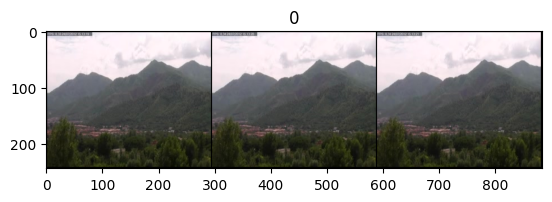

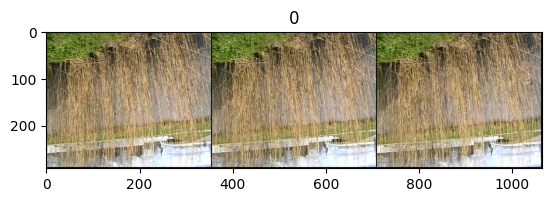

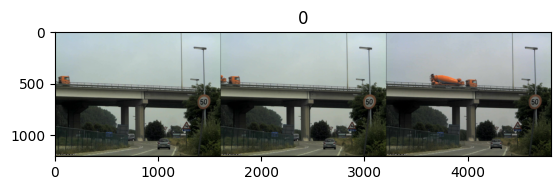

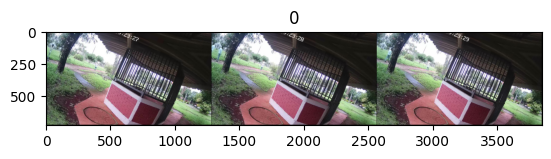

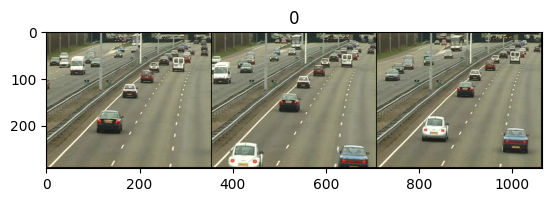

...

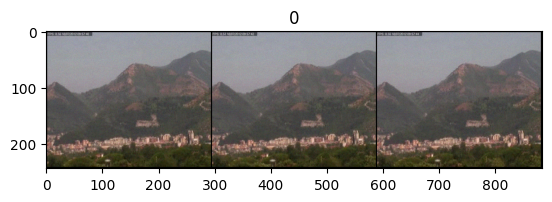

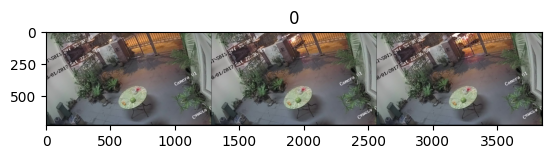

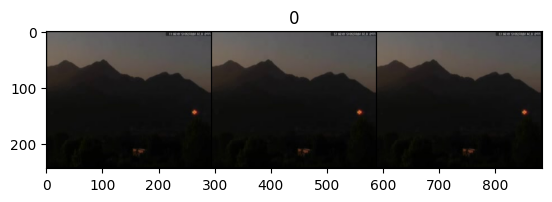

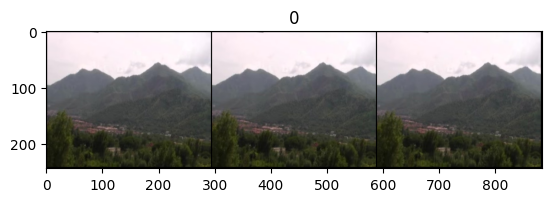

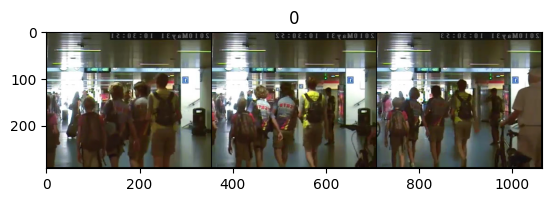

In [62]:
def demo_visualization():
    from torchvision.utils import make_grid
    import matplotlib.pyplot as plt

    # Augmentation
    # OneOf prende in ingresso una lista di augmentation ed applica con una
    # certa probabilità solo una augmentation di questa lista (presa casualmente)
    augmentation = albumentations.OneOf([
        albumentations.HorizontalFlip(p=0.2),
        albumentations.Rotate(p=1., limit=30),
        albumentations.VerticalFlip(p=0.2),
        albumentations.GaussNoise(p=0.2),
        ], p=.5)

    # Dataset with augmentation for visualization
    dataset = VideoFrameDataset(root_path="FRAMES/TRAINING_SET/",
                                num_segments=1,
                                frames_per_segment=3,
                                transform=augmentation,
                                )
    counter = 0
    for X, y in dataset:
        if counter > 10:
            break
        plt.figure()
        plt.imshow(make_grid(X).numpy().transpose((1, 2, 0)))
        plt.title(y)
        plt.show()
        counter += 1



demo_visualization()

# Questa demo è utile per testare l'augumentation prima di far iniziare il
# training per un certo numero di ore

# Training

In [63]:
from torch.utils.tensorboard import SummaryWriter
from tensorboard import notebook

def start_tensorboard(log_dir):
  writer = SummaryWriter(os.path.join("runs", log_dir))

  # run tensorboard in background
  ! killall tensorboard
  %load_ext tensorboard
  %tensorboard --logdir ./runs

  notebook.list() # View open TensorBoard instances

  return writer

In [64]:
from torchvision.utils import make_grid
from tqdm import tqdm

def one_epoch(model, lossFunction, output_activation, optimizer, train_loader, val_loader, writer, epoch_num):
  model = model.to(device)

  model.train()

  i_start = epoch_num * len(train_loader)
  for i, (X, y) in tqdm(enumerate(train_loader), desc="epoch {} - train".format(epoch_num)):

    # remove the second dimension (num_segments)
    #X = X.squeeze(1)

    # Merge the first dimension (batch_size) and the second dimension (num_segments)
    X = X.reshape(-1, *X.shape[2:])

    X = X.to(device)
    y = y.to(device).float()

    optimizer.zero_grad()

    o = model(X)
    o = output_activation(o).squeeze()

    print("Output", o.shape)
    print("Label", y.shape)

    # make shape of o and y the same
    if o.shape != y.shape:
      o = o.reshape(y.shape)

    l = lossFunction(o, y)

    l.backward()
    optimizer.step()

    acc = ((o.detach() > .5) == y.detach()).float().mean()

    # print("- batch loss and accuracy : {:.7f}\t{:.4f}".format(l.detach().item(), acc))
    writer.add_scalar('train/loss', l.detach().item(), i_start+i)
    writer.add_scalar('train/acc', acc, i_start+i)

  model.eval()
  with torch.no_grad():
    val_loss = []
    val_corr_pred = []
    for X, y in tqdm(val_loader, desc="epoch {} - validation".format(epoch_num)):
      # Merge the first dimension (batch_size) and the second dimension (num_segments)
      X = X.reshape(-1, *X.shape[2:])

      X = X.to(device)
      y = y.to(device).float()

      o = model(X)
      o = output_activation(o).squeeze()
      val_loss.append(lossFunction(o, y))
      val_corr_pred.append((o > .5) == y)

    val_loss = torch.stack(val_loss).mean().item()
    val_accuracy = torch.concatenate(val_corr_pred).float().mean().item()

    # print("Validation loss and accuracy : {:.7f}\t{:.4f}".format(val_loss, val_accuracy))
    writer.add_scalar('val/loss', val_loss, i_start+i)
    writer.add_scalar('val/acc', val_accuracy, i_start+i)
  return val_loss, val_accuracy

In [65]:
from torch.nn import BCELoss, CrossEntropyLoss, Sigmoid, Softmax

# learning parameters
lossFunction, output_activation = BCELoss(), Sigmoid()
batch_size = 2
lr = .001
momentum = .9
lambda_reg = 0

epochs = 200
early_stopping_patience = 5

optimizer = torch.optim.Adam(model.model.fc.parameters(),
                          lr=lr,
                          weight_decay=lambda_reg)

# create output directory and logger
experiment_name = "resnet18"

In [66]:
import os
!rm -r resnet18
os.makedirs(experiment_name)
writer = start_tensorboard(experiment_name)

No matching processes belonging to you were found
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


ERROR: Failed to launch TensorBoard (exited with 1).
Contents of stderr:
TensorFlow installation not found - running with reduced feature set.

NOTE: Using experimental fast data loading logic. To disable, pass
    "--load_fast=false" and report issues on GitHub. More details:
    https://github.com/tensorflow/tensorboard/issues/4784

Can't assign requested address

No known TensorBoard instances running.


In [67]:
from torch.utils.data import DataLoader
dataloader_params = {"batch_size": batch_size, "num_workers": 0, "pin_memory": True}
train_loader = DataLoader(train_dataset, shuffle=True, **dataloader_params)
val_loader = DataLoader(val_dataset, shuffle=False, **dataloader_params)

# early stopping and best model saving
early_stopping_counter = early_stopping_patience
min_val_loss = 1e10

# training and validation
val_losses = torch.zeros(epochs)
val_accuracies = torch.zeros(epochs)
for e in range(epochs):
  print("EPOCH {}".format(e))
  val_loss, val_accuracy = one_epoch(model, lossFunction, output_activation, optimizer, train_loader, val_loader, writer, e)

  # store the validation metrics
  val_losses[e] = val_loss
  val_accuracies[e] = val_accuracy
  torch.save(val_losses, os.path.join(experiment_name,'val_losses.pth'))
  torch.save(val_accuracies, os.path.join(experiment_name,'val_accuracies.pth'))

  # save the best model and check the early stopping criteria
  if val_loss < min_val_loss: # save the best model
    min_val_loss = val_loss
    early_stopping_counter = early_stopping_patience # reset early stopping counter
    torch.save(model.state_dict(), os.path.join(experiment_name,'best_model.pth'))
    print("- saved best model: val_loss =", val_loss, "val_accuracy =", val_accuracy)

  if e>0: # early stopping counter update
    if val_losses[e] > val_losses[e-1]:
        early_stopping_counter -= 1 # update early stopping counter
    else:
        early_stopping_counter = early_stopping_patience # reset early stopping counter
  if early_stopping_counter == 0: # early stopping
      break

EPOCH 0


epoch 0 - train: 1it [00:00,  1.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 2it [00:00,  2.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 4it [00:01,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 6it [00:01,  5.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 8it [00:01,  6.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 10it [00:02,  6.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 12it [00:02,  6.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 13it [00:02,  6.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 15it [00:02,  5.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 17it [00:03,  5.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 19it [00:03,  6.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 21it [00:04,  5.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 23it [00:04,  6.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 24it [00:04,  7.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 26it [00:04,  6.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 28it [00:04,  7.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 30it [00:05,  7.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 32it [00:05,  8.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 33it [00:05,  7.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 34it [00:05,  5.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 35it [00:06,  4.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 37it [00:06,  5.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 38it [00:06,  5.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 39it [00:06,  5.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 41it [00:07,  5.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 42it [00:07,  4.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 43it [00:07,  4.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 45it [00:08,  4.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 47it [00:08,  5.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 48it [00:08,  5.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 49it [00:09,  4.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 50it [00:09,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 51it [00:09,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 52it [00:10,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 53it [00:10,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 55it [00:11,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 56it [00:11,  2.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 58it [00:12,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 59it [00:12,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 61it [00:13,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 63it [00:13,  4.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 64it [00:13,  4.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 66it [00:14,  4.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 68it [00:14,  5.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 70it [00:14,  5.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 71it [00:15,  5.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 72it [00:15,  4.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 73it [00:15,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 74it [00:15,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 75it [00:16,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 76it [00:16,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 78it [00:16,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 79it [00:17,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 80it [00:17,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 81it [00:17,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 83it [00:18,  4.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 85it [00:18,  4.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 86it [00:18,  4.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 88it [00:19,  4.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 89it [00:19,  5.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 91it [00:19,  4.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 92it [00:19,  5.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 93it [00:20,  4.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 94it [00:20,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 95it [00:20,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 96it [00:21,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 97it [00:21,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 99it [00:21,  4.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 100it [00:21,  4.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 102it [00:22,  4.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 104it [00:22,  4.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 106it [00:23,  5.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 108it [00:23,  5.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 109it [00:23,  5.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 110it [00:23,  5.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 112it [00:24,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 114it [00:25,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 115it [00:25,  4.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 117it [00:25,  5.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 118it [00:25,  5.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 120it [00:27,  2.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 121it [00:27,  1.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 123it [00:28,  2.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 0 - train: 125it [00:29,  4.31it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 0 - validation: 100%|██████████| 15/15 [00:05<00:00,  2.96it/s]


- saved best model: val_loss = 0.5978001356124878 val_accuracy = 0.699999988079071
EPOCH 1


epoch 1 - train: 2it [00:00,  6.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 3it [00:00,  5.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 4it [00:00,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 6it [00:01,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 8it [00:01,  4.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 10it [00:02,  5.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 12it [00:02,  6.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 14it [00:02,  7.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 15it [00:02,  7.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 16it [00:03,  5.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 17it [00:03,  5.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 19it [00:03,  5.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 20it [00:03,  5.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 22it [00:04,  4.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 23it [00:04,  4.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 25it [00:04,  5.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 26it [00:05,  4.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 28it [00:05,  4.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 30it [00:05,  5.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 31it [00:06,  6.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 33it [00:06,  5.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 35it [00:06,  6.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 37it [00:07,  6.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 38it [00:07,  4.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 40it [00:07,  4.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 42it [00:08,  6.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 44it [00:08,  6.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 45it [00:08,  6.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 47it [00:08,  5.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 49it [00:09,  5.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 50it [00:09,  4.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 52it [00:09,  5.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 54it [00:10,  6.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 56it [00:10,  5.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 58it [00:11,  4.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 60it [00:11,  6.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 62it [00:11,  6.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 64it [00:11,  7.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 66it [00:12,  7.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 68it [00:12,  6.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 70it [00:12,  7.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 72it [00:12,  7.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 74it [00:13,  7.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 76it [00:13,  7.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 78it [00:13,  7.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 80it [00:13,  8.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 82it [00:14,  8.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 84it [00:14,  8.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 86it [00:14,  8.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 87it [00:14,  7.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 89it [00:15,  6.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 91it [00:15,  6.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 93it [00:15,  7.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 95it [00:15,  8.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 97it [00:16,  8.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 99it [00:16,  8.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 100it [00:16,  5.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 101it [00:17,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 103it [00:17,  5.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 105it [00:17,  6.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 107it [00:17,  7.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 109it [00:18,  7.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 110it [00:18,  5.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 112it [00:18,  5.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 114it [00:19,  6.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 116it [00:19,  6.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 118it [00:19,  7.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 120it [00:19,  7.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 122it [00:20,  7.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 124it [00:20,  7.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 1 - train: 125it [00:20,  6.11it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 1 - validation: 100%|██████████| 15/15 [00:01<00:00,  8.72it/s]


- saved best model: val_loss = 0.55156010389328 val_accuracy = 0.6666666865348816
EPOCH 2


epoch 2 - train: 1it [00:00,  5.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 3it [00:00,  5.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 5it [00:00,  5.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 7it [00:01,  6.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 9it [00:01,  6.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 11it [00:01,  7.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 13it [00:01,  8.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 15it [00:02,  7.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 17it [00:02,  6.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 19it [00:02,  7.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 21it [00:03,  6.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 23it [00:03,  7.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 25it [00:03,  7.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 27it [00:03,  7.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 29it [00:04,  7.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 31it [00:04,  7.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 33it [00:04,  7.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 35it [00:04,  6.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 37it [00:05,  7.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 39it [00:05,  8.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 41it [00:05,  7.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 43it [00:06,  5.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 45it [00:06,  5.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 46it [00:06,  6.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 47it [00:06,  5.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 48it [00:07,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 50it [00:07,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 52it [00:08,  4.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 54it [00:08,  5.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 56it [00:08,  6.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 58it [00:09,  6.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 60it [00:09,  8.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 63it [00:09,  8.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 65it [00:09,  8.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 67it [00:10,  8.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 68it [00:10,  9.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 69it [00:10,  6.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 70it [00:10,  4.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 72it [00:11,  4.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 73it [00:11,  4.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 75it [00:11,  4.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 77it [00:12,  5.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 79it [00:12,  4.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 81it [00:13,  5.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 83it [00:13,  5.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 85it [00:13,  5.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 86it [00:14,  5.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 87it [00:14,  4.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 88it [00:14,  4.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 90it [00:14,  4.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 91it [00:15,  4.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 93it [00:15,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 94it [00:16,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 95it [00:16,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 96it [00:16,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 98it [00:17,  4.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 99it [00:17,  4.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 101it [00:17,  4.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 103it [00:18,  4.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 104it [00:18,  5.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 106it [00:18,  5.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 108it [00:18,  6.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 110it [00:19,  6.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 112it [00:19,  7.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 114it [00:19,  6.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 116it [00:19,  6.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 118it [00:20,  6.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 119it [00:20,  6.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 120it [00:20,  5.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 121it [00:21,  4.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 122it [00:21,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 123it [00:21,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 124it [00:22,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 2 - train: 125it [00:22,  5.60it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 2 - validation: 100%|██████████| 15/15 [00:01<00:00,  8.09it/s]


EPOCH 3


epoch 3 - train: 1it [00:00,  5.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 3it [00:00,  4.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 4it [00:00,  4.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 5it [00:01,  4.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 7it [00:01,  4.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 8it [00:01,  5.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 9it [00:02,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 11it [00:02,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 13it [00:03,  4.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 15it [00:03,  5.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 17it [00:03,  5.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 18it [00:03,  5.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 19it [00:04,  5.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 20it [00:04,  4.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 21it [00:04,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 23it [00:05,  4.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 25it [00:05,  5.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 27it [00:05,  5.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 29it [00:06,  6.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 31it [00:06,  6.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 33it [00:06,  7.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 35it [00:06,  7.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 37it [00:07,  7.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 39it [00:07,  8.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 41it [00:07,  7.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 42it [00:08,  4.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 43it [00:08,  4.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 45it [00:08,  5.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 46it [00:08,  5.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 48it [00:09,  5.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 49it [00:09,  5.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 52it [00:09,  6.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 54it [00:10,  6.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 56it [00:10,  7.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 58it [00:10,  7.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 60it [00:10,  7.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 62it [00:11,  7.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 64it [00:11,  7.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 66it [00:11,  7.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 68it [00:11,  7.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 70it [00:12,  8.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 72it [00:12,  7.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 74it [00:12,  7.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 76it [00:12,  7.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 78it [00:13,  8.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 80it [00:13,  8.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 82it [00:13,  8.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 84it [00:13,  8.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 86it [00:14,  6.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 87it [00:14,  7.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 89it [00:14,  5.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 91it [00:15,  6.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 93it [00:15,  6.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 95it [00:15,  7.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 97it [00:15,  6.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 99it [00:16,  5.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 100it [00:16,  5.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 102it [00:16,  5.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 104it [00:17,  5.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 106it [00:17,  5.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 108it [00:17,  5.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 110it [00:18,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 112it [00:18,  5.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 114it [00:19,  5.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 115it [00:19,  6.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 117it [00:19,  5.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 119it [00:20,  5.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 121it [00:20,  6.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 123it [00:20,  6.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 3 - train: 125it [00:20,  5.98it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 3 - validation: 100%|██████████| 15/15 [00:01<00:00,  8.87it/s]


- saved best model: val_loss = 0.5363335013389587 val_accuracy = 0.7333333492279053
EPOCH 4


epoch 4 - train: 2it [00:00,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 3it [00:00,  4.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 6it [00:01,  4.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 8it [00:01,  5.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 10it [00:01,  6.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 12it [00:02,  6.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 14it [00:02,  7.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 16it [00:02,  6.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 18it [00:03,  6.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 20it [00:03,  6.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 21it [00:03,  6.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 23it [00:04,  4.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 25it [00:04,  5.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 27it [00:04,  5.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 29it [00:05,  6.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 31it [00:05,  6.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 33it [00:05,  6.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 35it [00:05,  7.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 36it [00:06,  7.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 38it [00:06,  6.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 39it [00:06,  6.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 41it [00:06,  5.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 42it [00:07,  5.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 44it [00:07,  5.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 46it [00:07,  5.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 48it [00:08,  5.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 49it [00:08,  4.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 51it [00:09,  4.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 53it [00:09,  5.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 54it [00:09,  5.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 56it [00:09,  5.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 57it [00:10,  5.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 58it [00:10,  5.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 60it [00:10,  4.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 62it [00:11,  5.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 64it [00:11,  6.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 65it [00:11,  6.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 67it [00:12,  5.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 68it [00:12,  5.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 69it [00:12,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 71it [00:13,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 73it [00:13,  4.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 75it [00:13,  5.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 77it [00:14,  5.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 78it [00:14,  5.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 79it [00:15,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 80it [00:15,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 82it [00:15,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 84it [00:16,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 85it [00:17,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 86it [00:17,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 88it [00:18,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 90it [00:18,  4.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 92it [00:18,  5.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 94it [00:18,  6.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 96it [00:19,  6.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 97it [00:19,  5.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 98it [00:19,  4.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 99it [00:19,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 100it [00:20,  4.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 102it [00:20,  4.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 104it [00:20,  5.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 105it [00:21,  5.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 107it [00:21,  5.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 109it [00:22,  4.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 110it [00:22,  5.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 113it [00:22,  5.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 115it [00:23,  5.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 117it [00:23,  5.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 119it [00:23,  5.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 120it [00:24,  4.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 122it [00:24,  4.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 123it [00:24,  4.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 4 - train: 125it [00:25,  4.96it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 4 - validation: 100%|██████████| 15/15 [00:02<00:00,  6.26it/s]


- saved best model: val_loss = 0.4990646243095398 val_accuracy = 0.7333333492279053
EPOCH 5


epoch 5 - train: 1it [00:00,  5.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 3it [00:00,  5.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 5it [00:00,  6.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 6it [00:01,  5.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 8it [00:01,  5.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 10it [00:01,  4.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 12it [00:02,  5.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 13it [00:03,  2.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 14it [00:03,  2.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 15it [00:04,  2.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 16it [00:04,  2.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 17it [00:05,  2.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 18it [00:05,  2.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 20it [00:06,  2.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 21it [00:06,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 22it [00:06,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 23it [00:07,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 24it [00:07,  2.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 25it [00:08,  1.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 26it [00:09,  1.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 27it [00:11,  1.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 29it [00:13,  1.09s/it]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 30it [00:14,  1.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 31it [00:14,  1.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 33it [00:15,  1.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 35it [00:15,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 37it [00:16,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 39it [00:16,  4.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 41it [00:16,  4.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 42it [00:17,  4.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 43it [00:17,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 44it [00:17,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 46it [00:18,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 48it [00:18,  4.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 50it [00:19,  5.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 52it [00:19,  5.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 53it [00:19,  5.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 55it [00:19,  5.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 56it [00:20,  4.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 58it [00:20,  5.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 60it [00:20,  5.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 62it [00:21,  5.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 64it [00:21,  6.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 65it [00:21,  6.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 66it [00:21,  5.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 67it [00:22,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 69it [00:22,  4.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 70it [00:23,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 71it [00:23,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 72it [00:23,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 73it [00:23,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 74it [00:24,  2.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 75it [00:25,  2.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 76it [00:25,  2.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 77it [00:25,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 78it [00:26,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 80it [00:26,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 82it [00:26,  4.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 84it [00:27,  5.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 85it [00:27,  5.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 86it [00:27,  4.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 87it [00:27,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 88it [00:28,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 89it [00:28,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 90it [00:29,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 91it [00:29,  2.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 92it [00:29,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 93it [00:30,  2.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 94it [00:30,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 96it [00:31,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 97it [00:31,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 99it [00:31,  4.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 100it [00:31,  4.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 103it [00:32,  5.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 104it [00:32,  4.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 105it [00:33,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 106it [00:33,  4.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 108it [00:33,  4.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 110it [00:34,  4.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 112it [00:34,  5.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 114it [00:34,  5.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 116it [00:35,  5.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 118it [00:35,  6.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 120it [00:35,  6.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 121it [00:35,  6.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 123it [00:36,  5.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 5 - train: 125it [00:36,  3.42it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 5 - validation: 100%|██████████| 15/15 [00:02<00:00,  7.16it/s]


EPOCH 6


epoch 6 - train: 1it [00:00,  6.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 2it [00:00,  5.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 4it [00:00,  5.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 6it [00:00,  6.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 8it [00:01,  6.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 10it [00:01,  6.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 12it [00:01,  6.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 13it [00:02,  6.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 15it [00:02,  5.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 17it [00:02,  5.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 18it [00:03,  5.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 20it [00:03,  5.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 22it [00:03,  4.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 24it [00:04,  5.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 26it [00:04,  6.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 28it [00:04,  5.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 30it [00:05,  6.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 32it [00:05,  7.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 34it [00:05,  5.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 36it [00:06,  5.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 38it [00:06,  6.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 40it [00:06,  7.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 42it [00:07,  7.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 44it [00:07,  7.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 46it [00:07,  7.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 48it [00:07,  6.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 50it [00:08,  7.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 52it [00:08,  7.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 54it [00:08,  7.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 56it [00:08,  8.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 58it [00:09,  7.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 60it [00:09,  7.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 62it [00:09,  7.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 64it [00:09,  7.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 66it [00:10,  8.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 68it [00:10,  8.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 70it [00:10,  8.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 72it [00:10,  8.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 74it [00:11,  6.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 76it [00:11,  6.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 78it [00:11,  7.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 80it [00:12,  7.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 82it [00:12,  7.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 84it [00:12,  7.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 86it [00:12,  7.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 88it [00:13,  7.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 90it [00:13,  7.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 92it [00:13,  8.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 94it [00:13,  8.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 96it [00:14,  8.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 98it [00:14,  7.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 100it [00:14,  6.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 102it [00:15,  6.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 104it [00:15,  6.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 106it [00:15,  6.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 108it [00:16,  6.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 110it [00:16,  6.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 112it [00:16,  6.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 114it [00:17,  6.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 116it [00:17,  7.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 118it [00:17,  7.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 120it [00:17,  7.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 122it [00:18,  6.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 124it [00:18,  6.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 6 - train: 125it [00:18,  6.75it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 6 - validation: 100%|██████████| 15/15 [00:02<00:00,  5.66it/s]


- saved best model: val_loss = 0.49446824193000793 val_accuracy = 0.7333333492279053
EPOCH 7


epoch 7 - train: 1it [00:00,  6.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 2it [00:00,  6.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 3it [00:00,  5.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 5it [00:00,  5.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 7it [00:01,  6.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 9it [00:01,  6.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 10it [00:01,  5.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 11it [00:02,  4.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 13it [00:02,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 15it [00:03,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 16it [00:03,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 18it [00:04,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 19it [00:04,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 20it [00:04,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 22it [00:04,  5.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 24it [00:05,  5.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 26it [00:05,  4.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 28it [00:06,  5.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 30it [00:06,  6.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 32it [00:06,  7.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 34it [00:06,  7.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 36it [00:07,  6.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 38it [00:07,  7.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 39it [00:07,  5.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 40it [00:08,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 43it [00:08,  5.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 45it [00:08,  7.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 47it [00:08,  7.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 49it [00:09,  8.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 51it [00:09,  8.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 53it [00:09,  8.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 55it [00:09,  8.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 57it [00:10,  8.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 59it [00:10,  7.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 61it [00:10,  6.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 63it [00:11,  6.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 65it [00:11,  7.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 67it [00:11,  7.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 69it [00:11,  7.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 71it [00:12,  7.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 73it [00:12,  6.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 75it [00:12,  7.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 77it [00:12,  7.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 78it [00:13,  6.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 80it [00:13,  5.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 82it [00:14,  5.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 84it [00:14,  6.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 86it [00:14,  6.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 88it [00:14,  7.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 90it [00:15,  7.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 92it [00:15,  7.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 94it [00:15,  7.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 96it [00:15,  7.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 98it [00:16,  6.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 100it [00:16,  7.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 101it [00:16,  6.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 102it [00:16,  5.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 104it [00:17,  4.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 106it [00:17,  5.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 108it [00:18,  5.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 110it [00:18,  5.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 112it [00:18,  5.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 114it [00:19,  5.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 116it [00:19,  5.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 118it [00:19,  6.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 120it [00:20,  6.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 122it [00:20,  6.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 124it [00:20,  6.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 7 - train: 125it [00:20,  6.00it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 7 - validation: 100%|██████████| 15/15 [00:01<00:00,  7.70it/s]


EPOCH 8


epoch 8 - train: 1it [00:00,  6.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 2it [00:00,  6.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 3it [00:00,  6.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 4it [00:00,  6.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 5it [00:00,  6.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 6it [00:00,  6.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 7it [00:01,  6.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 8it [00:01,  6.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 9it [00:01,  6.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 10it [00:01,  6.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 11it [00:01,  6.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 12it [00:01,  5.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 14it [00:02,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 16it [00:02,  4.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 17it [00:03,  5.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 19it [00:03,  5.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 21it [00:03,  5.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 23it [00:04,  5.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 25it [00:04,  5.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 27it [00:04,  6.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 29it [00:05,  7.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 31it [00:05,  7.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 33it [00:05,  6.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 35it [00:05,  6.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 37it [00:06,  5.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 39it [00:06,  5.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 41it [00:07,  6.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 43it [00:07,  7.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 45it [00:07,  6.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 47it [00:07,  6.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 49it [00:08,  7.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 51it [00:08,  8.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 53it [00:08,  8.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 55it [00:09,  6.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 56it [00:09,  5.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 57it [00:09,  5.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 60it [00:10,  4.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 61it [00:10,  5.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 63it [00:10,  4.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 64it [00:10,  5.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 66it [00:11,  5.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 67it [00:11,  5.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 69it [00:11,  5.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 71it [00:12,  5.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 72it [00:12,  5.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 74it [00:12,  5.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 76it [00:13,  5.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 78it [00:13,  5.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 79it [00:13,  5.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 80it [00:13,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 81it [00:14,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 82it [00:14,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 84it [00:14,  4.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 86it [00:15,  5.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 88it [00:15,  6.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 90it [00:15,  7.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 92it [00:15,  7.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 94it [00:16,  6.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 96it [00:16,  6.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 97it [00:16,  5.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 99it [00:17,  4.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 101it [00:17,  5.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 103it [00:18,  5.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 105it [00:18,  6.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 107it [00:18,  6.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 109it [00:18,  7.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 111it [00:19,  6.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 113it [00:19,  6.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 115it [00:19,  7.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 116it [00:19,  7.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 118it [00:20,  4.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 120it [00:20,  4.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 122it [00:21,  4.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 123it [00:21,  4.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 8 - train: 125it [00:21,  5.70it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 8 - validation: 100%|██████████| 15/15 [00:02<00:00,  6.57it/s]


- saved best model: val_loss = 0.4699248969554901 val_accuracy = 0.800000011920929
EPOCH 9


epoch 9 - train: 2it [00:00,  4.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 4it [00:00,  6.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 6it [00:00,  6.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 7it [00:01,  5.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 9it [00:01,  5.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 11it [00:02,  4.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 13it [00:02,  5.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 15it [00:02,  5.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 17it [00:03,  5.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 19it [00:03,  6.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 20it [00:03,  6.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 22it [00:04,  6.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 23it [00:04,  6.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 25it [00:04,  4.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 27it [00:05,  5.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 29it [00:05,  5.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 30it [00:05,  6.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 31it [00:05,  5.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 32it [00:06,  4.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 34it [00:06,  5.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 36it [00:06,  5.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 38it [00:07,  5.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 40it [00:07,  6.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 42it [00:07,  7.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 44it [00:07,  7.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 45it [00:08,  5.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 47it [00:08,  4.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 49it [00:08,  5.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 50it [00:09,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 52it [00:09,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 54it [00:10,  4.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 56it [00:10,  6.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 58it [00:10,  7.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 60it [00:10,  7.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 62it [00:11,  7.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 64it [00:11,  6.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 65it [00:11,  6.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 67it [00:12,  5.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 69it [00:12,  5.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 71it [00:12,  5.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 73it [00:13,  5.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 74it [00:13,  5.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 76it [00:13,  5.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 78it [00:14,  6.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 80it [00:14,  6.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 82it [00:14,  6.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 84it [00:15,  6.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 86it [00:15,  6.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 88it [00:15,  7.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 90it [00:15,  6.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 91it [00:15,  6.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 92it [00:16,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 93it [00:16,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 95it [00:17,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 97it [00:17,  5.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 98it [00:17,  4.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 99it [00:18,  2.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 100it [00:19,  2.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 101it [00:19,  2.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 102it [00:20,  2.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 103it [00:20,  2.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 104it [00:20,  2.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 105it [00:21,  2.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 106it [00:21,  2.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 107it [00:22,  2.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 108it [00:22,  2.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 109it [00:23,  2.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 110it [00:23,  2.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 111it [00:24,  2.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 112it [00:24,  2.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 113it [00:24,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 115it [00:25,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 117it [00:25,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 119it [00:25,  4.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 121it [00:26,  5.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 123it [00:26,  5.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 9 - train: 125it [00:26,  4.65it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 9 - validation: 100%|██████████| 15/15 [00:02<00:00,  6.72it/s]


EPOCH 10


epoch 10 - train: 1it [00:00,  6.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 2it [00:00,  6.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 4it [00:00,  5.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 6it [00:01,  5.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 8it [00:01,  6.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 10it [00:01,  6.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 12it [00:02,  5.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 14it [00:02,  5.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 16it [00:02,  5.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 17it [00:02,  5.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 19it [00:03,  4.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 21it [00:03,  5.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 22it [00:03,  5.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 24it [00:04,  5.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 26it [00:04,  5.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 27it [00:04,  5.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 28it [00:06,  2.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 29it [00:06,  1.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 30it [00:07,  1.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 31it [00:08,  1.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 32it [00:09,  1.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 33it [00:10,  1.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 34it [00:10,  1.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 35it [00:10,  1.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 37it [00:11,  2.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 38it [00:11,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 40it [00:11,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 41it [00:12,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 42it [00:12,  4.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 44it [00:13,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 46it [00:13,  4.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 47it [00:13,  5.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 49it [00:13,  4.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 51it [00:14,  5.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 53it [00:14,  6.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 55it [00:14,  6.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 56it [00:14,  6.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 58it [00:15,  6.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 60it [00:15,  6.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 61it [00:15,  6.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 63it [00:16,  5.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 65it [00:16,  5.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 67it [00:16,  6.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 69it [00:17,  6.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 71it [00:17,  6.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 73it [00:17,  6.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 75it [00:18,  6.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 77it [00:18,  5.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 79it [00:18,  5.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 80it [00:19,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 81it [00:19,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 83it [00:19,  4.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 85it [00:20,  5.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 87it [00:20,  5.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 89it [00:20,  5.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 91it [00:21,  5.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 93it [00:21,  5.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 95it [00:22,  5.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 97it [00:22,  5.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 99it [00:22,  4.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 101it [00:23,  5.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 103it [00:23,  6.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 106it [00:25,  2.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 108it [00:26,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 110it [00:26,  4.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 112it [00:26,  5.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 113it [00:26,  5.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 114it [00:27,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 115it [00:27,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 116it [00:28,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 117it [00:28,  2.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 118it [00:29,  2.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 119it [00:30,  1.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 120it [00:30,  1.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 122it [00:31,  2.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 124it [00:31,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 10 - train: 125it [00:31,  3.95it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 10 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.10it/s]


- saved best model: val_loss = 0.4640952944755554 val_accuracy = 0.800000011920929
EPOCH 11


epoch 11 - train: 1it [00:00,  6.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 2it [00:00,  7.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 3it [00:00,  6.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 5it [00:01,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 7it [00:01,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 9it [00:02,  4.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 11it [00:02,  5.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 13it [00:02,  5.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 15it [00:03,  5.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 16it [00:03,  5.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 18it [00:03,  5.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 19it [00:03,  5.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 21it [00:04,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 23it [00:04,  5.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 24it [00:05,  4.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 26it [00:05,  4.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 28it [00:05,  5.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 30it [00:06,  5.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 31it [00:06,  5.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 32it [00:06,  4.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 33it [00:07,  4.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 35it [00:07,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 36it [00:07,  4.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 39it [00:08,  4.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 40it [00:08,  4.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 42it [00:09,  4.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 44it [00:09,  5.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 46it [00:09,  5.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 48it [00:10,  5.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 50it [00:10,  6.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 52it [00:10,  6.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 53it [00:10,  6.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 55it [00:11,  5.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 57it [00:11,  5.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 59it [00:11,  6.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 61it [00:12,  6.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 63it [00:12,  7.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 65it [00:12,  7.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 67it [00:13,  7.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 69it [00:13,  7.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 70it [00:13,  6.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 72it [00:13,  5.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 74it [00:14,  6.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 76it [00:14,  6.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 78it [00:14,  6.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 80it [00:15,  7.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 82it [00:15,  7.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 84it [00:15,  6.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 86it [00:15,  6.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 87it [00:16,  7.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 89it [00:16,  5.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 91it [00:16,  6.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 92it [00:16,  5.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 93it [00:17,  5.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 95it [00:17,  5.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 97it [00:17,  5.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 99it [00:18,  5.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 101it [00:18,  5.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 103it [00:19,  4.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 105it [00:19,  5.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 107it [00:19,  6.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 109it [00:19,  7.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 111it [00:20,  7.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 113it [00:20,  7.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 115it [00:20,  7.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 117it [00:21,  7.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 118it [00:21,  7.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 120it [00:21,  5.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 122it [00:21,  6.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 11 - train: 125it [00:22,  5.62it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 11 - validation: 100%|██████████| 15/15 [00:01<00:00,  8.51it/s]


- saved best model: val_loss = 0.4310063421726227 val_accuracy = 0.7666666507720947
EPOCH 12


epoch 12 - train: 1it [00:00,  5.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 2it [00:00,  5.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 3it [00:00,  5.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 4it [00:00,  4.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 6it [00:01,  4.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 7it [00:01,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 8it [00:01,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 9it [00:02,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 10it [00:02,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 11it [00:03,  1.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 12it [00:03,  2.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 13it [00:04,  2.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 14it [00:04,  2.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 15it [00:04,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 16it [00:05,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 17it [00:05,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 18it [00:05,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 19it [00:06,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 20it [00:06,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 21it [00:06,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 22it [00:06,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 23it [00:07,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 24it [00:07,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 25it [00:07,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 27it [00:08,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 29it [00:08,  4.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 31it [00:08,  5.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 33it [00:09,  6.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 35it [00:09,  6.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 37it [00:09,  7.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 39it [00:10,  7.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 40it [00:10,  5.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 43it [00:10,  6.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 45it [00:10,  7.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 47it [00:11,  7.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 49it [00:11,  7.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 51it [00:11,  7.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 53it [00:12,  7.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 55it [00:12,  7.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 57it [00:12,  6.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 59it [00:13,  6.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 61it [00:13,  6.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 62it [00:13,  6.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 64it [00:13,  5.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 66it [00:14,  6.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 68it [00:14,  6.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 70it [00:14,  6.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 72it [00:15,  5.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 74it [00:15,  6.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 76it [00:15,  6.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 77it [00:16,  5.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 78it [00:16,  5.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 80it [00:16,  5.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 81it [00:16,  5.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 83it [00:17,  5.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 84it [00:17,  4.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 86it [00:18,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 88it [00:18,  4.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 90it [00:18,  5.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 92it [00:18,  6.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 94it [00:19,  6.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 96it [00:19,  6.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 98it [00:19,  6.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 100it [00:20,  6.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 101it [00:20,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 102it [00:21,  2.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 103it [00:21,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 104it [00:22,  2.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 105it [00:22,  2.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 106it [00:23,  2.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 107it [00:24,  1.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 108it [00:24,  1.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 110it [00:25,  2.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 112it [00:25,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 114it [00:25,  4.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 116it [00:25,  5.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 117it [00:26,  4.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 118it [00:26,  4.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 120it [00:26,  4.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 121it [00:27,  5.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 122it [00:27,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 123it [00:27,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 12 - train: 125it [00:28,  4.41it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 12 - validation: 100%|██████████| 15/15 [00:02<00:00,  6.26it/s]


EPOCH 13


epoch 13 - train: 1it [00:00,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 2it [00:00,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 3it [00:00,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 4it [00:01,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 5it [00:01,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 7it [00:02,  2.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 8it [00:02,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 10it [00:03,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 12it [00:03,  4.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 13it [00:03,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 14it [00:04,  4.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 15it [00:04,  4.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 16it [00:04,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 17it [00:05,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 18it [00:06,  1.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 19it [00:06,  2.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 20it [00:06,  2.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 21it [00:07,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 22it [00:07,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 23it [00:07,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 24it [00:07,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 26it [00:08,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 28it [00:08,  4.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 30it [00:09,  4.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 32it [00:09,  6.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 34it [00:09,  7.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 36it [00:09,  7.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 39it [00:10,  8.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 41it [00:10,  9.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 43it [00:10,  6.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 45it [00:11,  7.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 47it [00:11,  8.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 49it [00:11,  8.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 51it [00:11,  8.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 54it [00:12,  9.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 57it [00:12, 10.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 59it [00:12, 10.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 63it [00:13,  8.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 65it [00:13,  9.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 69it [00:13,  9.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 71it [00:13,  8.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 74it [00:14, 10.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 76it [00:14, 10.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 78it [00:14,  9.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 81it [00:14,  9.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 83it [00:15,  5.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 85it [00:15,  6.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 88it [00:16,  7.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 89it [00:16,  7.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 92it [00:16,  7.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 94it [00:16,  8.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 95it [00:17,  8.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 96it [00:17,  6.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 98it [00:17,  6.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 101it [00:17,  8.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 103it [00:18,  7.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 105it [00:18,  7.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 107it [00:18,  8.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 109it [00:19,  7.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 111it [00:19,  6.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 112it [00:19,  6.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 114it [00:19,  5.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 116it [00:20,  6.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 118it [00:20,  7.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 120it [00:20,  8.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 122it [00:20,  7.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 13 - train: 125it [00:21,  5.92it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 13 - validation: 100%|██████████| 15/15 [00:01<00:00, 11.64it/s]


EPOCH 14


epoch 14 - train: 1it [00:00,  8.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 3it [00:00, 10.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 6it [00:00,  7.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 8it [00:01,  7.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 10it [00:01,  7.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 11it [00:01,  7.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 14it [00:01,  7.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 16it [00:02,  7.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 18it [00:02,  6.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 20it [00:02,  7.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 21it [00:02,  7.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 23it [00:03,  5.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 25it [00:03,  6.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 27it [00:03,  7.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 29it [00:03,  8.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 32it [00:04,  8.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 34it [00:04,  9.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 36it [00:04,  8.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 37it [00:04,  8.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 39it [00:05,  6.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 41it [00:05,  7.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 43it [00:05,  8.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 45it [00:06,  7.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 47it [00:06,  7.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 49it [00:06,  7.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 51it [00:06,  8.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 52it [00:06,  8.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 54it [00:07,  5.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 56it [00:07,  6.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 58it [00:07,  6.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 60it [00:08,  6.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 62it [00:08,  6.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 63it [00:08,  4.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 64it [00:09,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 65it [00:10,  2.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 67it [00:10,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 69it [00:11,  4.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 71it [00:11,  5.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 72it [00:11,  5.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 75it [00:11,  7.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 77it [00:11,  7.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 80it [00:12,  6.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 82it [00:12,  7.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 84it [00:12,  8.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 86it [00:13,  8.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 89it [00:13,  9.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 91it [00:13,  8.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 93it [00:13,  8.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 95it [00:14,  6.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 97it [00:14,  7.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 99it [00:14,  7.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 101it [00:15,  7.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 103it [00:15,  7.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 105it [00:15,  8.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 109it [00:15,  9.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 111it [00:16,  6.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 113it [00:16,  7.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 115it [00:16,  7.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 117it [00:17,  6.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 119it [00:17,  6.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 121it [00:17,  6.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 123it [00:18,  6.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 14 - train: 125it [00:18,  6.70it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 14 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.07it/s]


EPOCH 15


epoch 15 - train: 1it [00:00,  8.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 2it [00:00,  8.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 3it [00:00,  7.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 4it [00:00,  7.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 5it [00:00,  8.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 6it [00:00,  7.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 8it [00:01,  4.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 10it [00:01,  5.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 12it [00:01,  6.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 14it [00:02,  6.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 16it [00:02,  7.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 19it [00:02,  8.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 22it [00:03,  8.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 24it [00:03,  5.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 26it [00:04,  6.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 28it [00:04,  7.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 30it [00:04,  7.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 32it [00:04,  7.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 34it [00:05,  7.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 36it [00:05,  6.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 38it [00:05,  5.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 39it [00:05,  5.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 42it [00:06,  7.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 44it [00:06,  8.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 46it [00:06,  8.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 48it [00:07,  8.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 50it [00:07,  7.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 51it [00:07,  8.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 53it [00:07,  6.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 55it [00:08,  7.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 57it [00:08,  7.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 59it [00:08,  7.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 60it [00:08,  7.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 64it [00:09,  8.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 66it [00:09,  8.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 67it [00:09,  8.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 69it [00:09,  6.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 71it [00:10,  7.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 73it [00:10,  8.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 75it [00:10,  8.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 77it [00:10,  8.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 79it [00:10,  8.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 80it [00:11,  8.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 83it [00:11,  7.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 85it [00:11,  8.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 88it [00:12,  9.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 91it [00:12,  9.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 94it [00:12, 10.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 97it [00:13,  7.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 98it [00:13,  6.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 99it [00:13,  4.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 101it [00:14,  4.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 103it [00:14,  5.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 105it [00:14,  5.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 107it [00:15,  6.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 109it [00:15,  5.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 111it [00:15,  6.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 113it [00:16,  7.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 115it [00:16,  7.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 117it [00:16,  7.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 119it [00:16,  8.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 120it [00:17,  8.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 122it [00:17,  5.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 15 - train: 125it [00:17,  7.01it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 15 - validation: 100%|██████████| 15/15 [00:01<00:00,  7.87it/s]


EPOCH 16


epoch 16 - train: 1it [00:00,  5.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 2it [00:00,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 3it [00:00,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 4it [00:01,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 5it [00:01,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 7it [00:01,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 8it [00:01,  4.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 9it [00:02,  4.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 10it [00:02,  4.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 11it [00:02,  4.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 13it [00:03,  4.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 14it [00:03,  4.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 15it [00:03,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 17it [00:04,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 19it [00:04,  5.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 21it [00:04,  6.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 23it [00:04,  7.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 25it [00:04,  8.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 28it [00:05,  6.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 30it [00:05,  6.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 32it [00:06,  6.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 33it [00:06,  7.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 37it [00:06,  9.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 39it [00:06,  8.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 41it [00:07,  8.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 43it [00:07,  7.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 45it [00:07,  5.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 47it [00:08,  5.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 50it [00:08,  7.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 52it [00:08,  7.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 54it [00:09,  6.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 55it [00:09,  6.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 58it [00:09,  7.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 61it [00:10,  9.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 63it [00:10,  6.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 65it [00:10,  5.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 67it [00:11,  6.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 69it [00:11,  7.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 71it [00:11,  7.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 73it [00:12,  6.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 75it [00:12,  4.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 77it [00:12,  6.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 79it [00:13,  6.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 80it [00:13,  7.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 82it [00:13,  6.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 84it [00:13,  6.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 85it [00:14,  6.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 87it [00:14,  5.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 88it [00:14,  4.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 90it [00:15,  5.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 92it [00:15,  6.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 93it [00:15,  6.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 94it [00:15,  5.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 96it [00:16,  4.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 98it [00:16,  5.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 99it [00:16,  6.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 100it [00:16,  5.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 102it [00:17,  5.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 104it [00:17,  5.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 105it [00:18,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 107it [00:18,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 109it [00:18,  5.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 111it [00:19,  6.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 113it [00:19,  7.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 114it [00:19,  7.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 116it [00:19,  6.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 118it [00:20,  7.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 120it [00:20,  8.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 122it [00:20,  8.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 16 - train: 125it [00:20,  5.99it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 16 - validation: 100%|██████████| 15/15 [00:01<00:00, 11.88it/s]


EPOCH 17


epoch 17 - train: 1it [00:00,  6.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 2it [00:00,  7.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 4it [00:00,  5.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 6it [00:00,  7.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 7it [00:01,  6.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 9it [00:01,  5.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 11it [00:01,  5.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 13it [00:02,  5.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 16it [00:02,  7.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 18it [00:02,  7.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 20it [00:03,  8.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 22it [00:03,  8.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 24it [00:03,  8.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 26it [00:03,  6.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 28it [00:04,  8.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 30it [00:04,  7.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 33it [00:04,  8.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 34it [00:04,  9.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 37it [00:05,  8.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 39it [00:05,  6.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 41it [00:05,  6.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 43it [00:06,  7.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 45it [00:06,  8.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 47it [00:06,  8.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 50it [00:06,  9.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 52it [00:07,  6.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 54it [00:07,  7.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 56it [00:07,  8.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 58it [00:07,  8.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 61it [00:08,  9.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 64it [00:08,  9.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 66it [00:08,  9.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 68it [00:09,  7.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 72it [00:09,  9.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 74it [00:09, 10.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 78it [00:09, 10.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 80it [00:10, 10.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 84it [00:10, 10.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 86it [00:10,  8.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 90it [00:11,  9.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 92it [00:11, 10.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 96it [00:11, 10.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 98it [00:11, 10.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 100it [00:12, 10.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 102it [00:12,  9.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 104it [00:12,  7.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 106it [00:13,  7.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 108it [00:13,  8.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 110it [00:13,  7.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 111it [00:13,  7.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 113it [00:14,  5.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 114it [00:14,  6.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 116it [00:14,  5.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 118it [00:14,  6.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 120it [00:15,  6.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 121it [00:15,  7.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 123it [00:15,  6.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 124it [00:15,  6.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 17 - train: 125it [00:16,  7.71it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 17 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.07it/s]


EPOCH 18


epoch 18 - train: 1it [00:00,  7.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 2it [00:00,  6.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 3it [00:00,  6.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 4it [00:00,  6.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 5it [00:00,  6.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 6it [00:00,  6.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 7it [00:01,  6.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 9it [00:01,  5.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 11it [00:01,  5.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 13it [00:02,  6.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 15it [00:02,  7.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 17it [00:02,  5.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 19it [00:03,  6.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 21it [00:03,  5.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 23it [00:03,  6.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 25it [00:04,  6.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 27it [00:04,  8.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 29it [00:04,  7.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 31it [00:04,  8.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 32it [00:04,  8.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 34it [00:05,  6.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 36it [00:05,  7.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 38it [00:05,  8.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 40it [00:06,  8.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 44it [00:06,  9.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 45it [00:06,  9.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 47it [00:06,  6.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 49it [00:07,  8.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 51it [00:07,  8.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 53it [00:07,  9.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 56it [00:07,  9.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 58it [00:08,  8.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 60it [00:08,  7.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 64it [00:08,  8.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 67it [00:09,  9.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 70it [00:09,  9.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 72it [00:09,  9.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 75it [00:10,  9.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 76it [00:10,  9.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 78it [00:10,  7.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 81it [00:10,  8.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 83it [00:10,  9.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 85it [00:11,  9.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 87it [00:11,  9.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 90it [00:11,  9.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 94it [00:12,  8.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 97it [00:12,  9.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 99it [00:12,  9.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 103it [00:13,  9.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 105it [00:13,  9.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 107it [00:13, 10.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 110it [00:14,  7.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 112it [00:14,  7.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 115it [00:14,  8.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 117it [00:14,  8.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 119it [00:15,  8.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 122it [00:15,  9.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 18 - train: 125it [00:15,  7.87it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 18 - validation: 100%|██████████| 15/15 [00:01<00:00, 13.13it/s]


EPOCH 19


epoch 19 - train: 0it [00:00, ?it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 4it [00:00,  9.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 6it [00:00,  9.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 9it [00:00,  9.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 11it [00:01,  9.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 13it [00:01,  9.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 16it [00:01,  8.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 18it [00:02,  8.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 20it [00:02,  9.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 24it [00:02, 10.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 26it [00:02, 10.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 28it [00:02, 10.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 30it [00:03,  7.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 33it [00:03,  8.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 37it [00:03,  9.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 39it [00:04,  9.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 42it [00:04,  9.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 44it [00:04, 10.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 46it [00:05,  8.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 49it [00:05,  9.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 51it [00:05,  8.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 53it [00:05,  9.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 55it [00:06,  8.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 58it [00:06,  9.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 60it [00:06,  9.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 61it [00:06,  7.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 62it [00:07,  6.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 64it [00:07,  5.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 66it [00:07,  6.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 67it [00:07,  6.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 68it [00:08,  5.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 69it [00:08,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 70it [00:08,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 72it [00:09,  4.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 73it [00:09,  4.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 75it [00:09,  4.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 77it [00:09,  6.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 78it [00:10,  6.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 79it [00:10,  5.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 81it [00:10,  5.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 82it [00:11,  4.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 83it [00:11,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 85it [00:11,  4.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 87it [00:12,  5.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 88it [00:12,  6.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 90it [00:12,  4.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 93it [00:13,  6.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 95it [00:13,  5.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 96it [00:13,  6.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 99it [00:13,  7.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 100it [00:14,  7.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 102it [00:14,  4.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 104it [00:15,  5.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 106it [00:15,  5.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 107it [00:15,  4.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 108it [00:15,  4.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 110it [00:16,  4.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 112it [00:16,  5.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 114it [00:16,  6.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 116it [00:17,  6.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 118it [00:17,  6.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 120it [00:17,  8.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 122it [00:17,  8.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 123it [00:18,  8.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 19 - train: 125it [00:18,  6.77it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 19 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.70it/s]


EPOCH 20


epoch 20 - train: 1it [00:00,  8.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 2it [00:00,  8.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 3it [00:00,  6.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 5it [00:00,  5.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 7it [00:01,  5.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 9it [00:01,  6.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 10it [00:01,  6.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 11it [00:01,  5.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 12it [00:02,  4.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 14it [00:02,  5.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 16it [00:02,  5.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 18it [00:03,  6.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 19it [00:03,  6.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 21it [00:03,  4.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 23it [00:04,  6.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 25it [00:04,  7.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 27it [00:04,  7.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 29it [00:04,  7.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 31it [00:05,  7.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 33it [00:05,  7.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 35it [00:05,  8.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 38it [00:06,  7.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 40it [00:06,  7.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 42it [00:06,  7.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 44it [00:06,  8.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 46it [00:07,  7.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 49it [00:07,  9.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 50it [00:07,  8.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 52it [00:08,  6.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 54it [00:08,  6.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 56it [00:08,  6.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 58it [00:08,  7.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 60it [00:09,  7.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 62it [00:09,  5.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 64it [00:09,  6.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 66it [00:10,  7.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 68it [00:10,  7.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 70it [00:10,  7.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 72it [00:10,  8.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 73it [00:11,  6.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 75it [00:11,  5.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 76it [00:11,  5.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 77it [00:12,  4.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 78it [00:12,  4.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 79it [00:12,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 81it [00:13,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 83it [00:13,  4.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 84it [00:13,  4.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 85it [00:14,  4.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 86it [00:14,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 87it [00:14,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 88it [00:15,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 89it [00:15,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 90it [00:15,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 91it [00:16,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 92it [00:16,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 93it [00:16,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 94it [00:17,  2.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 96it [00:17,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 98it [00:18,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 100it [00:18,  4.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 102it [00:18,  5.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 104it [00:19,  6.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 105it [00:19,  5.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 107it [00:19,  5.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 109it [00:19,  5.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 111it [00:20,  6.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 113it [00:20,  6.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 114it [00:20,  6.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 115it [00:21,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 117it [00:21,  4.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 118it [00:21,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 121it [00:22,  4.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 122it [00:22,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 123it [00:23,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 20 - train: 125it [00:23,  5.33it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 20 - validation: 100%|██████████| 15/15 [00:02<00:00,  5.43it/s]


EPOCH 21


epoch 21 - train: 1it [00:00,  2.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 3it [00:00,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 4it [00:01,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 5it [00:01,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 6it [00:01,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 7it [00:01,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 8it [00:02,  4.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 9it [00:02,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 10it [00:02,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 11it [00:02,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 12it [00:03,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 13it [00:03,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 14it [00:03,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 15it [00:04,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 16it [00:04,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 17it [00:04,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 18it [00:04,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 20it [00:05,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 21it [00:05,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 22it [00:06,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 23it [00:06,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 24it [00:06,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 25it [00:06,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 27it [00:07,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 29it [00:07,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 31it [00:08,  5.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 32it [00:08,  4.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 34it [00:08,  5.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 36it [00:09,  5.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 38it [00:09,  6.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 41it [00:09,  6.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 44it [00:10,  7.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 46it [00:10,  7.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 49it [00:10,  8.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 51it [00:10,  9.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 53it [00:11,  7.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 56it [00:11,  7.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 58it [00:11,  8.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 60it [00:12,  8.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 63it [00:12,  9.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 66it [00:12,  7.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 68it [00:13,  8.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 71it [00:13,  9.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 74it [00:13,  9.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 76it [00:13,  9.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 80it [00:14,  8.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 83it [00:14,  9.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 85it [00:14,  9.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 87it [00:15,  9.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 89it [00:15,  8.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 93it [00:15,  8.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 95it [00:16,  9.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 98it [00:16,  8.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 100it [00:16,  8.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 102it [00:16,  8.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 103it [00:17,  8.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 105it [00:17,  4.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 107it [00:17,  6.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 109it [00:18,  7.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 113it [00:18,  9.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 115it [00:18,  8.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 118it [00:19,  6.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 120it [00:19,  6.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 122it [00:19,  7.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 21 - train: 125it [00:20,  6.20it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 21 - validation: 100%|██████████| 15/15 [00:01<00:00, 11.92it/s]


EPOCH 22


epoch 22 - train: 1it [00:00,  8.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 2it [00:00,  8.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 3it [00:00,  4.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 8it [00:01,  8.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 10it [00:01,  8.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 12it [00:01,  9.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 14it [00:01,  9.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 16it [00:01,  9.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 18it [00:02,  6.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 21it [00:02,  8.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 23it [00:02,  8.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 25it [00:03,  8.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 28it [00:03,  8.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 30it [00:03,  6.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 32it [00:04,  7.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 34it [00:04,  7.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 36it [00:04,  8.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 38it [00:04,  8.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 40it [00:05,  8.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 42it [00:05,  8.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 44it [00:05,  9.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 46it [00:05,  6.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 48it [00:06,  7.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 50it [00:06,  8.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 52it [00:06,  7.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 54it [00:06,  9.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 57it [00:07,  7.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 59it [00:07,  8.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 61it [00:07,  8.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 64it [00:08,  8.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 66it [00:08,  8.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 68it [00:08,  8.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 69it [00:08,  8.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 71it [00:09,  6.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 73it [00:09,  7.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 75it [00:09,  7.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 77it [00:09,  8.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 80it [00:10,  8.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 83it [00:10,  9.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 84it [00:10,  9.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 86it [00:11,  5.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 88it [00:11,  6.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 90it [00:11,  7.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 92it [00:11,  7.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 94it [00:12,  7.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 97it [00:12,  9.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 99it [00:12,  7.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 101it [00:12,  7.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 103it [00:13,  7.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 105it [00:13,  7.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 107it [00:13,  7.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 109it [00:14,  6.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 111it [00:14,  6.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 113it [00:14,  7.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 115it [00:14,  7.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 117it [00:15,  7.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 119it [00:15,  5.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 121it [00:15,  6.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 123it [00:16,  7.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 22 - train: 125it [00:16,  7.62it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 22 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.94it/s]


- saved best model: val_loss = 0.4302007257938385 val_accuracy = 0.7666666507720947
EPOCH 23


epoch 23 - train: 1it [00:00,  5.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 3it [00:00,  4.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 5it [00:00,  5.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 7it [00:01,  7.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 9it [00:01,  6.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 11it [00:01,  7.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 14it [00:02,  6.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 16it [00:02,  7.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 18it [00:02,  7.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 20it [00:02,  8.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 22it [00:03,  8.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 23it [00:03,  8.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 25it [00:03,  6.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 27it [00:03,  7.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 30it [00:04,  8.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 34it [00:04,  9.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 36it [00:04, 10.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 39it [00:05,  7.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 41it [00:05,  8.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 44it [00:05,  9.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 47it [00:06,  9.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 51it [00:06, 10.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 53it [00:06, 10.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 57it [00:07,  8.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 60it [00:07,  9.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 62it [00:07, 10.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 64it [00:07,  9.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 68it [00:08, 10.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 70it [00:08, 10.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 72it [00:08, 10.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 74it [00:08, 10.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 76it [00:09,  7.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 78it [00:09,  8.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 80it [00:09,  8.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 83it [00:09,  9.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 85it [00:10,  9.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 89it [00:10,  8.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 91it [00:10,  8.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 93it [00:11,  9.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 95it [00:11,  9.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 98it [00:11,  9.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 100it [00:11,  9.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 102it [00:12,  7.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 105it [00:12,  8.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 108it [00:12,  9.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 110it [00:12, 10.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 114it [00:13, 10.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 116it [00:13,  8.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 118it [00:13,  8.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 121it [00:14,  9.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 23 - train: 125it [00:14,  8.60it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 23 - validation: 100%|██████████| 15/15 [00:01<00:00, 12.63it/s]


EPOCH 24


epoch 24 - train: 1it [00:00,  9.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 5it [00:00, 10.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 7it [00:00,  7.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 10it [00:01,  8.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 13it [00:01,  9.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 17it [00:01, 10.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 19it [00:01, 10.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 23it [00:02,  8.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 25it [00:02,  8.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 29it [00:03,  9.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 31it [00:03, 10.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 35it [00:03, 10.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 37it [00:03,  8.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 40it [00:04,  9.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 44it [00:04,  9.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 46it [00:04,  9.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 48it [00:05, 10.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 51it [00:05,  7.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 53it [00:05,  8.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 57it [00:06, 10.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 59it [00:06, 10.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 62it [00:06,  9.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 65it [00:07,  8.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 69it [00:07,  9.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 71it [00:07, 10.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 73it [00:07, 10.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 77it [00:08, 10.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 79it [00:08,  8.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 82it [00:08,  8.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 86it [00:09, 10.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 88it [00:09, 10.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 90it [00:09, 10.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 94it [00:10,  9.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 96it [00:10, 10.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 100it [00:10, 10.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 102it [00:10, 10.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 104it [00:11, 10.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 106it [00:11,  8.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 109it [00:11,  8.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 111it [00:11,  9.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 114it [00:12,  9.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 116it [00:12,  9.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 119it [00:12,  8.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 122it [00:13,  9.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 24 - train: 125it [00:13,  9.32it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 24 - validation: 100%|██████████| 15/15 [00:01<00:00, 14.30it/s]


EPOCH 25


epoch 25 - train: 2it [00:00, 11.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 5it [00:00,  7.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 7it [00:00,  8.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 9it [00:01,  8.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 11it [00:01,  8.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 13it [00:01,  8.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 16it [00:02,  7.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 19it [00:02,  8.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 21it [00:02,  8.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 23it [00:02,  9.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 25it [00:02,  9.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 27it [00:03,  9.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 30it [00:03,  7.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 33it [00:03,  8.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 35it [00:04,  9.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 39it [00:04, 10.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 42it [00:04,  9.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 44it [00:05,  7.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 47it [00:05,  8.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 49it [00:05,  7.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 51it [00:06,  8.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 53it [00:06,  9.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 56it [00:06,  7.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 58it [00:06,  8.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 62it [00:07,  9.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 64it [00:07,  9.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 67it [00:08,  7.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 69it [00:08,  8.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 71it [00:08,  8.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 73it [00:08,  9.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 76it [00:09,  9.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 80it [00:09,  8.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 82it [00:09,  8.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 85it [00:10,  8.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 87it [00:10,  8.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 89it [00:10,  9.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 91it [00:10,  7.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 95it [00:11,  9.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 98it [00:11,  9.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 100it [00:11,  9.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 103it [00:12,  7.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 105it [00:12,  8.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 107it [00:12,  9.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 110it [00:13,  9.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 112it [00:13,  8.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 114it [00:13,  7.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 116it [00:13,  7.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 119it [00:14,  8.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 122it [00:14,  9.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 123it [00:14,  8.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 25 - train: 125it [00:15,  8.33it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 25 - validation: 100%|██████████| 15/15 [00:01<00:00, 13.14it/s]


EPOCH 26


epoch 26 - train: 1it [00:00,  9.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 5it [00:00, 10.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 7it [00:00, 11.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 10it [00:01,  7.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 13it [00:01,  9.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 16it [00:01,  9.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 18it [00:01, 10.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 20it [00:02,  9.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 23it [00:02,  8.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 25it [00:02,  8.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 27it [00:02,  9.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 29it [00:03,  7.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 30it [00:03,  8.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 32it [00:03,  6.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 35it [00:04,  8.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 38it [00:04,  9.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 42it [00:04, 10.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 44it [00:05,  8.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 47it [00:05,  8.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 49it [00:05,  8.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 51it [00:05,  8.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 53it [00:06,  8.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 55it [00:06,  9.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 56it [00:06,  8.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 57it [00:06,  6.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 58it [00:07,  4.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 59it [00:07,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 60it [00:07,  4.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 62it [00:08,  4.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 64it [00:08,  4.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 65it [00:08,  4.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 66it [00:09,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 68it [00:09,  4.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 70it [00:09,  5.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 71it [00:09,  6.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 72it [00:10,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 74it [00:10,  4.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 75it [00:11,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 77it [00:11,  4.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 79it [00:11,  6.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 80it [00:11,  6.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 81it [00:11,  5.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 82it [00:12,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 84it [00:12,  4.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 86it [00:12,  6.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 88it [00:13,  6.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 89it [00:13,  7.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 90it [00:13,  6.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 91it [00:13,  5.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 92it [00:14,  4.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 94it [00:14,  4.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 96it [00:14,  5.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 97it [00:15,  4.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 98it [00:15,  4.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 99it [00:15,  4.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 101it [00:15,  4.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 103it [00:16,  5.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 104it [00:16,  4.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 105it [00:16,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 107it [00:17,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 109it [00:17,  5.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 110it [00:17,  5.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 111it [00:17,  5.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 112it [00:18,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 114it [00:18,  4.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 115it [00:19,  4.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 116it [00:19,  4.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 117it [00:19,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 119it [00:20,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 121it [00:20,  5.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 123it [00:20,  5.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 26 - train: 125it [00:20,  5.95it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 26 - validation: 100%|██████████| 15/15 [00:01<00:00,  7.97it/s]


EPOCH 27


epoch 27 - train: 1it [00:00,  5.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 2it [00:00,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 3it [00:00,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 5it [00:01,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 7it [00:01,  5.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 9it [00:01,  6.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 11it [00:02,  7.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 13it [00:02,  7.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 16it [00:02,  7.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 19it [00:03,  7.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 21it [00:03,  8.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 23it [00:03,  7.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 24it [00:03,  8.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 26it [00:04,  5.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 28it [00:04,  6.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 30it [00:04,  7.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 33it [00:05,  8.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 34it [00:05,  8.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 36it [00:05,  5.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 38it [00:05,  6.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 40it [00:06,  8.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 42it [00:06,  7.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 44it [00:06,  6.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 46it [00:07,  7.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 49it [00:07,  8.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 52it [00:07,  9.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 55it [00:08,  7.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 59it [00:08,  9.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 60it [00:08,  8.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 64it [00:09,  9.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 66it [00:09, 10.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 68it [00:09,  7.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 71it [00:09,  8.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 73it [00:10,  9.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 77it [00:10,  9.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 79it [00:10, 10.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 81it [00:10,  8.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 83it [00:11,  8.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 85it [00:11,  9.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 88it [00:11,  9.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 90it [00:11,  9.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 92it [00:12, 10.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 96it [00:12, 10.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 98it [00:12, 10.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 101it [00:13,  8.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 103it [00:13,  9.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 106it [00:13,  9.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 109it [00:13,  9.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 112it [00:14,  7.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 115it [00:14,  8.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 119it [00:15,  9.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 122it [00:15, 10.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 27 - train: 125it [00:15,  8.01it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 27 - validation: 100%|██████████| 15/15 [00:01<00:00, 14.04it/s]


EPOCH 28


epoch 28 - train: 3it [00:00,  7.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 4it [00:00,  8.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 7it [00:00,  8.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 11it [00:01,  9.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 13it [00:01, 10.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 15it [00:01,  8.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 19it [00:02,  9.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 21it [00:02,  9.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 24it [00:02,  9.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 27it [00:03,  8.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 29it [00:03,  8.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 31it [00:03,  9.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 34it [00:03,  9.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 37it [00:04,  7.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 39it [00:04,  8.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 41it [00:04,  8.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 43it [00:04,  8.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 45it [00:05,  8.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 47it [00:05,  9.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 51it [00:05,  8.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 53it [00:06,  8.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 55it [00:06,  8.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 59it [00:06,  9.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 60it [00:06,  9.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 63it [00:07,  8.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 65it [00:07,  8.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 68it [00:07,  9.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 70it [00:08,  9.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 73it [00:08,  8.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 76it [00:08,  9.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 78it [00:09,  8.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 80it [00:09,  9.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 82it [00:09,  7.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 84it [00:09,  8.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 86it [00:10,  8.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 88it [00:10,  9.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 90it [00:10,  6.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 93it [00:10,  8.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 95it [00:11,  8.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 97it [00:11,  9.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 99it [00:11,  6.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 101it [00:12,  7.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 104it [00:12,  9.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 106it [00:12,  9.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 108it [00:12,  9.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 111it [00:13,  8.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 113it [00:13,  9.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 116it [00:13,  8.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 118it [00:13,  9.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 120it [00:14,  7.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 123it [00:14,  7.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 28 - train: 125it [00:14,  8.45it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 28 - validation: 100%|██████████| 15/15 [00:01<00:00, 14.28it/s]


EPOCH 29


epoch 29 - train: 1it [00:00,  8.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 4it [00:00,  6.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 7it [00:00,  8.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 11it [00:01,  9.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 13it [00:01,  9.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 17it [00:02,  8.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 19it [00:02,  8.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 22it [00:02,  9.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 24it [00:02,  8.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 28it [00:03,  8.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 30it [00:03,  8.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 33it [00:03,  9.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 35it [00:04,  9.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 39it [00:04,  8.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 41it [00:04,  8.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 44it [00:05,  9.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 48it [00:05, 10.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 50it [00:05, 10.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 52it [00:06,  7.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 55it [00:06,  8.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 57it [00:06,  8.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 60it [00:06,  9.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 63it [00:07,  8.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 65it [00:07,  8.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 68it [00:07,  8.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 71it [00:08,  9.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 74it [00:08,  9.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 77it [00:08,  8.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 78it [00:08,  8.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 81it [00:09,  7.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 83it [00:09,  7.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 87it [00:09, 10.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 89it [00:10, 10.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 92it [00:10,  8.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 95it [00:10,  9.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 96it [00:11,  9.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 99it [00:11,  9.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 102it [00:11,  9.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 105it [00:12,  9.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 107it [00:12, 10.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 109it [00:12,  6.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 112it [00:12,  8.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 114it [00:13,  9.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 118it [00:13,  9.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 120it [00:13,  9.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 122it [00:14,  9.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 29 - train: 125it [00:14,  8.64it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 29 - validation: 100%|██████████| 15/15 [00:01<00:00, 14.43it/s]


- saved best model: val_loss = 0.40772542357444763 val_accuracy = 0.8333333134651184
EPOCH 30


epoch 30 - train: 2it [00:00,  5.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 5it [00:00,  8.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 7it [00:00,  8.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 8it [00:00,  9.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 11it [00:01,  7.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 13it [00:01,  9.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 15it [00:01,  9.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 17it [00:02,  8.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 20it [00:02,  7.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 22it [00:02,  7.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 25it [00:03,  8.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 26it [00:03,  8.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 31it [00:03,  9.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 34it [00:04,  8.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 36it [00:04,  9.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 39it [00:04,  9.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 41it [00:04, 10.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 43it [00:04,  9.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 46it [00:05,  9.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 48it [00:05,  9.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 51it [00:06,  7.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 54it [00:06,  8.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 57it [00:06,  8.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 59it [00:06,  9.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 61it [00:07,  7.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 64it [00:07,  7.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 66it [00:07,  8.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 69it [00:08,  9.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 71it [00:08,  7.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 73it [00:08,  7.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 74it [00:08,  7.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 76it [00:09,  8.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 79it [00:09,  8.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 82it [00:09,  7.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 85it [00:10,  8.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 87it [00:10,  9.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 89it [00:10,  9.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 90it [00:10,  9.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 92it [00:11,  6.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 94it [00:11,  8.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 96it [00:11,  8.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 98it [00:11,  9.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 100it [00:12,  6.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 103it [00:12,  8.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 106it [00:12,  8.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 108it [00:12,  8.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 111it [00:13,  6.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 113it [00:13,  7.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 115it [00:13,  7.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 118it [00:14,  8.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 120it [00:14,  9.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 122it [00:14,  8.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 30 - train: 125it [00:14,  8.35it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 30 - validation: 100%|██████████| 15/15 [00:01<00:00, 11.51it/s]


EPOCH 31


epoch 31 - train: 1it [00:00,  7.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 2it [00:00,  8.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 3it [00:00,  7.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 5it [00:00,  7.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 8it [00:01,  6.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 11it [00:01,  7.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 15it [00:01,  9.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 17it [00:02,  9.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 20it [00:02,  7.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 22it [00:02,  7.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 24it [00:03,  8.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 26it [00:03,  7.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 29it [00:03,  7.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 31it [00:03,  8.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 34it [00:04,  8.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 36it [00:04,  8.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 39it [00:04,  7.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 42it [00:05,  8.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 45it [00:05,  9.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 47it [00:05,  7.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 48it [00:06,  5.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 51it [00:06,  7.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 53it [00:06,  7.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 55it [00:06,  7.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 58it [00:07,  7.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 60it [00:07,  7.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 62it [00:07,  7.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 64it [00:08,  8.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 66it [00:08,  6.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 68it [00:08,  7.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 71it [00:09,  8.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 73it [00:09,  9.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 74it [00:09,  9.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 76it [00:09,  6.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 78it [00:10,  7.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 80it [00:10,  8.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 82it [00:10,  8.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 83it [00:10,  8.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 85it [00:11,  6.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 87it [00:11,  7.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 89it [00:11,  7.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 90it [00:11,  7.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 92it [00:12,  5.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 95it [00:12,  7.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 98it [00:12,  8.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 100it [00:13,  8.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 103it [00:13,  9.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 105it [00:13,  8.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 106it [00:13,  8.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 108it [00:14,  6.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 110it [00:14,  7.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 112it [00:14,  7.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 115it [00:14,  8.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 117it [00:15,  9.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 118it [00:15,  7.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 121it [00:15,  7.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 123it [00:15,  8.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 31 - train: 125it [00:16,  7.78it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 31 - validation: 100%|██████████| 15/15 [00:01<00:00, 13.09it/s]


EPOCH 32


epoch 32 - train: 1it [00:00,  8.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 2it [00:00,  9.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 3it [00:00,  7.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 4it [00:00,  7.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 6it [00:00,  6.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 9it [00:01,  7.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 11it [00:01,  8.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 13it [00:01,  7.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 14it [00:01,  8.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 17it [00:02,  7.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 20it [00:02,  8.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 23it [00:02,  9.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 25it [00:03,  9.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 27it [00:03,  7.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 30it [00:03,  8.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 32it [00:04,  8.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 34it [00:04,  8.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 36it [00:04,  8.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 38it [00:04,  8.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 40it [00:04,  9.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 41it [00:05,  8.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 43it [00:05,  6.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 45it [00:05,  6.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 47it [00:06,  7.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 48it [00:06,  5.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 50it [00:06,  4.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 52it [00:07,  5.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 53it [00:07,  5.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 54it [00:07,  4.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 58it [00:08,  6.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 60it [00:08,  5.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 61it [00:08,  5.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 63it [00:09,  4.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 64it [00:09,  5.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 66it [00:09,  5.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 68it [00:10,  6.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 70it [00:10,  5.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 71it [00:10,  5.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 72it [00:11,  4.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 73it [00:11,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 74it [00:11,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 75it [00:11,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 76it [00:12,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 77it [00:12,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 79it [00:12,  4.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 81it [00:13,  5.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 83it [00:13,  5.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 84it [00:13,  6.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 86it [00:14,  4.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 87it [00:14,  5.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 89it [00:14,  5.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 91it [00:14,  5.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 93it [00:15,  5.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 95it [00:15,  5.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 97it [00:15,  6.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 99it [00:16,  6.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 100it [00:16,  6.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 102it [00:16,  5.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 104it [00:17,  6.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 106it [00:17,  6.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 108it [00:17,  6.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 110it [00:18,  6.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 111it [00:18,  6.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 112it [00:18,  5.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 114it [00:19,  4.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 116it [00:19,  6.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 118it [00:19,  6.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 120it [00:19,  7.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 123it [00:20,  8.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 32 - train: 125it [00:20,  6.17it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 32 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.35it/s]


EPOCH 33


epoch 33 - train: 0it [00:00, ?it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 2it [00:00,  5.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 3it [00:00,  6.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 4it [00:00,  5.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 5it [00:00,  5.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 6it [00:01,  5.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 8it [00:01,  5.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 10it [00:01,  6.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 12it [00:02,  6.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 14it [00:02,  7.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 15it [00:02,  7.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 17it [00:02,  5.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 19it [00:03,  6.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 21it [00:03,  7.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 24it [00:03,  7.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 26it [00:04,  7.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 28it [00:04,  8.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 31it [00:04,  7.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 33it [00:04,  7.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 35it [00:05,  8.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 37it [00:05,  7.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 39it [00:05,  8.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 42it [00:06,  6.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 44it [00:06,  6.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 45it [00:06,  5.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 46it [00:06,  5.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 47it [00:07,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 51it [00:07,  6.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 53it [00:08,  8.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 55it [00:08,  7.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 56it [00:08,  7.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 58it [00:09,  5.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 60it [00:09,  5.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 62it [00:09,  6.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 64it [00:09,  7.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 66it [00:09,  8.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 68it [00:10,  8.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 70it [00:10,  8.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 72it [00:10,  6.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 75it [00:11,  7.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 78it [00:11,  9.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 81it [00:11,  8.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 83it [00:12,  9.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 85it [00:12,  8.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 87it [00:12,  8.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 90it [00:12,  7.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 92it [00:13,  6.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 94it [00:13,  7.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 96it [00:13,  7.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 97it [00:13,  7.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 99it [00:14,  6.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 101it [00:14,  7.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 103it [00:14,  7.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 105it [00:15,  7.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 107it [00:15,  8.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 110it [00:15,  7.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 113it [00:16,  8.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 116it [00:16,  8.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 118it [00:16,  9.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 120it [00:16,  8.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 122it [00:17,  8.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 123it [00:17,  8.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 33 - train: 125it [00:17,  7.10it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 33 - validation: 100%|██████████| 15/15 [00:01<00:00, 13.23it/s]


EPOCH 34


epoch 34 - train: 1it [00:00,  8.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 2it [00:00,  7.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 3it [00:00,  6.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 5it [00:00,  5.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 7it [00:01,  6.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 9it [00:01,  7.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 11it [00:01,  8.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 13it [00:01,  9.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 16it [00:02,  7.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 18it [00:02,  7.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 20it [00:02,  7.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 21it [00:02,  8.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 23it [00:03,  6.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 26it [00:03,  7.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 28it [00:03,  8.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 29it [00:03,  8.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 31it [00:04,  5.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 34it [00:04,  7.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 37it [00:05,  8.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 40it [00:05,  8.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 43it [00:05,  7.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 46it [00:06,  8.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 49it [00:06,  9.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 52it [00:06,  8.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 54it [00:07,  5.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 57it [00:07,  7.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 59it [00:07,  8.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 62it [00:08,  9.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 65it [00:08,  7.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 67it [00:08,  8.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 69it [00:09,  8.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 73it [00:09, 10.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 75it [00:09,  9.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 78it [00:10,  7.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 80it [00:10,  6.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 82it [00:10,  7.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 84it [00:10,  7.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 86it [00:11,  6.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 88it [00:11,  5.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 90it [00:12,  6.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 92it [00:12,  6.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 93it [00:12,  6.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 94it [00:12,  5.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 95it [00:13,  4.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 96it [00:13,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 97it [00:13,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 98it [00:13,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 99it [00:14,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 100it [00:14,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 102it [00:14,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 104it [00:15,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 106it [00:15,  4.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 108it [00:16,  5.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 110it [00:16,  7.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 112it [00:16,  6.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 114it [00:16,  7.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 116it [00:17,  7.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 118it [00:17,  8.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 119it [00:17,  5.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 121it [00:18,  5.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 123it [00:18,  6.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 34 - train: 125it [00:18,  6.76it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 34 - validation: 100%|██████████| 15/15 [00:01<00:00, 11.24it/s]


EPOCH 35


epoch 35 - train: 1it [00:00,  6.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 3it [00:00,  4.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 5it [00:00,  6.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 7it [00:01,  6.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 9it [00:01,  6.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 10it [00:01,  5.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 13it [00:02,  6.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 14it [00:02,  6.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 15it [00:02,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 17it [00:03,  4.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 18it [00:03,  5.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 20it [00:03,  4.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 22it [00:04,  5.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 24it [00:04,  6.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 26it [00:04,  6.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 28it [00:04,  7.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 30it [00:05,  7.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 32it [00:05,  8.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 34it [00:05,  5.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 36it [00:06,  6.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 38it [00:06,  6.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 40it [00:06,  5.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 42it [00:07,  5.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 43it [00:07,  5.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 44it [00:07,  5.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 45it [00:08,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 46it [00:08,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 47it [00:08,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 49it [00:09,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 50it [00:09,  4.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 51it [00:09,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 52it [00:09,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 53it [00:10,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 54it [00:10,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 55it [00:10,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 57it [00:11,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 58it [00:11,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 59it [00:11,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 60it [00:12,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 61it [00:12,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 62it [00:12,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 64it [00:13,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 66it [00:13,  4.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 67it [00:13,  4.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 69it [00:14,  4.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 71it [00:14,  5.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 72it [00:14,  5.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 74it [00:15,  4.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 75it [00:15,  4.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 76it [00:15,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 77it [00:16,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 78it [00:16,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 80it [00:16,  4.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 82it [00:16,  5.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 84it [00:17,  5.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 86it [00:17,  4.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 88it [00:18,  5.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 90it [00:18,  6.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 92it [00:18,  5.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 94it [00:19,  5.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 96it [00:19,  6.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 98it [00:19,  6.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 99it [00:19,  6.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 101it [00:20,  4.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 103it [00:20,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 105it [00:21,  5.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 106it [00:21,  5.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 108it [00:21,  5.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 110it [00:22,  6.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 111it [00:22,  7.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 113it [00:22,  5.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 115it [00:22,  6.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 117it [00:23,  6.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 119it [00:23,  7.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 121it [00:23,  7.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 123it [00:24,  6.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 35 - train: 125it [00:24,  5.16it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 35 - validation: 100%|██████████| 15/15 [00:01<00:00, 11.42it/s]


EPOCH 36


epoch 36 - train: 1it [00:00,  8.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 3it [00:00,  9.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 4it [00:00,  9.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 5it [00:00,  4.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 6it [00:01,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 7it [00:01,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 8it [00:01,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 10it [00:02,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 12it [00:02,  4.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 14it [00:02,  5.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 16it [00:03,  4.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 18it [00:03,  5.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 20it [00:04,  6.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 22it [00:04,  5.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 24it [00:04,  5.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 26it [00:05,  6.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 27it [00:05,  6.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 29it [00:05,  6.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 31it [00:05,  6.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 32it [00:06,  6.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 33it [00:06,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 35it [00:06,  4.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 37it [00:07,  5.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 39it [00:07,  6.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 41it [00:07,  7.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 43it [00:08,  6.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 45it [00:08,  7.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 47it [00:08,  6.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 49it [00:08,  7.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 50it [00:09,  6.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 52it [00:09,  5.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 55it [00:10,  5.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 57it [00:10,  6.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 59it [00:10,  7.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 61it [00:10,  7.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 63it [00:11,  7.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 65it [00:11,  7.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 67it [00:11,  8.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 69it [00:12,  5.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 71it [00:12,  6.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 72it [00:12,  6.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 74it [00:12,  5.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 76it [00:13,  7.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 78it [00:13,  7.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 79it [00:13,  7.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 80it [00:13,  5.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 81it [00:14,  5.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 82it [00:14,  4.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 83it [00:15,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 84it [00:15,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 86it [00:15,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 88it [00:15,  5.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 90it [00:16,  6.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 92it [00:16,  7.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 93it [00:16,  6.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 94it [00:16,  4.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 96it [00:17,  4.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 98it [00:17,  6.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 100it [00:17,  7.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 102it [00:18,  5.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 104it [00:18,  6.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 106it [00:18,  6.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 108it [00:19,  7.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 110it [00:19,  8.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 112it [00:19,  7.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 114it [00:19,  7.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 115it [00:20,  6.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 117it [00:20,  5.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 119it [00:20,  6.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 121it [00:21,  6.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 123it [00:21,  6.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 124it [00:21,  6.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 36 - train: 125it [00:21,  5.73it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 36 - validation: 100%|██████████| 15/15 [00:01<00:00, 11.87it/s]


EPOCH 37


epoch 37 - train: 1it [00:00,  8.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 2it [00:00,  8.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 3it [00:00,  7.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 4it [00:00,  7.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 5it [00:00,  6.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 6it [00:00,  7.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 7it [00:00,  7.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 8it [00:01,  7.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 10it [00:01,  5.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 12it [00:01,  7.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 14it [00:02,  7.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 15it [00:02,  7.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 17it [00:02,  5.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 19it [00:02,  7.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 21it [00:03,  7.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 24it [00:03,  8.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 27it [00:03,  9.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 29it [00:03,  9.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 31it [00:04,  9.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 33it [00:04,  9.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 35it [00:04,  9.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 38it [00:04,  9.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 41it [00:05, 10.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 43it [00:05,  7.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 46it [00:05,  8.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 48it [00:05,  8.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 50it [00:06,  8.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 52it [00:06,  6.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 54it [00:06,  7.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 56it [00:07,  8.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 58it [00:07,  8.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 61it [00:07,  7.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 64it [00:08,  8.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 66it [00:08,  8.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 68it [00:08,  8.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 70it [00:08,  8.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 73it [00:09,  7.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 75it [00:09,  8.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 78it [00:09,  9.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 80it [00:09,  9.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 81it [00:10,  8.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 83it [00:10,  6.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 85it [00:10,  7.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 87it [00:10,  8.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 89it [00:11,  8.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 90it [00:11,  8.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 93it [00:11,  6.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 95it [00:12,  7.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 97it [00:12,  6.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 98it [00:12,  5.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 99it [00:12,  5.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 101it [00:13,  4.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 103it [00:13,  5.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 104it [00:13,  5.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 106it [00:14,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 107it [00:14,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 109it [00:15,  4.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 110it [00:15,  5.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 112it [00:15,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 114it [00:16,  5.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 116it [00:16,  5.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 117it [00:16,  5.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 118it [00:17,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 119it [00:17,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 121it [00:17,  4.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 123it [00:17,  5.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 124it [00:18,  6.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 37 - train: 125it [00:18,  6.79it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 37 - validation: 100%|██████████| 15/15 [00:01<00:00,  8.60it/s]


EPOCH 38


epoch 38 - train: 1it [00:00,  6.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 2it [00:00,  7.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 3it [00:00,  8.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 4it [00:00,  7.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 5it [00:00,  7.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 6it [00:00,  6.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 7it [00:01,  6.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 8it [00:01,  7.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 10it [00:01,  5.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 13it [00:01,  7.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 16it [00:02,  8.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 18it [00:02,  9.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 20it [00:02,  8.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 22it [00:02,  8.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 24it [00:03,  6.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 26it [00:03,  7.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 28it [00:03,  7.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 30it [00:04,  6.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 32it [00:04,  6.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 33it [00:04,  6.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 34it [00:05,  4.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 36it [00:05,  5.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 38it [00:05,  6.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 39it [00:05,  6.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 40it [00:06,  4.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 42it [00:06,  4.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 44it [00:06,  5.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 46it [00:07,  5.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 47it [00:07,  5.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 49it [00:08,  4.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 51it [00:08,  5.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 53it [00:08,  6.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 54it [00:08,  4.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 55it [00:09,  4.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 56it [00:09,  4.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 57it [00:09,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 58it [00:10,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 59it [00:10,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 60it [00:10,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 61it [00:11,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 62it [00:11,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 63it [00:11,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 64it [00:12,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 65it [00:12,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 66it [00:12,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 67it [00:12,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 68it [00:12,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 69it [00:13,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 70it [00:13,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 71it [00:13,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 72it [00:14,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 74it [00:14,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 76it [00:14,  4.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 78it [00:15,  5.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 80it [00:15,  6.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 82it [00:15,  6.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 84it [00:16,  5.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 86it [00:16,  4.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 88it [00:17,  5.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 90it [00:17,  5.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 92it [00:17,  6.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 93it [00:17,  6.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 94it [00:18,  5.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 95it [00:18,  5.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 97it [00:18,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 99it [00:19,  4.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 101it [00:19,  5.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 103it [00:19,  6.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 104it [00:19,  7.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 106it [00:20,  5.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 108it [00:20,  5.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 110it [00:21,  6.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 112it [00:21,  6.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 114it [00:21,  6.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 116it [00:22,  6.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 118it [00:22,  5.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 120it [00:22,  4.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 121it [00:23,  4.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 123it [00:23,  5.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 124it [00:23,  5.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 38 - train: 125it [00:23,  5.22it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 38 - validation: 100%|██████████| 15/15 [00:01<00:00,  8.69it/s]


EPOCH 39


epoch 39 - train: 1it [00:00,  8.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 2it [00:00,  8.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 3it [00:00,  7.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 5it [00:00,  5.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 7it [00:01,  6.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 9it [00:01,  6.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 11it [00:01,  7.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 13it [00:01,  8.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 15it [00:02,  6.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 17it [00:02,  7.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 19it [00:02,  7.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 21it [00:03,  8.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 23it [00:03,  8.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 25it [00:03,  9.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 26it [00:03,  8.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 28it [00:04,  6.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 30it [00:04,  7.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 32it [00:04,  8.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 35it [00:04,  8.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 37it [00:05,  8.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 38it [00:05,  8.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 40it [00:05,  6.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 42it [00:05,  6.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 44it [00:06,  7.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 46it [00:06,  8.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 48it [00:06,  6.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 50it [00:07,  6.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 52it [00:07,  8.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 54it [00:07,  7.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 56it [00:07,  7.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 58it [00:07,  8.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 60it [00:08,  5.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 63it [00:08,  7.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 66it [00:09,  8.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 68it [00:09,  9.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 69it [00:09,  8.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 71it [00:09,  6.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 73it [00:10,  6.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 75it [00:10,  7.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 77it [00:10,  8.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 79it [00:10,  8.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 81it [00:11,  8.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 83it [00:11,  8.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 85it [00:11,  8.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 88it [00:12,  7.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 90it [00:12,  7.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 92it [00:12,  7.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 94it [00:12,  7.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 96it [00:12,  8.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 98it [00:13,  7.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 100it [00:13,  7.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 102it [00:13,  7.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 104it [00:13,  8.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 106it [00:14,  6.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 109it [00:14,  7.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 111it [00:14,  7.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 113it [00:15,  8.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 115it [00:15,  8.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 117it [00:15,  6.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 119it [00:16,  6.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 121it [00:16,  7.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 123it [00:16,  7.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 39 - train: 125it [00:16,  7.47it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 39 - validation: 100%|██████████| 15/15 [00:01<00:00, 12.45it/s]


EPOCH 40


epoch 40 - train: 1it [00:00,  7.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 3it [00:00,  9.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 4it [00:00,  8.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 6it [00:00,  6.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 8it [00:01,  7.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 10it [00:01,  8.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 11it [00:01,  8.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 13it [00:01,  6.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 15it [00:02,  7.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 17it [00:02,  7.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 18it [00:02,  7.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 20it [00:02,  5.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 22it [00:03,  6.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 24it [00:03,  7.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 26it [00:03,  7.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 27it [00:03,  7.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 29it [00:04,  5.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 31it [00:04,  6.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 33it [00:04,  6.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 34it [00:05,  7.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 36it [00:05,  6.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 38it [00:05,  6.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 39it [00:05,  6.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 41it [00:06,  4.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 43it [00:06,  5.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 45it [00:07,  6.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 47it [00:07,  5.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 49it [00:07,  6.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 51it [00:07,  6.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 54it [00:08,  6.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 56it [00:08,  6.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 58it [00:09,  6.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 60it [00:09,  7.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 62it [00:09,  8.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 63it [00:09,  7.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 64it [00:09,  5.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 66it [00:10,  4.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 68it [00:10,  5.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 69it [00:11,  5.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 71it [00:11,  4.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 72it [00:11,  4.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 74it [00:12,  5.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 76it [00:12,  5.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 78it [00:12,  6.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 80it [00:12,  7.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 81it [00:13,  6.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 83it [00:13,  5.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 85it [00:13,  6.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 87it [00:14,  6.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 89it [00:14,  6.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 92it [00:14,  6.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 94it [00:15,  6.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 96it [00:15,  6.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 98it [00:15,  6.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 99it [00:16,  5.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 101it [00:16,  5.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 103it [00:16,  5.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 105it [00:17,  5.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 107it [00:17,  4.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 109it [00:18,  4.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 111it [00:18,  5.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 113it [00:18,  6.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 115it [00:19,  5.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 117it [00:19,  5.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 118it [00:19,  5.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 119it [00:19,  5.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 120it [00:20,  4.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 122it [00:20,  4.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 40 - train: 125it [00:21,  5.92it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 40 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.65it/s]


EPOCH 41


epoch 41 - train: 2it [00:00,  5.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 5it [00:00,  7.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 7it [00:00,  8.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 9it [00:01,  7.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 11it [00:01,  8.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 13it [00:01,  6.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 15it [00:02,  7.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 17it [00:02,  7.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 20it [00:02,  6.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 22it [00:03,  7.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 24it [00:03,  7.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 26it [00:03,  7.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 28it [00:03,  6.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 30it [00:04,  6.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 32it [00:04,  7.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 33it [00:04,  6.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 34it [00:05,  4.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 36it [00:05,  5.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 38it [00:05,  5.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 39it [00:05,  5.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 41it [00:06,  4.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 42it [00:06,  5.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 44it [00:06,  5.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 46it [00:07,  6.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 48it [00:07,  7.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 50it [00:07,  7.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 52it [00:07,  7.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 54it [00:08,  8.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 56it [00:08,  8.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 57it [00:08,  5.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 58it [00:09,  5.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 59it [00:09,  4.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 61it [00:09,  4.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 63it [00:10,  5.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 65it [00:10,  4.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 66it [00:10,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 67it [00:11,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 68it [00:11,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 70it [00:11,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 72it [00:12,  5.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 75it [00:12,  5.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 77it [00:12,  6.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 78it [00:13,  6.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 79it [00:13,  5.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 80it [00:13,  4.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 82it [00:14,  5.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 84it [00:14,  5.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 85it [00:14,  5.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 87it [00:15,  4.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 88it [00:15,  4.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 89it [00:15,  4.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 91it [00:15,  4.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 93it [00:16,  5.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 94it [00:16,  5.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 96it [00:16,  5.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 98it [00:17,  4.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 99it [00:17,  4.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 100it [00:17,  4.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 102it [00:18,  4.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 104it [00:18,  4.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 105it [00:18,  5.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 106it [00:19,  4.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 107it [00:19,  4.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 109it [00:19,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 111it [00:20,  5.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 113it [00:20,  6.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 115it [00:20,  7.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 116it [00:20,  6.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 117it [00:21,  4.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 119it [00:21,  5.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 120it [00:21,  5.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 122it [00:22,  5.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 124it [00:22,  5.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 41 - train: 125it [00:22,  5.57it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 41 - validation: 100%|██████████| 15/15 [00:02<00:00,  6.66it/s]


EPOCH 42


epoch 42 - train: 1it [00:00,  5.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 2it [00:00,  6.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 3it [00:00,  6.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 4it [00:00,  5.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 6it [00:01,  5.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 7it [00:01,  5.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 8it [00:01,  4.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 10it [00:02,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 12it [00:02,  5.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 14it [00:02,  6.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 15it [00:02,  6.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 16it [00:03,  5.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 18it [00:03,  4.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 20it [00:03,  5.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 22it [00:04,  6.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 24it [00:04,  6.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 26it [00:04,  6.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 28it [00:05,  5.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 30it [00:05,  6.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 31it [00:05,  6.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 33it [00:06,  5.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 35it [00:06,  4.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 37it [00:06,  6.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 39it [00:07,  7.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 41it [00:07,  7.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 42it [00:07,  7.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 44it [00:07,  5.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 46it [00:08,  6.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 47it [00:08,  6.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 50it [00:08,  5.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 51it [00:09,  6.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 52it [00:09,  4.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 53it [00:09,  4.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 55it [00:10,  4.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 57it [00:10,  5.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 59it [00:10,  5.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 61it [00:11,  5.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 63it [00:11,  5.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 64it [00:11,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 65it [00:12,  4.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 67it [00:12,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 68it [00:12,  4.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 70it [00:13,  4.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 71it [00:13,  4.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 73it [00:13,  5.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 76it [00:14,  5.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 78it [00:14,  6.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 80it [00:14,  7.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 82it [00:15,  8.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 83it [00:15,  8.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 85it [00:15,  5.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 87it [00:15,  6.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 89it [00:16,  7.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 91it [00:16,  8.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 93it [00:16,  8.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 96it [00:17,  6.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 98it [00:17,  7.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 100it [00:17,  7.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 102it [00:17,  8.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 104it [00:18,  7.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 106it [00:18,  5.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 109it [00:18,  7.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 111it [00:19,  7.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 113it [00:19,  8.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 114it [00:19,  7.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 116it [00:19,  5.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 118it [00:20,  6.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 120it [00:20,  6.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 122it [00:20,  7.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 123it [00:20,  7.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 42 - train: 125it [00:21,  5.88it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 42 - validation: 100%|██████████| 15/15 [00:01<00:00, 11.69it/s]


EPOCH 43


epoch 43 - train: 1it [00:00,  6.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 3it [00:00,  5.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 4it [00:00,  5.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 5it [00:01,  4.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 7it [00:01,  4.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 9it [00:01,  5.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 11it [00:02,  6.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 13it [00:02,  7.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 14it [00:02,  6.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 16it [00:02,  5.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 18it [00:03,  6.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 20it [00:03,  6.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 22it [00:03,  6.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 24it [00:03,  7.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 26it [00:04,  6.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 28it [00:04,  5.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 30it [00:05,  6.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 31it [00:05,  5.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 33it [00:05,  5.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 35it [00:05,  6.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 37it [00:06,  7.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 39it [00:06,  5.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 41it [00:06,  6.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 43it [00:07,  6.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 45it [00:07,  7.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 47it [00:07,  7.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 50it [00:08,  8.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 52it [00:08,  5.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 54it [00:08,  7.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 56it [00:08,  7.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 58it [00:09,  7.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 60it [00:09,  7.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 62it [00:09,  7.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 64it [00:10,  6.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 65it [00:10,  6.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 67it [00:10,  4.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 69it [00:11,  5.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 71it [00:11,  6.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 72it [00:11,  6.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 74it [00:12,  5.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 76it [00:12,  5.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 78it [00:12,  5.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 80it [00:13,  6.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 82it [00:13,  6.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 84it [00:13,  6.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 86it [00:13,  7.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 87it [00:14,  6.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 88it [00:14,  5.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 90it [00:14,  4.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 92it [00:15,  5.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 94it [00:15,  7.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 95it [00:15,  7.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 97it [00:16,  5.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 98it [00:16,  4.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 100it [00:16,  4.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 101it [00:16,  4.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 103it [00:17,  4.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 104it [00:17,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 105it [00:18,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 107it [00:18,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 109it [00:18,  5.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 110it [00:19,  5.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 111it [00:19,  5.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 113it [00:19,  4.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 115it [00:20,  5.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 117it [00:20,  5.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 119it [00:20,  6.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 121it [00:20,  6.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 122it [00:21,  7.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 123it [00:21,  6.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 43 - train: 125it [00:21,  5.79it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 43 - validation: 100%|██████████| 15/15 [00:01<00:00, 11.39it/s]


EPOCH 44


epoch 44 - train: 1it [00:00,  7.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 2it [00:00,  8.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 3it [00:00,  6.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 4it [00:00,  7.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 5it [00:00,  7.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 6it [00:00,  6.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 7it [00:01,  6.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 8it [00:01,  6.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 10it [00:01,  5.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 12it [00:01,  6.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 15it [00:02,  8.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 17it [00:02,  8.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 20it [00:02,  9.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 22it [00:02,  9.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 23it [00:02,  9.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 25it [00:03,  6.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 28it [00:03,  7.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 31it [00:04,  8.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 33it [00:04,  8.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 35it [00:04,  9.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 36it [00:04,  9.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 38it [00:05,  6.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 41it [00:05,  8.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 43it [00:05,  7.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 45it [00:05,  8.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 47it [00:06,  6.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 49it [00:06,  7.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 50it [00:06,  8.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 53it [00:06,  8.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 55it [00:07,  8.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 56it [00:07,  8.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 58it [00:07,  6.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 60it [00:07,  6.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 62it [00:08,  7.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 64it [00:08,  7.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 66it [00:08,  7.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 68it [00:08,  7.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 70it [00:09,  7.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 72it [00:09,  8.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 74it [00:09,  8.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 78it [00:10,  8.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 80it [00:10,  9.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 82it [00:10,  8.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 85it [00:10,  8.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 87it [00:11,  9.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 89it [00:11,  7.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 91it [00:11,  8.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 93it [00:12,  8.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 95it [00:12,  8.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 96it [00:12,  8.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 99it [00:12,  7.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 101it [00:13,  7.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 104it [00:13,  8.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 107it [00:13,  9.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 110it [00:14,  8.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 112it [00:14,  8.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 115it [00:14,  8.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 118it [00:15,  8.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 119it [00:15,  8.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 121it [00:15,  6.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 123it [00:15,  6.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 44 - train: 125it [00:16,  7.78it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 44 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.90it/s]


- saved best model: val_loss = 0.397210955619812 val_accuracy = 0.7666666507720947
EPOCH 45


epoch 45 - train: 1it [00:00,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 4it [00:00,  6.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 6it [00:00,  7.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 8it [00:01,  7.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 10it [00:01,  7.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 11it [00:01,  7.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 13it [00:02,  4.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 15it [00:02,  5.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 16it [00:02,  4.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 18it [00:03,  4.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 20it [00:03,  5.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 22it [00:03,  5.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 24it [00:04,  5.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 26it [00:04,  6.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 27it [00:04,  6.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 28it [00:04,  4.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 29it [00:05,  4.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 31it [00:05,  5.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 33it [00:05,  5.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 35it [00:06,  4.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 36it [00:06,  4.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 37it [00:06,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 38it [00:07,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 40it [00:07,  4.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 42it [00:08,  4.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 44it [00:08,  4.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 46it [00:08,  5.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 47it [00:08,  5.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 48it [00:09,  4.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 49it [00:09,  4.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 50it [00:09,  4.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 52it [00:10,  4.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 53it [00:10,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 54it [00:10,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 56it [00:11,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 58it [00:11,  4.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 59it [00:11,  5.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 60it [00:11,  4.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 61it [00:12,  4.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 62it [00:12,  4.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 64it [00:12,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 66it [00:13,  4.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 67it [00:13,  5.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 68it [00:13,  4.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 69it [00:13,  4.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 70it [00:14,  4.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 72it [00:14,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 74it [00:15,  4.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 76it [00:15,  4.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 78it [00:15,  5.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 80it [00:16,  6.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 82it [00:16,  6.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 83it [00:16,  5.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 85it [00:17,  5.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 87it [00:17,  6.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 89it [00:17,  6.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 90it [00:17,  6.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 91it [00:18,  5.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 93it [00:18,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 95it [00:19,  4.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 97it [00:19,  4.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 99it [00:19,  4.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 100it [00:20,  5.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 102it [00:20,  4.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 103it [00:20,  4.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 104it [00:21,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 105it [00:21,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 106it [00:21,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 108it [00:22,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 109it [00:22,  4.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 111it [00:22,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 112it [00:23,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 114it [00:23,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 116it [00:23,  5.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 118it [00:24,  5.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 120it [00:24,  5.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 122it [00:25,  4.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 124it [00:25,  5.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 45 - train: 125it [00:25,  4.88it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 45 - validation: 100%|██████████| 15/15 [00:01<00:00, 12.15it/s]


EPOCH 46


epoch 46 - train: 1it [00:00,  7.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 3it [00:00,  9.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 4it [00:00,  8.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 6it [00:00,  5.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 7it [00:01,  6.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 9it [00:01,  6.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 11it [00:01,  6.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 12it [00:01,  7.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 14it [00:02,  5.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 16it [00:02,  7.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 18it [00:02,  6.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 20it [00:02,  7.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 22it [00:03,  7.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 24it [00:03,  7.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 26it [00:03,  8.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 28it [00:03,  9.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 30it [00:04,  9.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 32it [00:04,  6.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 35it [00:04,  8.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 37it [00:05,  8.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 39it [00:05,  8.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 42it [00:05,  8.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 44it [00:05,  9.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 45it [00:05,  9.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 46it [00:06,  5.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 50it [00:06,  7.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 52it [00:06,  8.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 54it [00:07,  8.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 57it [00:07,  9.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 60it [00:07,  7.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 63it [00:08,  8.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 66it [00:08,  7.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 68it [00:08,  8.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 71it [00:09,  9.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 74it [00:09,  9.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 76it [00:09,  9.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 77it [00:09,  9.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 79it [00:10,  6.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 81it [00:10,  7.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 83it [00:10,  8.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 85it [00:10,  8.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 87it [00:11,  8.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 90it [00:11,  6.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 92it [00:11,  7.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 94it [00:12,  7.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 96it [00:12,  7.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 98it [00:12,  8.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 100it [00:12,  8.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 102it [00:13,  8.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 104it [00:13,  8.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 106it [00:13,  8.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 109it [00:14,  7.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 111it [00:14,  7.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 113it [00:14,  8.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 115it [00:14,  7.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 116it [00:15,  7.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 118it [00:15,  6.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 120it [00:15,  6.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 122it [00:15,  7.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 46 - train: 125it [00:16,  7.69it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 46 - validation: 100%|██████████| 15/15 [00:01<00:00, 11.43it/s]


EPOCH 47


epoch 47 - train: 1it [00:00,  8.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 3it [00:00,  9.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 4it [00:00,  9.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 6it [00:00,  6.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 8it [00:01,  7.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 9it [00:01,  7.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 11it [00:01,  5.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 13it [00:01,  6.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 15it [00:02,  6.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 17it [00:02,  7.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 19it [00:02,  7.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 20it [00:02,  7.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 21it [00:03,  5.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 23it [00:03,  5.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 25it [00:03,  6.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 27it [00:03,  7.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 29it [00:04,  7.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 31it [00:04,  6.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 33it [00:04,  7.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 34it [00:04,  6.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 36it [00:05,  4.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 38it [00:05,  5.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 40it [00:06,  6.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 42it [00:06,  6.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 43it [00:06,  6.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 44it [00:06,  4.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 46it [00:07,  4.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 48it [00:07,  5.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 50it [00:07,  7.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 52it [00:08,  7.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 53it [00:08,  8.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 55it [00:08,  5.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 57it [00:09,  5.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 59it [00:09,  5.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 61it [00:09,  6.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 63it [00:09,  7.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 65it [00:10,  8.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 67it [00:10,  8.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 69it [00:10,  9.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 70it [00:10,  8.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 72it [00:11,  5.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 74it [00:11,  6.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 76it [00:11,  6.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 78it [00:11,  7.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 80it [00:12,  8.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 82it [00:12,  6.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 85it [00:12,  7.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 87it [00:13,  8.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 89it [00:13,  8.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 91it [00:13,  8.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 93it [00:14,  6.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 95it [00:14,  6.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 97it [00:14,  7.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 99it [00:14,  6.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 101it [00:15,  5.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 103it [00:15,  6.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 105it [00:15,  7.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 107it [00:16,  6.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 109it [00:16,  6.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 111it [00:16,  7.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 113it [00:16,  7.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 115it [00:17,  8.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 116it [00:17,  8.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 118it [00:17,  5.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 120it [00:18,  6.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 122it [00:18,  6.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 47 - train: 125it [00:18,  6.72it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 47 - validation: 100%|██████████| 15/15 [00:01<00:00, 13.26it/s]


EPOCH 48


epoch 48 - train: 2it [00:00,  5.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 5it [00:00,  7.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 7it [00:00,  7.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 9it [00:01,  7.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 11it [00:01,  7.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 13it [00:01,  7.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 14it [00:01,  7.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 16it [00:02,  5.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 17it [00:02,  5.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 20it [00:02,  6.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 22it [00:03,  6.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 24it [00:03,  8.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 26it [00:03,  6.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 28it [00:04,  7.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 30it [00:04,  7.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 33it [00:04,  8.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 35it [00:04,  9.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 37it [00:05,  9.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 40it [00:05,  9.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 42it [00:05,  8.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 44it [00:05,  9.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 45it [00:06,  8.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 47it [00:06,  6.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 49it [00:06,  7.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 51it [00:06,  7.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 53it [00:07,  8.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 55it [00:07,  8.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 57it [00:07,  5.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 59it [00:08,  6.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 61it [00:08,  7.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 63it [00:08,  6.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 65it [00:08,  8.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 67it [00:09,  6.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 69it [00:09,  6.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 71it [00:09,  7.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 73it [00:10,  8.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 76it [00:10,  8.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 78it [00:10,  7.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 80it [00:10,  8.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 82it [00:11,  7.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 84it [00:11,  6.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 86it [00:11,  7.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 88it [00:12,  7.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 90it [00:12,  8.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 92it [00:12,  7.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 94it [00:13,  5.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 96it [00:13,  7.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 98it [00:13,  8.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 100it [00:13,  8.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 103it [00:13,  9.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 105it [00:14,  6.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 107it [00:14,  7.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 109it [00:14,  7.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 111it [00:15,  8.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 113it [00:15,  7.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 115it [00:15,  6.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 117it [00:15,  7.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 119it [00:16,  6.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 121it [00:16,  8.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 123it [00:16,  6.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 48 - train: 125it [00:17,  7.35it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 48 - validation: 100%|██████████| 15/15 [00:01<00:00, 13.53it/s]


EPOCH 49


epoch 49 - train: 1it [00:00,  8.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 2it [00:00,  8.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 3it [00:00,  6.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 4it [00:00,  6.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 6it [00:01,  5.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 8it [00:01,  6.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 10it [00:01,  7.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 12it [00:01,  7.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 14it [00:02,  7.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 16it [00:02,  8.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 18it [00:02,  8.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 20it [00:02,  6.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 22it [00:03,  7.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 23it [00:03,  7.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 26it [00:03,  7.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 28it [00:03,  8.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 30it [00:04,  8.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 32it [00:04,  9.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 34it [00:04,  7.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 36it [00:04,  7.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 38it [00:05,  6.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 40it [00:05,  7.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 42it [00:05,  7.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 44it [00:05,  7.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 46it [00:06,  8.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 48it [00:06,  8.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 50it [00:06,  6.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 52it [00:06,  7.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 54it [00:07,  7.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 56it [00:07,  8.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 58it [00:07,  8.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 60it [00:07,  8.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 62it [00:08,  6.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 64it [00:08,  6.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 66it [00:08,  7.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 68it [00:09,  7.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 70it [00:09,  7.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 73it [00:09,  8.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 75it [00:09,  8.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 77it [00:10,  9.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 79it [00:10,  6.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 81it [00:10,  7.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 83it [00:11,  8.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 85it [00:11,  8.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 87it [00:11,  9.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 90it [00:12,  6.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 92it [00:12,  7.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 94it [00:12,  7.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 96it [00:12,  8.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 98it [00:12,  7.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 100it [00:13,  5.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 102it [00:13,  6.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 104it [00:13,  7.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 107it [00:14,  7.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 108it [00:14,  7.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 110it [00:14,  6.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 113it [00:15,  7.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 116it [00:15,  8.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 118it [00:15,  9.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 121it [00:16,  7.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 123it [00:16,  7.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 49 - train: 125it [00:16,  7.54it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 49 - validation: 100%|██████████| 15/15 [00:01<00:00, 13.34it/s]


EPOCH 50


epoch 50 - train: 1it [00:00,  7.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 4it [00:00,  6.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 6it [00:00,  7.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 8it [00:01,  7.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 10it [00:01,  7.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 12it [00:01,  8.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 13it [00:01,  8.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 15it [00:02,  6.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 17it [00:02,  6.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 19it [00:02,  7.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 21it [00:02,  8.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 22it [00:03,  8.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 24it [00:03,  6.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 27it [00:03,  7.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 29it [00:04,  8.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 31it [00:04,  8.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 33it [00:04,  8.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 35it [00:04,  7.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 37it [00:05,  8.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 39it [00:05,  7.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 41it [00:05,  5.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 43it [00:06,  6.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 45it [00:06,  7.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 47it [00:06,  6.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 48it [00:06,  6.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 50it [00:07,  5.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 52it [00:07,  6.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 54it [00:07,  7.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 56it [00:07,  7.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 58it [00:08,  8.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 60it [00:08,  7.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 62it [00:08,  7.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 64it [00:08,  7.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 65it [00:09,  8.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 67it [00:09,  5.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 70it [00:09,  7.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 72it [00:10,  8.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 74it [00:10,  8.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 76it [00:10,  7.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 77it [00:10,  7.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 79it [00:11,  5.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 81it [00:11,  6.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 83it [00:11,  6.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 85it [00:12,  7.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 86it [00:12,  7.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 87it [00:12,  6.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 89it [00:12,  5.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 91it [00:12,  6.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 93it [00:13,  7.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 95it [00:13,  8.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 97it [00:13,  8.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 99it [00:13,  9.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 101it [00:14,  8.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 102it [00:14,  8.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 104it [00:14,  6.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 106it [00:14,  6.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 108it [00:15,  5.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 110it [00:15,  6.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 111it [00:15,  7.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 113it [00:16,  5.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 117it [00:16,  8.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 119it [00:16,  9.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 121it [00:17,  7.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 122it [00:17,  8.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 124it [00:17,  5.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 50 - train: 125it [00:17,  7.06it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 50 - validation: 100%|██████████| 15/15 [00:01<00:00, 12.98it/s]


EPOCH 51


epoch 51 - train: 1it [00:00,  7.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 2it [00:00,  7.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 5it [00:00,  5.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 8it [00:01,  7.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 10it [00:01,  7.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 12it [00:01,  7.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 14it [00:02,  7.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 16it [00:02,  8.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 18it [00:02,  7.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 20it [00:02,  6.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 22it [00:03,  7.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 24it [00:03,  7.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 26it [00:03,  8.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 28it [00:03,  8.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 30it [00:04,  8.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 31it [00:04,  8.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 33it [00:04,  6.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 35it [00:04,  6.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 37it [00:05,  7.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 39it [00:05,  7.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 40it [00:05,  7.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 42it [00:06,  5.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 44it [00:06,  5.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 46it [00:06,  6.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 48it [00:06,  7.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 50it [00:07,  7.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 52it [00:07,  7.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 54it [00:07,  7.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 56it [00:08,  5.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 58it [00:08,  7.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 60it [00:08,  7.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 62it [00:08,  8.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 64it [00:09,  8.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 66it [00:09,  8.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 68it [00:09,  6.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 70it [00:09,  7.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 72it [00:10,  6.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 74it [00:10,  6.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 76it [00:11,  5.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 78it [00:11,  6.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 80it [00:11,  6.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 82it [00:11,  6.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 83it [00:12,  6.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 85it [00:12,  5.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 87it [00:12,  6.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 89it [00:13,  6.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 90it [00:13,  7.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 93it [00:13,  6.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 96it [00:14,  7.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 98it [00:14,  8.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 100it [00:14,  8.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 102it [00:14,  7.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 104it [00:15,  8.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 106it [00:15,  8.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 108it [00:15,  8.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 110it [00:15,  6.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 112it [00:16,  7.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 113it [00:16,  7.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 115it [00:16,  6.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 116it [00:16,  7.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 118it [00:17,  5.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 120it [00:17,  6.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 122it [00:17,  7.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 51 - train: 125it [00:17,  6.96it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 51 - validation: 100%|██████████| 15/15 [00:01<00:00, 14.14it/s]


EPOCH 52


epoch 52 - train: 1it [00:00,  7.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 2it [00:00,  7.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 3it [00:00,  7.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 4it [00:00,  6.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 5it [00:00,  6.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 7it [00:01,  5.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 8it [00:01,  5.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 10it [00:01,  7.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 12it [00:02,  5.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 14it [00:02,  6.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 16it [00:02,  7.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 18it [00:02,  8.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 20it [00:02,  8.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 22it [00:03,  9.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 23it [00:03,  8.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 25it [00:03,  6.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 27it [00:03,  7.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 30it [00:04,  8.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 32it [00:04,  8.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 34it [00:04,  8.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 35it [00:04,  8.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 37it [00:05,  5.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 39it [00:05,  6.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 41it [00:05,  7.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 43it [00:06,  7.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 45it [00:06,  7.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 47it [00:06,  7.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 49it [00:06,  8.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 51it [00:07,  8.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 53it [00:07,  6.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 55it [00:07,  6.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 57it [00:08,  7.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 59it [00:08,  7.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 61it [00:08,  7.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 62it [00:08,  8.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 64it [00:09,  5.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 66it [00:09,  5.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 68it [00:09,  6.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 70it [00:09,  6.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 72it [00:10,  7.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 73it [00:10,  7.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 75it [00:10,  5.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 77it [00:11,  6.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 79it [00:11,  7.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 81it [00:11,  7.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 83it [00:11,  7.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 85it [00:12,  8.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 87it [00:12,  6.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 89it [00:12,  6.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 91it [00:13,  7.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 93it [00:13,  8.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 95it [00:13,  8.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 97it [00:13,  8.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 99it [00:13,  7.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 101it [00:14,  8.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 103it [00:14,  6.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 105it [00:14,  6.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 107it [00:15,  7.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 110it [00:15,  8.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 112it [00:15,  6.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 114it [00:16,  7.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 116it [00:16,  7.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 118it [00:16,  8.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 120it [00:16,  7.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 122it [00:17,  6.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 52 - train: 125it [00:17,  7.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])



epoch 52 - validation: 100%|██████████| 15/15 [00:01<00:00, 14.04it/s]


EPOCH 53


epoch 53 - train: 3it [00:00,  6.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 5it [00:00,  7.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 7it [00:01,  7.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 8it [00:01,  7.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 10it [00:01,  5.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 12it [00:01,  6.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 13it [00:02,  7.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 15it [00:02,  5.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 17it [00:02,  6.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 19it [00:03,  7.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 20it [00:03,  7.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 22it [00:03,  7.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 24it [00:03,  6.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 26it [00:04,  6.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 28it [00:04,  7.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 30it [00:04,  7.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 31it [00:04,  7.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 33it [00:05,  5.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 35it [00:05,  6.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 37it [00:05,  7.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 39it [00:05,  6.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 41it [00:06,  7.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 43it [00:06,  5.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 45it [00:06,  7.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 47it [00:07,  7.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 49it [00:07,  7.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 51it [00:07,  8.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 53it [00:07,  8.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 55it [00:08,  6.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 57it [00:08,  7.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 59it [00:08,  7.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 61it [00:09,  7.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 63it [00:09,  8.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 65it [00:09,  8.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 67it [00:09,  7.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 69it [00:09,  8.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 71it [00:10,  5.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 73it [00:10,  6.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 75it [00:10,  7.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 77it [00:11,  7.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 79it [00:11,  8.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 81it [00:11,  6.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 83it [00:12,  7.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 85it [00:12,  7.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 87it [00:12,  7.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 88it [00:12,  7.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 90it [00:13,  5.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 92it [00:13,  6.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 94it [00:13,  7.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 95it [00:13,  7.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 98it [00:14,  7.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 100it [00:14,  8.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 102it [00:14,  8.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 104it [00:14,  7.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 107it [00:15,  6.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 110it [00:15,  8.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 112it [00:15,  8.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 114it [00:16,  8.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 116it [00:16,  9.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 118it [00:16,  7.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 121it [00:17,  7.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 123it [00:17,  7.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 53 - train: 125it [00:17,  7.12it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 53 - validation: 100%|██████████| 15/15 [00:01<00:00, 11.63it/s]


EPOCH 54


epoch 54 - train: 1it [00:00,  6.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 2it [00:00,  7.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 3it [00:00,  7.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 4it [00:00,  6.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 6it [00:00,  8.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 7it [00:00,  8.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 9it [00:01,  6.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 11it [00:01,  7.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 13it [00:01,  6.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 15it [00:02,  5.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 17it [00:02,  7.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 19it [00:02,  7.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 20it [00:02,  6.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 23it [00:03,  6.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 25it [00:03,  6.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 27it [00:03,  7.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 29it [00:04,  7.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 32it [00:04,  6.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 34it [00:04,  7.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 37it [00:05,  8.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 40it [00:05,  9.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 41it [00:05,  9.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 42it [00:05,  6.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 44it [00:06,  5.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 46it [00:06,  6.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 48it [00:06,  7.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 50it [00:07,  6.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 52it [00:07,  7.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 54it [00:07,  7.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 56it [00:07,  8.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 58it [00:08,  8.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 60it [00:08,  8.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 62it [00:08,  8.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 64it [00:08,  8.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 67it [00:09,  6.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 69it [00:09,  7.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 71it [00:09,  6.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 73it [00:10,  7.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 74it [00:10,  7.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 76it [00:10,  6.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 78it [00:10,  6.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 80it [00:11,  6.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 82it [00:11,  7.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 84it [00:11,  8.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 86it [00:12,  6.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 88it [00:12,  6.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 90it [00:12,  7.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 92it [00:12,  7.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 94it [00:13,  8.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 96it [00:13,  8.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 98it [00:13,  7.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 100it [00:13,  8.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 101it [00:13,  8.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 103it [00:14,  6.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 105it [00:14,  6.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 107it [00:14,  7.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 110it [00:15,  8.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 111it [00:15,  8.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 113it [00:15,  6.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 115it [00:16,  6.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 117it [00:16,  6.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 119it [00:16,  7.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 121it [00:16,  7.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 123it [00:17,  7.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 54 - train: 125it [00:17,  7.17it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 54 - validation: 100%|██████████| 15/15 [00:01<00:00, 13.35it/s]


EPOCH 55


epoch 55 - train: 1it [00:00,  7.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 3it [00:00,  8.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 4it [00:00,  8.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 5it [00:00,  8.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 6it [00:00,  8.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 8it [00:01,  5.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 10it [00:01,  6.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 12it [00:01,  7.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 14it [00:01,  7.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 16it [00:02,  8.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 17it [00:02,  7.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 19it [00:02,  6.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 20it [00:02,  7.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 22it [00:03,  5.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 24it [00:03,  6.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 26it [00:03,  7.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 28it [00:04,  7.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 30it [00:04,  7.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 32it [00:04,  6.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 34it [00:04,  6.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 36it [00:05,  7.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 38it [00:05,  7.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 39it [00:05,  8.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 41it [00:06,  5.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 43it [00:06,  7.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 45it [00:06,  8.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 47it [00:06,  7.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 49it [00:07,  6.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 51it [00:07,  7.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 54it [00:07,  7.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 57it [00:08,  6.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 59it [00:08,  7.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 61it [00:08,  7.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 63it [00:09,  6.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 66it [00:09,  6.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 68it [00:09,  7.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 70it [00:10,  7.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 71it [00:10,  7.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 72it [00:10,  6.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 74it [00:10,  6.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 76it [00:10,  7.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 78it [00:11,  6.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 80it [00:11,  7.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 82it [00:11,  5.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 84it [00:12,  6.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 86it [00:12,  7.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 88it [00:12,  8.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 89it [00:12,  8.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 91it [00:13,  5.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 93it [00:13,  6.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 95it [00:13,  6.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 98it [00:14,  5.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 99it [00:14,  5.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 101it [00:15,  5.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 102it [00:15,  5.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 103it [00:15,  5.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 106it [00:16,  4.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 108it [00:16,  5.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 110it [00:16,  6.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 112it [00:17,  5.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 113it [00:17,  6.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 115it [00:17,  4.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 117it [00:18,  5.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 119it [00:18,  5.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 121it [00:18,  6.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 122it [00:18,  6.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 123it [00:19,  5.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 124it [00:19,  4.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 55 - train: 125it [00:19,  6.33it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 55 - validation: 100%|██████████| 15/15 [00:02<00:00,  7.04it/s]


EPOCH 56


epoch 56 - train: 2it [00:00,  6.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 3it [00:00,  4.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 4it [00:00,  4.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 5it [00:01,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 6it [00:01,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 7it [00:01,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 8it [00:02,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 9it [00:02,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 11it [00:03,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 13it [00:03,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 15it [00:04,  4.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 17it [00:04,  5.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 18it [00:04,  5.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 20it [00:05,  4.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 22it [00:05,  5.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 24it [00:05,  6.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 26it [00:05,  7.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 28it [00:06,  5.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 30it [00:06,  5.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 32it [00:07,  5.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 34it [00:07,  6.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 36it [00:08,  4.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 38it [00:08,  5.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 40it [00:08,  6.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 41it [00:08,  6.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 42it [00:09,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 44it [00:09,  4.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 45it [00:09,  5.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 46it [00:09,  4.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 49it [00:10,  4.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 50it [00:10,  4.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 51it [00:11,  4.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 52it [00:11,  4.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 53it [00:11,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 54it [00:12,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 55it [00:12,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 57it [00:12,  4.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 58it [00:12,  5.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 60it [00:13,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 62it [00:13,  4.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 64it [00:14,  5.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 66it [00:14,  6.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 68it [00:14,  6.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 70it [00:14,  6.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 71it [00:15,  7.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 73it [00:15,  5.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 75it [00:15,  5.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 76it [00:15,  5.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 78it [00:16,  5.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 80it [00:16,  6.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 81it [00:16,  6.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 83it [00:17,  4.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 85it [00:17,  5.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 87it [00:17,  6.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 89it [00:18,  6.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 91it [00:18,  7.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 92it [00:18,  7.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 94it [00:19,  5.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 96it [00:19,  6.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 98it [00:19,  6.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 100it [00:20,  5.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 102it [00:20,  6.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 103it [00:20,  6.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 105it [00:20,  5.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 107it [00:21,  6.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 109it [00:21,  7.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 110it [00:21,  7.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 112it [00:22,  5.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 114it [00:22,  6.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 116it [00:22,  5.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 118it [00:22,  6.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 119it [00:23,  7.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 121it [00:23,  5.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 123it [00:23,  5.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 56 - train: 125it [00:24,  5.20it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 56 - validation: 100%|██████████| 15/15 [00:01<00:00, 12.18it/s]


EPOCH 57


epoch 57 - train: 3it [00:00,  6.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 5it [00:00,  6.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 7it [00:01,  6.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 9it [00:01,  7.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 10it [00:01,  6.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 12it [00:01,  6.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 14it [00:02,  4.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 16it [00:02,  5.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 18it [00:03,  6.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 19it [00:03,  6.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 21it [00:03,  5.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 23it [00:03,  5.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 25it [00:04,  6.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 26it [00:04,  6.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 28it [00:04,  5.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 29it [00:05,  5.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 31it [00:05,  4.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 33it [00:06,  4.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 35it [00:06,  5.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 37it [00:06,  5.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 38it [00:06,  5.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 40it [00:07,  4.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 42it [00:07,  5.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 44it [00:08,  5.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 45it [00:08,  5.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 46it [00:08,  4.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 48it [00:09,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 50it [00:09,  4.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 52it [00:09,  5.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 53it [00:10,  6.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 55it [00:10,  4.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 57it [00:11,  4.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 59it [00:11,  5.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 61it [00:11,  6.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 63it [00:11,  6.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 65it [00:12,  6.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 66it [00:12,  7.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 68it [00:12,  4.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 70it [00:13,  5.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 72it [00:13,  6.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 74it [00:13,  6.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 76it [00:14,  5.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 78it [00:14,  5.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 80it [00:14,  6.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 82it [00:15,  6.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 83it [00:15,  7.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 85it [00:15,  6.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 87it [00:15,  6.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 89it [00:16,  4.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 91it [00:16,  6.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 92it [00:16,  6.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 94it [00:17,  6.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 96it [00:17,  7.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 98it [00:17,  7.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 99it [00:17,  7.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 101it [00:18,  5.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 103it [00:18,  6.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 105it [00:18,  7.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 107it [00:19,  6.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 109it [00:19,  7.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 111it [00:19,  7.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 112it [00:19,  8.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 114it [00:20,  5.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 116it [00:20,  6.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 118it [00:20,  6.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 120it [00:20,  7.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 122it [00:21,  7.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 57 - train: 125it [00:21,  5.76it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 57 - validation: 100%|██████████| 15/15 [00:01<00:00, 13.45it/s]


EPOCH 58


epoch 58 - train: 1it [00:00,  6.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 2it [00:00,  5.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 3it [00:00,  7.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 4it [00:00,  6.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 6it [00:01,  5.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 8it [00:01,  6.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 10it [00:01,  7.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 11it [00:01,  7.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 13it [00:02,  5.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 15it [00:02,  6.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 16it [00:02,  5.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 19it [00:02,  7.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 21it [00:03,  7.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 23it [00:03,  7.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 24it [00:03,  7.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 26it [00:03,  6.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 28it [00:04,  6.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 30it [00:04,  6.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 32it [00:04,  6.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 34it [00:05,  5.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 36it [00:05,  6.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 38it [00:05,  6.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 40it [00:06,  6.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 41it [00:06,  7.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 43it [00:06,  4.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 45it [00:06,  6.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 47it [00:07,  6.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 48it [00:07,  7.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 50it [00:07,  5.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 52it [00:08,  6.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 54it [00:08,  6.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 56it [00:08,  7.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 57it [00:08,  8.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 59it [00:09,  5.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 61it [00:09,  6.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 63it [00:09,  6.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 65it [00:10,  6.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 66it [00:10,  7.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 67it [00:10,  4.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 69it [00:11,  4.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 70it [00:11,  5.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 73it [00:11,  6.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 74it [00:11,  7.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 76it [00:12,  5.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 78it [00:12,  6.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 80it [00:12,  7.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 82it [00:12,  7.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 83it [00:13,  6.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 85it [00:13,  5.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 87it [00:13,  5.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 89it [00:14,  6.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 91it [00:14,  7.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 93it [00:14,  7.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 96it [00:15,  6.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 98it [00:15,  7.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 100it [00:15,  8.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 103it [00:15,  8.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 105it [00:16,  6.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 107it [00:16,  8.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 109it [00:16,  7.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 111it [00:16,  8.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 112it [00:17,  7.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 114it [00:17,  5.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 116it [00:17,  6.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 118it [00:18,  6.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 119it [00:18,  6.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 121it [00:18,  5.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 123it [00:19,  6.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 58 - train: 125it [00:19,  6.52it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 58 - validation: 100%|██████████| 15/15 [00:01<00:00, 11.96it/s]


EPOCH 59


epoch 59 - train: 1it [00:00,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 3it [00:00,  5.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 5it [00:00,  5.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 7it [00:01,  6.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 9it [00:01,  4.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 11it [00:02,  5.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 13it [00:02,  5.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 15it [00:02,  5.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 16it [00:03,  6.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 18it [00:03,  5.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 20it [00:03,  6.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 22it [00:04,  6.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 24it [00:04,  7.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 26it [00:04,  5.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 27it [00:04,  6.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 29it [00:05,  6.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 30it [00:05,  6.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 31it [00:05,  6.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 33it [00:05,  6.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 35it [00:06,  4.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 36it [00:06,  5.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 38it [00:06,  5.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 39it [00:06,  6.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 40it [00:07,  4.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 42it [00:07,  5.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 43it [00:07,  6.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 45it [00:08,  5.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 47it [00:08,  6.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 48it [00:08,  4.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 51it [00:09,  6.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 53it [00:09,  6.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 55it [00:09,  6.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 57it [00:10,  5.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 59it [00:10,  5.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 61it [00:10,  6.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 63it [00:10,  7.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 65it [00:11,  5.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 67it [00:11,  6.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 69it [00:11,  7.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 70it [00:12,  7.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 71it [00:12,  4.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 73it [00:12,  4.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 75it [00:13,  5.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 77it [00:13,  5.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 79it [00:13,  5.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 81it [00:14,  6.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 83it [00:14,  7.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 85it [00:14,  6.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 87it [00:15,  5.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 89it [00:15,  5.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 91it [00:15,  7.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 93it [00:16,  7.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 94it [00:16,  7.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 96it [00:16,  5.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 98it [00:16,  6.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 100it [00:17,  7.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 101it [00:17,  7.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 103it [00:17,  5.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 105it [00:18,  6.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 107it [00:18,  7.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 108it [00:18,  7.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 110it [00:18,  8.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 111it [00:18,  6.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 113it [00:19,  5.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 114it [00:19,  5.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 117it [00:19,  6.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 118it [00:20,  6.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 119it [00:20,  4.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 121it [00:20,  4.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 122it [00:21,  4.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 124it [00:21,  5.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 59 - train: 125it [00:21,  5.81it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 59 - validation: 100%|██████████| 15/15 [00:02<00:00,  6.17it/s]


EPOCH 60


epoch 60 - train: 1it [00:00,  9.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 2it [00:00,  7.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 3it [00:00,  6.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 4it [00:00,  7.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 5it [00:00,  8.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 6it [00:00,  7.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 7it [00:00,  6.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 8it [00:01,  6.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 9it [00:01,  6.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 10it [00:01,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 11it [00:02,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 12it [00:02,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 13it [00:02,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 14it [00:02,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 16it [00:03,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 17it [00:03,  4.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 18it [00:03,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 19it [00:04,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 21it [00:04,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 23it [00:04,  4.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 25it [00:05,  6.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 26it [00:05,  6.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 27it [00:05,  5.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 29it [00:05,  5.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 30it [00:06,  5.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 31it [00:06,  5.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 32it [00:06,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 34it [00:07,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 36it [00:07,  4.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 37it [00:07,  4.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 38it [00:08,  4.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 40it [00:08,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 42it [00:09,  4.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 44it [00:09,  4.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 45it [00:09,  5.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 47it [00:09,  5.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 49it [00:10,  5.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 50it [00:10,  5.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 52it [00:10,  4.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 54it [00:11,  5.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 56it [00:11,  6.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 58it [00:11,  6.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 60it [00:12,  5.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 62it [00:12,  6.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 63it [00:12,  6.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 64it [00:13,  5.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 66it [00:13,  4.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 67it [00:13,  4.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 69it [00:14,  5.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 71it [00:14,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 72it [00:14,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 73it [00:15,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 74it [00:15,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 75it [00:15,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 77it [00:16,  4.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 78it [00:16,  5.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 80it [00:16,  5.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 81it [00:16,  5.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 83it [00:17,  4.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 85it [00:17,  5.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 86it [00:17,  5.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 88it [00:18,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 90it [00:18,  4.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 92it [00:19,  5.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 94it [00:19,  4.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 95it [00:19,  4.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 97it [00:20,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 98it [00:20,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 100it [00:21,  4.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 102it [00:21,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 104it [00:22,  5.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 105it [00:22,  5.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 107it [00:22,  5.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 108it [00:22,  5.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 110it [00:23,  4.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 112it [00:23,  5.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 113it [00:23,  5.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 114it [00:24,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 116it [00:24,  4.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 118it [00:24,  5.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 119it [00:25,  6.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 121it [00:25,  4.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 123it [00:25,  5.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 60 - train: 125it [00:26,  4.79it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 60 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.74it/s]


EPOCH 61


epoch 61 - train: 2it [00:00,  4.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 4it [00:00,  6.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 6it [00:00,  6.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 7it [00:01,  6.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 8it [00:01,  4.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 10it [00:01,  4.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 12it [00:02,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 14it [00:02,  5.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 16it [00:03,  6.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 18it [00:03,  6.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 20it [00:03,  7.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 22it [00:03,  6.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 23it [00:04,  7.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 25it [00:04,  5.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 26it [00:04,  5.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 28it [00:05,  6.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 30it [00:05,  7.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 32it [00:05,  7.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 33it [00:05,  6.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 35it [00:06,  5.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 37it [00:06,  5.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 39it [00:06,  6.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 41it [00:07,  7.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 43it [00:07,  6.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 45it [00:07,  7.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 46it [00:07,  7.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 47it [00:08,  4.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 49it [00:08,  4.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 51it [00:08,  5.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 52it [00:09,  5.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 53it [00:09,  5.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 54it [00:09,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 56it [00:10,  4.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 58it [00:10,  5.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 60it [00:10,  5.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 62it [00:11,  5.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 64it [00:11,  6.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 65it [00:11,  6.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 67it [00:12,  5.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 69it [00:12,  5.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 71it [00:12,  6.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 72it [00:12,  6.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 74it [00:13,  5.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 76it [00:13,  6.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 78it [00:13,  5.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 80it [00:14,  5.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 82it [00:14,  6.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 84it [00:14,  6.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 86it [00:15,  5.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 88it [00:15,  5.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 90it [00:16,  5.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 92it [00:16,  6.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 94it [00:16,  7.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 96it [00:17,  5.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 98it [00:17,  6.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 100it [00:17,  6.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 102it [00:17,  6.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 104it [00:18,  5.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 106it [00:18,  5.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 108it [00:18,  6.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 109it [00:19,  6.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 111it [00:19,  4.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 113it [00:19,  5.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 115it [00:20,  6.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 117it [00:20,  7.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 119it [00:20,  5.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 121it [00:21,  6.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 123it [00:21,  6.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 61 - train: 125it [00:21,  5.74it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 61 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.34it/s]


EPOCH 62


epoch 62 - train: 1it [00:00,  5.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 2it [00:00,  5.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 3it [00:00,  5.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 4it [00:00,  6.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 6it [00:01,  5.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 7it [00:01,  5.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 9it [00:01,  4.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 11it [00:02,  5.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 13it [00:02,  4.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 15it [00:02,  5.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 17it [00:03,  6.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 19it [00:03,  6.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 21it [00:03,  6.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 23it [00:03,  6.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 24it [00:04,  7.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 26it [00:04,  5.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 28it [00:04,  5.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 30it [00:05,  6.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 32it [00:05,  7.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 34it [00:05,  6.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 36it [00:06,  5.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 38it [00:06,  6.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 40it [00:06,  6.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 42it [00:07,  6.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 43it [00:07,  7.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 45it [00:07,  5.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 47it [00:07,  6.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 49it [00:08,  7.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 51it [00:08,  7.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 52it [00:08,  7.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 53it [00:08,  4.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 55it [00:09,  5.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 57it [00:09,  6.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 59it [00:09,  6.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 60it [00:09,  7.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 62it [00:10,  5.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 64it [00:10,  5.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 66it [00:11,  5.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 68it [00:11,  7.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 69it [00:11,  7.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 71it [00:11,  5.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 73it [00:12,  5.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 75it [00:12,  5.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 76it [00:12,  6.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 77it [00:13,  5.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 79it [00:13,  5.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 81it [00:13,  6.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 83it [00:13,  6.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 85it [00:14,  7.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 87it [00:14,  7.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 89it [00:14,  7.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 91it [00:15,  5.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 93it [00:15,  6.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 95it [00:15,  6.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 97it [00:16,  6.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 98it [00:16,  6.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 100it [00:16,  4.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 102it [00:17,  5.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 104it [00:17,  6.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 106it [00:17,  6.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 107it [00:17,  6.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 109it [00:18,  4.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 111it [00:18,  5.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 113it [00:18,  6.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 115it [00:19,  6.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 117it [00:19,  5.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 119it [00:19,  6.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 121it [00:20,  6.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 123it [00:20,  7.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 62 - train: 125it [00:20,  5.96it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 62 - validation: 100%|██████████| 15/15 [00:01<00:00,  8.72it/s]


EPOCH 63


epoch 63 - train: 1it [00:00,  5.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 2it [00:00,  5.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 3it [00:00,  6.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 4it [00:00,  5.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 5it [00:00,  6.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 6it [00:01,  5.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 8it [00:01,  5.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 9it [00:01,  5.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 10it [00:01,  4.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 12it [00:02,  4.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 14it [00:02,  4.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 16it [00:03,  5.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 18it [00:03,  6.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 20it [00:03,  5.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 22it [00:04,  6.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 24it [00:04,  6.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 25it [00:04,  7.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 27it [00:04,  6.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 29it [00:05,  6.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 30it [00:05,  6.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 32it [00:05,  5.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 34it [00:05,  6.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 36it [00:06,  6.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 38it [00:06,  7.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 40it [00:06,  7.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 42it [00:07,  5.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 44it [00:07,  6.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 45it [00:07,  6.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 47it [00:08,  6.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 48it [00:08,  6.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 49it [00:08,  4.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 51it [00:08,  5.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 53it [00:09,  5.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 55it [00:09,  5.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 57it [00:09,  6.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 59it [00:10,  6.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 61it [00:10,  6.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 62it [00:10,  6.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 64it [00:11,  4.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 66it [00:11,  5.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 68it [00:11,  5.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 69it [00:12,  6.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 70it [00:12,  4.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 72it [00:12,  4.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 74it [00:13,  6.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 76it [00:13,  6.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 78it [00:13,  7.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 80it [00:13,  7.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 82it [00:14,  6.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 84it [00:14,  5.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 86it [00:14,  5.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 88it [00:15,  6.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 90it [00:15,  7.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 92it [00:15,  7.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 93it [00:15,  7.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 95it [00:16,  5.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 97it [00:16,  5.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 99it [00:17,  6.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 101it [00:17,  6.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 103it [00:17,  6.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 104it [00:17,  6.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 106it [00:18,  5.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 108it [00:18,  6.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 110it [00:18,  6.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 112it [00:19,  6.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 113it [00:19,  6.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 115it [00:19,  4.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 116it [00:19,  5.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 118it [00:20,  5.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 120it [00:20,  4.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 122it [00:21,  5.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 124it [00:21,  6.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 63 - train: 125it [00:21,  5.85it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 63 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.06it/s]


EPOCH 64


epoch 64 - train: 1it [00:00,  7.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 2it [00:00,  8.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 3it [00:00,  6.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 4it [00:00,  6.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 5it [00:00,  7.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 6it [00:00,  6.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 8it [00:01,  4.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 9it [00:01,  5.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 11it [00:02,  4.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 13it [00:02,  5.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 15it [00:02,  6.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 17it [00:03,  6.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 19it [00:03,  7.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 21it [00:03,  7.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 23it [00:04,  5.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 25it [00:04,  6.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 26it [00:04,  7.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 29it [00:04,  7.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 32it [00:05,  8.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 33it [00:05,  5.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 36it [00:05,  6.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 38it [00:06,  6.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 40it [00:06,  7.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 41it [00:06,  7.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 43it [00:07,  5.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 45it [00:07,  5.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 47it [00:07,  6.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 48it [00:07,  7.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 50it [00:08,  5.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 52it [00:08,  5.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 54it [00:08,  6.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 56it [00:09,  6.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 58it [00:09,  6.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 59it [00:09,  7.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 61it [00:10,  5.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 63it [00:10,  6.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 65it [00:10,  6.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 66it [00:10,  7.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 68it [00:11,  6.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 70it [00:11,  7.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 72it [00:11,  5.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 74it [00:12,  6.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 76it [00:12,  6.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 78it [00:12,  6.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 79it [00:12,  7.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 81it [00:13,  5.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 83it [00:13,  6.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 85it [00:13,  6.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 86it [00:13,  7.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 88it [00:14,  6.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 90it [00:14,  5.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 92it [00:15,  5.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 94it [00:15,  6.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 96it [00:15,  6.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 98it [00:15,  6.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 99it [00:15,  7.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 101it [00:16,  5.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 103it [00:16,  6.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 104it [00:16,  6.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 106it [00:17,  6.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 108it [00:17,  7.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 109it [00:17,  7.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 111it [00:18,  5.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 113it [00:18,  5.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 114it [00:18,  6.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 116it [00:19,  4.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 118it [00:19,  5.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 120it [00:19,  6.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 122it [00:19,  7.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 124it [00:20,  6.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 64 - train: 125it [00:20,  6.09it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 64 - validation: 100%|██████████| 15/15 [00:01<00:00, 11.15it/s]


EPOCH 65


epoch 65 - train: 1it [00:00,  7.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 2it [00:00,  8.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 3it [00:00,  6.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 4it [00:00,  6.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 5it [00:00,  6.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 6it [00:00,  6.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 8it [00:01,  4.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 9it [00:01,  5.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 10it [00:01,  5.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 11it [00:02,  4.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 13it [00:02,  5.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 15it [00:02,  6.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 17it [00:02,  6.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 19it [00:03,  6.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 21it [00:03,  6.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 23it [00:03,  7.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 25it [00:04,  5.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 27it [00:04,  6.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 29it [00:04,  5.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 31it [00:05,  5.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 33it [00:05,  5.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 35it [00:05,  5.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 37it [00:06,  6.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 39it [00:06,  6.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 41it [00:06,  7.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 43it [00:07,  6.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 44it [00:07,  6.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 46it [00:07,  5.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 48it [00:08,  5.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 50it [00:08,  6.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 52it [00:08,  6.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 53it [00:08,  7.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 55it [00:09,  5.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 57it [00:09,  5.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 59it [00:09,  5.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 61it [00:10,  6.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 63it [00:10,  6.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 64it [00:10,  6.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 66it [00:11,  5.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 68it [00:11,  5.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 70it [00:11,  6.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 71it [00:11,  6.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 73it [00:12,  5.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 75it [00:12,  5.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 77it [00:13,  6.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 78it [00:13,  6.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 79it [00:13,  5.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 81it [00:13,  4.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 83it [00:14,  5.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 85it [00:14,  5.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 86it [00:14,  6.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 88it [00:15,  4.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 89it [00:15,  4.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 91it [00:15,  5.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 93it [00:15,  5.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 95it [00:16,  5.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 97it [00:16,  5.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 99it [00:17,  6.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 100it [00:17,  6.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 102it [00:17,  6.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 104it [00:18,  4.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 106it [00:18,  5.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 108it [00:18,  5.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 109it [00:18,  6.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 111it [00:19,  5.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 112it [00:19,  5.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 113it [00:19,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 115it [00:20,  4.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 117it [00:20,  5.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 118it [00:20,  5.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 120it [00:21,  4.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 122it [00:21,  5.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 123it [00:21,  5.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 65 - train: 125it [00:22,  5.66it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 65 - validation: 100%|██████████| 15/15 [00:01<00:00, 11.00it/s]


EPOCH 66


epoch 66 - train: 1it [00:00,  7.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 2it [00:00,  7.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 3it [00:00,  6.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 5it [00:00,  4.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 6it [00:01,  4.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 8it [00:01,  5.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 9it [00:01,  5.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 11it [00:02,  4.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 13it [00:02,  5.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 15it [00:02,  6.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 16it [00:02,  6.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 18it [00:03,  5.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 20it [00:03,  5.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 21it [00:03,  6.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 23it [00:04,  6.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 24it [00:04,  6.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 26it [00:04,  5.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 27it [00:04,  5.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 28it [00:05,  5.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 29it [00:05,  4.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 31it [00:05,  5.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 33it [00:06,  5.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 35it [00:06,  6.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 37it [00:06,  7.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 38it [00:06,  7.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 39it [00:07,  5.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 40it [00:07,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 41it [00:07,  4.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 42it [00:08,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 44it [00:08,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 45it [00:08,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 46it [00:08,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 48it [00:09,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 49it [00:09,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 51it [00:10,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 52it [00:10,  4.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 53it [00:10,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 55it [00:11,  4.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 56it [00:11,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 58it [00:11,  4.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 59it [00:12,  4.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 61it [00:12,  4.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 63it [00:12,  5.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 65it [00:13,  4.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 67it [00:13,  5.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 68it [00:13,  5.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 69it [00:14,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 70it [00:14,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 72it [00:15,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 73it [00:15,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 75it [00:16,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 76it [00:16,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 77it [00:16,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 79it [00:17,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 80it [00:17,  4.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 81it [00:17,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 83it [00:18,  4.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 85it [00:18,  4.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 86it [00:18,  5.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 87it [00:18,  4.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 88it [00:19,  4.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 89it [00:19,  4.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 90it [00:19,  4.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 91it [00:19,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 92it [00:20,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 93it [00:20,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 94it [00:20,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 95it [00:21,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 96it [00:21,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 97it [00:21,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 99it [00:22,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 100it [00:22,  4.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 101it [00:22,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 103it [00:23,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 104it [00:23,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 106it [00:24,  4.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 107it [00:24,  4.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 109it [00:24,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 111it [00:25,  4.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 112it [00:25,  4.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 113it [00:25,  4.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 115it [00:26,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 116it [00:26,  4.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 118it [00:26,  4.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 119it [00:26,  4.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 120it [00:27,  4.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 121it [00:27,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 122it [00:28,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 123it [00:28,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 66 - train: 125it [00:28,  4.37it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 66 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.60it/s]


EPOCH 67


epoch 67 - train: 2it [00:00,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 4it [00:00,  5.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 5it [00:00,  6.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 7it [00:01,  6.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 8it [00:01,  6.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 9it [00:01,  5.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 10it [00:02,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 12it [00:02,  4.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 14it [00:02,  5.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 17it [00:03,  7.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 20it [00:03,  9.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 22it [00:03,  9.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 24it [00:03,  9.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 26it [00:03,  8.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 27it [00:04,  8.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 29it [00:04,  6.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 31it [00:04,  6.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 33it [00:05,  5.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 34it [00:05,  5.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 35it [00:05,  4.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 37it [00:06,  4.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 39it [00:06,  5.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 41it [00:06,  5.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 42it [00:07,  4.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 43it [00:07,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 44it [00:07,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 45it [00:08,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 47it [00:08,  4.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 48it [00:08,  4.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 50it [00:09,  4.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 51it [00:09,  4.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 52it [00:09,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 54it [00:10,  4.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 56it [00:10,  4.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 58it [00:10,  5.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 59it [00:11,  4.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 60it [00:11,  4.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 62it [00:11,  5.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 63it [00:11,  5.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 65it [00:12,  6.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 67it [00:12,  6.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 69it [00:12,  7.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 70it [00:12,  7.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 72it [00:13,  5.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 74it [00:13,  6.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 76it [00:13,  6.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 77it [00:14,  6.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 79it [00:14,  6.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 81it [00:14,  4.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 82it [00:15,  4.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 83it [00:15,  4.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 84it [00:15,  4.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 86it [00:15,  5.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 88it [00:16,  5.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 89it [00:16,  6.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 91it [00:16,  4.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 93it [00:17,  5.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 94it [00:17,  5.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 96it [00:17,  6.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 98it [00:18,  5.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 100it [00:18,  5.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 101it [00:18,  5.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 103it [00:19,  5.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 105it [00:19,  4.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 106it [00:19,  5.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 109it [00:20,  5.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 111it [00:20,  6.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 113it [00:21,  4.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 114it [00:21,  5.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 116it [00:21,  5.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 117it [00:21,  5.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 119it [00:22,  4.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 121it [00:22,  5.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 123it [00:23,  5.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 124it [00:23,  6.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 67 - train: 125it [00:23,  5.32it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 67 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.00it/s]


EPOCH 68


epoch 68 - train: 1it [00:00,  7.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 2it [00:00,  8.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 3it [00:00,  6.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 5it [00:00,  5.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 7it [00:01,  6.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 8it [00:01,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 10it [00:01,  4.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 12it [00:02,  5.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 13it [00:02,  6.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 15it [00:02,  6.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 17it [00:03,  5.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 19it [00:03,  5.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 21it [00:03,  6.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 23it [00:04,  6.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 24it [00:04,  6.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 25it [00:04,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 27it [00:05,  4.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 29it [00:05,  4.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 31it [00:05,  5.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 32it [00:06,  5.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 34it [00:06,  4.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 36it [00:06,  4.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 38it [00:07,  6.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 39it [00:07,  6.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 41it [00:07,  4.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 42it [00:08,  5.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 44it [00:08,  5.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 45it [00:08,  5.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 47it [00:08,  5.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 48it [00:09,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 49it [00:09,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 51it [00:10,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 53it [00:10,  4.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 54it [00:10,  5.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 55it [00:10,  4.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 56it [00:11,  4.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 58it [00:11,  5.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 59it [00:11,  5.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 61it [00:12,  5.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 62it [00:12,  4.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 64it [00:12,  4.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 66it [00:13,  4.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 68it [00:13,  5.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 70it [00:13,  6.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 71it [00:13,  6.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 73it [00:14,  4.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 75it [00:14,  4.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 77it [00:15,  5.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 79it [00:15,  6.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 81it [00:15,  6.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 83it [00:16,  5.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 85it [00:16,  6.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 87it [00:16,  6.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 89it [00:17,  6.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 90it [00:17,  6.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 91it [00:17,  4.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 93it [00:18,  4.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 95it [00:18,  4.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 97it [00:19,  4.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 98it [00:19,  5.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 99it [00:19,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 101it [00:19,  4.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 103it [00:20,  5.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 105it [00:20,  6.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 107it [00:20,  6.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 109it [00:21,  6.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 110it [00:21,  4.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 112it [00:21,  4.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 114it [00:22,  5.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 115it [00:22,  5.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 116it [00:22,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 118it [00:23,  4.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 120it [00:23,  5.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 121it [00:23,  5.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 123it [00:24,  4.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 68 - train: 125it [00:24,  5.08it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 68 - validation: 100%|██████████| 15/15 [00:01<00:00, 11.89it/s]


EPOCH 69


epoch 69 - train: 1it [00:00,  7.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 3it [00:00,  8.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 4it [00:00,  8.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 5it [00:00,  6.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 7it [00:01,  5.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 8it [00:01,  5.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 10it [00:01,  4.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 12it [00:02,  5.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 14it [00:02,  5.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 16it [00:02,  6.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 18it [00:03,  7.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 20it [00:03,  6.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 22it [00:03,  5.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 24it [00:04,  5.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 26it [00:04,  6.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 28it [00:04,  6.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 30it [00:05,  6.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 31it [00:05,  4.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 33it [00:05,  5.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 35it [00:06,  5.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 36it [00:06,  5.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 37it [00:06,  5.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 39it [00:06,  4.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 41it [00:07,  5.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 43it [00:07,  5.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 44it [00:07,  6.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 46it [00:08,  4.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 47it [00:08,  5.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 49it [00:08,  5.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 50it [00:08,  5.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 53it [00:09,  6.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 56it [00:09,  8.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 58it [00:10,  5.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 60it [00:10,  5.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 62it [00:10,  6.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 63it [00:10,  6.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 65it [00:11,  5.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 67it [00:11,  5.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 69it [00:12,  6.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 71it [00:12,  6.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 73it [00:12,  5.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 75it [00:13,  5.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 77it [00:13,  6.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 78it [00:13,  6.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 80it [00:14,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 82it [00:14,  4.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 83it [00:14,  5.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 85it [00:15,  5.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 87it [00:15,  4.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 89it [00:15,  5.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 91it [00:16,  5.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 92it [00:16,  6.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 94it [00:16,  4.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 96it [00:17,  5.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 98it [00:17,  5.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 100it [00:17,  6.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 101it [00:17,  6.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 103it [00:18,  4.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 104it [00:18,  5.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 106it [00:18,  5.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 108it [00:19,  6.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 110it [00:19,  7.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 111it [00:19,  7.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 112it [00:19,  4.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 114it [00:20,  5.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 116it [00:20,  6.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 118it [00:20,  6.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 120it [00:21,  6.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 122it [00:21,  5.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 124it [00:21,  5.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 69 - train: 125it [00:21,  5.69it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 69 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.68it/s]


EPOCH 70


epoch 70 - train: 1it [00:00,  8.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 2it [00:00,  8.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 3it [00:00,  7.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 5it [00:00,  6.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 7it [00:01,  6.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 9it [00:01,  6.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 10it [00:01,  7.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 12it [00:01,  5.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 14it [00:02,  5.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 16it [00:02,  6.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 18it [00:02,  7.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 19it [00:02,  7.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 21it [00:03,  5.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 22it [00:03,  5.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 24it [00:03,  5.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 26it [00:04,  6.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 28it [00:04,  6.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 29it [00:04,  6.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 30it [00:05,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 32it [00:05,  5.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 34it [00:05,  6.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 35it [00:05,  6.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 37it [00:06,  5.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 39it [00:06,  5.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 41it [00:06,  6.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 43it [00:07,  7.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 45it [00:07,  6.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 47it [00:07,  5.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 49it [00:08,  5.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 51it [00:08,  6.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 53it [00:08,  7.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 55it [00:09,  5.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 57it [00:09,  5.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 59it [00:09,  6.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 61it [00:10,  6.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 63it [00:10,  5.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 65it [00:10,  6.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 67it [00:11,  6.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 69it [00:11,  6.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 71it [00:11,  7.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 73it [00:12,  6.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 75it [00:12,  5.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 77it [00:12,  6.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 79it [00:13,  6.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 80it [00:13,  6.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 82it [00:13,  5.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 84it [00:13,  5.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 86it [00:14,  6.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 88it [00:14,  6.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 89it [00:14,  6.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 91it [00:15,  5.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 93it [00:15,  5.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 94it [00:15,  6.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 96it [00:15,  6.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 98it [00:16,  6.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 100it [00:16,  7.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 102it [00:17,  5.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 104it [00:17,  6.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 106it [00:17,  6.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 107it [00:17,  6.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 109it [00:18,  5.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 111it [00:18,  5.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 113it [00:18,  6.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 115it [00:19,  6.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 116it [00:19,  6.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 117it [00:19,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 119it [00:20,  5.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 121it [00:20,  5.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 122it [00:20,  5.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 70 - train: 125it [00:20,  5.97it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 70 - validation: 100%|██████████| 15/15 [00:01<00:00, 12.08it/s]


EPOCH 71


epoch 71 - train: 1it [00:00,  8.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 2it [00:00,  9.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 3it [00:00,  7.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 4it [00:00,  6.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 5it [00:00,  6.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 7it [00:01,  4.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 9it [00:01,  5.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 10it [00:01,  6.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 12it [00:02,  5.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 14it [00:02,  6.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 16it [00:02,  5.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 18it [00:03,  5.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 20it [00:03,  5.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 22it [00:03,  7.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 23it [00:03,  7.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 24it [00:04,  5.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 26it [00:04,  5.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 28it [00:04,  5.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 30it [00:05,  6.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 31it [00:05,  7.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 32it [00:05,  5.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 34it [00:06,  5.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 36it [00:06,  6.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 38it [00:06,  6.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 39it [00:06,  6.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 41it [00:07,  5.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 43it [00:07,  5.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 45it [00:07,  6.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 46it [00:08,  6.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 48it [00:08,  4.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 50it [00:08,  5.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 52it [00:09,  5.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 53it [00:09,  6.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 55it [00:09,  4.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 57it [00:10,  5.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 59it [00:10,  5.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 61it [00:10,  6.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 62it [00:10,  7.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 64it [00:11,  5.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 66it [00:11,  5.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 68it [00:12,  5.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 70it [00:12,  6.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 72it [00:13,  5.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 74it [00:13,  5.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 76it [00:13,  5.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 78it [00:14,  5.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 80it [00:14,  5.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 82it [00:14,  6.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 84it [00:15,  6.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 86it [00:15,  6.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 88it [00:15,  5.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 90it [00:16,  5.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 91it [00:16,  6.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 94it [00:16,  6.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 95it [00:16,  7.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 96it [00:17,  5.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 98it [00:17,  5.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 99it [00:17,  5.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 101it [00:18,  5.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 103it [00:18,  4.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 105it [00:18,  5.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 107it [00:19,  6.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 108it [00:19,  7.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 110it [00:19,  6.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 111it [00:19,  4.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 113it [00:20,  5.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 115it [00:20,  5.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 117it [00:20,  6.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 119it [00:21,  6.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 121it [00:21,  5.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 122it [00:21,  6.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 71 - train: 125it [00:22,  5.63it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 71 - validation: 100%|██████████| 15/15 [00:01<00:00, 12.16it/s]


EPOCH 72


epoch 72 - train: 1it [00:00,  6.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 2it [00:00,  7.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 3it [00:00,  4.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 5it [00:00,  4.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 7it [00:01,  4.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 9it [00:01,  5.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 11it [00:02,  6.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 13it [00:02,  7.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 15it [00:02,  6.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 16it [00:02,  7.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 18it [00:02,  6.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 20it [00:03,  4.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 22it [00:03,  5.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 23it [00:03,  6.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 25it [00:04,  5.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 26it [00:04,  4.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 28it [00:04,  5.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 30it [00:05,  5.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 32it [00:05,  6.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 33it [00:05,  6.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 34it [00:06,  4.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 36it [00:06,  5.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 38it [00:06,  6.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 40it [00:06,  6.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 41it [00:07,  6.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 42it [00:07,  4.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 44it [00:07,  5.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 46it [00:08,  5.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 48it [00:08,  5.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 50it [00:08,  4.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 52it [00:09,  5.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 54it [00:09,  6.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 56it [00:09,  7.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 58it [00:10,  7.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 60it [00:10,  5.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 62it [00:10,  6.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 64it [00:11,  6.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 66it [00:11,  6.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 67it [00:11,  6.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 69it [00:12,  5.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 71it [00:12,  5.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 73it [00:12,  5.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 74it [00:12,  6.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 76it [00:13,  5.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 78it [00:13,  5.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 80it [00:13,  6.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 81it [00:14,  6.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 82it [00:14,  6.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 83it [00:14,  5.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 85it [00:14,  4.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 87it [00:15,  5.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 89it [00:15,  6.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 91it [00:16,  4.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 93it [00:16,  5.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 95it [00:16,  6.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 97it [00:16,  6.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 98it [00:17,  6.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 100it [00:17,  4.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 102it [00:17,  5.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 103it [00:18,  6.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 105it [00:18,  6.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 106it [00:18,  6.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 108it [00:19,  5.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 110it [00:19,  5.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 112it [00:19,  5.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 113it [00:19,  5.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 115it [00:20,  4.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 117it [00:20,  5.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 119it [00:20,  6.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 121it [00:21,  6.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 122it [00:21,  6.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 124it [00:22,  4.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 72 - train: 125it [00:22,  5.66it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 72 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.63it/s]


- saved best model: val_loss = 0.38920682668685913 val_accuracy = 0.7666666507720947
EPOCH 73


epoch 73 - train: 1it [00:00,  7.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 3it [00:00,  9.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 4it [00:00,  8.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 6it [00:00,  6.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 7it [00:00,  6.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 8it [00:01,  6.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 9it [00:01,  6.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 10it [00:01,  6.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 11it [00:01,  5.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 13it [00:02,  5.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 15it [00:02,  5.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 16it [00:02,  6.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 17it [00:02,  4.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 20it [00:03,  5.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 23it [00:03,  7.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 25it [00:03,  7.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 27it [00:04,  8.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 29it [00:04,  8.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 31it [00:04,  5.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 32it [00:05,  5.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 34it [00:05,  6.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 36it [00:05,  7.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 38it [00:05,  8.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 39it [00:05,  8.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 40it [00:06,  6.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 41it [00:06,  5.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 44it [00:06,  6.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 47it [00:07,  7.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 49it [00:07,  7.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 50it [00:07,  8.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 52it [00:07,  5.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 54it [00:08,  5.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 56it [00:08,  6.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 58it [00:09,  4.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 60it [00:09,  5.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 62it [00:09,  6.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 63it [00:09,  7.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 64it [00:10,  6.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 67it [00:10,  5.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 69it [00:10,  6.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 71it [00:11,  6.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 73it [00:11,  7.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 74it [00:11,  7.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 75it [00:11,  5.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 77it [00:12,  5.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 79it [00:12,  5.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 81it [00:12,  6.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 83it [00:13,  4.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 85it [00:13,  6.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 87it [00:13,  6.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 89it [00:14,  6.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 91it [00:14,  6.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 92it [00:14,  6.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 93it [00:15,  4.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 95it [00:15,  4.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 97it [00:15,  5.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 99it [00:16,  6.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 101it [00:16,  6.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 102it [00:16,  5.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 104it [00:17,  5.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 106it [00:17,  6.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 108it [00:17,  6.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 110it [00:17,  6.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 111it [00:18,  6.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 112it [00:18,  4.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 114it [00:18,  5.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 116it [00:19,  5.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 118it [00:19,  6.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 119it [00:19,  6.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 121it [00:20,  4.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 123it [00:20,  6.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 73 - train: 125it [00:20,  6.07it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 73 - validation: 100%|██████████| 15/15 [00:01<00:00, 11.02it/s]


EPOCH 74


epoch 74 - train: 1it [00:00,  8.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 2it [00:00,  8.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 4it [00:00,  5.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 5it [00:00,  5.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 6it [00:01,  5.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 7it [00:01,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 9it [00:01,  4.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 11it [00:02,  5.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 13it [00:02,  5.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 15it [00:02,  6.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 16it [00:02,  6.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 17it [00:03,  4.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 19it [00:03,  5.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 21it [00:03,  5.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 23it [00:04,  5.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 25it [00:04,  4.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 27it [00:05,  6.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 29it [00:05,  6.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 31it [00:05,  6.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 33it [00:06,  5.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 35it [00:06,  5.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 37it [00:06,  6.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 39it [00:07,  6.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 40it [00:07,  6.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 42it [00:07,  4.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 44it [00:08,  5.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 46it [00:08,  6.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 48it [00:08,  6.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 49it [00:08,  6.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 51it [00:09,  4.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 52it [00:09,  5.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 54it [00:10,  5.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 56it [00:10,  6.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 57it [00:10,  6.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 59it [00:10,  5.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 61it [00:11,  6.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 63it [00:11,  6.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 65it [00:11,  6.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 66it [00:11,  6.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 67it [00:12,  4.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 68it [00:12,  4.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 71it [00:13,  5.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 73it [00:13,  6.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 75it [00:13,  6.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 77it [00:14,  5.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 79it [00:14,  6.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 80it [00:14,  6.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 82it [00:14,  6.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 84it [00:15,  6.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 86it [00:15,  5.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 88it [00:15,  5.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 90it [00:16,  6.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 92it [00:16,  5.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 93it [00:16,  6.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 94it [00:17,  4.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 96it [00:17,  5.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 98it [00:17,  5.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 99it [00:17,  6.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 101it [00:18,  6.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 102it [00:18,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 104it [00:18,  5.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 106it [00:19,  5.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 108it [00:19,  6.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 110it [00:20,  4.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 112it [00:20,  5.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 114it [00:20,  6.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 116it [00:20,  6.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 117it [00:21,  7.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 118it [00:21,  6.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 120it [00:21,  4.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 122it [00:22,  5.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 123it [00:22,  6.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 74 - train: 125it [00:22,  5.55it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 74 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.05it/s]


EPOCH 75


epoch 75 - train: 1it [00:00,  7.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 2it [00:00,  7.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 3it [00:00,  6.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 4it [00:00,  6.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 5it [00:00,  6.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 6it [00:00,  6.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 8it [00:01,  4.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 10it [00:01,  5.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 11it [00:01,  5.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 13it [00:02,  5.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 15it [00:02,  6.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 16it [00:02,  6.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 18it [00:03,  4.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 19it [00:03,  5.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 21it [00:03,  5.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 22it [00:03,  5.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 24it [00:04,  6.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 26it [00:04,  4.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 28it [00:05,  6.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 30it [00:05,  6.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 32it [00:05,  6.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 33it [00:05,  7.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 35it [00:06,  5.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 37it [00:06,  5.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 39it [00:06,  6.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 41it [00:07,  4.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 43it [00:07,  5.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 45it [00:07,  6.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 46it [00:08,  6.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 48it [00:08,  6.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 49it [00:08,  6.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 51it [00:09,  5.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 53it [00:09,  5.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 55it [00:09,  6.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 57it [00:10,  4.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 59it [00:10,  5.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 61it [00:10,  6.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 62it [00:10,  6.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 64it [00:11,  5.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 66it [00:11,  6.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 67it [00:11,  4.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 69it [00:12,  5.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 71it [00:12,  5.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 73it [00:12,  5.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 74it [00:13,  6.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 75it [00:13,  5.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 77it [00:13,  5.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 79it [00:14,  5.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 81it [00:14,  5.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 83it [00:14,  5.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 85it [00:15,  5.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 87it [00:15,  5.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 88it [00:15,  6.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 89it [00:15,  5.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 91it [00:16,  4.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 93it [00:16,  5.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 95it [00:16,  6.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 96it [00:17,  6.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 97it [00:17,  5.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 99it [00:17,  5.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 101it [00:17,  6.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 103it [00:18,  6.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 105it [00:18,  6.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 106it [00:18,  7.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 108it [00:19,  5.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 110it [00:19,  5.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 112it [00:19,  6.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 113it [00:19,  6.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 116it [00:20,  6.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 117it [00:20,  6.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 118it [00:20,  4.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 119it [00:21,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 120it [00:21,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 122it [00:21,  4.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 123it [00:22,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 75 - train: 125it [00:22,  5.53it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 75 - validation: 100%|██████████| 15/15 [00:02<00:00,  6.41it/s]


EPOCH 76


epoch 76 - train: 2it [00:00,  4.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 4it [00:00,  5.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 6it [00:01,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 7it [00:01,  4.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 8it [00:01,  4.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 9it [00:02,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 10it [00:02,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 11it [00:02,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 12it [00:03,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 14it [00:03,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 15it [00:04,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 17it [00:04,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 19it [00:04,  4.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 20it [00:05,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 22it [00:05,  4.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 24it [00:05,  5.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 25it [00:05,  5.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 26it [00:06,  5.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 27it [00:06,  4.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 29it [00:06,  4.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 31it [00:07,  5.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 33it [00:07,  5.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 35it [00:07,  5.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 36it [00:08,  5.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 37it [00:08,  4.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 39it [00:09,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 40it [00:09,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 41it [00:09,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 42it [00:09,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 44it [00:10,  4.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 46it [00:10,  5.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 48it [00:10,  5.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 50it [00:11,  5.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 52it [00:11,  4.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 54it [00:12,  5.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 55it [00:12,  5.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 57it [00:12,  5.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 59it [00:12,  6.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 60it [00:13,  6.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 61it [00:13,  4.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 63it [00:13,  4.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 65it [00:14,  5.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 67it [00:14,  6.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 68it [00:14,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 70it [00:15,  4.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 72it [00:15,  5.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 74it [00:15,  5.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 77it [00:16,  5.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 79it [00:16,  6.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 81it [00:17,  6.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 83it [00:17,  6.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 84it [00:17,  4.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 86it [00:18,  4.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 88it [00:18,  5.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 89it [00:18,  5.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 90it [00:18,  4.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 92it [00:19,  4.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 93it [00:19,  5.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 95it [00:19,  5.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 97it [00:20,  5.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 99it [00:20,  5.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 101it [00:21,  5.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 103it [00:21,  5.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 104it [00:21,  6.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 106it [00:22,  5.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 108it [00:22,  5.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 110it [00:22,  6.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 112it [00:22,  6.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 114it [00:23,  4.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 115it [00:23,  5.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 116it [00:23,  5.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 118it [00:24,  5.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 120it [00:24,  5.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 121it [00:24,  4.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 123it [00:25,  5.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 76 - train: 125it [00:25,  4.94it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 76 - validation: 100%|██████████| 15/15 [00:01<00:00, 11.15it/s]


EPOCH 77


epoch 77 - train: 1it [00:00,  6.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 2it [00:00,  8.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 3it [00:00,  6.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 5it [00:00,  4.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 6it [00:01,  5.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 7it [00:01,  4.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 9it [00:01,  4.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 11it [00:02,  4.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 12it [00:02,  5.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 14it [00:02,  4.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 15it [00:03,  5.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 17it [00:03,  5.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 18it [00:03,  5.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 20it [00:03,  5.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 22it [00:04,  4.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 24it [00:04,  5.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 26it [00:05,  5.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 28it [00:05,  5.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 30it [00:06,  4.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 32it [00:06,  5.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 34it [00:06,  5.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 35it [00:06,  6.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 36it [00:07,  5.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 38it [00:07,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 39it [00:07,  4.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 41it [00:08,  5.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 42it [00:08,  5.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 44it [00:08,  4.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 46it [00:09,  4.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 48it [00:09,  5.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 50it [00:09,  6.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 51it [00:10,  6.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 53it [00:10,  4.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 55it [00:10,  6.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 56it [00:10,  6.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 58it [00:11,  6.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 59it [00:11,  6.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 61it [00:11,  5.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 63it [00:12,  5.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 65it [00:12,  5.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 67it [00:12,  6.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 69it [00:13,  4.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 71it [00:13,  5.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 73it [00:14,  5.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 74it [00:14,  5.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 75it [00:14,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 76it [00:15,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 77it [00:15,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 78it [00:15,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 79it [00:15,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 80it [00:16,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 81it [00:16,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 82it [00:16,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 84it [00:17,  4.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 86it [00:17,  5.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 88it [00:17,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 90it [00:18,  4.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 91it [00:18,  5.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 93it [00:18,  5.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 95it [00:19,  4.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 97it [00:19,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 99it [00:20,  5.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 101it [00:20,  5.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 102it [00:20,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 104it [00:21,  5.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 106it [00:21,  5.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 108it [00:21,  5.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 110it [00:22,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 112it [00:22,  5.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 113it [00:23,  5.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 115it [00:23,  5.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 117it [00:24,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 118it [00:24,  4.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 120it [00:24,  4.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 121it [00:24,  5.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 123it [00:25,  5.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 77 - train: 125it [00:25,  4.87it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 77 - validation: 100%|██████████| 15/15 [00:01<00:00, 11.09it/s]


EPOCH 78


epoch 78 - train: 1it [00:00,  5.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 2it [00:00,  6.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 4it [00:00,  5.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 5it [00:00,  5.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 7it [00:01,  5.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 8it [00:01,  5.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 9it [00:01,  4.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 11it [00:02,  4.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 13it [00:02,  5.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 15it [00:02,  5.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 17it [00:03,  5.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 18it [00:03,  6.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 19it [00:03,  5.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 21it [00:04,  4.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 22it [00:04,  5.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 24it [00:04,  5.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 25it [00:04,  4.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 26it [00:05,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 28it [00:05,  4.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 30it [00:05,  5.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 32it [00:06,  5.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 34it [00:06,  6.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 36it [00:07,  5.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 38it [00:07,  6.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 39it [00:07,  6.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 41it [00:07,  5.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 42it [00:08,  5.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 43it [00:08,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 46it [00:09,  5.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 48it [00:09,  6.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 50it [00:09,  6.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 52it [00:09,  7.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 54it [00:10,  5.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 56it [00:10,  5.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 57it [00:10,  5.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 58it [00:11,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 60it [00:11,  4.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 62it [00:11,  5.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 64it [00:12,  5.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 65it [00:12,  5.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 67it [00:13,  4.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 68it [00:13,  5.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 70it [00:13,  5.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 71it [00:13,  5.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 73it [00:14,  5.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 74it [00:14,  4.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 76it [00:14,  4.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 78it [00:15,  5.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 80it [00:15,  6.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 81it [00:15,  6.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 83it [00:16,  4.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 85it [00:16,  5.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 87it [00:16,  6.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 88it [00:16,  5.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 90it [00:17,  4.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 92it [00:17,  5.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 94it [00:18,  5.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 96it [00:18,  6.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 97it [00:18,  4.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 99it [00:19,  4.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 100it [00:19,  5.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 102it [00:19,  6.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 104it [00:19,  6.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 105it [00:20,  6.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 106it [00:20,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 108it [00:20,  5.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 110it [00:21,  5.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 112it [00:21,  6.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 113it [00:21,  4.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 115it [00:22,  4.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 117it [00:22,  5.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 119it [00:22,  6.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 120it [00:22,  6.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 122it [00:23,  4.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 124it [00:23,  5.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 78 - train: 125it [00:23,  5.24it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 78 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.14it/s]


EPOCH 79


epoch 79 - train: 1it [00:00,  7.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 4it [00:00,  7.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 6it [00:00,  7.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 7it [00:00,  7.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 9it [00:01,  6.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 11it [00:01,  7.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 12it [00:01,  7.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 13it [00:01,  5.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 15it [00:02,  4.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 17it [00:02,  5.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 18it [00:03,  5.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 20it [00:03,  4.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 22it [00:03,  6.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 24it [00:04,  6.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 25it [00:04,  5.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 26it [00:04,  5.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 28it [00:04,  5.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 30it [00:05,  5.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 32it [00:05,  5.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 34it [00:05,  6.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 35it [00:06,  6.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 37it [00:06,  4.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 39it [00:06,  5.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 40it [00:07,  6.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 42it [00:07,  5.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 43it [00:07,  6.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 45it [00:07,  6.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 46it [00:07,  6.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 47it [00:08,  5.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 48it [00:08,  5.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 50it [00:08,  5.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 52it [00:09,  5.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 53it [00:09,  6.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 55it [00:09,  5.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 57it [00:10,  5.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 58it [00:10,  5.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 60it [00:10,  5.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 62it [00:11,  5.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 64it [00:11,  4.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 66it [00:11,  5.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 68it [00:12,  6.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 69it [00:12,  6.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 72it [00:13,  4.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 74it [00:13,  5.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 75it [00:13,  6.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 77it [00:13,  4.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 78it [00:14,  4.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 79it [00:14,  4.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 81it [00:14,  4.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 83it [00:15,  5.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 85it [00:15,  6.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 86it [00:15,  6.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 88it [00:16,  4.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 90it [00:16,  5.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 91it [00:16,  5.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 93it [00:17,  5.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 95it [00:17,  4.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 97it [00:17,  5.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 99it [00:18,  6.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 101it [00:18,  5.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 103it [00:19,  5.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 105it [00:19,  5.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 106it [00:19,  5.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 108it [00:19,  5.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 109it [00:20,  4.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 110it [00:20,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 111it [00:21,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 112it [00:21,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 114it [00:21,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 115it [00:22,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 116it [00:22,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 117it [00:22,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 118it [00:23,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 119it [00:23,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 120it [00:23,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 121it [00:24,  2.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 122it [00:25,  2.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 123it [00:25,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 124it [00:25,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 79 - train: 125it [00:25,  4.85it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 79 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.40it/s]


EPOCH 80


epoch 80 - train: 1it [00:00,  2.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 2it [00:00,  2.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 3it [00:01,  1.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 5it [00:02,  2.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 6it [00:02,  2.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 7it [00:02,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 8it [00:03,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 9it [00:03,  2.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 10it [00:04,  2.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 11it [00:05,  1.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 12it [00:05,  1.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 13it [00:06,  1.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 14it [00:06,  2.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 15it [00:07,  2.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 16it [00:07,  2.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 17it [00:07,  2.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 18it [00:08,  2.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 19it [00:08,  2.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 21it [00:09,  2.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 23it [00:10,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 25it [00:10,  4.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 27it [00:10,  4.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 28it [00:11,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 29it [00:11,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 30it [00:11,  4.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 32it [00:11,  5.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 33it [00:12,  4.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 35it [00:12,  4.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 36it [00:12,  4.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 37it [00:13,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 39it [00:13,  4.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 41it [00:13,  5.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 43it [00:14,  5.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 45it [00:14,  4.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 47it [00:15,  4.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 49it [00:15,  5.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 51it [00:15,  5.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 52it [00:16,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 54it [00:16,  4.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 55it [00:16,  5.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 57it [00:17,  5.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 59it [00:17,  4.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 60it [00:17,  4.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 63it [00:18,  5.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 64it [00:18,  6.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 66it [00:18,  6.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 67it [00:19,  5.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 69it [00:19,  4.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 71it [00:19,  5.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 73it [00:20,  5.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 74it [00:20,  6.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 76it [00:20,  4.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 78it [00:21,  4.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 80it [00:21,  5.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 82it [00:21,  6.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 83it [00:22,  6.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 85it [00:22,  4.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 86it [00:22,  4.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 88it [00:23,  5.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 89it [00:23,  5.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 91it [00:23,  4.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 93it [00:24,  5.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 95it [00:24,  5.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 97it [00:24,  5.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 98it [00:24,  6.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 99it [00:25,  5.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 101it [00:25,  4.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 103it [00:26,  5.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 105it [00:26,  5.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 106it [00:26,  4.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 108it [00:27,  4.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 110it [00:27,  5.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 111it [00:27,  6.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 113it [00:27,  5.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 114it [00:28,  6.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 116it [00:28,  4.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 118it [00:28,  5.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 119it [00:29,  5.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 120it [00:29,  5.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 121it [00:29,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 122it [00:29,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 124it [00:30,  4.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 80 - train: 125it [00:30,  4.11it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 80 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.64it/s]


EPOCH 81


epoch 81 - train: 1it [00:00,  9.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 2it [00:00,  9.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 3it [00:00,  7.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 4it [00:00,  6.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 5it [00:00,  6.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 6it [00:00,  6.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 8it [00:01,  6.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 9it [00:01,  6.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 10it [00:01,  4.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 11it [00:02,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 13it [00:02,  4.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 15it [00:03,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 16it [00:03,  4.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 18it [00:03,  4.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 20it [00:03,  5.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 22it [00:04,  5.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 23it [00:04,  5.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 25it [00:05,  4.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 26it [00:05,  4.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 28it [00:05,  4.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 30it [00:06,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 31it [00:06,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 33it [00:06,  4.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 35it [00:07,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 36it [00:07,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 37it [00:08,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 38it [00:08,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 40it [00:09,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 41it [00:09,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 42it [00:10,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 43it [00:10,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 44it [00:10,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 45it [00:11,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 46it [00:11,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 47it [00:11,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 48it [00:12,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 49it [00:12,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 51it [00:12,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 52it [00:12,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 54it [00:13,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 55it [00:13,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 56it [00:14,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 58it [00:14,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 60it [00:15,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 62it [00:15,  4.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 63it [00:15,  4.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 64it [00:16,  4.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 66it [00:16,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 67it [00:16,  4.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 69it [00:17,  4.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 70it [00:17,  5.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 72it [00:18,  4.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 73it [00:18,  4.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 75it [00:18,  5.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 77it [00:18,  5.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 79it [00:19,  5.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 81it [00:19,  4.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 83it [00:20,  5.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 85it [00:20,  5.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 87it [00:20,  5.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 88it [00:20,  6.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 89it [00:21,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 91it [00:21,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 93it [00:22,  4.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 95it [00:22,  6.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 97it [00:22,  6.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 98it [00:22,  7.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 99it [00:23,  4.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 101it [00:23,  4.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 103it [00:24,  5.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 105it [00:24,  4.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 107it [00:24,  5.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 109it [00:25,  5.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 111it [00:25,  6.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 113it [00:25,  6.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 114it [00:26,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 116it [00:26,  5.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 118it [00:26,  5.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 120it [00:27,  6.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 122it [00:27,  6.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 124it [00:28,  4.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 81 - train: 125it [00:28,  4.44it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 81 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.38it/s]


EPOCH 82


epoch 82 - train: 1it [00:00,  7.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 2it [00:00,  7.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 3it [00:00,  5.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 4it [00:00,  4.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 6it [00:01,  4.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 8it [00:01,  4.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 10it [00:02,  4.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 11it [00:02,  4.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 13it [00:02,  4.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 14it [00:03,  5.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 15it [00:03,  4.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 16it [00:03,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 18it [00:04,  4.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 20it [00:04,  4.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 22it [00:05,  4.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 23it [00:05,  4.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 24it [00:05,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 25it [00:05,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 26it [00:06,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 27it [00:06,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 28it [00:06,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 30it [00:07,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 31it [00:07,  4.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 33it [00:08,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 34it [00:08,  4.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 36it [00:08,  4.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 38it [00:08,  5.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 39it [00:09,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 41it [00:09,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 42it [00:10,  4.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 43it [00:10,  4.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 44it [00:10,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 46it [00:11,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 48it [00:11,  4.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 49it [00:11,  5.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 51it [00:12,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 52it [00:12,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 53it [00:12,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 55it [00:13,  4.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 56it [00:13,  4.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 57it [00:13,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 59it [00:14,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 61it [00:14,  4.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 63it [00:15,  5.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 64it [00:15,  4.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 66it [00:15,  5.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 68it [00:16,  5.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 69it [00:16,  5.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 71it [00:16,  5.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 72it [00:17,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 73it [00:17,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 74it [00:17,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 76it [00:18,  4.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 77it [00:18,  4.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 78it [00:18,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 79it [00:18,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 80it [00:18,  4.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 82it [00:19,  5.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 83it [00:19,  4.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 84it [00:19,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 86it [00:20,  4.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 88it [00:20,  5.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 90it [00:20,  5.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 92it [00:21,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 94it [00:21,  5.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 96it [00:22,  5.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 98it [00:22,  6.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 100it [00:23,  4.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 102it [00:23,  5.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 104it [00:23,  5.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 106it [00:24,  5.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 107it [00:24,  5.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 109it [00:24,  4.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 111it [00:25,  4.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 113it [00:25,  5.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 115it [00:26,  4.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 117it [00:26,  6.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 119it [00:26,  7.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 121it [00:26,  6.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 122it [00:26,  7.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 82 - train: 125it [00:27,  4.58it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 82 - validation: 100%|██████████| 15/15 [00:01<00:00, 10.24it/s]


EPOCH 83


epoch 83 - train: 1it [00:00,  6.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 2it [00:00,  6.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 3it [00:00,  5.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 4it [00:00,  5.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 6it [00:01,  4.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 8it [00:01,  5.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 10it [00:01,  6.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 12it [00:02,  6.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 14it [00:02,  6.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 16it [00:02,  6.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 17it [00:03,  4.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 19it [00:03,  5.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 21it [00:03,  6.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 23it [00:03,  6.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 25it [00:04,  5.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 26it [00:04,  5.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 28it [00:05,  4.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 30it [00:05,  4.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 32it [00:05,  5.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 34it [00:06,  4.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 35it [00:06,  4.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 38it [00:06,  6.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 39it [00:07,  6.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 41it [00:07,  5.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 43it [00:07,  5.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 45it [00:08,  5.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 47it [00:08,  6.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 48it [00:08,  6.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 50it [00:09,  5.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 52it [00:09,  6.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 54it [00:09,  6.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 56it [00:10,  5.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 58it [00:10,  4.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 59it [00:10,  5.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 61it [00:11,  5.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 63it [00:11,  6.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 65it [00:11,  5.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 67it [00:12,  5.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 69it [00:12,  6.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 71it [00:12,  6.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 72it [00:13,  6.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 73it [00:13,  5.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 74it [00:13,  5.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 76it [00:14,  4.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 78it [00:14,  6.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 80it [00:14,  6.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 81it [00:14,  5.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 83it [00:15,  5.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 85it [00:15,  5.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 87it [00:15,  6.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 89it [00:16,  5.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 91it [00:16,  5.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 92it [00:16,  5.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 94it [00:17,  5.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 95it [00:17,  5.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 96it [00:17,  4.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 98it [00:18,  5.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 100it [00:18,  6.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 102it [00:18,  6.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 104it [00:18,  6.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 105it [00:19,  7.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 107it [00:19,  4.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 108it [00:19,  5.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 110it [00:20,  5.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 112it [00:20,  6.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 113it [00:20,  6.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 115it [00:20,  6.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 117it [00:21,  4.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 119it [00:21,  5.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 121it [00:22,  5.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 123it [00:22,  6.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 83 - train: 125it [00:22,  5.51it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 83 - validation: 100%|██████████| 15/15 [00:01<00:00, 11.47it/s]


EPOCH 84


epoch 84 - train: 1it [00:00,  9.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 2it [00:00,  9.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 4it [00:00,  6.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 6it [00:01,  5.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 8it [00:01,  6.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 10it [00:01,  7.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 11it [00:01,  5.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 13it [00:02,  5.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 15it [00:02,  6.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 16it [00:02,  6.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 18it [00:03,  4.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 20it [00:03,  5.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 22it [00:03,  6.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 24it [00:04,  7.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 25it [00:04,  5.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 27it [00:04,  5.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 28it [00:05,  6.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 31it [00:05,  5.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 33it [00:05,  6.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 34it [00:06,  5.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 36it [00:06,  5.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 38it [00:06,  6.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 40it [00:07,  6.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 42it [00:07,  6.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 43it [00:07,  4.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 45it [00:08,  5.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 47it [00:08,  5.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 49it [00:08,  6.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 50it [00:08,  6.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 52it [00:09,  5.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 54it [00:09,  6.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 56it [00:09,  6.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 58it [00:10,  6.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 59it [00:10,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 61it [00:10,  4.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 63it [00:11,  5.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 65it [00:11,  6.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 66it [00:12,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 68it [00:12,  5.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 70it [00:12,  6.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 71it [00:12,  6.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 73it [00:13,  5.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 74it [00:13,  6.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 75it [00:13,  5.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 77it [00:13,  5.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 79it [00:14,  5.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 80it [00:14,  5.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 82it [00:15,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 84it [00:15,  5.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 85it [00:15,  5.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 87it [00:16,  5.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 89it [00:16,  5.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 91it [00:16,  4.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 93it [00:17,  4.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 95it [00:17,  5.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 97it [00:17,  6.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 99it [00:18,  4.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 101it [00:18,  5.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 103it [00:19,  6.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 104it [00:19,  5.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 106it [00:19,  4.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 107it [00:20,  4.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 109it [00:20,  4.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 111it [00:20,  5.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 112it [00:21,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 113it [00:21,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 114it [00:22,  2.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 115it [00:22,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 117it [00:22,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 119it [00:23,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 121it [00:23,  4.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 122it [00:23,  4.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 123it [00:24,  4.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 124it [00:24,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 84 - train: 125it [00:24,  5.02it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 84 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.42it/s]


EPOCH 85


epoch 85 - train: 2it [00:00,  4.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 5it [00:00,  6.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 7it [00:01,  6.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 9it [00:01,  5.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 11it [00:01,  5.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 12it [00:02,  5.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 14it [00:02,  4.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 16it [00:03,  4.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 18it [00:03,  5.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 20it [00:03,  5.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 21it [00:04,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 22it [00:04,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 24it [00:04,  4.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 25it [00:04,  5.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 26it [00:05,  5.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 28it [00:05,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 29it [00:06,  4.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 31it [00:06,  4.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 33it [00:06,  4.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 34it [00:06,  5.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 35it [00:07,  4.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 37it [00:07,  5.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 38it [00:07,  4.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 40it [00:08,  5.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 41it [00:08,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 44it [00:09,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 45it [00:09,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 46it [00:10,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 47it [00:10,  4.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 49it [00:10,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 50it [00:11,  4.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 51it [00:11,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 52it [00:11,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 53it [00:11,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 54it [00:12,  2.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 56it [00:13,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 57it [00:13,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 58it [00:13,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 59it [00:13,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 60it [00:14,  2.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 61it [00:14,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 62it [00:14,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 63it [00:15,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 64it [00:15,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 65it [00:15,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 67it [00:16,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 69it [00:16,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 70it [00:17,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 71it [00:17,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 72it [00:17,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 73it [00:18,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 74it [00:18,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 75it [00:19,  2.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 76it [00:19,  2.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 77it [00:20,  2.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 78it [00:20,  2.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 80it [00:20,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 81it [00:21,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 82it [00:21,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 83it [00:21,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 85it [00:21,  4.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 86it [00:22,  5.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 88it [00:22,  4.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 89it [00:22,  5.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 91it [00:23,  5.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 93it [00:23,  6.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 95it [00:23,  4.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 97it [00:24,  5.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 98it [00:24,  4.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 99it [00:24,  4.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 101it [00:25,  4.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 103it [00:25,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 105it [00:26,  4.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 107it [00:26,  6.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 108it [00:26,  6.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 111it [00:27,  5.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 113it [00:27,  4.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 115it [00:27,  6.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 117it [00:28,  5.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 119it [00:28,  4.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 120it [00:28,  5.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 122it [00:29,  5.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 123it [00:29,  6.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 85 - train: 125it [00:29,  4.21it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 85 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.17it/s]


EPOCH 86


epoch 86 - train: 1it [00:00,  6.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 3it [00:00,  7.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 4it [00:00,  7.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 5it [00:00,  7.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 6it [00:00,  6.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 8it [00:01,  4.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 9it [00:01,  4.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 11it [00:02,  4.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 12it [00:02,  5.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 14it [00:02,  4.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 16it [00:03,  4.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 17it [00:03,  5.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 18it [00:03,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 19it [00:03,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 21it [00:04,  4.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 23it [00:04,  4.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 25it [00:05,  5.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 27it [00:05,  4.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 29it [00:05,  5.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 31it [00:06,  6.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 33it [00:06,  5.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 35it [00:07,  4.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 36it [00:07,  4.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 37it [00:07,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 38it [00:07,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 40it [00:08,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 41it [00:08,  4.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 43it [00:09,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 45it [00:09,  4.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 46it [00:09,  4.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 48it [00:10,  4.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 49it [00:10,  4.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 50it [00:10,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 51it [00:11,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 53it [00:11,  5.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 55it [00:11,  4.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 57it [00:12,  5.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 59it [00:12,  5.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 60it [00:12,  5.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 62it [00:13,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 63it [00:13,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 64it [00:13,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 66it [00:14,  4.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 67it [00:14,  4.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 68it [00:14,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 69it [00:15,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 71it [00:15,  4.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 72it [00:15,  4.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 73it [00:15,  4.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 74it [00:16,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 75it [00:16,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 76it [00:16,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 78it [00:17,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 79it [00:17,  4.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 82it [00:18,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 84it [00:18,  4.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 85it [00:18,  4.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 87it [00:19,  4.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 88it [00:19,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 90it [00:19,  4.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 92it [00:20,  5.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 94it [00:20,  5.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 95it [00:20,  5.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 97it [00:21,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 99it [00:21,  4.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 101it [00:22,  5.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 103it [00:22,  5.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 105it [00:23,  4.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 107it [00:23,  5.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 109it [00:23,  5.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 110it [00:23,  5.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 111it [00:24,  5.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 113it [00:24,  4.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 115it [00:24,  5.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 116it [00:25,  5.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 117it [00:25,  5.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 118it [00:25,  5.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 120it [00:26,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 121it [00:26,  4.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 123it [00:26,  5.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 86 - train: 125it [00:27,  4.63it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 86 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.60it/s]


EPOCH 87


epoch 87 - train: 1it [00:00,  5.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 2it [00:00,  6.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 3it [00:00,  6.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 4it [00:00,  6.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 5it [00:00,  6.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 6it [00:00,  6.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 7it [00:01,  6.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 9it [00:01,  4.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 10it [00:01,  4.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 12it [00:02,  4.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 13it [00:02,  4.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 15it [00:03,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 17it [00:03,  4.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 19it [00:03,  5.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 21it [00:04,  5.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 23it [00:04,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 25it [00:05,  5.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 26it [00:05,  5.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 27it [00:05,  5.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 28it [00:05,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 31it [00:06,  5.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 33it [00:06,  6.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 35it [00:06,  6.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 37it [00:07,  6.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 38it [00:07,  5.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 40it [00:07,  4.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 42it [00:08,  5.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 43it [00:08,  5.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 44it [00:08,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 46it [00:09,  4.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 48it [00:09,  4.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 50it [00:09,  5.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 52it [00:10,  6.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 54it [00:10,  4.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 56it [00:11,  5.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 58it [00:11,  5.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 59it [00:11,  6.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 61it [00:12,  4.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 62it [00:12,  4.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 64it [00:12,  4.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 65it [00:13,  4.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 67it [00:13,  4.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 69it [00:13,  5.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 70it [00:14,  5.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 72it [00:14,  5.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 74it [00:15,  4.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 76it [00:15,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 78it [00:15,  4.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 79it [00:16,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 81it [00:16,  4.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 83it [00:16,  5.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 85it [00:17,  6.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 87it [00:17,  7.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 89it [00:17,  7.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 90it [00:17,  7.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 91it [00:18,  6.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 93it [00:18,  4.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 95it [00:18,  5.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 96it [00:19,  5.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 98it [00:19,  4.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 100it [00:20,  5.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 102it [00:20,  5.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 104it [00:20,  5.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 105it [00:20,  5.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 107it [00:21,  4.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 109it [00:21,  5.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 111it [00:22,  5.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 112it [00:22,  6.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 114it [00:22,  4.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 116it [00:23,  5.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 117it [00:23,  5.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 118it [00:23,  5.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 119it [00:23,  4.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 121it [00:24,  4.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 122it [00:24,  4.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 87 - train: 125it [00:24,  5.03it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 87 - validation: 100%|██████████| 15/15 [00:01<00:00, 11.83it/s]


EPOCH 88


epoch 88 - train: 1it [00:00,  8.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 2it [00:00,  7.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 3it [00:00,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 5it [00:01,  4.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 7it [00:01,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 9it [00:02,  4.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 10it [00:02,  5.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 12it [00:02,  5.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 13it [00:02,  6.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 15it [00:03,  4.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 17it [00:03,  5.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 19it [00:03,  4.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 20it [00:04,  5.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 22it [00:04,  4.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 23it [00:04,  4.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 26it [00:05,  5.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 27it [00:05,  5.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 29it [00:06,  4.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 30it [00:06,  5.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 32it [00:06,  5.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 34it [00:06,  5.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 36it [00:07,  4.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 38it [00:07,  4.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 40it [00:08,  6.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 41it [00:08,  6.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 43it [00:08,  4.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 45it [00:09,  5.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 47it [00:09,  5.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 49it [00:09,  5.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 51it [00:10,  4.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 53it [00:10,  5.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 55it [00:10,  6.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 57it [00:11,  5.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 59it [00:11,  4.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 61it [00:12,  5.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 62it [00:12,  5.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 64it [00:12,  5.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 66it [00:12,  6.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 68it [00:13,  7.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 70it [00:13,  5.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 72it [00:13,  6.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 74it [00:14,  6.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 76it [00:14,  5.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 77it [00:14,  6.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 79it [00:15,  4.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 81it [00:15,  5.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 82it [00:15,  5.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 83it [00:16,  5.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 85it [00:16,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 86it [00:16,  4.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 88it [00:17,  4.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 89it [00:17,  5.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 91it [00:17,  5.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 92it [00:18,  4.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 94it [00:18,  4.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 96it [00:18,  5.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 97it [00:18,  5.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 99it [00:19,  4.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 101it [00:19,  5.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 103it [00:20,  6.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 105it [00:20,  5.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 107it [00:20,  6.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 109it [00:21,  4.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 111it [00:21,  5.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 113it [00:22,  5.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 115it [00:22,  5.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 116it [00:22,  5.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 117it [00:22,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 119it [00:23,  4.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 121it [00:23,  5.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 123it [00:23,  6.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 88 - train: 125it [00:24,  5.12it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 88 - validation: 100%|██████████| 15/15 [00:01<00:00, 11.25it/s]


EPOCH 89


epoch 89 - train: 2it [00:00,  6.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 3it [00:00,  6.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 5it [00:00,  5.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 6it [00:01,  5.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 8it [00:01,  4.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 10it [00:01,  4.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 12it [00:02,  5.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 13it [00:02,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 15it [00:03,  4.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 17it [00:03,  5.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 18it [00:03,  5.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 20it [00:03,  5.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 22it [00:04,  4.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 23it [00:04,  5.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 26it [00:05,  5.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 28it [00:05,  6.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 29it [00:05,  7.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 31it [00:05,  6.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 33it [00:06,  5.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 35it [00:06,  5.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 37it [00:06,  5.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 39it [00:07,  4.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 41it [00:07,  4.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 43it [00:08,  5.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 45it [00:08,  6.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 47it [00:09,  4.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 49it [00:09,  5.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 51it [00:09,  6.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 52it [00:09,  6.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 53it [00:10,  5.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 54it [00:10,  4.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 56it [00:10,  4.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 58it [00:11,  4.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 60it [00:11,  5.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 61it [00:12,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 63it [00:12,  4.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 64it [00:12,  5.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 66it [00:12,  5.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 67it [00:13,  5.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 68it [00:13,  4.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 70it [00:13,  4.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 71it [00:13,  5.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 73it [00:14,  5.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 74it [00:14,  5.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 76it [00:14,  5.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 78it [00:15,  5.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 80it [00:15,  5.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 82it [00:16,  5.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 84it [00:16,  5.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 86it [00:17,  4.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 88it [00:17,  5.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 90it [00:17,  6.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 92it [00:17,  6.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 93it [00:18,  5.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 94it [00:18,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 96it [00:19,  4.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 97it [00:19,  4.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 98it [00:19,  4.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 99it [00:19,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 101it [00:20,  4.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 102it [00:20,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 105it [00:21,  5.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 106it [00:21,  5.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 108it [00:21,  4.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 109it [00:21,  5.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 110it [00:22,  4.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 111it [00:22,  4.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 112it [00:22,  4.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 114it [00:23,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 116it [00:23,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 117it [00:23,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 119it [00:24,  4.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 120it [00:24,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 121it [00:24,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 123it [00:25,  4.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 89 - train: 125it [00:25,  4.89it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 89 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.12it/s]


EPOCH 90


epoch 90 - train: 1it [00:00,  6.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 2it [00:00,  7.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 3it [00:00,  6.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 4it [00:00,  6.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 5it [00:00,  6.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 7it [00:01,  5.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 8it [00:01,  5.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 10it [00:01,  5.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 11it [00:01,  5.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 12it [00:02,  5.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 14it [00:02,  4.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 15it [00:02,  5.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 17it [00:03,  4.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 18it [00:03,  5.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 20it [00:03,  4.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 21it [00:04,  4.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 23it [00:04,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 25it [00:05,  4.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 27it [00:05,  5.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 29it [00:05,  5.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 31it [00:06,  4.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 33it [00:06,  4.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 35it [00:07,  5.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 37it [00:07,  5.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 38it [00:07,  5.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 40it [00:08,  4.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 42it [00:08,  5.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 43it [00:08,  5.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 45it [00:09,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 47it [00:09,  4.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 49it [00:09,  5.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 51it [00:10,  6.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 53it [00:10,  5.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 55it [00:11,  4.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 56it [00:11,  5.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 58it [00:11,  5.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 60it [00:11,  5.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 61it [00:12,  4.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 63it [00:12,  5.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 64it [00:12,  5.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 66it [00:13,  5.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 68it [00:13,  6.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 69it [00:13,  4.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 71it [00:14,  4.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 73it [00:14,  5.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 75it [00:14,  6.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 77it [00:15,  6.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 78it [00:15,  4.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 80it [00:15,  4.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 81it [00:16,  5.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 83it [00:16,  5.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 84it [00:16,  4.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 86it [00:17,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 87it [00:17,  4.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 88it [00:17,  4.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 89it [00:17,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 91it [00:18,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 92it [00:18,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 94it [00:19,  4.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 96it [00:19,  5.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 98it [00:20,  4.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 100it [00:20,  5.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 101it [00:20,  5.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 103it [00:20,  5.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 104it [00:21,  5.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 106it [00:21,  5.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 107it [00:21,  4.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 109it [00:22,  4.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 111it [00:22,  5.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 112it [00:22,  5.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 113it [00:23,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 115it [00:23,  4.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 117it [00:24,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 119it [00:24,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 121it [00:25,  5.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 123it [00:25,  6.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 90 - train: 125it [00:25,  4.88it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 90 - validation: 100%|██████████| 15/15 [00:01<00:00,  9.99it/s]


EPOCH 91


epoch 91 - train: 1it [00:00,  9.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 2it [00:00,  7.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 3it [00:00,  6.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 4it [00:00,  6.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 6it [00:01,  4.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 7it [00:01,  5.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 10it [00:01,  5.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 12it [00:02,  6.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 13it [00:02,  6.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 15it [00:02,  5.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 17it [00:03,  5.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 18it [00:03,  5.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 19it [00:03,  4.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 21it [00:04,  4.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 23it [00:04,  4.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 25it [00:04,  5.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 26it [00:04,  5.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 27it [00:05,  5.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 28it [00:05,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 30it [00:05,  4.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 32it [00:06,  5.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 34it [00:06,  5.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 36it [00:06,  6.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 37it [00:06,  7.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 38it [00:07,  5.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 40it [00:07,  5.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 42it [00:07,  5.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 44it [00:08,  5.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 46it [00:08,  4.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 48it [00:09,  5.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 50it [00:09,  5.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 51it [00:09,  6.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 53it [00:09,  5.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 54it [00:10,  5.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 56it [00:10,  4.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 58it [00:11,  5.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 59it [00:11,  5.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 60it [00:11,  4.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 61it [00:11,  4.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 63it [00:12,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 65it [00:12,  4.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 67it [00:12,  5.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 69it [00:13,  5.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 70it [00:13,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 72it [00:14,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 73it [00:14,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 75it [00:14,  4.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 77it [00:15,  5.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 79it [00:15,  4.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 81it [00:16,  4.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 82it [00:16,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 83it [00:16,  4.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 84it [00:16,  4.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 85it [00:17,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 86it [00:17,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 87it [00:17,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 88it [00:18,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 90it [00:18,  4.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 91it [00:18,  4.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 92it [00:19,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 93it [00:19,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 95it [00:19,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 96it [00:19,  4.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 97it [00:20,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 98it [00:20,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 99it [00:21,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 100it [00:21,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 101it [00:21,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 102it [00:21,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 103it [00:21,  4.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 105it [00:22,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 107it [00:22,  4.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 109it [00:23,  4.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 110it [00:23,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 112it [00:24,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 114it [00:24,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 116it [00:24,  4.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 118it [00:25,  4.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 119it [00:25,  5.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 120it [00:25,  5.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 121it [00:26,  4.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 122it [00:26,  4.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 124it [00:26,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 91 - train: 125it [00:27,  4.61it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 91 - validation: 100%|██████████| 15/15 [00:02<00:00,  6.13it/s]


EPOCH 92


epoch 92 - train: 2it [00:00,  4.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 5it [00:00,  5.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 6it [00:01,  4.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 8it [00:01,  4.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 9it [00:01,  4.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 11it [00:02,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 12it [00:02,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 14it [00:03,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 15it [00:03,  4.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 17it [00:03,  4.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 18it [00:04,  5.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 19it [00:04,  4.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 20it [00:04,  4.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 21it [00:04,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 22it [00:05,  4.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 23it [00:05,  2.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 26it [00:06,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 28it [00:06,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 29it [00:07,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 30it [00:07,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 31it [00:07,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 32it [00:08,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 33it [00:08,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 34it [00:08,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 35it [00:09,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 36it [00:09,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 37it [00:09,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 38it [00:09,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 39it [00:10,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 40it [00:10,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 41it [00:10,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 42it [00:11,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 43it [00:11,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 44it [00:12,  2.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 45it [00:12,  2.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 46it [00:13,  2.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 47it [00:13,  1.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 48it [00:14,  2.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 49it [00:14,  2.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 50it [00:14,  2.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 51it [00:15,  2.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 52it [00:15,  2.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 53it [00:16,  1.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 54it [00:16,  2.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 55it [00:17,  2.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 56it [00:17,  2.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 57it [00:18,  2.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 58it [00:18,  2.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 59it [00:19,  2.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 60it [00:19,  2.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 61it [00:20,  1.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 62it [00:20,  1.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 63it [00:21,  1.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 66it [00:22,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 67it [00:22,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 69it [00:22,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 70it [00:23,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 72it [00:23,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 74it [00:24,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 75it [00:24,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 77it [00:25,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 78it [00:25,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 80it [00:26,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 81it [00:26,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 82it [00:27,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 83it [00:27,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 84it [00:27,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 86it [00:28,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 87it [00:28,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 89it [00:29,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 91it [00:29,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 93it [00:30,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 94it [00:30,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 95it [00:30,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 96it [00:31,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 97it [00:31,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 98it [00:31,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 99it [00:31,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 100it [00:32,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 101it [00:32,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 102it [00:33,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 103it [00:33,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 105it [00:33,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 107it [00:34,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 109it [00:34,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 111it [00:35,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 112it [00:35,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 114it [00:36,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 115it [00:36,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 116it [00:36,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 118it [00:37,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 119it [00:37,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 120it [00:37,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 121it [00:38,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 122it [00:38,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 123it [00:39,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 92 - train: 125it [00:39,  3.16it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 92 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.06it/s]


EPOCH 93


epoch 93 - train: 1it [00:00,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 3it [00:00,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 4it [00:01,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 5it [00:01,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 6it [00:02,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 8it [00:02,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 10it [00:02,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 11it [00:03,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 12it [00:03,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 13it [00:04,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 15it [00:04,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 16it [00:05,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 17it [00:05,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 18it [00:05,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 19it [00:05,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 20it [00:06,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 21it [00:06,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 22it [00:06,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 23it [00:06,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 24it [00:07,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 25it [00:07,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 27it [00:08,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 28it [00:08,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 29it [00:09,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 30it [00:09,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 31it [00:09,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 32it [00:09,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 33it [00:10,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 34it [00:10,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 36it [00:11,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 37it [00:11,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 39it [00:11,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 41it [00:12,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 42it [00:12,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 43it [00:13,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 45it [00:13,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 46it [00:14,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 47it [00:14,  2.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 48it [00:14,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 49it [00:15,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 50it [00:15,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 51it [00:15,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 52it [00:16,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 54it [00:16,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 55it [00:17,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 56it [00:17,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 57it [00:17,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 58it [00:18,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 59it [00:18,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 60it [00:19,  2.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 61it [00:19,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 62it [00:19,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 63it [00:19,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 64it [00:20,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 65it [00:20,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 66it [00:21,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 67it [00:21,  2.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 68it [00:21,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 69it [00:22,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 70it [00:22,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 71it [00:22,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 72it [00:23,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 74it [00:23,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 75it [00:23,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 76it [00:24,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 77it [00:24,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 79it [00:25,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 80it [00:25,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 81it [00:25,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 82it [00:26,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 83it [00:26,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 84it [00:26,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 85it [00:27,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 86it [00:27,  2.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 88it [00:28,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 90it [00:28,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 91it [00:29,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 92it [00:29,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 93it [00:29,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 94it [00:29,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 95it [00:30,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 96it [00:30,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 97it [00:30,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 98it [00:31,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 99it [00:31,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 100it [00:31,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 101it [00:32,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 102it [00:32,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 103it [00:32,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 104it [00:33,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 105it [00:33,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 106it [00:33,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 108it [00:34,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 109it [00:34,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 110it [00:35,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 111it [00:35,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 112it [00:35,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 114it [00:36,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 115it [00:36,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 116it [00:36,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 117it [00:36,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 118it [00:37,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 119it [00:37,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 121it [00:38,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 122it [00:38,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 123it [00:39,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 93 - train: 125it [00:39,  3.16it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 93 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.87it/s]


- saved best model: val_loss = 0.3830297887325287 val_accuracy = 0.8999999761581421
EPOCH 94


epoch 94 - train: 1it [00:00,  6.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 2it [00:00,  2.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 3it [00:01,  2.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 4it [00:01,  2.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 5it [00:02,  2.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 6it [00:02,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 7it [00:02,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 8it [00:02,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 9it [00:03,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 11it [00:03,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 13it [00:04,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 14it [00:04,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 15it [00:05,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 16it [00:05,  2.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 17it [00:06,  2.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 18it [00:06,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 19it [00:06,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 20it [00:06,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 21it [00:07,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 23it [00:07,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 25it [00:08,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 27it [00:08,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 28it [00:09,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 30it [00:09,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 31it [00:09,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 32it [00:10,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 33it [00:10,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 34it [00:10,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 36it [00:11,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 37it [00:11,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 38it [00:12,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 40it [00:12,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 41it [00:13,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 42it [00:13,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 43it [00:13,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 44it [00:13,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 46it [00:14,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 47it [00:14,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 48it [00:15,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 50it [00:15,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 51it [00:16,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 53it [00:16,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 54it [00:17,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 55it [00:17,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 56it [00:17,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 58it [00:18,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 59it [00:18,  2.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 61it [00:19,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 63it [00:20,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 65it [00:20,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 66it [00:20,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 68it [00:21,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 69it [00:21,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 70it [00:22,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 71it [00:22,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 72it [00:22,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 74it [00:23,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 75it [00:23,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 76it [00:24,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 79it [00:24,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 80it [00:25,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 81it [00:25,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 82it [00:26,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 83it [00:26,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 85it [00:26,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 86it [00:27,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 87it [00:27,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 88it [00:27,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 90it [00:28,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 91it [00:28,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 92it [00:28,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 93it [00:29,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 94it [00:29,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 95it [00:29,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 98it [00:30,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 99it [00:30,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 100it [00:31,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 101it [00:31,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 102it [00:31,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 104it [00:32,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 105it [00:32,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 106it [00:33,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 107it [00:33,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 109it [00:34,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 110it [00:34,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 111it [00:34,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 112it [00:35,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 114it [00:35,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 115it [00:35,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 117it [00:36,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 118it [00:36,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 119it [00:37,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 120it [00:37,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 121it [00:37,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 123it [00:38,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 94 - train: 125it [00:38,  3.21it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 94 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.54it/s]


EPOCH 95


epoch 95 - train: 1it [00:00,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 2it [00:00,  2.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 3it [00:01,  2.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 5it [00:01,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 6it [00:02,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 7it [00:02,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 8it [00:02,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 9it [00:02,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 10it [00:03,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 11it [00:03,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 12it [00:03,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 13it [00:04,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 14it [00:04,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 16it [00:04,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 18it [00:05,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 19it [00:05,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 21it [00:06,  4.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 22it [00:06,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 23it [00:06,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 24it [00:07,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 25it [00:07,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 26it [00:07,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 27it [00:08,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 28it [00:08,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 30it [00:08,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 31it [00:09,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 32it [00:09,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 33it [00:09,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 35it [00:10,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 36it [00:10,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 37it [00:11,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 38it [00:11,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 39it [00:11,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 40it [00:12,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 41it [00:12,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 42it [00:12,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 44it [00:13,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 46it [00:13,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 47it [00:14,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 49it [00:14,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 51it [00:15,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 53it [00:15,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 55it [00:16,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 56it [00:16,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 57it [00:16,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 58it [00:17,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 60it [00:17,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 62it [00:18,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 63it [00:18,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 65it [00:19,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 66it [00:19,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 67it [00:20,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 68it [00:20,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 69it [00:20,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 71it [00:21,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 72it [00:21,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 74it [00:22,  2.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 75it [00:22,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 76it [00:23,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 77it [00:23,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 78it [00:23,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 79it [00:24,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 80it [00:24,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 81it [00:25,  2.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 83it [00:25,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 84it [00:26,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 86it [00:26,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 87it [00:26,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 88it [00:27,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 89it [00:27,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 90it [00:27,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 91it [00:28,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 92it [00:28,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 93it [00:28,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 94it [00:28,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 95it [00:29,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 96it [00:29,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 97it [00:29,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 99it [00:30,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 100it [00:30,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 101it [00:31,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 102it [00:31,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 103it [00:31,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 104it [00:32,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 105it [00:32,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 107it [00:32,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 108it [00:33,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 109it [00:33,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 111it [00:34,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 112it [00:34,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 113it [00:34,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 115it [00:35,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 116it [00:35,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 117it [00:36,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 118it [00:36,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 119it [00:36,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 120it [00:37,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 121it [00:37,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 122it [00:37,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 123it [00:38,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 124it [00:38,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 95 - train: 125it [00:38,  3.24it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 95 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.96it/s]


EPOCH 96


epoch 96 - train: 1it [00:00,  5.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 2it [00:00,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 4it [00:01,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 5it [00:01,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 6it [00:01,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 8it [00:02,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 9it [00:02,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 10it [00:03,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 12it [00:03,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 13it [00:04,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 14it [00:04,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 15it [00:04,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 16it [00:05,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 17it [00:05,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 18it [00:05,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 19it [00:06,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 21it [00:06,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 23it [00:06,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 24it [00:07,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 25it [00:07,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 26it [00:07,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 27it [00:08,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 28it [00:08,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 29it [00:09,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 30it [00:09,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 32it [00:09,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 33it [00:10,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 34it [00:10,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 35it [00:11,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 36it [00:11,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 37it [00:11,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 39it [00:12,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 40it [00:12,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 41it [00:12,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 43it [00:13,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 44it [00:13,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 45it [00:14,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 47it [00:14,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 48it [00:14,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 49it [00:15,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 51it [00:15,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 53it [00:16,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 54it [00:16,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 55it [00:17,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 56it [00:17,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 57it [00:17,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 58it [00:18,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 60it [00:18,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 61it [00:18,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 62it [00:19,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 64it [00:19,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 65it [00:20,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 66it [00:20,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 68it [00:20,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 70it [00:21,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 71it [00:21,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 72it [00:22,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 73it [00:22,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 74it [00:23,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 75it [00:23,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 76it [00:23,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 77it [00:23,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 79it [00:24,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 81it [00:25,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 83it [00:25,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 84it [00:26,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 85it [00:26,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 86it [00:26,  2.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 88it [00:27,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 89it [00:27,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 90it [00:28,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 91it [00:28,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 93it [00:28,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 95it [00:29,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 97it [00:29,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 98it [00:30,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 99it [00:30,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 100it [00:30,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 101it [00:31,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 102it [00:31,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 103it [00:31,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 105it [00:32,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 106it [00:32,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 107it [00:33,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 108it [00:33,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 109it [00:33,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 110it [00:33,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 111it [00:34,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 112it [00:34,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 113it [00:34,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 115it [00:35,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 117it [00:35,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 118it [00:36,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 120it [00:36,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 121it [00:37,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 122it [00:37,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 123it [00:37,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 124it [00:38,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 96 - train: 125it [00:38,  3.25it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 96 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.98it/s]


EPOCH 97


epoch 97 - train: 1it [00:00,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 2it [00:00,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 4it [00:01,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 5it [00:01,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 6it [00:02,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 7it [00:02,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 8it [00:02,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 9it [00:02,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 10it [00:03,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 12it [00:03,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 13it [00:04,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 14it [00:04,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 15it [00:04,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 16it [00:05,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 17it [00:05,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 18it [00:05,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 19it [00:06,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 20it [00:06,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 22it [00:06,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 23it [00:07,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 24it [00:07,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 25it [00:07,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 26it [00:08,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 28it [00:08,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 29it [00:09,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 31it [00:09,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 32it [00:10,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 33it [00:10,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 35it [00:10,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 37it [00:11,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 38it [00:11,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 39it [00:12,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 40it [00:12,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 41it [00:12,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 42it [00:13,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 43it [00:13,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 44it [00:13,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 45it [00:14,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 46it [00:14,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 47it [00:14,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 48it [00:14,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 49it [00:15,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 50it [00:15,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 51it [00:16,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 52it [00:16,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 53it [00:16,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 55it [00:17,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 57it [00:17,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 58it [00:18,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 59it [00:18,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 60it [00:18,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 61it [00:19,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 62it [00:19,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 63it [00:19,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 65it [00:20,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 66it [00:20,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 67it [00:21,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 68it [00:21,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 70it [00:21,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 71it [00:22,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 73it [00:22,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 74it [00:23,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 75it [00:23,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 77it [00:24,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 78it [00:24,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 80it [00:25,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 81it [00:25,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 82it [00:25,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 83it [00:26,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 85it [00:26,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 86it [00:26,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 87it [00:27,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 88it [00:27,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 89it [00:28,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 90it [00:28,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 92it [00:28,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 93it [00:29,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 94it [00:29,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 95it [00:29,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 97it [00:30,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 98it [00:30,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 100it [00:31,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 101it [00:31,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 102it [00:31,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 103it [00:32,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 105it [00:32,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 106it [00:32,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 107it [00:33,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 108it [00:33,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 110it [00:34,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 112it [00:34,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 114it [00:35,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 115it [00:35,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 117it [00:35,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 118it [00:36,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 119it [00:36,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 120it [00:37,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 121it [00:37,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 122it [00:37,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 124it [00:38,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 97 - train: 125it [00:38,  3.25it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 97 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.85it/s]


EPOCH 98


epoch 98 - train: 1it [00:00,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 2it [00:00,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 3it [00:00,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 4it [00:01,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 5it [00:01,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 7it [00:02,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 9it [00:02,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 10it [00:03,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 11it [00:03,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 12it [00:03,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 13it [00:04,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 14it [00:04,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 15it [00:04,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 16it [00:05,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 17it [00:05,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 18it [00:05,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 20it [00:06,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 21it [00:06,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 22it [00:07,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 23it [00:07,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 24it [00:07,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 26it [00:08,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 27it [00:08,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 28it [00:08,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 29it [00:09,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 31it [00:09,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 32it [00:10,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 33it [00:10,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 34it [00:10,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 36it [00:11,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 37it [00:11,  4.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 38it [00:11,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 39it [00:12,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 40it [00:12,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 41it [00:12,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 43it [00:13,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 44it [00:13,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 45it [00:13,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 46it [00:14,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 47it [00:14,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 48it [00:14,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 49it [00:15,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 50it [00:15,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 51it [00:15,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 52it [00:16,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 53it [00:16,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 56it [00:17,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 57it [00:17,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 59it [00:18,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 61it [00:18,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 63it [00:19,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 64it [00:19,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 65it [00:19,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 67it [00:20,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 68it [00:20,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 69it [00:21,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 70it [00:21,  2.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 71it [00:22,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 72it [00:22,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 73it [00:22,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 74it [00:23,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 75it [00:23,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 76it [00:23,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 77it [00:23,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 78it [00:24,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 80it [00:24,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 82it [00:25,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 83it [00:25,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 84it [00:26,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 85it [00:26,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 86it [00:26,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 87it [00:27,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 88it [00:27,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 89it [00:27,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 90it [00:28,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 92it [00:28,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 93it [00:28,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 95it [00:29,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 96it [00:29,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 97it [00:30,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 98it [00:30,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 100it [00:30,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 101it [00:31,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 102it [00:31,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 103it [00:31,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 105it [00:32,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 106it [00:32,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 107it [00:32,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 108it [00:33,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 109it [00:33,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 110it [00:33,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 111it [00:34,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 112it [00:34,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 113it [00:34,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 114it [00:35,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 116it [00:35,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 117it [00:36,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 119it [00:36,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 120it [00:37,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 121it [00:37,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 122it [00:37,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 123it [00:38,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 98 - train: 125it [00:38,  3.24it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 98 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.59it/s]


EPOCH 99


epoch 99 - train: 1it [00:00,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 2it [00:00,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 3it [00:00,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 4it [00:01,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 5it [00:01,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 6it [00:02,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 7it [00:02,  2.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 8it [00:02,  2.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 9it [00:03,  2.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 10it [00:03,  2.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 12it [00:04,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 13it [00:04,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 14it [00:04,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 15it [00:05,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 17it [00:05,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 18it [00:05,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 19it [00:06,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 20it [00:06,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 22it [00:07,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 23it [00:07,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 24it [00:07,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 25it [00:08,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 26it [00:08,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 27it [00:08,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 28it [00:09,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 29it [00:09,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 31it [00:09,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 33it [00:10,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 35it [00:10,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 36it [00:11,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 37it [00:11,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 38it [00:11,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 39it [00:12,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 40it [00:12,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 41it [00:13,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 43it [00:13,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 44it [00:13,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 45it [00:14,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 46it [00:14,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 47it [00:14,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 49it [00:15,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 50it [00:15,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 51it [00:16,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 53it [00:16,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 54it [00:17,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 55it [00:17,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 56it [00:17,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 57it [00:17,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 58it [00:18,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 59it [00:18,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 60it [00:18,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 61it [00:19,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 62it [00:19,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 64it [00:20,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 65it [00:20,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 66it [00:20,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 67it [00:20,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 68it [00:21,  2.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 69it [00:21,  2.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 71it [00:22,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 72it [00:22,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 73it [00:22,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 75it [00:23,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 76it [00:23,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 77it [00:24,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 78it [00:24,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 79it [00:24,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 80it [00:24,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 81it [00:25,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 82it [00:25,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 84it [00:26,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 85it [00:26,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 87it [00:26,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 89it [00:27,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 91it [00:28,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 92it [00:28,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 93it [00:28,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 95it [00:29,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 96it [00:29,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 98it [00:30,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 99it [00:30,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 100it [00:30,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 101it [00:31,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 103it [00:31,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 104it [00:31,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 106it [00:32,  4.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 108it [00:32,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 109it [00:32,  4.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 111it [00:33,  4.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 112it [00:33,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 113it [00:34,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 114it [00:34,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 116it [00:34,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 118it [00:35,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 120it [00:35,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 121it [00:36,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 122it [00:36,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 123it [00:36,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 99 - train: 125it [00:37,  3.36it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 99 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.67it/s]


EPOCH 100


epoch 100 - train: 1it [00:00,  6.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 2it [00:00,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 3it [00:00,  4.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 4it [00:01,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 5it [00:01,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 7it [00:01,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 8it [00:02,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 9it [00:02,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 10it [00:02,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 11it [00:03,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 12it [00:03,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 13it [00:03,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 14it [00:03,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 16it [00:04,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 17it [00:04,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 18it [00:05,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 20it [00:05,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 21it [00:05,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 22it [00:06,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 23it [00:06,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 24it [00:06,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 25it [00:07,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 26it [00:07,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 27it [00:07,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 28it [00:08,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 29it [00:08,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 30it [00:08,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 31it [00:09,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 32it [00:09,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 33it [00:09,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 34it [00:10,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 35it [00:10,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 36it [00:10,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 37it [00:11,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 39it [00:11,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 40it [00:11,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 41it [00:12,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 43it [00:12,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 44it [00:13,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 45it [00:13,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 46it [00:14,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 48it [00:14,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 49it [00:14,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 51it [00:15,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 52it [00:15,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 54it [00:16,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 55it [00:16,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 57it [00:16,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 58it [00:17,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 59it [00:17,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 60it [00:17,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 61it [00:18,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 62it [00:18,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 64it [00:18,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 65it [00:19,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 66it [00:19,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 68it [00:20,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 69it [00:20,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 71it [00:21,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 72it [00:21,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 73it [00:21,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 75it [00:22,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 76it [00:22,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 77it [00:22,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 78it [00:23,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 79it [00:23,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 80it [00:23,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 81it [00:24,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 82it [00:24,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 83it [00:24,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 85it [00:25,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 86it [00:25,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 88it [00:25,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 89it [00:26,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 90it [00:26,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 91it [00:26,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 92it [00:27,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 93it [00:27,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 94it [00:27,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 96it [00:28,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 97it [00:28,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 99it [00:29,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 100it [00:29,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 101it [00:30,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 103it [00:30,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 105it [00:31,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 107it [00:31,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 108it [00:32,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 110it [00:32,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 112it [00:33,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 113it [00:33,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 114it [00:33,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 115it [00:34,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 116it [00:34,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 118it [00:34,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 119it [00:35,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 120it [00:35,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 122it [00:36,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 123it [00:36,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 100 - train: 125it [00:37,  3.38it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 100 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.90it/s]


EPOCH 101


epoch 101 - train: 2it [00:00,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 3it [00:00,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 4it [00:01,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 5it [00:01,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 6it [00:01,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 7it [00:02,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 9it [00:02,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 10it [00:03,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 12it [00:03,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 13it [00:04,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 14it [00:04,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 15it [00:04,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 16it [00:04,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 17it [00:05,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 19it [00:05,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 20it [00:06,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 22it [00:06,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 23it [00:06,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 24it [00:07,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 25it [00:07,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 27it [00:08,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 29it [00:08,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 30it [00:08,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 31it [00:09,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 33it [00:09,  4.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 35it [00:10,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 36it [00:10,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 37it [00:10,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 38it [00:10,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 39it [00:11,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 40it [00:11,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 41it [00:11,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 43it [00:12,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 44it [00:12,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 45it [00:12,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 46it [00:13,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 47it [00:13,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 48it [00:13,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 49it [00:14,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 50it [00:14,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 52it [00:15,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 53it [00:15,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 54it [00:15,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 56it [00:16,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 58it [00:16,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 60it [00:17,  4.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 62it [00:17,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 63it [00:18,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 65it [00:18,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 66it [00:18,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 68it [00:19,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 69it [00:19,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 71it [00:20,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 72it [00:20,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 73it [00:20,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 74it [00:21,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 75it [00:21,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 77it [00:22,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 78it [00:22,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 79it [00:22,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 81it [00:23,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 82it [00:23,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 83it [00:24,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 84it [00:24,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 85it [00:25,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 86it [00:25,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 88it [00:25,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 89it [00:26,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 90it [00:26,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 91it [00:26,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 92it [00:27,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 94it [00:27,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 96it [00:28,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 97it [00:28,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 98it [00:28,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 100it [00:29,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 101it [00:29,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 102it [00:29,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 103it [00:30,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 104it [00:30,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 105it [00:30,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 106it [00:30,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 107it [00:31,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 108it [00:31,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 109it [00:31,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 110it [00:31,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 111it [00:32,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 112it [00:32,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 114it [00:33,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 116it [00:33,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 117it [00:33,  4.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 119it [00:34,  4.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 120it [00:34,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 121it [00:35,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 122it [00:35,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 123it [00:35,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 101 - train: 125it [00:36,  3.46it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 101 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.81it/s]


EPOCH 102


epoch 102 - train: 2it [00:00,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 3it [00:00,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 5it [00:01,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 6it [00:01,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 7it [00:02,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 9it [00:02,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 10it [00:02,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 11it [00:03,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 13it [00:03,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 15it [00:04,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 16it [00:04,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 17it [00:05,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 19it [00:05,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 20it [00:05,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 21it [00:06,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 22it [00:06,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 23it [00:06,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 24it [00:07,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 25it [00:07,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 26it [00:07,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 27it [00:08,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 28it [00:08,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 29it [00:08,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 31it [00:09,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 32it [00:09,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 33it [00:09,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 34it [00:10,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 35it [00:10,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 36it [00:10,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 38it [00:11,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 40it [00:11,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 41it [00:12,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 43it [00:12,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 44it [00:12,  4.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 45it [00:13,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 46it [00:13,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 47it [00:13,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 48it [00:13,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 49it [00:14,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 50it [00:14,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 52it [00:15,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 53it [00:15,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 54it [00:15,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 56it [00:16,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 58it [00:16,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 59it [00:17,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 61it [00:17,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 62it [00:17,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 63it [00:18,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 64it [00:18,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 65it [00:18,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 67it [00:19,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 69it [00:19,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 70it [00:20,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 71it [00:20,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 72it [00:20,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 73it [00:21,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 74it [00:21,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 76it [00:22,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 77it [00:22,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 78it [00:22,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 79it [00:23,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 80it [00:23,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 81it [00:23,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 82it [00:24,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 83it [00:24,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 84it [00:24,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 85it [00:25,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 87it [00:25,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 88it [00:25,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 90it [00:26,  4.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 92it [00:26,  4.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 94it [00:27,  4.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 95it [00:27,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 96it [00:27,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 97it [00:28,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 99it [00:28,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 101it [00:29,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 102it [00:29,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 104it [00:30,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 105it [00:30,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 107it [00:30,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 108it [00:31,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 110it [00:31,  4.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 111it [00:32,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 113it [00:32,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 114it [00:33,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 116it [00:33,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 117it [00:33,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 118it [00:34,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 119it [00:34,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 121it [00:35,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 123it [00:35,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 124it [00:35,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 102 - train: 125it [00:36,  3.45it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 102 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.93it/s]


EPOCH 103


epoch 103 - train: 1it [00:00,  6.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 2it [00:00,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 4it [00:01,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 5it [00:01,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 7it [00:01,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 9it [00:02,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 11it [00:02,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 12it [00:03,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 14it [00:03,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 16it [00:04,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 17it [00:04,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 19it [00:05,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 20it [00:05,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 21it [00:05,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 22it [00:06,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 23it [00:06,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 24it [00:06,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 25it [00:07,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 26it [00:07,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 28it [00:07,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 30it [00:08,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 31it [00:08,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 32it [00:09,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 33it [00:09,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 35it [00:10,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 37it [00:10,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 39it [00:11,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 41it [00:11,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 42it [00:11,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 43it [00:12,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 44it [00:12,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 46it [00:13,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 47it [00:13,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 48it [00:13,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 49it [00:14,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 51it [00:14,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 52it [00:14,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 53it [00:15,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 55it [00:15,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 57it [00:16,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 58it [00:16,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 59it [00:16,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 60it [00:17,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 61it [00:17,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 62it [00:17,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 63it [00:18,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 65it [00:18,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 66it [00:19,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 68it [00:19,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 69it [00:19,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 70it [00:20,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 71it [00:20,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 72it [00:20,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 73it [00:21,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 75it [00:21,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 76it [00:22,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 78it [00:22,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 79it [00:23,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 80it [00:23,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 81it [00:23,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 82it [00:24,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 84it [00:24,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 86it [00:25,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 87it [00:25,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 88it [00:25,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 90it [00:26,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 91it [00:26,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 92it [00:27,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 93it [00:27,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 95it [00:28,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 97it [00:28,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 98it [00:28,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 99it [00:29,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 100it [00:29,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 101it [00:29,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 102it [00:30,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 103it [00:30,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 104it [00:30,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 105it [00:31,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 106it [00:31,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 108it [00:31,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 109it [00:32,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 110it [00:32,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 112it [00:33,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 114it [00:33,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 115it [00:33,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 116it [00:34,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 118it [00:34,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 120it [00:35,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 121it [00:35,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 122it [00:35,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 123it [00:36,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 103 - train: 125it [00:36,  3.39it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 103 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.49it/s]


EPOCH 104


epoch 104 - train: 1it [00:00,  5.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 3it [00:00,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 5it [00:01,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 6it [00:01,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 7it [00:02,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 8it [00:02,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 9it [00:02,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 10it [00:02,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 11it [00:03,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 13it [00:03,  4.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 14it [00:03,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 16it [00:04,  4.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 18it [00:04,  4.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 19it [00:05,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 20it [00:05,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 21it [00:05,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 22it [00:06,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 23it [00:06,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 24it [00:06,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 25it [00:06,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 27it [00:07,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 28it [00:07,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 30it [00:08,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 31it [00:08,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 32it [00:09,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 34it [00:09,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 35it [00:10,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 36it [00:10,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 37it [00:10,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 39it [00:11,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 41it [00:11,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 43it [00:12,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 44it [00:12,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 45it [00:12,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 46it [00:13,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 47it [00:13,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 48it [00:13,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 49it [00:14,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 50it [00:14,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 51it [00:14,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 53it [00:15,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 54it [00:15,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 56it [00:16,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 57it [00:16,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 58it [00:16,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 59it [00:17,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 60it [00:17,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 61it [00:17,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 62it [00:17,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 63it [00:18,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 64it [00:18,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 66it [00:18,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 67it [00:19,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 68it [00:19,  2.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 70it [00:20,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 71it [00:20,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 72it [00:21,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 73it [00:21,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 74it [00:21,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 76it [00:22,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 78it [00:22,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 80it [00:23,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 81it [00:23,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 82it [00:23,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 83it [00:24,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 84it [00:24,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 85it [00:24,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 86it [00:25,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 87it [00:25,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 88it [00:25,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 89it [00:26,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 90it [00:26,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 91it [00:26,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 92it [00:26,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 94it [00:27,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 96it [00:28,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 97it [00:28,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 98it [00:28,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 100it [00:29,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 102it [00:29,  4.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 104it [00:29,  4.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 105it [00:30,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 106it [00:30,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 107it [00:30,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 108it [00:31,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 109it [00:31,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 111it [00:32,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 113it [00:32,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 114it [00:32,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 116it [00:33,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 118it [00:33,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 119it [00:34,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 121it [00:34,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 122it [00:34,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 123it [00:35,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 124it [00:35,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 104 - train: 125it [00:35,  3.50it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 104 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.07it/s]


EPOCH 105


epoch 105 - train: 1it [00:00,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 2it [00:00,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 3it [00:00,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 4it [00:01,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 5it [00:01,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 7it [00:02,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 8it [00:02,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 9it [00:02,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 11it [00:03,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 13it [00:03,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 14it [00:04,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 16it [00:04,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 17it [00:05,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 18it [00:05,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 19it [00:05,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 20it [00:06,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 21it [00:06,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 22it [00:06,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 24it [00:07,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 26it [00:07,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 28it [00:08,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 30it [00:08,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 31it [00:09,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 33it [00:09,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 34it [00:10,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 35it [00:10,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 36it [00:10,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 38it [00:11,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 40it [00:11,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 41it [00:12,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 42it [00:12,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 44it [00:13,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 45it [00:13,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 47it [00:14,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 48it [00:14,  4.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 49it [00:14,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 51it [00:15,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 53it [00:15,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 54it [00:16,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 55it [00:16,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 56it [00:16,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 57it [00:17,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 59it [00:17,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 60it [00:17,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 62it [00:18,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 63it [00:18,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 65it [00:19,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 67it [00:19,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 69it [00:20,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 70it [00:20,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 71it [00:21,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 73it [00:21,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 74it [00:21,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 76it [00:22,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 77it [00:22,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 79it [00:23,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 80it [00:23,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 81it [00:23,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 82it [00:24,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 83it [00:24,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 84it [00:24,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 86it [00:25,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 88it [00:25,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 89it [00:25,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 91it [00:26,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 92it [00:26,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 93it [00:26,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 94it [00:27,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 95it [00:27,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 96it [00:27,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 97it [00:28,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 98it [00:28,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 100it [00:28,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 101it [00:29,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 102it [00:29,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 103it [00:29,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 104it [00:30,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 106it [00:30,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 107it [00:30,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 108it [00:31,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 109it [00:31,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 111it [00:32,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 113it [00:32,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 114it [00:32,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 115it [00:33,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 116it [00:33,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 117it [00:34,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 118it [00:34,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 119it [00:34,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 120it [00:35,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 121it [00:35,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 122it [00:35,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 123it [00:36,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 124it [00:36,  2.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 105 - train: 125it [00:36,  3.39it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 105 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.93it/s]


EPOCH 106


epoch 106 - train: 1it [00:00,  5.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 2it [00:00,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 3it [00:00,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 4it [00:01,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 5it [00:01,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 6it [00:02,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 7it [00:02,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 9it [00:02,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 10it [00:03,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 11it [00:03,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 12it [00:03,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 13it [00:04,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 14it [00:04,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 16it [00:05,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 17it [00:05,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 18it [00:05,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 19it [00:05,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 21it [00:06,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 22it [00:06,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 23it [00:07,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 24it [00:07,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 26it [00:08,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 27it [00:08,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 29it [00:08,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 30it [00:09,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 31it [00:09,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 32it [00:09,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 34it [00:10,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 35it [00:10,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 36it [00:11,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 38it [00:11,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 39it [00:11,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 40it [00:12,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 41it [00:12,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 42it [00:12,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 43it [00:13,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 44it [00:13,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 46it [00:14,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 47it [00:14,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 48it [00:14,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 49it [00:14,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 51it [00:15,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 53it [00:15,  4.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 55it [00:16,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 57it [00:16,  4.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 59it [00:17,  4.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 60it [00:17,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 61it [00:18,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 62it [00:18,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 64it [00:18,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 66it [00:19,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 67it [00:19,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 68it [00:19,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 69it [00:20,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 70it [00:20,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 71it [00:21,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 72it [00:21,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 73it [00:21,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 74it [00:21,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 75it [00:22,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 76it [00:22,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 77it [00:22,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 78it [00:23,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 79it [00:23,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 81it [00:23,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 82it [00:24,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 83it [00:24,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 85it [00:25,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 86it [00:25,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 87it [00:26,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 89it [00:26,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 90it [00:26,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 91it [00:27,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 93it [00:27,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 95it [00:28,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 96it [00:28,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 97it [00:28,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 98it [00:29,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 100it [00:29,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 101it [00:30,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 102it [00:30,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 103it [00:30,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 104it [00:30,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 105it [00:31,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 106it [00:31,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 108it [00:32,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 109it [00:32,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 111it [00:33,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 113it [00:33,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 115it [00:34,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 117it [00:34,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 118it [00:35,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 119it [00:35,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 120it [00:35,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 121it [00:36,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 123it [00:36,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 124it [00:36,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 106 - train: 125it [00:37,  3.36it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 106 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.74it/s]


EPOCH 107


epoch 107 - train: 1it [00:00,  2.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 2it [00:00,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 3it [00:00,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 4it [00:01,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 5it [00:01,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 6it [00:02,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 7it [00:02,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 8it [00:02,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 9it [00:03,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 10it [00:03,  2.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 11it [00:04,  1.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 12it [00:05,  1.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 13it [00:06,  1.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 14it [00:07,  1.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 15it [00:08,  1.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 16it [00:08,  1.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 17it [00:09,  1.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 18it [00:10,  1.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 19it [00:10,  1.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 20it [00:11,  1.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 21it [00:11,  1.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 22it [00:12,  1.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 23it [00:12,  2.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 24it [00:13,  2.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 25it [00:13,  2.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 27it [00:14,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 28it [00:14,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 29it [00:14,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 30it [00:15,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 31it [00:15,  2.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 32it [00:16,  2.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 33it [00:16,  2.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 34it [00:16,  2.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 35it [00:17,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 36it [00:17,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 37it [00:17,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 38it [00:18,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 39it [00:18,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 40it [00:18,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 41it [00:19,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 42it [00:19,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 43it [00:19,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 45it [00:20,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 46it [00:20,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 48it [00:21,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 49it [00:21,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 50it [00:22,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 51it [00:22,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 52it [00:22,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 53it [00:23,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 55it [00:23,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 56it [00:24,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 57it [00:24,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 58it [00:24,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 59it [00:24,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 60it [00:25,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 61it [00:25,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 63it [00:26,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 65it [00:26,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 66it [00:26,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 67it [00:27,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 68it [00:27,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 69it [00:28,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 70it [00:28,  2.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 71it [00:28,  2.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 72it [00:29,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 73it [00:29,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 75it [00:30,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 76it [00:30,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 77it [00:31,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 79it [00:31,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 80it [00:32,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 81it [00:32,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 82it [00:32,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 83it [00:33,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 84it [00:33,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 85it [00:33,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 86it [00:34,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 87it [00:34,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 88it [00:34,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 89it [00:35,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 90it [00:35,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 91it [00:35,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 92it [00:36,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 93it [00:36,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 94it [00:36,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 96it [00:37,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 98it [00:37,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 99it [00:38,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 100it [00:38,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 101it [00:38,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 103it [00:39,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 105it [00:39,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 106it [00:40,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 108it [00:40,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 109it [00:40,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 111it [00:41,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 112it [00:41,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 113it [00:42,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 114it [00:42,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 116it [00:43,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 117it [00:43,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 118it [00:43,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 120it [00:44,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 121it [00:44,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 122it [00:45,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 123it [00:45,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 107 - train: 125it [00:46,  2.72it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 107 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.61it/s]


EPOCH 108


epoch 108 - train: 2it [00:00,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 3it [00:01,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 5it [00:01,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 6it [00:01,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 7it [00:02,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 8it [00:02,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 10it [00:02,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 11it [00:03,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 12it [00:03,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 13it [00:04,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 15it [00:04,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 16it [00:05,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 17it [00:05,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 18it [00:05,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 19it [00:06,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 20it [00:06,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 21it [00:06,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 22it [00:07,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 23it [00:07,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 25it [00:07,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 26it [00:08,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 27it [00:08,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 29it [00:08,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 31it [00:09,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 32it [00:09,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 33it [00:09,  4.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 34it [00:10,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 36it [00:10,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 37it [00:11,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 39it [00:11,  4.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 40it [00:11,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 41it [00:12,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 43it [00:12,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 45it [00:13,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 47it [00:13,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 48it [00:14,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 50it [00:14,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 52it [00:15,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 54it [00:15,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 56it [00:16,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 57it [00:16,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 59it [00:17,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 60it [00:17,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 61it [00:17,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 62it [00:18,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 63it [00:18,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 64it [00:19,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 65it [00:19,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 66it [00:19,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 67it [00:20,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 68it [00:20,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 69it [00:20,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 71it [00:21,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 73it [00:21,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 74it [00:22,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 75it [00:22,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 76it [00:22,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 77it [00:23,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 78it [00:23,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 79it [00:23,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 80it [00:24,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 82it [00:24,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 83it [00:24,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 85it [00:25,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 86it [00:25,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 87it [00:25,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 88it [00:26,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 89it [00:26,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 91it [00:27,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 92it [00:27,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 93it [00:28,  2.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 94it [00:28,  2.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 95it [00:28,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 96it [00:28,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 98it [00:29,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 99it [00:29,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 100it [00:30,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 101it [00:30,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 102it [00:31,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 103it [00:31,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 104it [00:31,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 105it [00:31,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 106it [00:32,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 107it [00:32,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 108it [00:32,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 110it [00:33,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 111it [00:33,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 112it [00:34,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 113it [00:34,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 114it [00:34,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 115it [00:35,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 116it [00:35,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 118it [00:35,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 119it [00:36,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 120it [00:36,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 121it [00:36,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 122it [00:37,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 124it [00:37,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 108 - train: 125it [00:38,  3.29it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 108 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.71it/s]


EPOCH 109


epoch 109 - train: 1it [00:00,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 3it [00:00,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 4it [00:01,  4.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 5it [00:01,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 7it [00:01,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 8it [00:02,  4.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 10it [00:02,  4.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 11it [00:02,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 12it [00:03,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 13it [00:03,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 14it [00:03,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 15it [00:04,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 16it [00:04,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 17it [00:04,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 18it [00:05,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 19it [00:05,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 20it [00:05,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 21it [00:06,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 22it [00:06,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 23it [00:06,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 24it [00:07,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 25it [00:07,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 26it [00:07,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 28it [00:08,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 29it [00:08,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 31it [00:09,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 33it [00:09,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 34it [00:09,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 35it [00:10,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 36it [00:10,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 37it [00:10,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 38it [00:11,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 39it [00:11,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 41it [00:12,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 42it [00:12,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 43it [00:12,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 44it [00:13,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 46it [00:13,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 47it [00:13,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 48it [00:14,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 49it [00:14,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 50it [00:14,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 51it [00:15,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 52it [00:15,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 53it [00:15,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 54it [00:16,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 55it [00:16,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 56it [00:16,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 57it [00:17,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 59it [00:17,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 60it [00:17,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 61it [00:18,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 62it [00:18,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 63it [00:19,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 65it [00:19,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 66it [00:19,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 67it [00:20,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 68it [00:20,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 69it [00:20,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 70it [00:21,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 72it [00:21,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 73it [00:21,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 74it [00:22,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 75it [00:22,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 77it [00:23,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 78it [00:23,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 80it [00:24,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 81it [00:24,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 82it [00:24,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 83it [00:25,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 84it [00:25,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 86it [00:25,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 87it [00:26,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 88it [00:26,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 89it [00:27,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 90it [00:27,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 92it [00:27,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 93it [00:28,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 94it [00:28,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 95it [00:28,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 96it [00:29,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 97it [00:29,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 99it [00:30,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 100it [00:30,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 102it [00:30,  4.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 104it [00:31,  4.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 105it [00:31,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 106it [00:31,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 108it [00:32,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 109it [00:32,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 110it [00:33,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 111it [00:33,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 112it [00:33,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 113it [00:34,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 115it [00:34,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 116it [00:35,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 117it [00:35,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 118it [00:35,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 120it [00:36,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 122it [00:36,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 124it [00:37,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 109 - train: 125it [00:37,  3.31it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 109 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.41it/s]


EPOCH 110


epoch 110 - train: 1it [00:00,  5.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 2it [00:00,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 3it [00:00,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 5it [00:01,  4.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 7it [00:01,  4.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 9it [00:02,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 10it [00:02,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 11it [00:02,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 12it [00:03,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 14it [00:03,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 15it [00:04,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 16it [00:04,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 17it [00:04,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 19it [00:05,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 21it [00:05,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 22it [00:06,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 23it [00:06,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 25it [00:06,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 27it [00:07,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 29it [00:07,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 31it [00:08,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 32it [00:08,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 34it [00:09,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 36it [00:09,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 37it [00:10,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 38it [00:10,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 39it [00:11,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 40it [00:11,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 41it [00:11,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 42it [00:12,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 43it [00:12,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 44it [00:12,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 45it [00:13,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 46it [00:13,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 47it [00:13,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 48it [00:14,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 49it [00:14,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 50it [00:14,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 51it [00:15,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 52it [00:15,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 53it [00:15,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 55it [00:16,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 56it [00:16,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 57it [00:16,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 58it [00:17,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 59it [00:17,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 60it [00:17,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 62it [00:18,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 63it [00:18,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 64it [00:19,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 66it [00:19,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 68it [00:20,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 69it [00:20,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 70it [00:20,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 71it [00:21,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 72it [00:21,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 73it [00:21,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 74it [00:22,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 76it [00:22,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 77it [00:23,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 78it [00:23,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 79it [00:23,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 80it [00:24,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 82it [00:24,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 83it [00:24,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 84it [00:25,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 85it [00:25,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 86it [00:25,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 88it [00:26,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 90it [00:26,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 91it [00:27,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 92it [00:27,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 93it [00:27,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 94it [00:28,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 96it [00:28,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 97it [00:28,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 98it [00:29,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 99it [00:29,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 101it [00:30,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 102it [00:30,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 103it [00:30,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 104it [00:31,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 105it [00:31,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 107it [00:31,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 109it [00:32,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 110it [00:32,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 111it [00:33,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 112it [00:33,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 113it [00:33,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 114it [00:33,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 116it [00:34,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 117it [00:34,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 118it [00:35,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 119it [00:35,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 121it [00:36,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 122it [00:36,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 123it [00:36,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 124it [00:36,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 110 - train: 125it [00:37,  3.36it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 110 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.67it/s]


EPOCH 111


epoch 111 - train: 1it [00:00,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 2it [00:00,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 3it [00:00,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 4it [00:01,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 6it [00:01,  4.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 7it [00:01,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 8it [00:02,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 9it [00:02,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 10it [00:02,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 11it [00:03,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 12it [00:03,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 13it [00:03,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 15it [00:04,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 17it [00:04,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 19it [00:05,  4.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 20it [00:05,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 21it [00:05,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 23it [00:06,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 24it [00:06,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 25it [00:06,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 26it [00:07,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 27it [00:07,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 29it [00:08,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 30it [00:08,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 31it [00:08,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 32it [00:09,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 33it [00:09,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 34it [00:09,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 35it [00:10,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 37it [00:10,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 38it [00:10,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 39it [00:11,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 41it [00:11,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 42it [00:12,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 43it [00:12,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 44it [00:12,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 45it [00:13,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 46it [00:13,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 47it [00:13,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 48it [00:14,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 50it [00:14,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 52it [00:15,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 53it [00:15,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 54it [00:15,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 55it [00:16,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 56it [00:16,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 58it [00:16,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 60it [00:17,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 61it [00:17,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 62it [00:18,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 64it [00:18,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 66it [00:19,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 68it [00:19,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 69it [00:20,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 70it [00:20,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 71it [00:20,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 72it [00:21,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 74it [00:21,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 75it [00:22,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 76it [00:22,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 78it [00:23,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 79it [00:23,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 81it [00:23,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 83it [00:24,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 84it [00:24,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 85it [00:25,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 88it [00:25,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 89it [00:26,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 90it [00:26,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 91it [00:27,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 92it [00:27,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 94it [00:27,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 96it [00:28,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 98it [00:28,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 100it [00:29,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 101it [00:29,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 103it [00:30,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 104it [00:30,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 105it [00:30,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 106it [00:31,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 107it [00:31,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 108it [00:31,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 110it [00:32,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 111it [00:32,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 113it [00:33,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 115it [00:34,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 117it [00:34,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 118it [00:34,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 119it [00:35,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 121it [00:35,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 122it [00:35,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 123it [00:36,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 111 - train: 125it [00:36,  3.40it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 111 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.81it/s]


EPOCH 112


epoch 112 - train: 2it [00:00,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 3it [00:00,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 4it [00:01,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 5it [00:01,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 6it [00:01,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 9it [00:02,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 10it [00:02,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 11it [00:03,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 12it [00:03,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 13it [00:03,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 14it [00:04,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 15it [00:04,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 16it [00:04,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 17it [00:05,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 19it [00:05,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 21it [00:06,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 22it [00:06,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 24it [00:07,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 25it [00:07,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 26it [00:07,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 27it [00:07,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 29it [00:08,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 30it [00:08,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 32it [00:09,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 34it [00:09,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 35it [00:10,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 36it [00:10,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 37it [00:11,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 38it [00:11,  2.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 39it [00:11,  2.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 40it [00:12,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 41it [00:12,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 42it [00:12,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 43it [00:13,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 44it [00:13,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 45it [00:13,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 46it [00:14,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 48it [00:14,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 50it [00:15,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 51it [00:15,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 52it [00:16,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 53it [00:16,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 54it [00:16,  2.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 55it [00:17,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 56it [00:17,  2.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 57it [00:17,  2.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 58it [00:18,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 59it [00:18,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 61it [00:19,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 62it [00:19,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 63it [00:19,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 64it [00:20,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 65it [00:20,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 67it [00:21,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 68it [00:21,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 69it [00:21,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 70it [00:22,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 72it [00:22,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 73it [00:23,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 75it [00:23,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 76it [00:23,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 77it [00:24,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 79it [00:24,  4.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 80it [00:25,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 81it [00:25,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 83it [00:25,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 85it [00:26,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 87it [00:26,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 89it [00:27,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 90it [00:27,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 91it [00:28,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 92it [00:28,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 93it [00:28,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 94it [00:29,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 95it [00:29,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 96it [00:29,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 98it [00:30,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 99it [00:30,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 100it [00:30,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 101it [00:31,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 103it [00:31,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 105it [00:32,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 107it [00:32,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 109it [00:33,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 110it [00:33,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 113it [00:34,  4.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 114it [00:34,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 115it [00:34,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 116it [00:35,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 118it [00:35,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 119it [00:36,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 120it [00:36,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 121it [00:36,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 122it [00:37,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 123it [00:37,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 112 - train: 125it [00:38,  3.28it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 112 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.90it/s]


EPOCH 113


epoch 113 - train: 1it [00:00,  8.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 2it [00:00,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 3it [00:00,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 4it [00:01,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 6it [00:01,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 7it [00:02,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 8it [00:02,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 9it [00:02,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 10it [00:03,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 11it [00:03,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 12it [00:03,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 14it [00:04,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 15it [00:04,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 16it [00:04,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 17it [00:05,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 18it [00:05,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 19it [00:05,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 20it [00:06,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 21it [00:06,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 22it [00:06,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 23it [00:06,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 24it [00:07,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 25it [00:07,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 26it [00:08,  2.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 27it [00:08,  2.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 28it [00:09,  2.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 30it [00:09,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 32it [00:10,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 33it [00:10,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 34it [00:10,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 35it [00:11,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 36it [00:11,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 37it [00:11,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 38it [00:12,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 39it [00:12,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 40it [00:12,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 41it [00:12,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 42it [00:13,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 44it [00:13,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 45it [00:14,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 47it [00:14,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 48it [00:15,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 49it [00:15,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 51it [00:16,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 52it [00:16,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 53it [00:16,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 54it [00:17,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 55it [00:17,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 57it [00:17,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 58it [00:18,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 60it [00:18,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 61it [00:18,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 62it [00:19,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 63it [00:19,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 64it [00:19,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 65it [00:20,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 66it [00:20,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 67it [00:20,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 68it [00:21,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 69it [00:21,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 70it [00:21,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 71it [00:22,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 72it [00:22,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 73it [00:22,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 74it [00:23,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 76it [00:23,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 78it [00:24,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 80it [00:24,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 81it [00:24,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 82it [00:25,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 83it [00:25,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 85it [00:25,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 86it [00:26,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 88it [00:26,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 89it [00:27,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 91it [00:27,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 92it [00:28,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 93it [00:28,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 94it [00:29,  2.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 95it [00:29,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 96it [00:29,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 98it [00:30,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 99it [00:30,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 100it [00:30,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 102it [00:31,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 103it [00:31,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 104it [00:32,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 105it [00:32,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 107it [00:32,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 108it [00:33,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 109it [00:33,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 110it [00:33,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 111it [00:34,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 112it [00:34,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 113it [00:34,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 114it [00:35,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 115it [00:35,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 117it [00:36,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 119it [00:36,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 120it [00:37,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 121it [00:37,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 122it [00:37,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 123it [00:37,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 113 - train: 125it [00:38,  3.25it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 113 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.51it/s]


EPOCH 114


epoch 114 - train: 1it [00:00,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 3it [00:00,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 4it [00:01,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 5it [00:01,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 6it [00:01,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 7it [00:02,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 9it [00:02,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 11it [00:03,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 13it [00:03,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 14it [00:04,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 16it [00:04,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 17it [00:05,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 18it [00:05,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 19it [00:05,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 20it [00:06,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 21it [00:06,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 22it [00:06,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 23it [00:07,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 25it [00:07,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 27it [00:08,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 28it [00:08,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 29it [00:08,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 31it [00:09,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 32it [00:09,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 33it [00:10,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 34it [00:10,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 35it [00:10,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 37it [00:11,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 39it [00:11,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 40it [00:12,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 41it [00:12,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 43it [00:13,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 44it [00:13,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 45it [00:13,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 47it [00:14,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 48it [00:14,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 49it [00:14,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 50it [00:15,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 51it [00:15,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 52it [00:15,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 53it [00:15,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 54it [00:16,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 55it [00:16,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 56it [00:17,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 57it [00:17,  2.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 59it [00:18,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 60it [00:18,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 61it [00:18,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 62it [00:18,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 64it [00:19,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 66it [00:19,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 67it [00:20,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 68it [00:20,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 69it [00:20,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 70it [00:21,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 71it [00:21,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 72it [00:21,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 74it [00:22,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 75it [00:22,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 76it [00:23,  2.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 77it [00:23,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 78it [00:23,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 79it [00:24,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 80it [00:24,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 81it [00:24,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 82it [00:25,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 83it [00:25,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 84it [00:25,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 85it [00:26,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 86it [00:26,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 88it [00:27,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 89it [00:27,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 90it [00:27,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 91it [00:28,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 92it [00:28,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 93it [00:28,  2.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 94it [00:29,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 95it [00:29,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 96it [00:29,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 98it [00:30,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 99it [00:30,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 100it [00:31,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 102it [00:31,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 104it [00:32,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 105it [00:32,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 106it [00:32,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 107it [00:32,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 108it [00:33,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 110it [00:33,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 112it [00:34,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 113it [00:34,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 114it [00:35,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 115it [00:35,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 116it [00:35,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 117it [00:36,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 119it [00:36,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 120it [00:37,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 121it [00:37,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 123it [00:37,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 124it [00:38,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 114 - train: 125it [00:38,  3.24it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 114 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.25it/s]


EPOCH 115


epoch 115 - train: 1it [00:00,  5.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 2it [00:00,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 3it [00:00,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 4it [00:01,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 5it [00:01,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 7it [00:01,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 8it [00:02,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 9it [00:02,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 10it [00:03,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 11it [00:03,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 13it [00:03,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 14it [00:04,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 16it [00:04,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 17it [00:05,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 20it [00:05,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 22it [00:06,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 23it [00:06,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 24it [00:06,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 26it [00:07,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 28it [00:07,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 29it [00:08,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 30it [00:08,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 31it [00:09,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 32it [00:09,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 34it [00:09,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 36it [00:10,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 37it [00:10,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 39it [00:11,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 40it [00:11,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 41it [00:12,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 42it [00:12,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 43it [00:12,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 44it [00:12,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 46it [00:13,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 47it [00:13,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 48it [00:14,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 49it [00:14,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 50it [00:14,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 52it [00:15,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 53it [00:15,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 55it [00:15,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 56it [00:16,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 57it [00:16,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 59it [00:17,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 60it [00:17,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 61it [00:17,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 63it [00:18,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 64it [00:18,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 65it [00:18,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 67it [00:19,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 68it [00:19,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 70it [00:20,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 71it [00:20,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 73it [00:21,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 74it [00:21,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 75it [00:21,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 76it [00:22,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 77it [00:22,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 78it [00:22,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 79it [00:23,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 80it [00:23,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 81it [00:24,  2.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 82it [00:24,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 83it [00:24,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 84it [00:25,  2.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 85it [00:25,  2.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 87it [00:26,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 89it [00:26,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 90it [00:26,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 91it [00:27,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 92it [00:27,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 93it [00:27,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 94it [00:28,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 96it [00:28,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 97it [00:28,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 98it [00:29,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 99it [00:29,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 101it [00:30,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 102it [00:30,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 104it [00:30,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 105it [00:31,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 107it [00:31,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 108it [00:32,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 109it [00:32,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 110it [00:32,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 111it [00:33,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 113it [00:33,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 114it [00:33,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 116it [00:34,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 117it [00:34,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 118it [00:35,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 119it [00:35,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 120it [00:35,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 122it [00:36,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 123it [00:36,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 115 - train: 125it [00:37,  3.35it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 115 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.72it/s]


EPOCH 116


epoch 116 - train: 1it [00:00,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 3it [00:00,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 4it [00:01,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 6it [00:01,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 7it [00:02,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 9it [00:02,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 10it [00:03,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 12it [00:03,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 13it [00:04,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 14it [00:04,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 15it [00:04,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 16it [00:04,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 17it [00:05,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 19it [00:05,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 20it [00:06,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 22it [00:06,  4.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 23it [00:06,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 25it [00:07,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 26it [00:07,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 27it [00:08,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 28it [00:08,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 29it [00:08,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 31it [00:09,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 32it [00:09,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 33it [00:10,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 34it [00:10,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 35it [00:10,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 36it [00:10,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 37it [00:11,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 38it [00:11,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 39it [00:11,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 40it [00:12,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 41it [00:12,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 42it [00:12,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 43it [00:13,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 45it [00:13,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 46it [00:13,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 47it [00:14,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 48it [00:14,  2.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 50it [00:15,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 51it [00:15,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 52it [00:16,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 54it [00:16,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 55it [00:17,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 56it [00:17,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 58it [00:17,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 59it [00:18,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 60it [00:18,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 61it [00:18,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 62it [00:19,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 63it [00:19,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 64it [00:19,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 66it [00:20,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 67it [00:20,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 68it [00:21,  2.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 69it [00:21,  2.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 70it [00:22,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 71it [00:22,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 73it [00:22,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 74it [00:23,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 75it [00:23,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 76it [00:24,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 77it [00:24,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 78it [00:24,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 80it [00:25,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 81it [00:25,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 83it [00:25,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 84it [00:26,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 85it [00:26,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 86it [00:26,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 87it [00:27,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 88it [00:27,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 90it [00:27,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 91it [00:28,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 92it [00:28,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 94it [00:29,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 95it [00:29,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 96it [00:29,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 97it [00:30,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 98it [00:30,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 99it [00:30,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 100it [00:31,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 102it [00:31,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 103it [00:32,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 104it [00:32,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 105it [00:32,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 106it [00:33,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 107it [00:33,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 108it [00:33,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 109it [00:34,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 110it [00:34,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 111it [00:34,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 113it [00:35,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 115it [00:35,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 116it [00:36,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 117it [00:36,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 119it [00:36,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 120it [00:37,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 121it [00:37,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 122it [00:37,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 123it [00:38,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 116 - train: 125it [00:38,  3.24it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 116 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.64it/s]


EPOCH 117


epoch 117 - train: 1it [00:00,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 2it [00:00,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 3it [00:01,  2.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 5it [00:01,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 6it [00:01,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 7it [00:02,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 8it [00:02,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 9it [00:02,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 10it [00:03,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 11it [00:03,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 12it [00:04,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 13it [00:04,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 14it [00:04,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 15it [00:05,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 16it [00:05,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 18it [00:05,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 19it [00:06,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 20it [00:06,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 21it [00:06,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 22it [00:07,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 23it [00:07,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 25it [00:07,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 26it [00:08,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 27it [00:08,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 29it [00:08,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 30it [00:09,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 31it [00:09,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 32it [00:10,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 33it [00:10,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 34it [00:10,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 36it [00:11,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 37it [00:11,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 38it [00:11,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 39it [00:12,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 40it [00:12,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 42it [00:12,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 43it [00:13,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 44it [00:13,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 45it [00:13,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 46it [00:14,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 48it [00:14,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 50it [00:15,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 51it [00:15,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 52it [00:16,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 53it [00:16,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 54it [00:16,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 55it [00:17,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 57it [00:17,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 58it [00:18,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 59it [00:18,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 60it [00:18,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 61it [00:18,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 63it [00:19,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 64it [00:19,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 65it [00:20,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 66it [00:20,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 67it [00:20,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 69it [00:21,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 70it [00:21,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 71it [00:21,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 72it [00:22,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 74it [00:22,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 76it [00:23,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 78it [00:23,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 79it [00:24,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 80it [00:24,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 82it [00:24,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 84it [00:25,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 85it [00:25,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 87it [00:26,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 88it [00:26,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 89it [00:26,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 91it [00:27,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 92it [00:27,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 93it [00:27,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 94it [00:28,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 95it [00:28,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 96it [00:29,  2.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 97it [00:29,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 98it [00:29,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 99it [00:30,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 101it [00:30,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 102it [00:31,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 104it [00:31,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 105it [00:31,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 106it [00:32,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 107it [00:32,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 108it [00:32,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 109it [00:33,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 111it [00:33,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 112it [00:33,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 114it [00:34,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 115it [00:34,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 116it [00:35,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 117it [00:35,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 119it [00:36,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 120it [00:36,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 121it [00:36,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 122it [00:36,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 123it [00:37,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 117 - train: 125it [00:37,  3.33it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 117 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.43it/s]


EPOCH 118


epoch 118 - train: 1it [00:00,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 2it [00:00,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 3it [00:01,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 5it [00:01,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 7it [00:02,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 9it [00:02,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 10it [00:02,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 11it [00:03,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 12it [00:03,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 14it [00:04,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 15it [00:04,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 17it [00:04,  4.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 19it [00:05,  4.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 21it [00:05,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 23it [00:06,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 24it [00:06,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 25it [00:07,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 27it [00:07,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 29it [00:08,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 30it [00:08,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 31it [00:08,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 32it [00:09,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 33it [00:09,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 34it [00:09,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 36it [00:10,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 38it [00:10,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 40it [00:11,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 42it [00:11,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 43it [00:12,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 44it [00:12,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 46it [00:13,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 48it [00:13,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 50it [00:14,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 51it [00:14,  4.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 52it [00:14,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 53it [00:15,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 54it [00:15,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 55it [00:15,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 56it [00:16,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 57it [00:16,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 58it [00:16,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 59it [00:16,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 60it [00:17,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 61it [00:17,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 62it [00:17,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 64it [00:18,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 66it [00:18,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 67it [00:19,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 68it [00:19,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 70it [00:20,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 72it [00:20,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 73it [00:21,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 75it [00:21,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 76it [00:22,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 77it [00:22,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 78it [00:22,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 79it [00:23,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 81it [00:23,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 83it [00:24,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 84it [00:24,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 85it [00:24,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 86it [00:25,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 87it [00:25,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 88it [00:25,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 89it [00:26,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 91it [00:26,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 92it [00:27,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 93it [00:27,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 94it [00:27,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 97it [00:28,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 99it [00:29,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 100it [00:29,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 101it [00:29,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 102it [00:30,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 103it [00:30,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 104it [00:30,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 105it [00:31,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 106it [00:31,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 107it [00:31,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 109it [00:32,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 110it [00:32,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 112it [00:33,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 113it [00:33,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 115it [00:34,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 116it [00:34,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 117it [00:34,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 119it [00:35,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 120it [00:35,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 121it [00:36,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 122it [00:36,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 123it [00:36,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 124it [00:37,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 118 - train: 125it [00:37,  3.35it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 118 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.77it/s]


EPOCH 119


epoch 119 - train: 1it [00:00,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 3it [00:00,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 4it [00:01,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 5it [00:01,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 6it [00:01,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 7it [00:02,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 8it [00:02,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 9it [00:02,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 10it [00:03,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 11it [00:03,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 13it [00:03,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 14it [00:04,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 15it [00:04,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 16it [00:05,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 18it [00:05,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 19it [00:06,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 20it [00:06,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 21it [00:06,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 23it [00:07,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 24it [00:07,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 25it [00:08,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 26it [00:08,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 28it [00:08,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 29it [00:09,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 30it [00:09,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 31it [00:10,  2.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 32it [00:10,  2.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 33it [00:11,  2.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 34it [00:11,  2.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 35it [00:12,  2.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 36it [00:12,  2.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 38it [00:13,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 39it [00:13,  2.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 40it [00:14,  2.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 41it [00:14,  2.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 42it [00:14,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 43it [00:15,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 45it [00:15,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 46it [00:15,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 47it [00:16,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 48it [00:16,  2.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 49it [00:17,  2.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 50it [00:17,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 51it [00:18,  2.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 53it [00:18,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 54it [00:18,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 55it [00:19,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 56it [00:19,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 57it [00:19,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 58it [00:20,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 60it [00:20,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 61it [00:20,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 63it [00:21,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 64it [00:21,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 65it [00:21,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 67it [00:22,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 69it [00:23,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 70it [00:23,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 71it [00:23,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 72it [00:23,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 73it [00:24,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 75it [00:24,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 77it [00:25,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 79it [00:25,  4.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 80it [00:26,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 81it [00:26,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 83it [00:27,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 84it [00:27,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 86it [00:27,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 87it [00:28,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 88it [00:28,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 89it [00:28,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 90it [00:29,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 91it [00:29,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 93it [00:29,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 94it [00:29,  4.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 95it [00:30,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 96it [00:30,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 97it [00:31,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 98it [00:31,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 99it [00:31,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 100it [00:32,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 101it [00:32,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 102it [00:32,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 104it [00:33,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 105it [00:33,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 106it [00:33,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 107it [00:34,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 108it [00:34,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 109it [00:34,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 111it [00:35,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 112it [00:35,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 113it [00:36,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 115it [00:36,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 116it [00:37,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 117it [00:37,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 119it [00:38,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 120it [00:38,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 121it [00:38,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 122it [00:39,  2.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 123it [00:39,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 119 - train: 125it [00:40,  3.11it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 119 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.31it/s]


EPOCH 120


epoch 120 - train: 1it [00:00,  2.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 2it [00:00,  2.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 3it [00:01,  2.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 4it [00:01,  2.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 5it [00:02,  2.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 7it [00:02,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 8it [00:03,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 9it [00:03,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 10it [00:03,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 11it [00:03,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 12it [00:04,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 13it [00:04,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 14it [00:04,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 15it [00:05,  2.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 16it [00:05,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 17it [00:06,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 18it [00:06,  2.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 19it [00:07,  2.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 20it [00:07,  1.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 21it [00:08,  2.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 22it [00:08,  2.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 23it [00:08,  2.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 24it [00:09,  2.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 25it [00:10,  1.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 26it [00:10,  1.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 27it [00:11,  1.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 28it [00:11,  1.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 29it [00:12,  1.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 30it [00:12,  1.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 31it [00:13,  2.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 32it [00:13,  1.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 33it [00:14,  2.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 34it [00:14,  1.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 35it [00:15,  1.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 36it [00:15,  2.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 37it [00:16,  2.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 38it [00:16,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 39it [00:16,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 40it [00:17,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 41it [00:17,  2.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 42it [00:17,  2.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 44it [00:18,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 45it [00:18,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 46it [00:19,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 48it [00:19,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 50it [00:20,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 51it [00:20,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 53it [00:21,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 54it [00:21,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 55it [00:22,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 56it [00:22,  2.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 57it [00:22,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 58it [00:23,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 59it [00:23,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 61it [00:23,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 63it [00:24,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 64it [00:25,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 65it [00:25,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 66it [00:25,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 67it [00:25,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 68it [00:26,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 70it [00:26,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 71it [00:27,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 72it [00:27,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 73it [00:27,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 75it [00:28,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 76it [00:28,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 78it [00:29,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 80it [00:29,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 81it [00:29,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 82it [00:30,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 83it [00:30,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 84it [00:30,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 86it [00:31,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 87it [00:31,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 88it [00:32,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 90it [00:32,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 91it [00:33,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 92it [00:33,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 94it [00:33,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 95it [00:34,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 96it [00:34,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 98it [00:35,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 99it [00:35,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 100it [00:35,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 101it [00:36,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 102it [00:36,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 103it [00:36,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 104it [00:36,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 105it [00:37,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 106it [00:37,  2.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 107it [00:38,  2.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 108it [00:39,  2.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 109it [00:39,  2.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 110it [00:39,  2.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 111it [00:40,  2.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 112it [00:40,  2.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 113it [00:40,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 114it [00:41,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 116it [00:41,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 118it [00:42,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 119it [00:42,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 120it [00:42,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 121it [00:43,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 122it [00:43,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 123it [00:43,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 120 - train: 125it [00:44,  2.82it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 120 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.06it/s]


- saved best model: val_loss = 0.3679361641407013 val_accuracy = 0.7666666507720947
EPOCH 121


epoch 121 - train: 1it [00:00,  2.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 3it [00:00,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 4it [00:01,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 5it [00:01,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 7it [00:01,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 8it [00:02,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 9it [00:02,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 10it [00:03,  2.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 11it [00:03,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 12it [00:04,  2.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 13it [00:04,  2.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 14it [00:04,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 16it [00:05,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 17it [00:05,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 18it [00:06,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 19it [00:06,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 20it [00:06,  2.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 21it [00:07,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 22it [00:07,  2.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 23it [00:08,  2.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 25it [00:08,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 26it [00:09,  2.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 27it [00:09,  2.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 28it [00:10,  2.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 29it [00:10,  2.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 30it [00:11,  2.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 31it [00:11,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 32it [00:11,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 33it [00:12,  2.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 35it [00:12,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 36it [00:13,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 37it [00:13,  2.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 38it [00:14,  2.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 39it [00:14,  2.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 40it [00:15,  2.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 41it [00:15,  2.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 42it [00:15,  2.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 43it [00:16,  2.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 44it [00:16,  2.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 45it [00:16,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 46it [00:17,  2.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 47it [00:17,  2.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 48it [00:18,  2.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 49it [00:18,  2.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 50it [00:19,  2.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 51it [00:19,  2.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 53it [00:20,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 54it [00:20,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 55it [00:21,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 56it [00:21,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 58it [00:21,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 60it [00:22,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 61it [00:22,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 62it [00:23,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 63it [00:23,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 64it [00:23,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 65it [00:23,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 67it [00:24,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 68it [00:24,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 69it [00:25,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 70it [00:25,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 71it [00:25,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 73it [00:26,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 74it [00:26,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 75it [00:26,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 76it [00:27,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 77it [00:27,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 79it [00:27,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 80it [00:28,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 81it [00:28,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 83it [00:28,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 84it [00:29,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 86it [00:29,  4.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 88it [00:30,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 89it [00:30,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 90it [00:30,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 91it [00:31,  2.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 93it [00:31,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 95it [00:32,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 96it [00:33,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 97it [00:33,  2.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 98it [00:33,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 99it [00:34,  2.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 100it [00:34,  2.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 101it [00:34,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 102it [00:35,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 103it [00:35,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 104it [00:36,  2.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 105it [00:36,  2.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 106it [00:37,  2.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 107it [00:37,  2.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 109it [00:37,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 111it [00:38,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 112it [00:38,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 113it [00:39,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 114it [00:39,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 116it [00:40,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 118it [00:40,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 119it [00:40,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 121it [00:41,  4.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 123it [00:41,  4.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 121 - train: 125it [00:42,  2.95it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 121 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.58it/s]


EPOCH 122


epoch 122 - train: 1it [00:00,  2.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 2it [00:00,  2.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 3it [00:01,  2.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 4it [00:01,  2.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 5it [00:01,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 7it [00:02,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 8it [00:02,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 10it [00:03,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 11it [00:03,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 12it [00:03,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 13it [00:04,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 14it [00:04,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 15it [00:04,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 16it [00:05,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 17it [00:05,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 18it [00:05,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 19it [00:06,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 20it [00:06,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 21it [00:06,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 23it [00:07,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 24it [00:07,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 25it [00:07,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 27it [00:08,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 29it [00:08,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 30it [00:09,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 31it [00:09,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 32it [00:09,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 33it [00:10,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 34it [00:10,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 35it [00:10,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 37it [00:11,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 39it [00:11,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 40it [00:12,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 41it [00:12,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 42it [00:12,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 43it [00:13,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 45it [00:13,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 47it [00:13,  4.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 48it [00:14,  5.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 50it [00:14,  4.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 52it [00:15,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 54it [00:15,  4.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 55it [00:15,  4.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 56it [00:16,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 58it [00:16,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 60it [00:17,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 61it [00:17,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 62it [00:18,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 63it [00:18,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 65it [00:18,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 66it [00:19,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 67it [00:19,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 69it [00:19,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 70it [00:20,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 71it [00:20,  2.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 72it [00:21,  2.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 73it [00:21,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 74it [00:22,  2.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 76it [00:22,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 77it [00:22,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 78it [00:23,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 79it [00:23,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 80it [00:23,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 81it [00:23,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 82it [00:24,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 83it [00:25,  1.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 84it [00:25,  1.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 85it [00:26,  1.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 86it [00:26,  2.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 87it [00:27,  2.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 88it [00:27,  2.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 89it [00:28,  1.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 90it [00:28,  1.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 91it [00:29,  2.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 92it [00:29,  2.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 93it [00:29,  2.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 94it [00:30,  2.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 95it [00:30,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 96it [00:30,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 97it [00:31,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 98it [00:31,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 99it [00:31,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 100it [00:32,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 101it [00:32,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 102it [00:32,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 103it [00:33,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 104it [00:33,  2.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 105it [00:33,  2.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 106it [00:34,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 107it [00:34,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 109it [00:35,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 110it [00:35,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 111it [00:35,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 113it [00:36,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 115it [00:37,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 116it [00:37,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 117it [00:38,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 118it [00:38,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 119it [00:38,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 120it [00:39,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 121it [00:39,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 122it [00:39,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 123it [00:40,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 124it [00:40,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 122 - train: 125it [00:40,  3.07it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 122 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.79it/s]


- saved best model: val_loss = 0.34247711300849915 val_accuracy = 0.8666666746139526
EPOCH 123


epoch 123 - train: 1it [00:00,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 3it [00:00,  4.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 5it [00:01,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 6it [00:01,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 8it [00:02,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 9it [00:02,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 10it [00:02,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 12it [00:03,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 13it [00:03,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 15it [00:04,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 16it [00:04,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 17it [00:05,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 18it [00:05,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 19it [00:06,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 20it [00:06,  2.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 21it [00:06,  2.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 23it [00:07,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 25it [00:08,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 26it [00:08,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 27it [00:08,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 28it [00:09,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 29it [00:09,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 30it [00:09,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 31it [00:10,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 32it [00:10,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 33it [00:10,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 34it [00:11,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 35it [00:11,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 36it [00:11,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 37it [00:12,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 38it [00:12,  2.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 39it [00:12,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 40it [00:13,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 41it [00:13,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 43it [00:14,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 44it [00:14,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 45it [00:15,  2.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 46it [00:16,  1.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 47it [00:16,  1.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 48it [00:17,  1.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 49it [00:17,  2.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 50it [00:18,  2.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 51it [00:18,  2.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 52it [00:18,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 54it [00:19,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 55it [00:19,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 57it [00:19,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 58it [00:20,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 59it [00:20,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 61it [00:21,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 62it [00:21,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 63it [00:21,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 65it [00:22,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 67it [00:23,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 68it [00:23,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 70it [00:23,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 71it [00:24,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 72it [00:24,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 74it [00:25,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 75it [00:25,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 77it [00:26,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 78it [00:26,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 80it [00:27,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 81it [00:27,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 82it [00:28,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 83it [00:28,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 84it [00:28,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 85it [00:29,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 87it [00:29,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 89it [00:30,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 90it [00:30,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 91it [00:30,  2.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 92it [00:31,  2.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 93it [00:31,  2.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 95it [00:32,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 96it [00:32,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 97it [00:33,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 99it [00:33,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 100it [00:34,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 102it [00:34,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 104it [00:35,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 105it [00:35,  4.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 107it [00:35,  4.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 109it [00:36,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 111it [00:36,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 112it [00:37,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 113it [00:37,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 115it [00:38,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 117it [00:38,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 118it [00:38,  4.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 120it [00:39,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 121it [00:39,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 122it [00:40,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 124it [00:40,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 123 - train: 125it [00:40,  3.05it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 123 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.78it/s]


EPOCH 124


epoch 124 - train: 1it [00:00,  7.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 4it [00:00,  4.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 5it [00:01,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 7it [00:01,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 8it [00:02,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 10it [00:02,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 12it [00:03,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 13it [00:03,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 14it [00:03,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 15it [00:03,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 17it [00:04,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 18it [00:04,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 20it [00:05,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 22it [00:05,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 24it [00:06,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 25it [00:06,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 27it [00:07,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 28it [00:07,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 30it [00:08,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 31it [00:08,  4.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 32it [00:08,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 34it [00:09,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 36it [00:09,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 37it [00:10,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 38it [00:10,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 40it [00:10,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 41it [00:11,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 42it [00:11,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 43it [00:12,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 44it [00:12,  2.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 45it [00:12,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 47it [00:13,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 48it [00:13,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 50it [00:14,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 51it [00:14,  4.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 52it [00:14,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 53it [00:14,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 54it [00:15,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 55it [00:15,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 56it [00:15,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 58it [00:16,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 59it [00:16,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 60it [00:16,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 62it [00:17,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 63it [00:17,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 64it [00:17,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 65it [00:18,  2.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 66it [00:18,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 67it [00:19,  2.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 68it [00:19,  2.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 70it [00:20,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 71it [00:20,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 73it [00:20,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 75it [00:21,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 76it [00:21,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 77it [00:22,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 78it [00:22,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 80it [00:23,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 81it [00:23,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 82it [00:23,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 83it [00:24,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 84it [00:24,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 86it [00:25,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 87it [00:25,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 88it [00:25,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 90it [00:26,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 92it [00:26,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 93it [00:27,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 94it [00:27,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 95it [00:27,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 96it [00:27,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 97it [00:28,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 98it [00:28,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 99it [00:28,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 100it [00:28,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 101it [00:29,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 102it [00:29,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 103it [00:29,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 104it [00:29,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 105it [00:30,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 106it [00:30,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 107it [00:30,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 108it [00:31,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 109it [00:31,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 111it [00:32,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 112it [00:32,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 114it [00:32,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 115it [00:33,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 116it [00:33,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 117it [00:33,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 118it [00:34,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 120it [00:34,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 122it [00:35,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 124it [00:35,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 124 - train: 125it [00:36,  3.46it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 124 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.20it/s]


EPOCH 125


epoch 125 - train: 1it [00:00,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 2it [00:00,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 3it [00:00,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 4it [00:01,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 6it [00:01,  4.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 7it [00:01,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 9it [00:02,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 10it [00:02,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 11it [00:02,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 12it [00:03,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 13it [00:03,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 14it [00:03,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 15it [00:04,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 16it [00:04,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 18it [00:04,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 19it [00:05,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 21it [00:05,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 22it [00:06,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 24it [00:06,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 25it [00:07,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 26it [00:07,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 28it [00:08,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 29it [00:08,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 30it [00:08,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 31it [00:09,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 33it [00:09,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 34it [00:09,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 35it [00:10,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 36it [00:10,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 37it [00:10,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 38it [00:11,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 39it [00:11,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 40it [00:11,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 41it [00:12,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 42it [00:12,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 43it [00:12,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 44it [00:12,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 46it [00:13,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 48it [00:13,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 49it [00:14,  4.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 50it [00:14,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 51it [00:14,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 52it [00:14,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 53it [00:15,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 54it [00:15,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 55it [00:15,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 57it [00:16,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 58it [00:16,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 59it [00:17,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 60it [00:17,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 62it [00:18,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 64it [00:18,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 66it [00:19,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 68it [00:19,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 69it [00:20,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 71it [00:20,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 72it [00:20,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 73it [00:21,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 75it [00:21,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 76it [00:21,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 78it [00:22,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 79it [00:22,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 80it [00:23,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 81it [00:23,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 82it [00:23,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 83it [00:24,  2.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 84it [00:24,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 85it [00:25,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 86it [00:25,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 88it [00:25,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 90it [00:26,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 91it [00:26,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 92it [00:26,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 93it [00:27,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 94it [00:27,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 96it [00:27,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 97it [00:28,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 98it [00:28,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 100it [00:29,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 101it [00:29,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 103it [00:30,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 105it [00:30,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 106it [00:30,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 107it [00:31,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 108it [00:31,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 109it [00:31,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 110it [00:31,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 112it [00:32,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 113it [00:32,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 114it [00:33,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 115it [00:33,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 116it [00:33,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 118it [00:34,  4.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 119it [00:34,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 120it [00:34,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 121it [00:35,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 123it [00:35,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 124it [00:35,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 125 - train: 125it [00:36,  3.44it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 125 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.05it/s]


EPOCH 126


epoch 126 - train: 1it [00:00,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 3it [00:00,  5.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 4it [00:00,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 6it [00:01,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 7it [00:01,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 9it [00:02,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 10it [00:02,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 11it [00:03,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 12it [00:03,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 14it [00:03,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 16it [00:04,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 17it [00:04,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 19it [00:05,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 21it [00:05,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 23it [00:06,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 24it [00:06,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 26it [00:07,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 28it [00:07,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 29it [00:08,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 30it [00:08,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 31it [00:08,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 33it [00:09,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 35it [00:09,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 36it [00:10,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 37it [00:10,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 39it [00:10,  4.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 40it [00:11,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 42it [00:11,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 43it [00:12,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 44it [00:12,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 46it [00:12,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 48it [00:13,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 49it [00:13,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 50it [00:14,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 51it [00:14,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 53it [00:15,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 54it [00:15,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 56it [00:16,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 57it [00:16,  4.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 58it [00:16,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 60it [00:16,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 61it [00:17,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 63it [00:17,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 65it [00:18,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 67it [00:18,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 68it [00:18,  4.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 70it [00:19,  4.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 71it [00:19,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 72it [00:20,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 73it [00:20,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 75it [00:20,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 76it [00:21,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 78it [00:21,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 79it [00:22,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 81it [00:22,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 82it [00:22,  4.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 83it [00:23,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 85it [00:23,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 86it [00:23,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 87it [00:24,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 88it [00:24,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 90it [00:25,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 92it [00:25,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 93it [00:25,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 95it [00:26,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 96it [00:26,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 97it [00:26,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 98it [00:27,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 99it [00:27,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 100it [00:27,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 101it [00:28,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 103it [00:28,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 104it [00:28,  4.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 106it [00:29,  4.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 107it [00:29,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 109it [00:30,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 110it [00:30,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 111it [00:31,  2.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 112it [00:31,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 113it [00:31,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 114it [00:32,  2.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 115it [00:32,  2.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 116it [00:33,  2.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 117it [00:33,  2.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 118it [00:34,  1.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 120it [00:35,  2.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 121it [00:35,  2.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 122it [00:35,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 124it [00:36,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 126 - train: 125it [00:36,  3.43it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 126 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.91it/s]


EPOCH 127


epoch 127 - train: 1it [00:00,  2.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 2it [00:00,  2.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 4it [00:01,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 5it [00:01,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 6it [00:02,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 8it [00:02,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 10it [00:03,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 11it [00:03,  4.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 12it [00:03,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 13it [00:03,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 14it [00:04,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 15it [00:04,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 17it [00:05,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 18it [00:05,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 20it [00:05,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 21it [00:06,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 22it [00:06,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 23it [00:06,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 25it [00:07,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 26it [00:07,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 27it [00:07,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 29it [00:08,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 30it [00:08,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 32it [00:09,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 33it [00:09,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 34it [00:09,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 35it [00:10,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 37it [00:10,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 39it [00:11,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 40it [00:11,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 41it [00:12,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 43it [00:12,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 44it [00:13,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 45it [00:13,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 47it [00:13,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 48it [00:14,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 49it [00:14,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 51it [00:15,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 52it [00:15,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 53it [00:15,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 54it [00:16,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 56it [00:16,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 57it [00:16,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 58it [00:17,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 60it [00:17,  4.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 61it [00:17,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 62it [00:18,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 63it [00:18,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 64it [00:18,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 66it [00:19,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 67it [00:19,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 69it [00:20,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 70it [00:20,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 71it [00:21,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 73it [00:21,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 74it [00:21,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 76it [00:22,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 78it [00:22,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 80it [00:23,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 81it [00:23,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 82it [00:23,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 83it [00:24,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 85it [00:24,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 86it [00:25,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 87it [00:25,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 88it [00:25,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 89it [00:25,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 90it [00:26,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 91it [00:26,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 92it [00:26,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 93it [00:27,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 94it [00:27,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 96it [00:27,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 97it [00:28,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 99it [00:28,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 100it [00:29,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 101it [00:29,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 102it [00:29,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 103it [00:29,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 104it [00:30,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 105it [00:30,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 106it [00:30,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 107it [00:31,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 109it [00:31,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 110it [00:32,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 111it [00:32,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 112it [00:32,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 113it [00:33,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 114it [00:33,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 116it [00:33,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 117it [00:33,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 119it [00:34,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 121it [00:34,  4.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 122it [00:35,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 123it [00:35,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 127 - train: 125it [00:35,  3.48it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 127 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.16it/s]


EPOCH 128


epoch 128 - train: 2it [00:00,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 3it [00:00,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 5it [00:01,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 7it [00:01,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 8it [00:02,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 9it [00:02,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 11it [00:02,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 12it [00:03,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 14it [00:03,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 16it [00:04,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 18it [00:05,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 19it [00:05,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 20it [00:05,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 21it [00:06,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 22it [00:06,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 23it [00:07,  2.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 24it [00:07,  2.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 25it [00:07,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 26it [00:08,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 27it [00:08,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 28it [00:08,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 29it [00:09,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 30it [00:09,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 31it [00:09,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 32it [00:09,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 34it [00:10,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 36it [00:10,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 37it [00:11,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 39it [00:11,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 40it [00:11,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 41it [00:12,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 42it [00:12,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 43it [00:13,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 44it [00:13,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 45it [00:13,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 48it [00:14,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 49it [00:14,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 50it [00:14,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 51it [00:15,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 53it [00:15,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 54it [00:16,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 55it [00:16,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 56it [00:16,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 58it [00:17,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 59it [00:17,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 61it [00:18,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 62it [00:18,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 64it [00:18,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 65it [00:19,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 67it [00:19,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 69it [00:20,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 71it [00:20,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 72it [00:21,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 74it [00:21,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 75it [00:21,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 76it [00:22,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 78it [00:22,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 80it [00:23,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 81it [00:23,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 83it [00:23,  5.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 84it [00:24,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 86it [00:24,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 87it [00:24,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 89it [00:25,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 90it [00:25,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 91it [00:26,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 92it [00:26,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 94it [00:27,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 95it [00:27,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 97it [00:28,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 98it [00:28,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 99it [00:28,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 101it [00:29,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 103it [00:29,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 105it [00:30,  4.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 106it [00:30,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 108it [00:31,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 109it [00:31,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 110it [00:31,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 111it [00:32,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 112it [00:32,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 114it [00:33,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 115it [00:33,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 116it [00:33,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 118it [00:34,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 119it [00:34,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 120it [00:34,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 121it [00:35,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 122it [00:35,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 123it [00:35,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 128 - train: 125it [00:36,  3.47it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 128 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.73it/s]


EPOCH 129


epoch 129 - train: 1it [00:00,  2.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 3it [00:00,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 4it [00:01,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 6it [00:01,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 7it [00:02,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 9it [00:02,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 10it [00:03,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 11it [00:03,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 12it [00:03,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 14it [00:04,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 15it [00:04,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 16it [00:04,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 17it [00:05,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 18it [00:05,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 21it [00:06,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 22it [00:06,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 23it [00:07,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 24it [00:07,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 26it [00:07,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 27it [00:08,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 28it [00:08,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 29it [00:08,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 31it [00:09,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 32it [00:09,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 33it [00:09,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 35it [00:10,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 36it [00:10,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 37it [00:10,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 39it [00:11,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 40it [00:11,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 41it [00:12,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 42it [00:12,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 44it [00:12,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 46it [00:13,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 47it [00:13,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 48it [00:14,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 49it [00:14,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 51it [00:14,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 52it [00:15,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 53it [00:15,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 54it [00:15,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 55it [00:16,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 56it [00:16,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 58it [00:16,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 60it [00:17,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 61it [00:17,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 62it [00:18,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 63it [00:18,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 64it [00:18,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 65it [00:18,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 66it [00:19,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 67it [00:19,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 69it [00:20,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 70it [00:20,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 72it [00:20,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 74it [00:21,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 75it [00:21,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 77it [00:22,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 79it [00:22,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 81it [00:23,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 82it [00:23,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 84it [00:24,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 86it [00:24,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 87it [00:25,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 88it [00:25,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 89it [00:26,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 90it [00:26,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 92it [00:26,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 94it [00:27,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 95it [00:27,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 96it [00:27,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 97it [00:28,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 99it [00:28,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 100it [00:29,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 101it [00:29,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 102it [00:29,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 103it [00:29,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 105it [00:30,  4.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 107it [00:30,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 108it [00:31,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 109it [00:31,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 111it [00:32,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 112it [00:32,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 114it [00:33,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 116it [00:33,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 118it [00:34,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 119it [00:34,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 121it [00:34,  4.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 122it [00:35,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 123it [00:35,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 124it [00:35,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 129 - train: 125it [00:36,  3.45it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 129 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.83it/s]


EPOCH 130


epoch 130 - train: 1it [00:00,  5.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 3it [00:00,  4.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 5it [00:01,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 7it [00:01,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 8it [00:02,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 9it [00:02,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 11it [00:02,  4.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 12it [00:03,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 14it [00:03,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 15it [00:04,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 16it [00:04,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 18it [00:04,  4.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 19it [00:05,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 21it [00:05,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 22it [00:06,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 23it [00:06,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 25it [00:07,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 27it [00:07,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 28it [00:08,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 30it [00:08,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 31it [00:08,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 33it [00:09,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 34it [00:09,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 36it [00:10,  4.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 37it [00:10,  4.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 38it [00:10,  4.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 39it [00:10,  4.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 40it [00:11,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 42it [00:11,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 43it [00:12,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 44it [00:12,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 45it [00:12,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 46it [00:12,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 47it [00:13,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 49it [00:14,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 51it [00:14,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 52it [00:14,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 53it [00:15,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 54it [00:15,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 55it [00:15,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 56it [00:16,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 58it [00:16,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 59it [00:17,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 60it [00:17,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 61it [00:17,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 62it [00:18,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 63it [00:18,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 64it [00:18,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 65it [00:19,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 66it [00:19,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 67it [00:19,  2.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 68it [00:20,  2.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 70it [00:20,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 71it [00:21,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 72it [00:21,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 73it [00:21,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 74it [00:22,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 75it [00:22,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 76it [00:22,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 77it [00:23,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 78it [00:23,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 79it [00:23,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 80it [00:23,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 82it [00:24,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 83it [00:24,  4.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 84it [00:24,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 85it [00:25,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 87it [00:25,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 89it [00:25,  4.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 90it [00:26,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 92it [00:26,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 93it [00:27,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 94it [00:27,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 95it [00:28,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 96it [00:28,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 98it [00:28,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 99it [00:29,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 100it [00:29,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 101it [00:29,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 102it [00:30,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 103it [00:30,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 104it [00:30,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 105it [00:31,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 106it [00:31,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 107it [00:31,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 109it [00:32,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 111it [00:32,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 112it [00:33,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 114it [00:33,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 115it [00:34,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 116it [00:34,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 117it [00:34,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 118it [00:34,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 120it [00:35,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 121it [00:35,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 122it [00:36,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 123it [00:36,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 130 - train: 125it [00:37,  3.37it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 130 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.02it/s]


- saved best model: val_loss = 0.3336581289768219 val_accuracy = 0.8333333134651184
EPOCH 131


epoch 131 - train: 1it [00:00,  9.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 2it [00:00,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 4it [00:00,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 5it [00:01,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 7it [00:01,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 8it [00:02,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 10it [00:02,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 11it [00:03,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 12it [00:03,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 13it [00:03,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 14it [00:04,  2.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 15it [00:04,  2.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 16it [00:05,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 17it [00:05,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 19it [00:05,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 21it [00:06,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 22it [00:06,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 23it [00:07,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 24it [00:07,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 25it [00:07,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 26it [00:08,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 27it [00:08,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 29it [00:09,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 31it [00:09,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 32it [00:10,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 33it [00:10,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 34it [00:10,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 35it [00:11,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 36it [00:11,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 37it [00:11,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 39it [00:12,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 40it [00:12,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 42it [00:13,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 43it [00:13,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 44it [00:13,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 45it [00:14,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 47it [00:14,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 48it [00:15,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 49it [00:15,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 51it [00:16,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 52it [00:16,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 53it [00:16,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 54it [00:17,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 55it [00:17,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 56it [00:18,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 57it [00:18,  2.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 59it [00:18,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 60it [00:19,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 62it [00:19,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 63it [00:20,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 64it [00:20,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 65it [00:20,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 66it [00:21,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 67it [00:21,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 69it [00:22,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 71it [00:22,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 73it [00:23,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 74it [00:23,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 76it [00:24,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 77it [00:24,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 78it [00:24,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 79it [00:25,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 81it [00:25,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 83it [00:26,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 85it [00:26,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 86it [00:27,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 88it [00:27,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 89it [00:28,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 90it [00:28,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 91it [00:28,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 92it [00:28,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 93it [00:29,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 94it [00:29,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 96it [00:30,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 98it [00:30,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 99it [00:31,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 101it [00:31,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 103it [00:32,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 104it [00:32,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 105it [00:33,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 107it [00:33,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 108it [00:33,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 109it [00:34,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 110it [00:34,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 111it [00:34,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 113it [00:35,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 114it [00:35,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 116it [00:35,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 117it [00:36,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 118it [00:36,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 119it [00:36,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 121it [00:37,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 123it [00:37,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 131 - train: 125it [00:38,  3.26it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 131 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.95it/s]


EPOCH 132


epoch 132 - train: 1it [00:00,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 2it [00:00,  2.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 3it [00:01,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 5it [00:01,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 6it [00:01,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 8it [00:02,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 10it [00:02,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 11it [00:03,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 12it [00:03,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 14it [00:03,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 15it [00:04,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 17it [00:04,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 18it [00:04,  4.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 20it [00:05,  4.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 22it [00:05,  4.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 24it [00:06,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 25it [00:06,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 26it [00:07,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 28it [00:07,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 29it [00:08,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 31it [00:08,  4.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 32it [00:08,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 34it [00:09,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 36it [00:09,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 37it [00:09,  4.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 38it [00:10,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 40it [00:10,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 41it [00:11,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 42it [00:11,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 43it [00:11,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 44it [00:12,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 45it [00:12,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 46it [00:12,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 47it [00:13,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 48it [00:13,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 49it [00:13,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 50it [00:14,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 52it [00:14,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 53it [00:14,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 55it [00:15,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 56it [00:15,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 57it [00:16,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 58it [00:16,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 59it [00:16,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 60it [00:17,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 62it [00:17,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 63it [00:17,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 64it [00:18,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 65it [00:18,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 66it [00:18,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 67it [00:19,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 68it [00:19,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 69it [00:19,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 70it [00:20,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 71it [00:20,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 72it [00:20,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 74it [00:21,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 75it [00:21,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 76it [00:22,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 77it [00:22,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 78it [00:22,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 80it [00:22,  4.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 81it [00:23,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 83it [00:23,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 85it [00:24,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 87it [00:24,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 88it [00:25,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 89it [00:25,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 90it [00:25,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 91it [00:26,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 92it [00:26,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 94it [00:27,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 95it [00:27,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 96it [00:27,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 98it [00:28,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 100it [00:28,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 102it [00:29,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 103it [00:29,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 105it [00:30,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 106it [00:30,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 108it [00:31,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 110it [00:31,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 112it [00:32,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 113it [00:32,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 116it [00:33,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 118it [00:34,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 120it [00:34,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 121it [00:34,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 122it [00:35,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 123it [00:35,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 132 - train: 125it [00:36,  3.47it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 132 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.69it/s]


EPOCH 133


epoch 133 - train: 1it [00:00,  4.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 3it [00:00,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 4it [00:01,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 5it [00:01,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 7it [00:02,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 8it [00:02,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 10it [00:02,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 11it [00:03,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 12it [00:03,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 13it [00:04,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 14it [00:04,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 15it [00:04,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 17it [00:05,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 18it [00:05,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 19it [00:05,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 20it [00:06,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 21it [00:06,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 22it [00:06,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 23it [00:07,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 24it [00:07,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 26it [00:08,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 27it [00:08,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 28it [00:08,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 29it [00:09,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 30it [00:09,  2.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 32it [00:10,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 33it [00:10,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 35it [00:11,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 36it [00:11,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 38it [00:12,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 39it [00:12,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 41it [00:13,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 42it [00:13,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 43it [00:13,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 44it [00:14,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 45it [00:14,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 46it [00:14,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 48it [00:15,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 49it [00:15,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 51it [00:15,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 52it [00:16,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 53it [00:16,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 55it [00:17,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 57it [00:17,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 59it [00:18,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 60it [00:18,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 61it [00:18,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 62it [00:19,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 63it [00:19,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 64it [00:19,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 65it [00:20,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 67it [00:20,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 69it [00:21,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 70it [00:21,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 71it [00:21,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 73it [00:22,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 74it [00:22,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 76it [00:23,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 77it [00:23,  4.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 78it [00:23,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 79it [00:23,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 80it [00:24,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 81it [00:24,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 83it [00:24,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 84it [00:25,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 85it [00:25,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 86it [00:26,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 87it [00:26,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 88it [00:26,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 89it [00:27,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 90it [00:27,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 92it [00:28,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 93it [00:28,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 94it [00:28,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 95it [00:28,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 96it [00:29,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 97it [00:29,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 98it [00:29,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 100it [00:30,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 102it [00:30,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 103it [00:31,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 104it [00:31,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 105it [00:31,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 106it [00:31,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 108it [00:32,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 109it [00:33,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 111it [00:33,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 113it [00:34,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 114it [00:34,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 115it [00:34,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 116it [00:34,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 117it [00:35,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 118it [00:35,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 120it [00:35,  4.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 121it [00:36,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 123it [00:36,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 133 - train: 125it [00:37,  3.35it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 133 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.88it/s]


EPOCH 134


epoch 134 - train: 1it [00:00,  5.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 3it [00:00,  4.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 4it [00:01,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 6it [00:01,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 7it [00:01,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 8it [00:02,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 9it [00:02,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 11it [00:02,  4.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 12it [00:03,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 13it [00:03,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 14it [00:03,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 15it [00:03,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 16it [00:04,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 18it [00:04,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 19it [00:05,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 20it [00:05,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 21it [00:05,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 23it [00:06,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 24it [00:06,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 25it [00:07,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 26it [00:07,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 27it [00:07,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 28it [00:08,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 29it [00:08,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 30it [00:08,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 31it [00:08,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 32it [00:09,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 33it [00:09,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 35it [00:09,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 36it [00:10,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 37it [00:10,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 38it [00:11,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 39it [00:11,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 41it [00:11,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 42it [00:11,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 44it [00:12,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 45it [00:12,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 46it [00:13,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 47it [00:13,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 48it [00:13,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 50it [00:14,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 51it [00:14,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 52it [00:14,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 53it [00:15,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 55it [00:15,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 57it [00:16,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 58it [00:16,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 59it [00:16,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 60it [00:17,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 61it [00:17,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 62it [00:18,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 63it [00:18,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 64it [00:18,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 65it [00:18,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 66it [00:19,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 68it [00:19,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 70it [00:20,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 71it [00:20,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 72it [00:20,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 74it [00:21,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 75it [00:21,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 76it [00:22,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 77it [00:22,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 78it [00:22,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 79it [00:23,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 81it [00:23,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 82it [00:24,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 83it [00:24,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 84it [00:24,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 85it [00:25,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 86it [00:25,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 87it [00:25,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 88it [00:26,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 89it [00:26,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 90it [00:26,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 91it [00:27,  2.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 92it [00:27,  2.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 93it [00:28,  2.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 94it [00:28,  2.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 95it [00:29,  2.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 96it [00:29,  1.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 97it [00:30,  1.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 98it [00:31,  1.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 99it [00:31,  1.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 100it [00:32,  1.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 101it [00:32,  1.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 102it [00:33,  2.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 103it [00:33,  2.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 104it [00:33,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 105it [00:33,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 106it [00:34,  2.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 107it [00:34,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 108it [00:34,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 109it [00:35,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 110it [00:35,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 111it [00:35,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 113it [00:36,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 114it [00:36,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 115it [00:37,  2.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 116it [00:38,  2.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 117it [00:38,  2.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 118it [00:39,  1.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 119it [00:39,  1.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 120it [00:40,  2.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 121it [00:40,  2.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 122it [00:40,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 123it [00:40,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 134 - train: 125it [00:41,  3.04it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 134 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.50it/s]


EPOCH 135


epoch 135 - train: 1it [00:00,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 2it [00:00,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 3it [00:01,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 4it [00:01,  2.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 5it [00:02,  2.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 6it [00:02,  1.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 7it [00:03,  2.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 8it [00:03,  2.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 9it [00:03,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 11it [00:04,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 12it [00:04,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 13it [00:05,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 14it [00:05,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 15it [00:05,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 16it [00:06,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 17it [00:06,  2.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 18it [00:07,  2.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 19it [00:07,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 20it [00:07,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 21it [00:07,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 22it [00:08,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 23it [00:08,  2.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 24it [00:09,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 26it [00:09,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 27it [00:10,  2.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 28it [00:10,  2.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 29it [00:11,  2.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 30it [00:11,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 32it [00:11,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 34it [00:12,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 35it [00:12,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 37it [00:13,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 38it [00:13,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 40it [00:13,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 42it [00:14,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 43it [00:14,  4.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 44it [00:14,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 45it [00:15,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 46it [00:15,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 47it [00:15,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 48it [00:16,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 50it [00:16,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 52it [00:17,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 53it [00:17,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 55it [00:18,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 57it [00:18,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 58it [00:19,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 59it [00:19,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 60it [00:19,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 61it [00:19,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 63it [00:20,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 64it [00:20,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 65it [00:21,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 66it [00:21,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 67it [00:21,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 68it [00:22,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 69it [00:22,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 70it [00:22,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 71it [00:22,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 72it [00:23,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 74it [00:23,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 76it [00:24,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 78it [00:24,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 79it [00:25,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 81it [00:25,  4.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 82it [00:25,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 83it [00:25,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 85it [00:26,  4.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 86it [00:26,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 87it [00:27,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 88it [00:27,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 89it [00:27,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 90it [00:28,  2.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 91it [00:28,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 93it [00:29,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 94it [00:29,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 95it [00:30,  2.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 96it [00:31,  1.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 98it [00:31,  2.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 100it [00:32,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 101it [00:32,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 102it [00:33,  2.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 103it [00:33,  2.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 104it [00:33,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 105it [00:34,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 106it [00:34,  2.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 107it [00:34,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 109it [00:35,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 111it [00:35,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 112it [00:36,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 113it [00:36,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 114it [00:37,  2.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 115it [00:37,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 116it [00:37,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 117it [00:38,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 118it [00:38,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 119it [00:38,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 120it [00:39,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 121it [00:39,  2.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 122it [00:40,  2.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 123it [00:40,  2.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 124it [00:40,  2.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 135 - train: 125it [00:41,  3.03it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 135 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.39it/s]


EPOCH 136


epoch 136 - train: 1it [00:00,  8.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 2it [00:00,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 3it [00:00,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 4it [00:01,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 6it [00:01,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 7it [00:02,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 8it [00:02,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 9it [00:02,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 11it [00:03,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 12it [00:03,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 13it [00:04,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 14it [00:04,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 15it [00:04,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 16it [00:05,  2.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 17it [00:05,  2.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 18it [00:06,  2.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 19it [00:06,  2.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 21it [00:07,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 22it [00:07,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 23it [00:07,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 24it [00:07,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 25it [00:08,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 27it [00:09,  2.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 28it [00:09,  2.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 29it [00:10,  2.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 30it [00:10,  2.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 31it [00:11,  2.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 32it [00:11,  1.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 33it [00:12,  1.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 34it [00:13,  1.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 35it [00:13,  1.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 36it [00:13,  2.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 37it [00:14,  2.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 38it [00:14,  2.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 39it [00:15,  2.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 40it [00:15,  2.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 41it [00:16,  2.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 43it [00:16,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 44it [00:17,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 46it [00:17,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 47it [00:18,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 48it [00:18,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 49it [00:18,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 50it [00:18,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 51it [00:19,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 52it [00:19,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 54it [00:20,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 55it [00:21,  2.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 56it [00:21,  2.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 57it [00:21,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 58it [00:22,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 59it [00:22,  2.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 60it [00:22,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 61it [00:23,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 62it [00:23,  2.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 63it [00:23,  2.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 64it [00:24,  2.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 65it [00:24,  2.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 67it [00:25,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 68it [00:25,  2.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 69it [00:26,  2.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 70it [00:26,  2.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 71it [00:27,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 72it [00:27,  2.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 73it [00:27,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 74it [00:28,  2.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 75it [00:29,  2.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 77it [00:29,  2.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 78it [00:30,  2.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 80it [00:30,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 81it [00:31,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 82it [00:31,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 83it [00:31,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 84it [00:31,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 85it [00:32,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 86it [00:32,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 87it [00:32,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 88it [00:33,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 89it [00:33,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 91it [00:34,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 93it [00:34,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 94it [00:35,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 95it [00:35,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 96it [00:35,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 98it [00:36,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 99it [00:36,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 101it [00:37,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 102it [00:37,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 103it [00:37,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 104it [00:38,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 105it [00:38,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 106it [00:38,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 107it [00:39,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 109it [00:39,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 111it [00:40,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 112it [00:40,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 113it [00:40,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 114it [00:41,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 116it [00:41,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 117it [00:41,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 118it [00:42,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 119it [00:42,  2.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 120it [00:43,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 121it [00:43,  2.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 122it [00:43,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 123it [00:44,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 136 - train: 125it [00:44,  2.79it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 136 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.30it/s]


- saved best model: val_loss = 0.297611266374588 val_accuracy = 0.8333333134651184
EPOCH 137


epoch 137 - train: 1it [00:00,  5.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 3it [00:00,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 4it [00:01,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 5it [00:01,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 7it [00:01,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 8it [00:02,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 9it [00:02,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 10it [00:02,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 11it [00:03,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 12it [00:03,  2.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 13it [00:04,  2.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 14it [00:04,  2.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 15it [00:05,  2.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 16it [00:05,  2.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 17it [00:05,  2.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 19it [00:06,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 20it [00:06,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 21it [00:07,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 22it [00:07,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 24it [00:08,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 25it [00:08,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 27it [00:09,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 29it [00:09,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 30it [00:10,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 31it [00:10,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 32it [00:10,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 34it [00:11,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 35it [00:11,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 36it [00:11,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 37it [00:12,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 39it [00:12,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 40it [00:12,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 41it [00:13,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 42it [00:13,  2.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 43it [00:14,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 44it [00:14,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 46it [00:15,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 47it [00:15,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 48it [00:15,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 50it [00:16,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 51it [00:16,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 52it [00:16,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 54it [00:17,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 56it [00:17,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 57it [00:18,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 58it [00:18,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 60it [00:19,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 62it [00:19,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 63it [00:20,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 65it [00:20,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 66it [00:21,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 67it [00:21,  2.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 68it [00:22,  2.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 69it [00:22,  2.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 70it [00:22,  2.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 71it [00:23,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 72it [00:23,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 74it [00:24,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 75it [00:24,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 76it [00:24,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 77it [00:24,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 78it [00:25,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 79it [00:25,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 81it [00:26,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 82it [00:26,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 84it [00:27,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 85it [00:28,  2.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 86it [00:28,  2.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 87it [00:28,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 88it [00:29,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 89it [00:29,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 90it [00:29,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 91it [00:29,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 92it [00:30,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 94it [00:30,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 95it [00:31,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 96it [00:31,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 97it [00:31,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 99it [00:32,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 101it [00:32,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 102it [00:33,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 103it [00:33,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 104it [00:33,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 105it [00:34,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 106it [00:34,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 107it [00:34,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 108it [00:35,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 109it [00:35,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 112it [00:36,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 114it [00:36,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 115it [00:37,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 116it [00:37,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 117it [00:37,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 119it [00:38,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 120it [00:38,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 122it [00:39,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 123it [00:39,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 137 - train: 125it [00:40,  3.11it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 137 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.47it/s]


EPOCH 138


epoch 138 - train: 1it [00:00,  2.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 2it [00:00,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 3it [00:01,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 4it [00:01,  2.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 5it [00:02,  2.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 6it [00:02,  2.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 7it [00:02,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 8it [00:03,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 9it [00:03,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 11it [00:03,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 12it [00:04,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 13it [00:04,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 14it [00:04,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 15it [00:05,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 17it [00:05,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 19it [00:06,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 20it [00:06,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 22it [00:07,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 23it [00:07,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 25it [00:08,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 26it [00:08,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 27it [00:09,  2.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 28it [00:09,  2.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 29it [00:09,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 30it [00:10,  2.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 31it [00:10,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 32it [00:11,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 33it [00:11,  2.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 35it [00:12,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 36it [00:12,  2.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 38it [00:13,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 39it [00:13,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 40it [00:13,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 42it [00:14,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 43it [00:14,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 44it [00:14,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 46it [00:15,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 47it [00:16,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 48it [00:16,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 49it [00:16,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 51it [00:17,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 52it [00:17,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 53it [00:17,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 54it [00:18,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 55it [00:18,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 56it [00:18,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 59it [00:19,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 61it [00:20,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 62it [00:20,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 64it [00:21,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 66it [00:21,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 67it [00:22,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 68it [00:22,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 70it [00:23,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 72it [00:23,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 74it [00:24,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 76it [00:24,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 77it [00:25,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 78it [00:25,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 79it [00:25,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 80it [00:26,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 81it [00:26,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 83it [00:26,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 84it [00:27,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 86it [00:27,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 88it [00:28,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 89it [00:28,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 91it [00:29,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 92it [00:29,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 94it [00:30,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 95it [00:30,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 97it [00:30,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 99it [00:31,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 100it [00:31,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 102it [00:32,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 103it [00:32,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 104it [00:32,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 105it [00:33,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 107it [00:33,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 109it [00:34,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 110it [00:34,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 111it [00:34,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 113it [00:35,  4.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 114it [00:35,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 115it [00:36,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 116it [00:36,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 117it [00:36,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 118it [00:36,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 120it [00:37,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 122it [00:37,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 124it [00:38,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 138 - train: 125it [00:38,  3.24it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 138 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.31it/s]


EPOCH 139


epoch 139 - train: 1it [00:00,  8.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 3it [00:00,  5.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 4it [00:00,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 5it [00:01,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 6it [00:01,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 8it [00:01,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 9it [00:02,  4.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 10it [00:02,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 12it [00:02,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 13it [00:03,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 14it [00:03,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 15it [00:03,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 16it [00:04,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 17it [00:04,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 19it [00:05,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 20it [00:05,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 21it [00:05,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 22it [00:06,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 24it [00:06,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 25it [00:06,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 27it [00:07,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 29it [00:07,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 30it [00:08,  4.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 31it [00:08,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 32it [00:08,  4.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 33it [00:08,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 34it [00:09,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 36it [00:09,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 37it [00:09,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 38it [00:10,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 39it [00:10,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 41it [00:11,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 42it [00:11,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 43it [00:11,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 45it [00:12,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 46it [00:12,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 48it [00:12,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 49it [00:13,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 50it [00:13,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 51it [00:13,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 52it [00:14,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 54it [00:14,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 56it [00:15,  4.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 58it [00:15,  4.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 59it [00:15,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 60it [00:16,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 61it [00:16,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 62it [00:16,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 63it [00:17,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 64it [00:17,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 65it [00:17,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 67it [00:18,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 69it [00:18,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 70it [00:19,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 72it [00:19,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 74it [00:19,  4.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 76it [00:20,  4.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 77it [00:20,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 78it [00:20,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 79it [00:21,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 80it [00:21,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 82it [00:21,  4.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 83it [00:22,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 84it [00:22,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 86it [00:22,  4.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 87it [00:23,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 88it [00:23,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 89it [00:24,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 91it [00:24,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 92it [00:24,  4.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 94it [00:25,  4.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 95it [00:25,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 96it [00:25,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 97it [00:26,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 99it [00:26,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 101it [00:27,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 103it [00:27,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 105it [00:28,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 106it [00:28,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 107it [00:28,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 108it [00:28,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 109it [00:29,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 110it [00:29,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 112it [00:29,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 113it [00:30,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 114it [00:30,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 115it [00:30,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 116it [00:31,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 119it [00:31,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 121it [00:32,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 123it [00:32,  4.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 124it [00:32,  4.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 139 - train: 125it [00:33,  3.76it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 139 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.75it/s]


EPOCH 140


epoch 140 - train: 2it [00:00,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 4it [00:01,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 5it [00:01,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 7it [00:02,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 8it [00:02,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 9it [00:02,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 10it [00:03,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 11it [00:03,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 13it [00:03,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 14it [00:04,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 15it [00:04,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 16it [00:05,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 18it [00:05,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 19it [00:06,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 20it [00:06,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 22it [00:06,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 23it [00:07,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 25it [00:07,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 26it [00:08,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 27it [00:08,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 29it [00:09,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 30it [00:09,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 31it [00:09,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 32it [00:10,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 33it [00:10,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 34it [00:10,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 36it [00:11,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 37it [00:11,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 38it [00:12,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 39it [00:12,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 40it [00:12,  2.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 41it [00:13,  2.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 42it [00:13,  2.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 43it [00:14,  1.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 44it [00:15,  1.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 45it [00:15,  1.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 46it [00:15,  2.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 47it [00:16,  2.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 48it [00:16,  2.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 49it [00:17,  2.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 50it [00:17,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 51it [00:17,  2.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 52it [00:18,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 53it [00:18,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 54it [00:18,  2.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 55it [00:19,  2.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 56it [00:20,  1.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 57it [00:20,  1.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 58it [00:21,  1.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 60it [00:21,  2.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 61it [00:22,  2.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 63it [00:22,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 64it [00:23,  2.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 65it [00:23,  2.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 66it [00:24,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 67it [00:24,  2.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 68it [00:24,  2.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 69it [00:25,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 70it [00:25,  2.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 71it [00:26,  2.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 72it [00:26,  2.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 73it [00:27,  2.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 74it [00:27,  2.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 75it [00:28,  2.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 76it [00:28,  2.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 77it [00:28,  2.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 78it [00:29,  2.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 79it [00:29,  1.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 80it [00:30,  2.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 81it [00:30,  2.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 82it [00:31,  2.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 83it [00:31,  2.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 85it [00:32,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 86it [00:32,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 87it [00:32,  2.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 88it [00:33,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 89it [00:33,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 91it [00:34,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 92it [00:34,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 93it [00:34,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 95it [00:35,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 96it [00:35,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 97it [00:36,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 98it [00:36,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 99it [00:36,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 100it [00:37,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 101it [00:37,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 102it [00:37,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 103it [00:38,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 105it [00:38,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 107it [00:39,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 108it [00:39,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 110it [00:40,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 112it [00:41,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 114it [00:41,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 115it [00:41,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 116it [00:42,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 117it [00:42,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 118it [00:43,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 120it [00:43,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 121it [00:44,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 122it [00:44,  2.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 123it [00:44,  2.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 124it [00:45,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 140 - train: 125it [00:45,  2.74it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 140 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.41it/s]


EPOCH 141


epoch 141 - train: 1it [00:00,  2.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 2it [00:00,  2.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 3it [00:01,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 4it [00:01,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 5it [00:01,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 6it [00:02,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 7it [00:02,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 9it [00:03,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 10it [00:03,  2.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 11it [00:04,  2.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 12it [00:04,  2.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 13it [00:05,  2.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 14it [00:05,  2.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 15it [00:06,  2.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 16it [00:06,  2.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 17it [00:06,  2.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 18it [00:07,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 19it [00:07,  2.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 20it [00:08,  2.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 22it [00:08,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 23it [00:09,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 24it [00:09,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 26it [00:09,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 27it [00:10,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 29it [00:10,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 31it [00:11,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 32it [00:11,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 33it [00:11,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 35it [00:12,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 36it [00:13,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 37it [00:13,  2.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 38it [00:14,  2.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 39it [00:14,  2.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 40it [00:14,  2.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 41it [00:15,  2.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 42it [00:15,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 43it [00:15,  2.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 44it [00:16,  2.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 45it [00:16,  2.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 46it [00:17,  2.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 47it [00:17,  2.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 48it [00:18,  2.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 50it [00:18,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 51it [00:19,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 52it [00:19,  2.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 53it [00:19,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 54it [00:20,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 55it [00:20,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 56it [00:20,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 57it [00:21,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 58it [00:21,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 59it [00:21,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 61it [00:22,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 62it [00:22,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 63it [00:22,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 65it [00:23,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 66it [00:23,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 67it [00:23,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 68it [00:24,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 69it [00:24,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 71it [00:24,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 72it [00:25,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 73it [00:25,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 74it [00:25,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 76it [00:26,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 77it [00:26,  4.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 78it [00:27,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 79it [00:27,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 80it [00:27,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 81it [00:28,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 82it [00:28,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 83it [00:28,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 84it [00:29,  2.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 86it [00:29,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 87it [00:30,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 88it [00:30,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 89it [00:30,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 90it [00:30,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 91it [00:31,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 92it [00:31,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 93it [00:32,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 94it [00:32,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 95it [00:32,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 97it [00:33,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 98it [00:33,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 100it [00:34,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 102it [00:34,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 104it [00:35,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 105it [00:35,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 106it [00:35,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 108it [00:36,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 109it [00:36,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 110it [00:36,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 111it [00:37,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 112it [00:37,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 113it [00:37,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 114it [00:38,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 115it [00:38,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 116it [00:38,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 118it [00:39,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 120it [00:39,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 121it [00:40,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 123it [00:41,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 141 - train: 125it [00:41,  3.00it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 141 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.43it/s]


EPOCH 142


epoch 142 - train: 1it [00:00,  2.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 2it [00:00,  2.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 3it [00:01,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 4it [00:01,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 6it [00:01,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 7it [00:02,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 8it [00:02,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 9it [00:02,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 10it [00:03,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 12it [00:03,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 13it [00:04,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 14it [00:04,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 16it [00:04,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 17it [00:05,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 18it [00:05,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 19it [00:05,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 20it [00:06,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 21it [00:06,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 23it [00:06,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 24it [00:07,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 25it [00:07,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 26it [00:07,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 27it [00:08,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 29it [00:08,  4.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 30it [00:09,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 31it [00:09,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 32it [00:09,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 33it [00:10,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 35it [00:10,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 36it [00:11,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 38it [00:11,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 39it [00:12,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 40it [00:12,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 41it [00:12,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 42it [00:13,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 43it [00:13,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 44it [00:13,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 45it [00:14,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 47it [00:14,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 49it [00:15,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 51it [00:15,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 52it [00:15,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 53it [00:16,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 55it [00:16,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 57it [00:17,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 58it [00:17,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 59it [00:18,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 60it [00:18,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 62it [00:19,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 63it [00:19,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 64it [00:19,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 65it [00:20,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 66it [00:20,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 67it [00:21,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 68it [00:21,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 69it [00:21,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 70it [00:21,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 71it [00:22,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 72it [00:22,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 73it [00:23,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 74it [00:23,  2.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 75it [00:24,  2.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 77it [00:24,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 79it [00:24,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 80it [00:25,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 82it [00:25,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 84it [00:26,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 86it [00:27,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 88it [00:27,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 89it [00:27,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 90it [00:28,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 91it [00:28,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 93it [00:28,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 94it [00:29,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 96it [00:29,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 98it [00:30,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 100it [00:31,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 101it [00:31,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 102it [00:31,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 104it [00:32,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 105it [00:33,  2.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 107it [00:33,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 109it [00:34,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 110it [00:34,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 112it [00:35,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 113it [00:35,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 114it [00:36,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 116it [00:36,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 117it [00:36,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 119it [00:37,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 120it [00:37,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 121it [00:38,  2.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 122it [00:38,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 123it [00:38,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 142 - train: 125it [00:39,  3.17it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 142 - validation: 100%|██████████| 15/15 [00:05<00:00,  2.76it/s]


EPOCH 143


epoch 143 - train: 1it [00:00,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 2it [00:00,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 4it [00:01,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 5it [00:01,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 6it [00:02,  2.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 7it [00:02,  2.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 9it [00:02,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 10it [00:03,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 11it [00:03,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 12it [00:03,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 13it [00:04,  2.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 15it [00:04,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 17it [00:05,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 18it [00:05,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 19it [00:06,  2.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 21it [00:07,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 22it [00:07,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 23it [00:07,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 24it [00:07,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 25it [00:08,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 26it [00:08,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 27it [00:08,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 28it [00:09,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 29it [00:09,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 30it [00:10,  2.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 31it [00:10,  2.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 32it [00:10,  2.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 33it [00:11,  2.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 34it [00:11,  2.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 35it [00:11,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 36it [00:12,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 38it [00:12,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 39it [00:13,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 41it [00:13,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 42it [00:14,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 43it [00:14,  2.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 45it [00:15,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 47it [00:15,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 48it [00:16,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 50it [00:16,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 51it [00:16,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 52it [00:17,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 53it [00:17,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 54it [00:17,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 56it [00:18,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 57it [00:18,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 58it [00:18,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 59it [00:19,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 60it [00:19,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 61it [00:19,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 62it [00:20,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 63it [00:20,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 64it [00:21,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 65it [00:21,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 66it [00:21,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 68it [00:22,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 69it [00:22,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 70it [00:23,  2.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 72it [00:23,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 73it [00:24,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 74it [00:24,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 76it [00:25,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 77it [00:25,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 78it [00:25,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 79it [00:26,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 80it [00:26,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 81it [00:26,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 83it [00:27,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 85it [00:27,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 86it [00:28,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 87it [00:28,  2.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 88it [00:29,  2.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 89it [00:29,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 91it [00:30,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 92it [00:30,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 93it [00:31,  2.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 94it [00:31,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 96it [00:31,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 97it [00:32,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 98it [00:32,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 100it [00:32,  4.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 101it [00:33,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 102it [00:33,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 103it [00:33,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 104it [00:34,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 105it [00:34,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 107it [00:35,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 109it [00:35,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 110it [00:35,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 112it [00:36,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 114it [00:36,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 116it [00:37,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 117it [00:37,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 119it [00:38,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 120it [00:38,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 122it [00:39,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 124it [00:39,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 143 - train: 125it [00:39,  3.14it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 143 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.10it/s]


EPOCH 144


epoch 144 - train: 2it [00:00,  4.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 3it [00:00,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 5it [00:01,  4.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 6it [00:01,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 7it [00:01,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 8it [00:02,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 9it [00:02,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 11it [00:03,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 13it [00:03,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 15it [00:04,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 16it [00:04,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 17it [00:04,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 18it [00:04,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 19it [00:05,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 20it [00:05,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 22it [00:05,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 23it [00:06,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 25it [00:06,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 26it [00:07,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 28it [00:07,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 30it [00:08,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 31it [00:08,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 33it [00:09,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 34it [00:09,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 35it [00:09,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 37it [00:10,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 39it [00:10,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 40it [00:11,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 41it [00:11,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 43it [00:12,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 44it [00:12,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 46it [00:12,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 47it [00:13,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 49it [00:13,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 51it [00:14,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 53it [00:14,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 54it [00:15,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 55it [00:15,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 57it [00:15,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 59it [00:16,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 60it [00:16,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 61it [00:17,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 63it [00:17,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 65it [00:18,  4.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 66it [00:18,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 67it [00:18,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 68it [00:19,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 69it [00:19,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 70it [00:19,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 71it [00:20,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 72it [00:20,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 73it [00:20,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 74it [00:21,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 75it [00:21,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 76it [00:21,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 77it [00:22,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 78it [00:22,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 79it [00:22,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 80it [00:22,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 81it [00:23,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 82it [00:23,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 83it [00:24,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 84it [00:24,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 85it [00:24,  2.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 86it [00:25,  2.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 87it [00:25,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 88it [00:25,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 90it [00:26,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 92it [00:27,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 93it [00:27,  2.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 94it [00:27,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 95it [00:28,  2.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 96it [00:28,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 97it [00:29,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 98it [00:29,  2.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 99it [00:29,  2.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 100it [00:30,  2.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 102it [00:30,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 103it [00:31,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 104it [00:31,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 106it [00:32,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 107it [00:32,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 108it [00:32,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 109it [00:33,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 110it [00:33,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 111it [00:33,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 112it [00:34,  2.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 113it [00:34,  2.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 114it [00:35,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 116it [00:35,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 117it [00:36,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 118it [00:36,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 119it [00:36,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 120it [00:37,  2.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 121it [00:37,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 122it [00:38,  2.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 123it [00:38,  2.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 144 - train: 125it [00:39,  3.15it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 144 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.90it/s]


EPOCH 145


epoch 145 - train: 2it [00:00,  4.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 4it [00:01,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 5it [00:01,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 6it [00:01,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 8it [00:02,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 10it [00:03,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 12it [00:03,  4.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 14it [00:03,  5.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 16it [00:04,  6.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 17it [00:04,  4.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 18it [00:04,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 19it [00:05,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 20it [00:05,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 22it [00:05,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 24it [00:06,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 25it [00:06,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 27it [00:07,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 28it [00:07,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 29it [00:07,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 30it [00:08,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 31it [00:08,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 32it [00:08,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 33it [00:09,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 35it [00:09,  4.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 36it [00:09,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 37it [00:10,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 38it [00:10,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 39it [00:10,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 41it [00:11,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 43it [00:11,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 44it [00:12,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 45it [00:12,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 47it [00:12,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 48it [00:13,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 49it [00:13,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 50it [00:13,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 51it [00:14,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 53it [00:14,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 54it [00:15,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 55it [00:15,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 56it [00:15,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 57it [00:15,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 58it [00:16,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 60it [00:16,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 61it [00:16,  4.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 63it [00:17,  4.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 64it [00:17,  5.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 65it [00:17,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 66it [00:18,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 68it [00:18,  4.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 70it [00:19,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 71it [00:19,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 72it [00:19,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 73it [00:19,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 74it [00:20,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 75it [00:20,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 77it [00:21,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 79it [00:21,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 80it [00:21,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 81it [00:22,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 83it [00:22,  4.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 84it [00:22,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 85it [00:23,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 86it [00:23,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 88it [00:24,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 90it [00:24,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 91it [00:25,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 92it [00:25,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 93it [00:25,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 94it [00:25,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 96it [00:26,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 98it [00:26,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 99it [00:27,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 100it [00:27,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 101it [00:27,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 102it [00:28,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 103it [00:28,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 105it [00:28,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 106it [00:29,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 107it [00:29,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 108it [00:29,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 110it [00:30,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 111it [00:30,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 112it [00:31,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 114it [00:31,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 116it [00:32,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 117it [00:32,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 118it [00:32,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 119it [00:33,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 120it [00:33,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 121it [00:33,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 122it [00:34,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 123it [00:34,  2.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 124it [00:35,  2.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 145 - train: 125it [00:35,  3.49it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 145 - validation: 100%|██████████| 15/15 [00:06<00:00,  2.22it/s]


EPOCH 146


epoch 146 - train: 1it [00:00,  1.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 2it [00:01,  1.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 3it [00:01,  1.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 4it [00:02,  2.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 5it [00:02,  2.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 7it [00:02,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 8it [00:03,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 9it [00:03,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 10it [00:03,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 11it [00:04,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 12it [00:04,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 13it [00:05,  2.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 15it [00:05,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 16it [00:06,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 18it [00:06,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 19it [00:06,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 20it [00:07,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 22it [00:07,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 23it [00:08,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 24it [00:08,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 25it [00:08,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 26it [00:09,  2.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 27it [00:09,  2.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 28it [00:09,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 30it [00:10,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 32it [00:11,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 34it [00:11,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 35it [00:12,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 36it [00:12,  2.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 37it [00:13,  2.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 38it [00:13,  2.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 39it [00:13,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 40it [00:14,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 41it [00:14,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 43it [00:14,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 45it [00:15,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 46it [00:15,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 48it [00:16,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 49it [00:16,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 50it [00:17,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 51it [00:17,  2.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 53it [00:18,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 54it [00:18,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 55it [00:18,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 57it [00:19,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 58it [00:19,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 59it [00:20,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 60it [00:20,  2.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 63it [00:21,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 65it [00:21,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 66it [00:22,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 67it [00:22,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 68it [00:22,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 70it [00:23,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 71it [00:23,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 73it [00:24,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 74it [00:24,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 75it [00:24,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 76it [00:25,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 77it [00:25,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 78it [00:25,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 80it [00:26,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 82it [00:26,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 83it [00:27,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 84it [00:27,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 85it [00:27,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 86it [00:28,  2.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 87it [00:28,  2.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 88it [00:29,  2.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 89it [00:29,  2.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 90it [00:29,  2.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 91it [00:30,  2.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 92it [00:30,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 93it [00:30,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 94it [00:31,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 95it [00:31,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 96it [00:31,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 98it [00:32,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 99it [00:32,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 100it [00:33,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 101it [00:33,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 102it [00:33,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 103it [00:33,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 104it [00:34,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 105it [00:34,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 106it [00:34,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 108it [00:35,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 109it [00:35,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 110it [00:36,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 111it [00:36,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 112it [00:37,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 113it [00:37,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 114it [00:37,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 116it [00:38,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 118it [00:38,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 119it [00:38,  4.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 120it [00:39,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 121it [00:39,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 122it [00:39,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 123it [00:40,  2.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 124it [00:40,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 146 - train: 125it [00:40,  3.06it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 146 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.16it/s]


EPOCH 147


epoch 147 - train: 2it [00:00,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 3it [00:00,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 4it [00:01,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 5it [00:01,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 6it [00:01,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 7it [00:02,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 8it [00:02,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 9it [00:02,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 11it [00:03,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 12it [00:03,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 13it [00:04,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 15it [00:04,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 16it [00:05,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 17it [00:05,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 18it [00:06,  2.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 19it [00:06,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 20it [00:06,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 21it [00:07,  2.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 22it [00:07,  2.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 23it [00:07,  2.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 24it [00:08,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 26it [00:08,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 27it [00:09,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 28it [00:09,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 30it [00:09,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 31it [00:10,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 32it [00:10,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 33it [00:11,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 34it [00:11,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 35it [00:11,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 37it [00:12,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 38it [00:12,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 39it [00:12,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 40it [00:13,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 42it [00:13,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 43it [00:13,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 44it [00:14,  2.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 45it [00:14,  2.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 46it [00:15,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 47it [00:15,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 48it [00:15,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 50it [00:16,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 51it [00:16,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 53it [00:17,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 54it [00:18,  2.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 55it [00:18,  2.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 56it [00:18,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 57it [00:19,  2.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 58it [00:20,  1.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 59it [00:21,  1.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 60it [00:21,  1.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 61it [00:22,  1.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 62it [00:22,  1.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 63it [00:23,  1.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 64it [00:23,  1.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 65it [00:24,  1.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 66it [00:25,  1.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 68it [00:25,  2.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 69it [00:26,  2.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 70it [00:26,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 71it [00:26,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 72it [00:27,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 73it [00:27,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 75it [00:28,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 76it [00:28,  2.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 77it [00:28,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 78it [00:29,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 79it [00:29,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 80it [00:29,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 82it [00:30,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 84it [00:31,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 86it [00:31,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 87it [00:32,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 88it [00:32,  2.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 89it [00:33,  2.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 90it [00:33,  2.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 91it [00:33,  2.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 92it [00:34,  2.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 93it [00:34,  2.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 94it [00:35,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 96it [00:35,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 98it [00:36,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 99it [00:36,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 100it [00:37,  2.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 101it [00:37,  2.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 102it [00:37,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 103it [00:38,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 104it [00:38,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 106it [00:38,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 107it [00:39,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 108it [00:39,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 109it [00:40,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 110it [00:40,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 112it [00:40,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 114it [00:41,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 115it [00:41,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 116it [00:42,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 117it [00:42,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 118it [00:42,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 120it [00:43,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 121it [00:43,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 122it [00:44,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 123it [00:44,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 147 - train: 125it [00:44,  2.79it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 147 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.63it/s]


EPOCH 148


epoch 148 - train: 1it [00:00,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 2it [00:00,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 4it [00:01,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 6it [00:01,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 7it [00:01,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 8it [00:02,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 9it [00:02,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 10it [00:02,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 11it [00:03,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 12it [00:03,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 13it [00:03,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 15it [00:04,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 16it [00:04,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 18it [00:05,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 19it [00:05,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 20it [00:05,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 21it [00:06,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 22it [00:06,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 24it [00:07,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 25it [00:07,  2.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 27it [00:08,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 28it [00:08,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 30it [00:09,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 32it [00:09,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 34it [00:10,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 35it [00:10,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 36it [00:10,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 37it [00:11,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 39it [00:12,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 40it [00:12,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 42it [00:12,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 44it [00:13,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 45it [00:13,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 46it [00:13,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 47it [00:14,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 48it [00:14,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 50it [00:14,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 51it [00:15,  4.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 52it [00:15,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 54it [00:16,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 56it [00:16,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 57it [00:16,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 59it [00:17,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 61it [00:17,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 62it [00:18,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 64it [00:18,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 65it [00:19,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 67it [00:19,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 68it [00:20,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 70it [00:20,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 71it [00:21,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 73it [00:21,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 74it [00:21,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 75it [00:22,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 76it [00:22,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 77it [00:23,  2.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 78it [00:23,  2.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 79it [00:23,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 80it [00:24,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 81it [00:24,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 83it [00:24,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 84it [00:25,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 85it [00:25,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 86it [00:25,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 87it [00:26,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 88it [00:26,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 90it [00:27,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 91it [00:27,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 92it [00:27,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 93it [00:28,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 95it [00:28,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 96it [00:29,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 97it [00:29,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 98it [00:29,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 100it [00:30,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 101it [00:30,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 102it [00:30,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 103it [00:31,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 104it [00:31,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 105it [00:31,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 106it [00:32,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 107it [00:32,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 108it [00:32,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 109it [00:33,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 110it [00:33,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 111it [00:33,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 112it [00:34,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 113it [00:34,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 114it [00:34,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 116it [00:35,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 117it [00:35,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 119it [00:36,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 120it [00:36,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 121it [00:36,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 122it [00:37,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 123it [00:37,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 124it [00:37,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 148 - train: 125it [00:38,  3.28it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 148 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.50it/s]


EPOCH 149


epoch 149 - train: 2it [00:00,  4.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 4it [00:00,  4.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 5it [00:01,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 6it [00:01,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 7it [00:01,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 8it [00:02,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 9it [00:02,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 10it [00:02,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 11it [00:03,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 12it [00:03,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 13it [00:03,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 14it [00:04,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 15it [00:04,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 16it [00:04,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 17it [00:05,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 18it [00:05,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 19it [00:05,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 21it [00:06,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 22it [00:06,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 23it [00:06,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 24it [00:07,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 25it [00:07,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 27it [00:07,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 29it [00:08,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 31it [00:08,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 32it [00:09,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 33it [00:09,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 34it [00:09,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 35it [00:10,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 37it [00:10,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 38it [00:11,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 40it [00:11,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 41it [00:12,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 42it [00:12,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 43it [00:12,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 44it [00:13,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 45it [00:13,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 46it [00:13,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 47it [00:14,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 49it [00:14,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 50it [00:15,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 52it [00:15,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 53it [00:16,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 55it [00:16,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 57it [00:17,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 58it [00:17,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 59it [00:18,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 61it [00:18,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 63it [00:19,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 65it [00:19,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 66it [00:20,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 67it [00:20,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 68it [00:20,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 69it [00:20,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 70it [00:21,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 71it [00:21,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 73it [00:22,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 74it [00:22,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 75it [00:22,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 76it [00:23,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 78it [00:23,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 80it [00:24,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 82it [00:24,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 84it [00:25,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 85it [00:25,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 86it [00:26,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 87it [00:26,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 88it [00:26,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 90it [00:27,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 92it [00:27,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 93it [00:28,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 94it [00:28,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 95it [00:28,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 96it [00:29,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 97it [00:29,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 98it [00:29,  2.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 99it [00:30,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 100it [00:30,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 101it [00:30,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 102it [00:31,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 103it [00:31,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 104it [00:31,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 106it [00:32,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 108it [00:32,  4.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 110it [00:32,  6.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 111it [00:33,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 112it [00:33,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 113it [00:34,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 114it [00:34,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 115it [00:34,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 117it [00:35,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 118it [00:35,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 119it [00:36,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 120it [00:36,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 121it [00:36,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 122it [00:36,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 124it [00:37,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 149 - train: 125it [00:37,  3.31it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 149 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.02it/s]


EPOCH 150


epoch 150 - train: 1it [00:00,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 2it [00:00,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 3it [00:00,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 4it [00:01,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 5it [00:01,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 7it [00:02,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 8it [00:02,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 10it [00:02,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 11it [00:03,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 12it [00:03,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 13it [00:03,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 14it [00:04,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 15it [00:04,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 17it [00:04,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 18it [00:05,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 19it [00:05,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 20it [00:06,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 21it [00:06,  2.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 23it [00:07,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 24it [00:07,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 26it [00:07,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 28it [00:08,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 29it [00:08,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 31it [00:09,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 32it [00:09,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 34it [00:10,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 35it [00:10,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 36it [00:10,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 38it [00:11,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 40it [00:11,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 41it [00:12,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 42it [00:12,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 43it [00:12,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 44it [00:12,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 45it [00:13,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 46it [00:13,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 47it [00:13,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 48it [00:14,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 49it [00:14,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 50it [00:14,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 51it [00:15,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 53it [00:15,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 54it [00:16,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 56it [00:16,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 58it [00:17,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 59it [00:17,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 60it [00:17,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 61it [00:18,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 63it [00:18,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 64it [00:18,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 66it [00:19,  4.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 67it [00:19,  4.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 68it [00:19,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 69it [00:19,  4.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 70it [00:20,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 71it [00:20,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 73it [00:20,  4.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 74it [00:21,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 76it [00:21,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 77it [00:22,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 79it [00:22,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 80it [00:23,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 81it [00:23,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 83it [00:23,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 85it [00:24,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 86it [00:24,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 88it [00:25,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 89it [00:25,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 90it [00:26,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 92it [00:26,  4.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 93it [00:26,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 94it [00:27,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 95it [00:27,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 97it [00:28,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 98it [00:28,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 99it [00:28,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 100it [00:29,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 101it [00:29,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 102it [00:29,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 103it [00:30,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 105it [00:30,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 106it [00:30,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 107it [00:31,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 108it [00:31,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 109it [00:31,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 110it [00:32,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 111it [00:32,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 112it [00:32,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 114it [00:33,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 116it [00:33,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 118it [00:34,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 119it [00:34,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 120it [00:34,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 121it [00:35,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 122it [00:35,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 123it [00:35,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 150 - train: 125it [00:36,  3.45it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 150 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.87it/s]


EPOCH 151


epoch 151 - train: 1it [00:00,  2.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 2it [00:00,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 3it [00:00,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 4it [00:01,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 6it [00:01,  4.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 7it [00:02,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 8it [00:02,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 9it [00:02,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 10it [00:02,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 11it [00:03,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 12it [00:03,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 14it [00:04,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 16it [00:04,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 18it [00:05,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 20it [00:05,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 21it [00:06,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 23it [00:06,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 24it [00:06,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 25it [00:07,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 26it [00:07,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 27it [00:07,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 29it [00:08,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 31it [00:09,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 33it [00:09,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 34it [00:10,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 36it [00:10,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 37it [00:10,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 38it [00:11,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 39it [00:11,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 40it [00:11,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 42it [00:12,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 44it [00:13,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 45it [00:13,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 46it [00:13,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 47it [00:13,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 48it [00:14,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 49it [00:14,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 50it [00:14,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 52it [00:15,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 53it [00:15,  4.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 54it [00:15,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 55it [00:16,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 57it [00:16,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 58it [00:17,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 59it [00:17,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 60it [00:17,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 61it [00:18,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 62it [00:18,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 64it [00:18,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 66it [00:19,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 67it [00:19,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 68it [00:20,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 69it [00:20,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 70it [00:20,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 72it [00:21,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 73it [00:21,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 74it [00:21,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 75it [00:22,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 77it [00:22,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 78it [00:23,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 79it [00:23,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 81it [00:24,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 82it [00:24,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 83it [00:24,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 85it [00:25,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 86it [00:25,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 87it [00:26,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 88it [00:26,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 89it [00:26,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 91it [00:27,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 92it [00:27,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 93it [00:27,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 95it [00:28,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 97it [00:29,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 98it [00:29,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 99it [00:29,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 100it [00:29,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 101it [00:30,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 103it [00:30,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 105it [00:31,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 107it [00:31,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 108it [00:32,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 109it [00:32,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 110it [00:33,  2.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 111it [00:33,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 112it [00:33,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 114it [00:34,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 115it [00:34,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 117it [00:34,  4.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 119it [00:35,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 120it [00:35,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 121it [00:36,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 122it [00:36,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 123it [00:36,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 151 - train: 125it [00:36,  3.38it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 151 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.98it/s]


EPOCH 152


epoch 152 - train: 2it [00:00,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 3it [00:00,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 4it [00:01,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 5it [00:01,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 6it [00:01,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 7it [00:02,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 8it [00:02,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 9it [00:02,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 11it [00:03,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 12it [00:03,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 14it [00:03,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 15it [00:04,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 17it [00:04,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 19it [00:05,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 20it [00:05,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 22it [00:06,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 24it [00:06,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 25it [00:07,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 26it [00:07,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 28it [00:07,  4.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 29it [00:08,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 30it [00:08,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 32it [00:09,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 33it [00:09,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 34it [00:09,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 35it [00:10,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 36it [00:10,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 37it [00:10,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 38it [00:11,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 39it [00:11,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 40it [00:11,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 42it [00:12,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 43it [00:12,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 44it [00:13,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 46it [00:13,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 47it [00:14,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 48it [00:14,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 50it [00:14,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 51it [00:15,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 53it [00:15,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 54it [00:16,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 55it [00:16,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 57it [00:17,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 59it [00:17,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 61it [00:18,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 62it [00:18,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 63it [00:18,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 64it [00:19,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 65it [00:19,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 66it [00:19,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 67it [00:20,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 70it [00:20,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 71it [00:21,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 72it [00:21,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 73it [00:21,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 74it [00:22,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 75it [00:22,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 76it [00:22,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 77it [00:23,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 79it [00:23,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 81it [00:24,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 83it [00:24,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 84it [00:25,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 87it [00:25,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 88it [00:26,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 89it [00:26,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 90it [00:26,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 91it [00:27,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 93it [00:27,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 95it [00:28,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 97it [00:28,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 98it [00:28,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 99it [00:29,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 100it [00:29,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 101it [00:29,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 103it [00:30,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 104it [00:30,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 105it [00:30,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 106it [00:31,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 107it [00:31,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 109it [00:32,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 111it [00:32,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 112it [00:33,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 113it [00:33,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 114it [00:34,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 116it [00:34,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 117it [00:34,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 118it [00:35,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 119it [00:35,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 121it [00:36,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 123it [00:36,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 124it [00:36,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 152 - train: 125it [00:37,  3.36it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 152 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.26it/s]


EPOCH 153


epoch 153 - train: 1it [00:00,  5.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 2it [00:00,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 4it [00:00,  4.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 5it [00:01,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 6it [00:01,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 7it [00:01,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 8it [00:02,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 9it [00:02,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 10it [00:02,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 12it [00:03,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 13it [00:03,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 15it [00:04,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 17it [00:05,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 18it [00:05,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 19it [00:05,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 20it [00:05,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 21it [00:06,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 22it [00:06,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 23it [00:06,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 24it [00:07,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 25it [00:07,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 26it [00:07,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 28it [00:08,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 29it [00:08,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 30it [00:08,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 31it [00:09,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 32it [00:09,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 35it [00:10,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 36it [00:10,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 38it [00:10,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 39it [00:11,  4.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 40it [00:11,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 41it [00:11,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 43it [00:12,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 44it [00:12,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 45it [00:12,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 46it [00:13,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 48it [00:13,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 49it [00:14,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 51it [00:14,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 52it [00:15,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 54it [00:15,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 55it [00:15,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 56it [00:16,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 57it [00:16,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 59it [00:16,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 61it [00:17,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 62it [00:17,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 63it [00:18,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 65it [00:18,  4.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 66it [00:18,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 68it [00:19,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 70it [00:19,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 72it [00:20,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 73it [00:20,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 74it [00:21,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 75it [00:21,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 77it [00:21,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 78it [00:21,  4.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 79it [00:22,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 80it [00:22,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 81it [00:22,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 83it [00:23,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 84it [00:23,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 86it [00:24,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 88it [00:24,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 89it [00:25,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 90it [00:25,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 91it [00:25,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 92it [00:26,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 93it [00:26,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 95it [00:26,  4.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 96it [00:27,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 98it [00:27,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 99it [00:28,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 100it [00:28,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 101it [00:28,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 102it [00:29,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 104it [00:29,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 105it [00:29,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 106it [00:30,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 107it [00:30,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 108it [00:30,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 109it [00:31,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 110it [00:31,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 111it [00:31,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 112it [00:31,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 113it [00:32,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 114it [00:32,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 115it [00:32,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 116it [00:33,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 117it [00:33,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 119it [00:33,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 120it [00:34,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 121it [00:34,  2.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 122it [00:35,  2.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 123it [00:35,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 153 - train: 125it [00:35,  3.50it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 153 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.78it/s]


EPOCH 154


epoch 154 - train: 2it [00:00,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 3it [00:00,  4.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 4it [00:01,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 6it [00:01,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 7it [00:02,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 8it [00:02,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 9it [00:02,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 10it [00:03,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 11it [00:03,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 13it [00:03,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 14it [00:04,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 16it [00:04,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 17it [00:05,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 18it [00:05,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 19it [00:05,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 21it [00:06,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 22it [00:06,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 23it [00:06,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 24it [00:07,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 25it [00:07,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 26it [00:07,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 27it [00:08,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 29it [00:08,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 30it [00:09,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 32it [00:09,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 34it [00:10,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 35it [00:10,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 37it [00:11,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 38it [00:11,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 40it [00:12,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 41it [00:12,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 43it [00:12,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 44it [00:13,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 46it [00:13,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 47it [00:14,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 48it [00:14,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 50it [00:15,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 51it [00:15,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 53it [00:15,  4.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 54it [00:16,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 56it [00:16,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 57it [00:16,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 59it [00:17,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 61it [00:18,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 63it [00:18,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 65it [00:19,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 67it [00:19,  4.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 69it [00:19,  4.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 71it [00:20,  4.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 72it [00:20,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 73it [00:21,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 74it [00:21,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 75it [00:21,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 77it [00:22,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 78it [00:22,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 79it [00:22,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 80it [00:23,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 82it [00:23,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 83it [00:24,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 85it [00:24,  4.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 86it [00:24,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 88it [00:25,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 89it [00:25,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 90it [00:26,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 91it [00:26,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 93it [00:26,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 95it [00:27,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 96it [00:27,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 97it [00:28,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 98it [00:28,  2.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 99it [00:29,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 100it [00:29,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 101it [00:29,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 102it [00:30,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 103it [00:30,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 104it [00:30,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 106it [00:31,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 108it [00:31,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 110it [00:32,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 111it [00:32,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 114it [00:33,  4.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 116it [00:33,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 117it [00:34,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 118it [00:34,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 120it [00:34,  4.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 121it [00:35,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 122it [00:35,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 123it [00:36,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 154 - train: 125it [00:36,  3.43it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 154 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.61it/s]


EPOCH 155


epoch 155 - train: 2it [00:00,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 3it [00:00,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 4it [00:01,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 5it [00:01,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 6it [00:01,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 8it [00:02,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 9it [00:02,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 10it [00:03,  2.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 12it [00:03,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 14it [00:04,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 15it [00:04,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 16it [00:04,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 17it [00:05,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 18it [00:05,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 19it [00:05,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 21it [00:06,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 22it [00:06,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 23it [00:06,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 25it [00:07,  4.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 26it [00:07,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 27it [00:07,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 28it [00:08,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 29it [00:08,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 30it [00:08,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 31it [00:09,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 32it [00:09,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 33it [00:09,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 34it [00:10,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 35it [00:10,  2.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 36it [00:11,  2.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 37it [00:11,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 38it [00:11,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 39it [00:12,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 40it [00:12,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 41it [00:12,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 43it [00:13,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 45it [00:13,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 47it [00:14,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 48it [00:14,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 50it [00:15,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 51it [00:15,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 52it [00:15,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 53it [00:15,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 54it [00:16,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 55it [00:16,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 56it [00:17,  2.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 57it [00:17,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 58it [00:17,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 59it [00:18,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 60it [00:18,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 62it [00:18,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 64it [00:19,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 65it [00:19,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 67it [00:20,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 68it [00:20,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 70it [00:21,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 71it [00:21,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 73it [00:21,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 74it [00:22,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 76it [00:22,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 77it [00:23,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 78it [00:23,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 80it [00:24,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 81it [00:24,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 82it [00:24,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 83it [00:24,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 84it [00:25,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 85it [00:25,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 87it [00:26,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 88it [00:26,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 89it [00:26,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 91it [00:27,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 92it [00:27,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 93it [00:27,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 95it [00:28,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 97it [00:28,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 99it [00:29,  4.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 100it [00:29,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 102it [00:30,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 104it [00:30,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 105it [00:31,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 106it [00:31,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 107it [00:31,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 108it [00:31,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 109it [00:32,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 110it [00:32,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 111it [00:32,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 112it [00:33,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 113it [00:33,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 114it [00:33,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 116it [00:34,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 118it [00:34,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 120it [00:35,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 121it [00:35,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 122it [00:35,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 123it [00:36,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 155 - train: 125it [00:36,  3.40it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 155 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.13it/s]


EPOCH 156


epoch 156 - train: 2it [00:00,  4.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 4it [00:01,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 5it [00:01,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 6it [00:01,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 7it [00:02,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 8it [00:02,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 9it [00:02,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 10it [00:02,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 11it [00:03,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 13it [00:03,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 14it [00:04,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 15it [00:04,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 16it [00:04,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 17it [00:05,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 19it [00:05,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 20it [00:06,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 22it [00:06,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 24it [00:07,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 25it [00:07,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 27it [00:08,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 29it [00:08,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 30it [00:09,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 31it [00:09,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 32it [00:09,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 33it [00:10,  2.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 34it [00:11,  2.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 35it [00:11,  2.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 36it [00:12,  2.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 37it [00:12,  2.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 38it [00:13,  1.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 39it [00:13,  1.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 41it [00:14,  2.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 42it [00:14,  2.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 44it [00:15,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 45it [00:15,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 46it [00:16,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 47it [00:16,  2.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 48it [00:16,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 49it [00:17,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 51it [00:17,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 52it [00:18,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 53it [00:18,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 54it [00:18,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 55it [00:19,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 56it [00:19,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 57it [00:20,  2.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 58it [00:20,  2.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 59it [00:21,  2.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 61it [00:21,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 62it [00:21,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 63it [00:22,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 65it [00:22,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 66it [00:22,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 67it [00:23,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 69it [00:23,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 70it [00:24,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 71it [00:24,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 72it [00:24,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 73it [00:25,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 74it [00:25,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 76it [00:26,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 77it [00:26,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 78it [00:26,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 79it [00:27,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 80it [00:27,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 81it [00:27,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 82it [00:27,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 83it [00:28,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 85it [00:28,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 86it [00:29,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 87it [00:29,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 88it [00:29,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 89it [00:30,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 90it [00:30,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 92it [00:30,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 93it [00:31,  4.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 95it [00:31,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 96it [00:32,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 97it [00:32,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 98it [00:32,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 100it [00:33,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 102it [00:33,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 103it [00:33,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 104it [00:34,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 106it [00:34,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 107it [00:35,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 108it [00:35,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 110it [00:35,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 111it [00:36,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 112it [00:36,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 114it [00:37,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 115it [00:37,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 116it [00:37,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 117it [00:38,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 118it [00:38,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 119it [00:38,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 120it [00:39,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 121it [00:39,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 122it [00:39,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 123it [00:40,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 124it [00:40,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 156 - train: 125it [00:40,  3.08it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 156 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.61it/s]


EPOCH 157


epoch 157 - train: 2it [00:00,  4.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 3it [00:00,  4.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 4it [00:01,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 5it [00:01,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 6it [00:01,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 7it [00:01,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 9it [00:02,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 11it [00:02,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 12it [00:03,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 13it [00:03,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 15it [00:03,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 16it [00:03,  4.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 17it [00:04,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 19it [00:04,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 20it [00:05,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 22it [00:05,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 23it [00:06,  2.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 24it [00:06,  2.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 25it [00:07,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 27it [00:07,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 28it [00:07,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 29it [00:08,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 31it [00:08,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 32it [00:08,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 33it [00:09,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 35it [00:09,  4.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 36it [00:10,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 37it [00:10,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 38it [00:10,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 40it [00:11,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 41it [00:11,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 42it [00:11,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 44it [00:12,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 45it [00:12,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 46it [00:12,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 47it [00:13,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 48it [00:13,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 49it [00:14,  2.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 50it [00:14,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 51it [00:15,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 52it [00:15,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 53it [00:15,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 54it [00:16,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 56it [00:16,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 57it [00:17,  2.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 58it [00:17,  2.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 59it [00:17,  2.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 60it [00:18,  2.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 61it [00:18,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 62it [00:19,  2.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 63it [00:19,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 64it [00:19,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 65it [00:19,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 66it [00:20,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 67it [00:20,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 68it [00:20,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 69it [00:21,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 71it [00:21,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 72it [00:22,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 73it [00:22,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 74it [00:23,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 75it [00:23,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 76it [00:23,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 78it [00:24,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 79it [00:24,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 80it [00:25,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 81it [00:25,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 82it [00:25,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 83it [00:26,  2.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 84it [00:26,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 85it [00:26,  2.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 86it [00:27,  2.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 87it [00:27,  2.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 88it [00:28,  2.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 89it [00:28,  2.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 90it [00:28,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 91it [00:29,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 92it [00:29,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 93it [00:29,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 94it [00:30,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 95it [00:30,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 96it [00:30,  2.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 97it [00:31,  2.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 99it [00:31,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 100it [00:32,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 101it [00:32,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 102it [00:32,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 103it [00:33,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 104it [00:33,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 106it [00:33,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 108it [00:34,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 109it [00:34,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 110it [00:35,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 111it [00:35,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 113it [00:36,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 115it [00:36,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 117it [00:37,  4.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 119it [00:37,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 121it [00:38,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 123it [00:38,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 157 - train: 125it [00:39,  3.19it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 157 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.57it/s]


EPOCH 158


epoch 158 - train: 1it [00:00,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 2it [00:00,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 3it [00:00,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 4it [00:01,  2.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 6it [00:03,  1.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 7it [00:03,  1.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 8it [00:04,  1.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 9it [00:04,  1.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 10it [00:05,  2.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 11it [00:05,  2.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 12it [00:05,  2.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 13it [00:06,  2.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 14it [00:06,  2.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 15it [00:07,  2.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 16it [00:07,  2.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 17it [00:07,  2.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 18it [00:08,  2.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 19it [00:08,  2.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 20it [00:09,  2.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 21it [00:09,  2.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 22it [00:10,  2.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 23it [00:10,  2.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 24it [00:10,  2.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 25it [00:11,  2.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 26it [00:11,  2.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 27it [00:12,  2.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 28it [00:12,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 29it [00:12,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 30it [00:13,  2.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 31it [00:13,  2.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 32it [00:14,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 33it [00:14,  2.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 34it [00:14,  2.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 35it [00:15,  2.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 37it [00:16,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 38it [00:16,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 39it [00:16,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 41it [00:17,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 43it [00:18,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 44it [00:18,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 45it [00:19,  2.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 46it [00:19,  2.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 47it [00:20,  1.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 48it [00:20,  2.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 50it [00:21,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 51it [00:21,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 52it [00:21,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 54it [00:22,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 55it [00:22,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 57it [00:23,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 59it [00:23,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 61it [00:23,  4.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 62it [00:24,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 63it [00:24,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 64it [00:24,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 65it [00:25,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 66it [00:25,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 68it [00:25,  4.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 69it [00:26,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 70it [00:26,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 71it [00:26,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 72it [00:27,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 73it [00:27,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 74it [00:27,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 75it [00:27,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 77it [00:28,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 78it [00:29,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 80it [00:29,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 82it [00:30,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 83it [00:30,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 84it [00:31,  2.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 87it [00:32,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 88it [00:32,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 89it [00:33,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 90it [00:33,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 91it [00:33,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 92it [00:34,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 94it [00:34,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 95it [00:35,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 96it [00:35,  2.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 97it [00:36,  2.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 98it [00:36,  2.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 99it [00:37,  2.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 100it [00:37,  2.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 101it [00:37,  2.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 102it [00:38,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 104it [00:38,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 105it [00:39,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 106it [00:39,  2.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 108it [00:40,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 110it [00:40,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 111it [00:41,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 113it [00:42,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 114it [00:42,  2.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 115it [00:42,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 116it [00:43,  2.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 117it [00:44,  2.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 118it [00:44,  2.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 120it [00:44,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 121it [00:45,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 122it [00:46,  2.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 123it [00:46,  2.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 124it [00:47,  1.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 158 - train: 125it [00:48,  2.59it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 158 - validation: 100%|██████████| 15/15 [00:09<00:00,  1.57it/s]


EPOCH 159


epoch 159 - train: 1it [00:00,  1.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 2it [00:01,  1.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 4it [00:01,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 6it [00:01,  4.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 7it [00:02,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 8it [00:03,  1.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 9it [00:04,  1.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 10it [00:04,  1.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 11it [00:04,  2.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 12it [00:05,  2.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 13it [00:05,  2.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 14it [00:06,  2.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 15it [00:06,  2.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 16it [00:06,  2.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 17it [00:07,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 19it [00:08,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 20it [00:08,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 21it [00:08,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 23it [00:09,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 24it [00:09,  2.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 25it [00:10,  2.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 26it [00:11,  1.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 27it [00:11,  2.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 28it [00:11,  2.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 29it [00:12,  2.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 30it [00:12,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 31it [00:12,  2.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 32it [00:13,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 33it [00:13,  2.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 34it [00:14,  2.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 35it [00:14,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 36it [00:14,  2.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 38it [00:15,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 40it [00:15,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 41it [00:16,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 42it [00:16,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 43it [00:16,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 44it [00:17,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 45it [00:17,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 46it [00:18,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 47it [00:18,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 48it [00:18,  2.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 49it [00:19,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 50it [00:19,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 51it [00:19,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 52it [00:20,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 53it [00:20,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 54it [00:20,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 55it [00:20,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 56it [00:21,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 57it [00:21,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 58it [00:21,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 59it [00:22,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 61it [00:22,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 63it [00:23,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 64it [00:23,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 66it [00:24,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 68it [00:24,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 69it [00:25,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 70it [00:25,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 71it [00:25,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 72it [00:26,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 73it [00:26,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 75it [00:26,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 77it [00:27,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 78it [00:27,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 80it [00:28,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 82it [00:28,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 83it [00:29,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 84it [00:29,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 85it [00:29,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 86it [00:30,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 87it [00:30,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 88it [00:30,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 90it [00:31,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 92it [00:31,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 94it [00:32,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 95it [00:32,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 96it [00:33,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 97it [00:33,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 99it [00:33,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 101it [00:34,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 102it [00:34,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 103it [00:35,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 105it [00:35,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 106it [00:36,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 107it [00:36,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 108it [00:37,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 109it [00:37,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 110it [00:37,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 112it [00:38,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 113it [00:38,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 114it [00:38,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 115it [00:39,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 116it [00:39,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 117it [00:39,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 118it [00:39,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 119it [00:40,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 120it [00:40,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 121it [00:41,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 122it [00:41,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 124it [00:42,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 159 - train: 125it [00:42,  2.97it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 159 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.48it/s]


EPOCH 160


epoch 160 - train: 1it [00:00,  8.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 2it [00:00,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 3it [00:00,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 4it [00:01,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 5it [00:01,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 6it [00:02,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 7it [00:02,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 8it [00:02,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 10it [00:03,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 12it [00:03,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 13it [00:04,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 15it [00:04,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 16it [00:05,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 18it [00:05,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 19it [00:06,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 20it [00:06,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 21it [00:06,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 23it [00:07,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 24it [00:07,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 25it [00:08,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 26it [00:08,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 28it [00:08,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 29it [00:09,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 30it [00:09,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 32it [00:10,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 34it [00:10,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 35it [00:11,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 36it [00:11,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 37it [00:11,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 38it [00:11,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 39it [00:12,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 40it [00:12,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 41it [00:12,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 43it [00:13,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 44it [00:13,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 45it [00:13,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 46it [00:14,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 47it [00:14,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 48it [00:14,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 49it [00:14,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 50it [00:15,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 51it [00:15,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 52it [00:15,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 53it [00:16,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 54it [00:16,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 55it [00:17,  2.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 56it [00:17,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 58it [00:17,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 60it [00:18,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 61it [00:18,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 62it [00:19,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 63it [00:19,  2.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 65it [00:20,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 66it [00:20,  2.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 67it [00:20,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 68it [00:21,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 69it [00:21,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 70it [00:21,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 71it [00:22,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 72it [00:22,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 73it [00:22,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 74it [00:23,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 75it [00:23,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 76it [00:23,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 78it [00:24,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 79it [00:24,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 80it [00:25,  2.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 81it [00:25,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 82it [00:25,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 84it [00:26,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 86it [00:26,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 87it [00:26,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 89it [00:27,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 90it [00:27,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 91it [00:28,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 92it [00:28,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 94it [00:29,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 96it [00:29,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 98it [00:30,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 100it [00:30,  4.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 101it [00:30,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 102it [00:31,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 103it [00:31,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 104it [00:31,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 106it [00:32,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 107it [00:32,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 108it [00:33,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 109it [00:33,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 111it [00:33,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 113it [00:34,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 115it [00:34,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 117it [00:35,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 118it [00:35,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 120it [00:36,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 122it [00:36,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 124it [00:37,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 160 - train: 125it [00:37,  3.30it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 160 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.74it/s]


EPOCH 161


epoch 161 - train: 1it [00:00,  4.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 2it [00:00,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 3it [00:00,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 4it [00:01,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 5it [00:01,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 6it [00:01,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 8it [00:02,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 9it [00:03,  2.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 11it [00:03,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 12it [00:04,  2.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 14it [00:04,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 16it [00:05,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 17it [00:05,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 18it [00:06,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 19it [00:06,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 20it [00:06,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 22it [00:07,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 23it [00:07,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 24it [00:07,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 25it [00:08,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 27it [00:08,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 28it [00:08,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 29it [00:09,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 30it [00:09,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 31it [00:09,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 33it [00:10,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 35it [00:11,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 36it [00:11,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 37it [00:11,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 38it [00:11,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 39it [00:12,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 40it [00:12,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 41it [00:12,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 42it [00:13,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 43it [00:13,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 44it [00:13,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 45it [00:14,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 46it [00:14,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 47it [00:15,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 48it [00:15,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 49it [00:15,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 50it [00:15,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 51it [00:16,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 52it [00:16,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 54it [00:17,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 56it [00:17,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 58it [00:18,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 60it [00:18,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 61it [00:19,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 63it [00:19,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 64it [00:20,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 65it [00:20,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 66it [00:20,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 68it [00:21,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 69it [00:21,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 70it [00:21,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 72it [00:22,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 74it [00:22,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 75it [00:23,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 76it [00:23,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 77it [00:23,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 79it [00:24,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 80it [00:24,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 81it [00:25,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 82it [00:25,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 83it [00:25,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 84it [00:26,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 85it [00:26,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 86it [00:26,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 87it [00:27,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 89it [00:27,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 90it [00:28,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 91it [00:28,  2.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 93it [00:29,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 95it [00:29,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 96it [00:30,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 97it [00:30,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 98it [00:30,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 99it [00:31,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 100it [00:31,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 101it [00:31,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 102it [00:32,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 103it [00:32,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 104it [00:32,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 105it [00:32,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 106it [00:33,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 108it [00:33,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 109it [00:34,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 110it [00:34,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 111it [00:34,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 113it [00:35,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 114it [00:35,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 115it [00:36,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 116it [00:36,  2.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 117it [00:36,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 118it [00:37,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 120it [00:37,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 121it [00:38,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 123it [00:38,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 161 - train: 125it [00:39,  3.19it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 161 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.62it/s]


EPOCH 162


epoch 162 - train: 1it [00:00,  2.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 3it [00:01,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 4it [00:01,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 5it [00:01,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 6it [00:02,  2.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 7it [00:02,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 8it [00:02,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 10it [00:03,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 12it [00:03,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 14it [00:04,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 15it [00:05,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 16it [00:05,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 17it [00:05,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 19it [00:06,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 21it [00:06,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 22it [00:06,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 23it [00:07,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 24it [00:07,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 26it [00:08,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 28it [00:08,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 30it [00:09,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 32it [00:09,  5.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 34it [00:10,  4.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 35it [00:10,  4.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 37it [00:10,  5.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 39it [00:11,  4.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 40it [00:11,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 41it [00:11,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 42it [00:12,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 43it [00:12,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 44it [00:12,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 46it [00:13,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 47it [00:13,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 49it [00:14,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 50it [00:14,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 51it [00:14,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 52it [00:14,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 54it [00:15,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 56it [00:15,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 57it [00:16,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 58it [00:16,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 59it [00:16,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 60it [00:17,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 61it [00:17,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 62it [00:18,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 64it [00:18,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 65it [00:18,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 66it [00:19,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 68it [00:20,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 70it [00:20,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 71it [00:21,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 72it [00:21,  2.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 74it [00:22,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 75it [00:22,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 76it [00:22,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 77it [00:23,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 78it [00:23,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 79it [00:23,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 80it [00:24,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 81it [00:24,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 82it [00:24,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 83it [00:25,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 84it [00:25,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 85it [00:25,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 86it [00:26,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 87it [00:26,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 89it [00:27,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 90it [00:27,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 91it [00:27,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 92it [00:28,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 93it [00:28,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 94it [00:28,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 95it [00:28,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 96it [00:29,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 98it [00:29,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 99it [00:29,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 100it [00:30,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 101it [00:30,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 102it [00:30,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 103it [00:30,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 104it [00:31,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 107it [00:32,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 108it [00:32,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 109it [00:32,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 110it [00:32,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 111it [00:33,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 112it [00:33,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 113it [00:33,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 114it [00:33,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 115it [00:34,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 117it [00:34,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 119it [00:35,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 120it [00:35,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 122it [00:36,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 123it [00:36,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 124it [00:37,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 162 - train: 125it [00:37,  3.35it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 162 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.81it/s]


EPOCH 163


epoch 163 - train: 1it [00:00,  4.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 2it [00:00,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 3it [00:01,  2.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 4it [00:01,  2.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 5it [00:02,  2.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 6it [00:02,  2.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 9it [00:03,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 11it [00:03,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 13it [00:04,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 15it [00:04,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 16it [00:04,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 17it [00:05,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 18it [00:05,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 19it [00:05,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 20it [00:06,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 21it [00:06,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 23it [00:07,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 24it [00:07,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 25it [00:07,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 27it [00:08,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 28it [00:08,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 29it [00:09,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 31it [00:09,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 32it [00:09,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 33it [00:10,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 34it [00:10,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 36it [00:11,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 37it [00:11,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 38it [00:11,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 39it [00:12,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 41it [00:12,  4.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 42it [00:12,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 43it [00:13,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 45it [00:13,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 46it [00:14,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 47it [00:14,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 49it [00:14,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 50it [00:15,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 51it [00:15,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 52it [00:15,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 53it [00:15,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 55it [00:16,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 56it [00:16,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 57it [00:16,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 58it [00:17,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 59it [00:17,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 61it [00:18,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 63it [00:18,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 64it [00:19,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 66it [00:19,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 67it [00:20,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 69it [00:20,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 70it [00:20,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 71it [00:21,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 72it [00:21,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 74it [00:22,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 75it [00:22,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 76it [00:22,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 78it [00:23,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 79it [00:23,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 80it [00:24,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 82it [00:24,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 83it [00:24,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 84it [00:25,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 85it [00:25,  2.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 86it [00:26,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 87it [00:26,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 88it [00:26,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 89it [00:26,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 90it [00:27,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 91it [00:27,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 92it [00:27,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 93it [00:28,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 95it [00:28,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 97it [00:28,  4.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 98it [00:29,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 99it [00:29,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 101it [00:30,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 102it [00:30,  4.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 104it [00:30,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 105it [00:31,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 106it [00:31,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 107it [00:31,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 109it [00:32,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 111it [00:32,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 112it [00:33,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 114it [00:33,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 116it [00:34,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 117it [00:34,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 118it [00:34,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 119it [00:35,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 120it [00:35,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 121it [00:35,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 122it [00:35,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 123it [00:36,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 163 - train: 125it [00:36,  3.41it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 163 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.30it/s]


EPOCH 164


epoch 164 - train: 1it [00:00,  2.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 2it [00:00,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 3it [00:00,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 5it [00:01,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 6it [00:01,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 7it [00:02,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 8it [00:02,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 9it [00:02,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 11it [00:03,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 12it [00:03,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 14it [00:04,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 15it [00:04,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 16it [00:05,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 18it [00:05,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 19it [00:05,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 20it [00:06,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 22it [00:06,  4.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 23it [00:06,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 24it [00:07,  4.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 26it [00:07,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 27it [00:07,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 28it [00:08,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 29it [00:08,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 30it [00:08,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 31it [00:09,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 33it [00:09,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 34it [00:10,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 35it [00:10,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 36it [00:10,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 37it [00:11,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 38it [00:11,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 39it [00:11,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 41it [00:12,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 42it [00:12,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 44it [00:13,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 45it [00:13,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 46it [00:14,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 47it [00:14,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 48it [00:14,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 49it [00:15,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 50it [00:15,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 51it [00:15,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 52it [00:16,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 53it [00:16,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 54it [00:16,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 55it [00:17,  2.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 56it [00:17,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 57it [00:17,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 58it [00:17,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 60it [00:18,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 62it [00:19,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 63it [00:19,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 64it [00:19,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 65it [00:20,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 66it [00:20,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 67it [00:20,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 68it [00:21,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 69it [00:21,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 70it [00:21,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 72it [00:22,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 73it [00:22,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 75it [00:23,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 77it [00:23,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 78it [00:23,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 79it [00:24,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 81it [00:24,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 82it [00:25,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 84it [00:25,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 86it [00:26,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 87it [00:26,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 89it [00:27,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 90it [00:27,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 92it [00:27,  4.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 93it [00:27,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 94it [00:28,  4.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 95it [00:28,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 96it [00:28,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 97it [00:29,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 99it [00:29,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 100it [00:30,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 101it [00:30,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 102it [00:30,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 103it [00:31,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 104it [00:31,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 105it [00:31,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 106it [00:31,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 107it [00:32,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 108it [00:32,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 109it [00:32,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 111it [00:33,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 112it [00:34,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 113it [00:34,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 115it [00:34,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 116it [00:35,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 117it [00:35,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 119it [00:35,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 120it [00:36,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 121it [00:36,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 123it [00:37,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 164 - train: 125it [00:37,  3.32it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 164 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.82it/s]


EPOCH 165


epoch 165 - train: 1it [00:00,  4.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 3it [00:00,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 4it [00:01,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 5it [00:01,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 6it [00:01,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 8it [00:02,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 9it [00:02,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 10it [00:02,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 11it [00:03,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 12it [00:03,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 13it [00:03,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 14it [00:03,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 15it [00:04,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 16it [00:04,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 17it [00:04,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 19it [00:04,  4.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 21it [00:05,  4.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 23it [00:05,  4.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 25it [00:06,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 26it [00:06,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 27it [00:07,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 28it [00:07,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 29it [00:07,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 30it [00:08,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 32it [00:08,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 33it [00:08,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 35it [00:09,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 37it [00:10,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 39it [00:10,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 40it [00:10,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 42it [00:11,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 43it [00:11,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 45it [00:12,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 46it [00:12,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 47it [00:12,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 49it [00:13,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 50it [00:13,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 51it [00:14,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 52it [00:14,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 53it [00:14,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 54it [00:15,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 55it [00:15,  2.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 56it [00:15,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 57it [00:16,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 58it [00:16,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 60it [00:17,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 61it [00:17,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 62it [00:17,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 63it [00:18,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 64it [00:18,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 65it [00:18,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 66it [00:19,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 67it [00:19,  2.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 68it [00:20,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 70it [00:20,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 72it [00:20,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 73it [00:21,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 74it [00:21,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 76it [00:21,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 78it [00:22,  4.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 79it [00:22,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 80it [00:23,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 81it [00:23,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 82it [00:23,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 84it [00:24,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 86it [00:24,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 87it [00:25,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 88it [00:25,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 89it [00:25,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 90it [00:26,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 91it [00:26,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 92it [00:27,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 93it [00:27,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 95it [00:27,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 97it [00:28,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 98it [00:29,  2.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 99it [00:29,  2.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 100it [00:29,  2.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 101it [00:30,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 102it [00:30,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 103it [00:30,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 104it [00:31,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 105it [00:31,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 106it [00:31,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 107it [00:31,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 108it [00:32,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 109it [00:32,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 110it [00:33,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 111it [00:33,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 113it [00:34,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 114it [00:34,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 115it [00:34,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 117it [00:35,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 118it [00:35,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 119it [00:35,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 121it [00:36,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 122it [00:36,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 123it [00:37,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 124it [00:37,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 165 - train: 125it [00:37,  3.30it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 165 - validation: 100%|██████████| 15/15 [00:05<00:00,  2.65it/s]


EPOCH 166


epoch 166 - train: 1it [00:00,  2.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 2it [00:00,  2.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 3it [00:01,  2.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 4it [00:01,  2.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 5it [00:01,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 6it [00:02,  2.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 8it [00:02,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 9it [00:03,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 11it [00:03,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 12it [00:04,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 13it [00:04,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 14it [00:04,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 15it [00:05,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 16it [00:05,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 18it [00:05,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 19it [00:05,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 21it [00:06,  4.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 22it [00:06,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 25it [00:07,  4.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 26it [00:07,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 27it [00:08,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 29it [00:08,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 30it [00:08,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 31it [00:09,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 32it [00:09,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 34it [00:09,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 36it [00:10,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 37it [00:10,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 38it [00:11,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 39it [00:11,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 40it [00:11,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 42it [00:12,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 44it [00:12,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 46it [00:13,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 48it [00:14,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 50it [00:14,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 51it [00:14,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 52it [00:15,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 54it [00:15,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 55it [00:15,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 56it [00:16,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 57it [00:16,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 60it [00:17,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 61it [00:17,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 62it [00:18,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 63it [00:18,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 64it [00:18,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 65it [00:19,  2.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 67it [00:19,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 68it [00:19,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 69it [00:20,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 70it [00:20,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 71it [00:20,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 72it [00:21,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 73it [00:21,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 74it [00:21,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 76it [00:22,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 78it [00:22,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 79it [00:22,  4.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 80it [00:23,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 81it [00:23,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 82it [00:24,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 83it [00:24,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 84it [00:24,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 85it [00:25,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 87it [00:25,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 89it [00:25,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 90it [00:26,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 91it [00:26,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 92it [00:26,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 93it [00:27,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 94it [00:27,  2.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 95it [00:27,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 96it [00:28,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 98it [00:28,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 100it [00:29,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 101it [00:29,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 103it [00:30,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 104it [00:30,  4.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 106it [00:30,  4.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 107it [00:31,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 108it [00:31,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 109it [00:31,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 110it [00:32,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 111it [00:32,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 112it [00:32,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 113it [00:33,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 114it [00:33,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 116it [00:33,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 117it [00:34,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 119it [00:34,  4.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 120it [00:34,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 121it [00:35,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 122it [00:35,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 124it [00:36,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 166 - train: 125it [00:36,  3.43it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 166 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.95it/s]


EPOCH 167


epoch 167 - train: 1it [00:00,  8.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 3it [00:00,  5.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 4it [00:00,  4.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 6it [00:01,  4.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 7it [00:01,  5.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 9it [00:01,  4.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 11it [00:02,  4.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 12it [00:02,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 13it [00:03,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 15it [00:03,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 17it [00:04,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 18it [00:04,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 19it [00:05,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 20it [00:05,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 22it [00:05,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 23it [00:06,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 24it [00:06,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 26it [00:07,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 27it [00:07,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 29it [00:08,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 30it [00:08,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 32it [00:08,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 34it [00:09,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 36it [00:09,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 37it [00:10,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 39it [00:11,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 41it [00:11,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 42it [00:11,  4.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 43it [00:12,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 45it [00:12,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 46it [00:13,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 48it [00:13,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 50it [00:14,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 52it [00:14,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 53it [00:14,  4.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 54it [00:15,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 55it [00:15,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 56it [00:15,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 58it [00:16,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 59it [00:16,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 60it [00:17,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 61it [00:17,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 62it [00:17,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 63it [00:17,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 65it [00:18,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 66it [00:18,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 67it [00:18,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 69it [00:19,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 71it [00:19,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 73it [00:20,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 74it [00:20,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 76it [00:21,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 78it [00:21,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 79it [00:22,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 80it [00:22,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 81it [00:22,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 82it [00:22,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 84it [00:23,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 85it [00:23,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 86it [00:23,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 87it [00:24,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 88it [00:24,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 89it [00:24,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 90it [00:25,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 92it [00:25,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 94it [00:26,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 95it [00:26,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 96it [00:26,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 97it [00:27,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 98it [00:27,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 99it [00:27,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 100it [00:27,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 101it [00:28,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 103it [00:28,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 104it [00:29,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 105it [00:29,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 106it [00:29,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 107it [00:30,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 108it [00:30,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 109it [00:30,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 110it [00:31,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 111it [00:31,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 112it [00:31,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 113it [00:32,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 114it [00:32,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 116it [00:32,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 117it [00:33,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 118it [00:33,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 119it [00:33,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 120it [00:34,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 121it [00:34,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 122it [00:34,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 123it [00:35,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 167 - train: 125it [00:35,  3.51it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 167 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.06it/s]


EPOCH 168


epoch 168 - train: 1it [00:00,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 2it [00:00,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 3it [00:01,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 4it [00:01,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 6it [00:01,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 7it [00:02,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 8it [00:02,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 10it [00:02,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 11it [00:03,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 13it [00:03,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 14it [00:04,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 15it [00:04,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 17it [00:05,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 19it [00:05,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 21it [00:06,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 23it [00:06,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 25it [00:07,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 26it [00:07,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 27it [00:08,  2.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 28it [00:08,  2.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 29it [00:08,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 30it [00:08,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 31it [00:09,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 32it [00:09,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 33it [00:09,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 34it [00:09,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 36it [00:10,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 37it [00:10,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 38it [00:11,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 39it [00:11,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 40it [00:11,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 41it [00:12,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 42it [00:12,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 44it [00:13,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 46it [00:13,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 48it [00:14,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 50it [00:14,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 51it [00:14,  4.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 52it [00:14,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 53it [00:15,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 54it [00:15,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 57it [00:16,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 58it [00:16,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 59it [00:17,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 60it [00:17,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 62it [00:17,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 63it [00:18,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 64it [00:18,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 65it [00:18,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 66it [00:19,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 68it [00:19,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 69it [00:20,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 70it [00:20,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 71it [00:20,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 72it [00:21,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 73it [00:21,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 75it [00:22,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 77it [00:22,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 78it [00:22,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 79it [00:23,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 81it [00:23,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 83it [00:24,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 84it [00:24,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 85it [00:25,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 86it [00:25,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 87it [00:26,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 89it [00:26,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 91it [00:27,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 92it [00:27,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 94it [00:28,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 95it [00:28,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 96it [00:28,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 97it [00:29,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 99it [00:29,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 101it [00:30,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 103it [00:30,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 105it [00:31,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 106it [00:31,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 107it [00:31,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 108it [00:32,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 109it [00:32,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 111it [00:32,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 112it [00:33,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 113it [00:33,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 115it [00:33,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 116it [00:34,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 117it [00:34,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 118it [00:34,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 119it [00:35,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 120it [00:35,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 122it [00:36,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 123it [00:36,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 168 - train: 125it [00:36,  3.40it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 168 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.85it/s]


EPOCH 169


epoch 169 - train: 1it [00:00,  4.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 2it [00:00,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 3it [00:00,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 5it [00:01,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 6it [00:01,  4.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 7it [00:01,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 8it [00:01,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 9it [00:02,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 10it [00:02,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 11it [00:02,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 12it [00:03,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 13it [00:03,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 15it [00:04,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 16it [00:04,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 17it [00:04,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 18it [00:05,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 19it [00:05,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 20it [00:05,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 21it [00:05,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 22it [00:06,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 23it [00:06,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 25it [00:06,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 27it [00:07,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 29it [00:08,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 30it [00:08,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 31it [00:08,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 32it [00:08,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 33it [00:09,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 35it [00:09,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 36it [00:10,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 37it [00:10,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 38it [00:10,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 39it [00:11,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 40it [00:11,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 41it [00:11,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 42it [00:11,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 43it [00:12,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 44it [00:12,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 46it [00:12,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 48it [00:13,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 49it [00:13,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 50it [00:14,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 52it [00:14,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 53it [00:14,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 55it [00:15,  4.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 57it [00:15,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 58it [00:16,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 59it [00:16,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 60it [00:16,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 61it [00:17,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 62it [00:17,  2.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 63it [00:18,  2.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 64it [00:18,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 66it [00:18,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 68it [00:19,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 69it [00:19,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 71it [00:20,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 72it [00:20,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 73it [00:20,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 74it [00:21,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 76it [00:21,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 78it [00:22,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 80it [00:22,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 82it [00:23,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 84it [00:23,  4.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 86it [00:24,  4.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 87it [00:24,  4.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 88it [00:24,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 89it [00:25,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 90it [00:25,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 92it [00:26,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 93it [00:26,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 94it [00:26,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 95it [00:26,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 96it [00:27,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 97it [00:27,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 99it [00:27,  4.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 100it [00:28,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 101it [00:28,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 103it [00:28,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 104it [00:29,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 106it [00:29,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 107it [00:30,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 108it [00:30,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 109it [00:30,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 110it [00:31,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 111it [00:31,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 112it [00:31,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 113it [00:32,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 114it [00:32,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 115it [00:32,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 117it [00:32,  4.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 119it [00:33,  4.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 120it [00:33,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 122it [00:34,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 123it [00:34,  4.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 169 - train: 125it [00:34,  3.58it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 169 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.11it/s]


EPOCH 170


epoch 170 - train: 1it [00:00,  4.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 2it [00:00,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 3it [00:00,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 4it [00:01,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 6it [00:01,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 7it [00:02,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 8it [00:02,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 10it [00:02,  4.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 11it [00:03,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 13it [00:03,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 15it [00:04,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 17it [00:04,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 19it [00:05,  4.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 20it [00:05,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 22it [00:05,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 23it [00:06,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 24it [00:06,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 25it [00:06,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 26it [00:07,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 27it [00:07,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 29it [00:07,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 30it [00:08,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 31it [00:08,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 32it [00:08,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 34it [00:09,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 35it [00:09,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 36it [00:09,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 37it [00:10,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 39it [00:10,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 41it [00:11,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 42it [00:11,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 43it [00:12,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 44it [00:12,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 45it [00:12,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 47it [00:13,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 49it [00:13,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 50it [00:14,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 51it [00:14,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 52it [00:14,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 53it [00:15,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 54it [00:15,  2.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 55it [00:16,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 56it [00:16,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 57it [00:16,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 58it [00:17,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 59it [00:17,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 60it [00:17,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 61it [00:17,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 62it [00:18,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 63it [00:18,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 65it [00:19,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 67it [00:19,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 68it [00:19,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 69it [00:20,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 70it [00:20,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 71it [00:20,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 73it [00:21,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 74it [00:21,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 76it [00:21,  4.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 77it [00:22,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 78it [00:22,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 80it [00:22,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 81it [00:23,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 82it [00:23,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 83it [00:23,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 84it [00:24,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 85it [00:24,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 87it [00:25,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 88it [00:25,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 89it [00:25,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 90it [00:26,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 91it [00:26,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 93it [00:26,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 95it [00:27,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 96it [00:27,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 97it [00:28,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 98it [00:28,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 99it [00:28,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 100it [00:29,  2.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 101it [00:29,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 103it [00:30,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 104it [00:30,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 106it [00:31,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 107it [00:31,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 108it [00:31,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 109it [00:32,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 111it [00:32,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 112it [00:33,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 113it [00:33,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 114it [00:33,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 115it [00:33,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 116it [00:34,  2.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 117it [00:35,  2.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 118it [00:35,  2.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 119it [00:35,  2.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 120it [00:36,  2.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 121it [00:37,  1.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 122it [00:37,  1.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 124it [00:38,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 170 - train: 125it [00:38,  3.25it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 170 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.98it/s]


EPOCH 171


epoch 171 - train: 1it [00:00,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 2it [00:00,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 3it [00:00,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 4it [00:01,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 6it [00:01,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 7it [00:02,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 8it [00:02,  2.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 9it [00:02,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 10it [00:03,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 11it [00:03,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 12it [00:03,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 13it [00:04,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 14it [00:04,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 15it [00:04,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 17it [00:05,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 18it [00:05,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 19it [00:05,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 20it [00:06,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 22it [00:06,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 23it [00:06,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 24it [00:07,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 25it [00:07,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 26it [00:07,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 27it [00:08,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 29it [00:08,  4.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 30it [00:08,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 31it [00:09,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 32it [00:09,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 33it [00:09,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 34it [00:10,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 35it [00:10,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 37it [00:10,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 39it [00:11,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 41it [00:11,  4.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 43it [00:12,  4.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 45it [00:12,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 46it [00:13,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 47it [00:13,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 48it [00:13,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 49it [00:13,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 51it [00:14,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 53it [00:14,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 55it [00:15,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 56it [00:15,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 57it [00:16,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 58it [00:16,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 59it [00:16,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 60it [00:17,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 62it [00:17,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 63it [00:18,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 65it [00:18,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 66it [00:19,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 67it [00:19,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 68it [00:19,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 70it [00:20,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 71it [00:20,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 72it [00:21,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 73it [00:21,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 75it [00:21,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 76it [00:22,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 77it [00:22,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 78it [00:22,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 79it [00:23,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 80it [00:23,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 81it [00:23,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 82it [00:24,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 84it [00:24,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 85it [00:24,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 86it [00:25,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 87it [00:25,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 89it [00:26,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 90it [00:26,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 92it [00:26,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 93it [00:27,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 94it [00:27,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 95it [00:27,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 96it [00:28,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 98it [00:28,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 99it [00:29,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 100it [00:29,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 101it [00:29,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 102it [00:30,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 103it [00:30,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 104it [00:30,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 105it [00:30,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 106it [00:31,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 107it [00:31,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 108it [00:31,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 109it [00:32,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 111it [00:32,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 112it [00:32,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 113it [00:33,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 115it [00:33,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 117it [00:34,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 119it [00:34,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 120it [00:35,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 122it [00:35,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 123it [00:35,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 124it [00:36,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 171 - train: 125it [00:36,  3.41it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 171 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.19it/s]


EPOCH 172


epoch 172 - train: 2it [00:00,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 4it [00:01,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 5it [00:01,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 7it [00:01,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 9it [00:02,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 10it [00:02,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 11it [00:03,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 13it [00:03,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 14it [00:04,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 16it [00:04,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 17it [00:04,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 18it [00:05,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 19it [00:05,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 20it [00:05,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 21it [00:05,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 22it [00:06,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 23it [00:06,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 24it [00:06,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 25it [00:06,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 27it [00:07,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 29it [00:07,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 30it [00:08,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 31it [00:08,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 32it [00:09,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 33it [00:09,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 34it [00:10,  2.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 35it [00:11,  1.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 37it [00:11,  2.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 38it [00:12,  2.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 39it [00:12,  2.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 40it [00:12,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 41it [00:13,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 42it [00:13,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 43it [00:13,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 44it [00:13,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 46it [00:14,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 47it [00:14,  4.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 49it [00:14,  4.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 51it [00:15,  5.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 53it [00:15,  5.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 54it [00:15,  5.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 55it [00:16,  4.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 56it [00:17,  2.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 57it [00:17,  1.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 58it [00:18,  1.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 59it [00:18,  1.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 60it [00:20,  1.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 61it [00:20,  1.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 62it [00:21,  1.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 63it [00:22,  1.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 64it [00:23,  1.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 65it [00:24,  1.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 66it [00:24,  1.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 67it [00:25,  1.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 68it [00:25,  1.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 69it [00:26,  1.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 70it [00:26,  1.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 71it [00:26,  2.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 72it [00:27,  1.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 73it [00:27,  2.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 74it [00:28,  2.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 76it [00:28,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 78it [00:29,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 79it [00:29,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 81it [00:29,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 82it [00:30,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 84it [00:30,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 85it [00:30,  4.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 86it [00:31,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 88it [00:31,  4.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 89it [00:31,  4.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 90it [00:32,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 92it [00:32,  4.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 93it [00:32,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 95it [00:33,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 97it [00:33,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 99it [00:34,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 101it [00:34,  4.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 102it [00:35,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 104it [00:35,  4.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 105it [00:35,  5.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 106it [00:36,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 108it [00:36,  4.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 109it [00:36,  4.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 111it [00:37,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 113it [00:37,  5.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 115it [00:38,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 116it [00:38,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 117it [00:38,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 118it [00:39,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 119it [00:39,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 120it [00:39,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 121it [00:40,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 123it [00:40,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 172 - train: 125it [00:41,  3.04it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 172 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.31it/s]


EPOCH 173


epoch 173 - train: 1it [00:00,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 3it [00:01,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 4it [00:01,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 6it [00:01,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 7it [00:01,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 9it [00:02,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 10it [00:02,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 11it [00:03,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 13it [00:03,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 15it [00:04,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 16it [00:04,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 17it [00:05,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 18it [00:05,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 20it [00:06,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 21it [00:06,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 22it [00:06,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 23it [00:07,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 24it [00:07,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 26it [00:07,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 27it [00:08,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 29it [00:08,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 31it [00:08,  4.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 33it [00:09,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 34it [00:09,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 36it [00:10,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 37it [00:10,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 38it [00:11,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 40it [00:11,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 41it [00:11,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 43it [00:12,  4.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 44it [00:12,  4.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 45it [00:12,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 46it [00:13,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 47it [00:13,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 48it [00:13,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 49it [00:14,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 51it [00:14,  4.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 53it [00:14,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 54it [00:15,  4.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 55it [00:15,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 57it [00:16,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 58it [00:16,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 59it [00:16,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 61it [00:17,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 62it [00:17,  4.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 63it [00:17,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 65it [00:18,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 67it [00:18,  4.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 68it [00:18,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 69it [00:19,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 71it [00:19,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 72it [00:20,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 74it [00:20,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 75it [00:20,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 76it [00:21,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 78it [00:21,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 79it [00:21,  4.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 80it [00:22,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 81it [00:22,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 82it [00:23,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 84it [00:23,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 86it [00:23,  4.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 88it [00:24,  4.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 89it [00:24,  4.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 90it [00:24,  4.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 91it [00:24,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 92it [00:25,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 93it [00:25,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 95it [00:26,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 96it [00:26,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 98it [00:27,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 99it [00:27,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 101it [00:27,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 103it [00:28,  4.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 104it [00:28,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 105it [00:29,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 106it [00:29,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 108it [00:29,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 109it [00:30,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 110it [00:30,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 112it [00:31,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 114it [00:31,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 115it [00:31,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 116it [00:32,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 117it [00:32,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 118it [00:33,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 119it [00:33,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 120it [00:33,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 121it [00:34,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 122it [00:34,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 123it [00:34,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 173 - train: 124it [00:34,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 173 - train: 125it [00:35,  3.57it/s]
epoch 173 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.66it/s]


EPOCH 174


epoch 174 - train: 1it [00:00,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 2it [00:00,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 4it [00:01,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 5it [00:01,  4.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 6it [00:01,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 7it [00:01,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 8it [00:02,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 9it [00:02,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 10it [00:02,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 11it [00:02,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 12it [00:03,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 14it [00:03,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 16it [00:04,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 18it [00:04,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 19it [00:05,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 20it [00:05,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 21it [00:05,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 22it [00:06,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 23it [00:06,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 24it [00:06,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 25it [00:06,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 26it [00:07,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 27it [00:07,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 29it [00:08,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 30it [00:08,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 31it [00:08,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 32it [00:09,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 34it [00:09,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 35it [00:10,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 36it [00:10,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 37it [00:10,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 39it [00:10,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 41it [00:11,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 43it [00:12,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 44it [00:12,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 47it [00:13,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 48it [00:13,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 49it [00:14,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 50it [00:14,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 51it [00:14,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 52it [00:14,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 53it [00:15,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 54it [00:15,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 56it [00:16,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 58it [00:16,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 59it [00:17,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 60it [00:17,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 61it [00:17,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 62it [00:18,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 63it [00:18,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 64it [00:18,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 65it [00:18,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 66it [00:19,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 67it [00:19,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 68it [00:19,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 70it [00:20,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 71it [00:20,  4.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 72it [00:20,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 73it [00:21,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 74it [00:21,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 76it [00:22,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 78it [00:22,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 79it [00:23,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 81it [00:23,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 82it [00:23,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 83it [00:24,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 85it [00:24,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 86it [00:25,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 87it [00:25,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 88it [00:25,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 89it [00:26,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 90it [00:26,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 91it [00:26,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 92it [00:26,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 93it [00:27,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 94it [00:27,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 95it [00:27,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 96it [00:28,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 97it [00:28,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 98it [00:28,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 99it [00:28,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 100it [00:29,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 101it [00:29,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 102it [00:29,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 103it [00:30,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 104it [00:30,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 105it [00:30,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 106it [00:30,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 107it [00:31,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 108it [00:31,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 109it [00:31,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 110it [00:32,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 111it [00:32,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 112it [00:32,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 113it [00:32,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 114it [00:33,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 115it [00:33,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 116it [00:33,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 117it [00:33,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 118it [00:34,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 119it [00:34,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 120it [00:34,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 121it [00:35,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 123it [00:35,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 174 - train: 125it [00:36,  3.45it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 174 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.43it/s]


EPOCH 175


epoch 175 - train: 1it [00:00,  6.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 3it [00:00,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 4it [00:01,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 5it [00:01,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 6it [00:01,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 8it [00:02,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 10it [00:02,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 11it [00:03,  4.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 12it [00:03,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 13it [00:03,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 14it [00:04,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 15it [00:04,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 16it [00:04,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 17it [00:05,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 18it [00:05,  2.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 19it [00:05,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 20it [00:06,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 21it [00:06,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 22it [00:06,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 23it [00:07,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 24it [00:07,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 25it [00:08,  2.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 26it [00:08,  2.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 27it [00:08,  2.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 28it [00:09,  2.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 30it [00:10,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 31it [00:10,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 33it [00:10,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 34it [00:11,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 36it [00:11,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 37it [00:12,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 38it [00:12,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 39it [00:12,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 40it [00:12,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 41it [00:13,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 42it [00:13,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 43it [00:13,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 44it [00:14,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 45it [00:14,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 46it [00:14,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 48it [00:15,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 49it [00:15,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 50it [00:15,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 51it [00:16,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 52it [00:16,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 54it [00:17,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 55it [00:17,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 56it [00:17,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 57it [00:18,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 58it [00:18,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 59it [00:18,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 60it [00:19,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 62it [00:19,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 63it [00:19,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 64it [00:20,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 65it [00:20,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 66it [00:20,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 67it [00:21,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 68it [00:21,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 69it [00:21,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 70it [00:22,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 71it [00:22,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 73it [00:22,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 75it [00:23,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 76it [00:23,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 77it [00:24,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 78it [00:24,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 79it [00:24,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 80it [00:25,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 82it [00:25,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 83it [00:25,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 84it [00:26,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 85it [00:26,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 87it [00:27,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 88it [00:27,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 89it [00:27,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 91it [00:28,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 92it [00:28,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 94it [00:29,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 95it [00:29,  4.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 96it [00:29,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 97it [00:30,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 98it [00:30,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 100it [00:30,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 101it [00:31,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 102it [00:31,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 104it [00:31,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 105it [00:32,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 106it [00:32,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 108it [00:33,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 110it [00:33,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 111it [00:33,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 112it [00:34,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 113it [00:34,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 114it [00:34,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 115it [00:35,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 116it [00:35,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 117it [00:35,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 118it [00:36,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 120it [00:36,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 122it [00:37,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 123it [00:37,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 175 - train: 125it [00:37,  3.30it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 175 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.97it/s]


EPOCH 176


epoch 176 - train: 2it [00:00,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 3it [00:00,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 4it [00:01,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 5it [00:01,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 6it [00:01,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 7it [00:02,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 9it [00:02,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 11it [00:03,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 12it [00:03,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 14it [00:04,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 16it [00:04,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 17it [00:04,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 18it [00:05,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 19it [00:05,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 20it [00:05,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 21it [00:06,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 22it [00:06,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 23it [00:06,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 24it [00:07,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 25it [00:07,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 27it [00:07,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 29it [00:08,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 30it [00:08,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 31it [00:08,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 32it [00:09,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 33it [00:09,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 34it [00:09,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 35it [00:10,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 36it [00:10,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 37it [00:10,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 38it [00:11,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 39it [00:11,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 41it [00:11,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 43it [00:12,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 44it [00:12,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 45it [00:12,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 46it [00:13,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 47it [00:13,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 48it [00:13,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 49it [00:14,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 50it [00:14,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 52it [00:14,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 53it [00:15,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 55it [00:15,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 56it [00:15,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 58it [00:16,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 59it [00:16,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 60it [00:17,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 61it [00:17,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 62it [00:17,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 63it [00:18,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 64it [00:18,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 65it [00:18,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 67it [00:19,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 69it [00:19,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 70it [00:20,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 71it [00:20,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 72it [00:20,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 73it [00:20,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 74it [00:21,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 75it [00:21,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 76it [00:22,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 77it [00:22,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 78it [00:22,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 79it [00:22,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 80it [00:23,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 82it [00:23,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 83it [00:23,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 85it [00:24,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 86it [00:24,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 87it [00:25,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 88it [00:25,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 89it [00:25,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 90it [00:26,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 91it [00:26,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 92it [00:26,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 93it [00:27,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 94it [00:27,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 95it [00:27,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 97it [00:27,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 98it [00:28,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 99it [00:28,  4.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 100it [00:28,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 101it [00:28,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 102it [00:29,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 103it [00:29,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 104it [00:29,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 106it [00:30,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 107it [00:30,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 108it [00:31,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 109it [00:31,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 111it [00:31,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 112it [00:32,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 113it [00:32,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 114it [00:32,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 115it [00:32,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 116it [00:33,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 117it [00:33,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 118it [00:33,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 119it [00:34,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 121it [00:34,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 122it [00:34,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 123it [00:35,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 176 - train: 125it [00:35,  3.52it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 176 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.61it/s]


EPOCH 177


epoch 177 - train: 1it [00:00,  4.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 3it [00:00,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 5it [00:01,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 6it [00:01,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 7it [00:01,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 8it [00:02,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 9it [00:02,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 10it [00:02,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 11it [00:02,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 13it [00:03,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 14it [00:03,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 15it [00:04,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 16it [00:04,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 17it [00:04,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 18it [00:05,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 19it [00:05,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 20it [00:06,  2.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 21it [00:06,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 22it [00:06,  2.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 23it [00:07,  2.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 24it [00:07,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 26it [00:07,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 27it [00:08,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 28it [00:08,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 30it [00:09,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 31it [00:09,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 32it [00:09,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 33it [00:10,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 34it [00:10,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 35it [00:10,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 36it [00:11,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 37it [00:11,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 38it [00:12,  2.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 39it [00:12,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 40it [00:12,  2.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 41it [00:13,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 43it [00:13,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 44it [00:14,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 45it [00:14,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 46it [00:14,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 48it [00:15,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 49it [00:15,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 51it [00:16,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 52it [00:16,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 53it [00:16,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 54it [00:17,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 55it [00:17,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 56it [00:17,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 58it [00:18,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 59it [00:18,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 60it [00:19,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 61it [00:19,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 62it [00:19,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 63it [00:20,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 65it [00:20,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 66it [00:20,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 67it [00:21,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 68it [00:21,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 69it [00:22,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 70it [00:22,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 71it [00:22,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 72it [00:23,  2.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 73it [00:23,  2.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 75it [00:24,  2.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 76it [00:24,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 77it [00:25,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 78it [00:25,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 80it [00:25,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 81it [00:27,  1.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 82it [00:27,  1.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 83it [00:28,  1.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 84it [00:28,  2.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 85it [00:28,  2.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 86it [00:29,  1.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 87it [00:30,  1.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 88it [00:30,  1.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 90it [00:31,  2.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 91it [00:32,  1.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 92it [00:32,  2.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 93it [00:32,  2.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 94it [00:33,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 95it [00:33,  2.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 96it [00:33,  2.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 97it [00:34,  2.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 98it [00:34,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 99it [00:35,  2.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 100it [00:35,  2.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 101it [00:36,  2.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 102it [00:36,  2.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 105it [00:37,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 107it [00:37,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 109it [00:38,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 111it [00:38,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 112it [00:38,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 113it [00:39,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 115it [00:39,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 116it [00:39,  4.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 117it [00:40,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 118it [00:40,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 120it [00:40,  4.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 121it [00:41,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 122it [00:41,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 124it [00:41,  4.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 177 - train: 125it [00:42,  2.96it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 177 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.99it/s]


EPOCH 178


epoch 178 - train: 1it [00:00,  2.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 2it [00:00,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 3it [00:00,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 4it [00:01,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 5it [00:01,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 6it [00:01,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 8it [00:02,  4.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 10it [00:02,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 11it [00:03,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 12it [00:03,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 14it [00:03,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 16it [00:04,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 17it [00:04,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 18it [00:04,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 19it [00:05,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 20it [00:05,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 21it [00:05,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 22it [00:06,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 23it [00:06,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 24it [00:06,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 26it [00:07,  4.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 27it [00:07,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 28it [00:08,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 29it [00:08,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 30it [00:08,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 32it [00:09,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 33it [00:09,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 34it [00:09,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 35it [00:10,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 37it [00:10,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 38it [00:10,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 40it [00:11,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 41it [00:11,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 42it [00:11,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 43it [00:12,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 44it [00:12,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 45it [00:12,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 46it [00:13,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 47it [00:13,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 49it [00:14,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 51it [00:14,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 53it [00:15,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 54it [00:15,  4.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 55it [00:15,  4.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 57it [00:15,  5.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 59it [00:16,  4.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 60it [00:16,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 61it [00:17,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 62it [00:17,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 63it [00:17,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 64it [00:18,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 65it [00:18,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 67it [00:18,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 68it [00:19,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 69it [00:19,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 70it [00:19,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 71it [00:20,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 72it [00:20,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 73it [00:20,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 74it [00:21,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 75it [00:21,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 76it [00:21,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 77it [00:22,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 78it [00:22,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 80it [00:22,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 81it [00:23,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 83it [00:23,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 84it [00:23,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 85it [00:24,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 87it [00:24,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 89it [00:25,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 90it [00:25,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 91it [00:26,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 92it [00:26,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 94it [00:26,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 96it [00:27,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 97it [00:27,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 98it [00:28,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 99it [00:28,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 100it [00:28,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 101it [00:29,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 102it [00:29,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 103it [00:29,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 104it [00:30,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 105it [00:30,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 106it [00:30,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 108it [00:30,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 110it [00:31,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 111it [00:31,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 112it [00:32,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 113it [00:32,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 114it [00:32,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 116it [00:33,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 118it [00:33,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 119it [00:34,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 120it [00:34,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 122it [00:34,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 123it [00:35,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 178 - train: 125it [00:35,  3.49it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 178 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.79it/s]


EPOCH 179


epoch 179 - train: 1it [00:00,  2.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 2it [00:00,  2.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 3it [00:01,  2.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 4it [00:01,  2.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 5it [00:02,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 7it [00:02,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 8it [00:02,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 9it [00:03,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 10it [00:03,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 11it [00:03,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 12it [00:04,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 14it [00:04,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 15it [00:04,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 16it [00:05,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 18it [00:05,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 19it [00:06,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 20it [00:06,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 21it [00:07,  2.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 22it [00:07,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 23it [00:07,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 25it [00:08,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 26it [00:08,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 28it [00:08,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 30it [00:09,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 31it [00:09,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 32it [00:10,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 34it [00:10,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 35it [00:10,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 37it [00:11,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 39it [00:11,  4.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 41it [00:12,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 42it [00:12,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 44it [00:13,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 45it [00:13,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 46it [00:13,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 47it [00:14,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 48it [00:14,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 49it [00:14,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 50it [00:15,  2.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 51it [00:15,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 53it [00:16,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 54it [00:16,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 55it [00:16,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 56it [00:17,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 57it [00:17,  2.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 58it [00:18,  2.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 59it [00:18,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 60it [00:18,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 62it [00:19,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 63it [00:19,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 64it [00:19,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 65it [00:20,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 66it [00:20,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 67it [00:21,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 68it [00:21,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 69it [00:21,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 70it [00:21,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 71it [00:22,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 72it [00:22,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 73it [00:22,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 74it [00:22,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 75it [00:23,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 77it [00:24,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 79it [00:24,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 80it [00:24,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 81it [00:25,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 83it [00:25,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 84it [00:26,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 85it [00:26,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 86it [00:26,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 87it [00:27,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 88it [00:27,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 89it [00:27,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 90it [00:27,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 92it [00:28,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 93it [00:28,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 95it [00:29,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 97it [00:29,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 99it [00:30,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 100it [00:30,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 101it [00:31,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 102it [00:31,  2.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 103it [00:31,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 104it [00:32,  2.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 105it [00:32,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 106it [00:32,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 107it [00:33,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 109it [00:33,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 112it [00:34,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 113it [00:34,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 114it [00:35,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 116it [00:35,  4.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 117it [00:36,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 119it [00:36,  4.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 121it [00:36,  4.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 122it [00:36,  5.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 123it [00:37,  4.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 124it [00:37,  4.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 179 - train: 125it [00:37,  3.31it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 179 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.93it/s]


EPOCH 180


epoch 180 - train: 1it [00:00,  4.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 2it [00:00,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 4it [00:01,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 5it [00:01,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 7it [00:02,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 8it [00:02,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 9it [00:02,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 10it [00:03,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 12it [00:03,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 13it [00:03,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 14it [00:04,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 15it [00:04,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 16it [00:04,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 17it [00:04,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 19it [00:05,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 21it [00:05,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 23it [00:06,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 24it [00:07,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 25it [00:07,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 26it [00:07,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 28it [00:08,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 30it [00:08,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 31it [00:08,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 33it [00:09,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 34it [00:09,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 35it [00:10,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 37it [00:10,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 39it [00:11,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 40it [00:11,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 41it [00:11,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 43it [00:12,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 44it [00:12,  4.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 46it [00:12,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 48it [00:13,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 49it [00:13,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 50it [00:13,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 51it [00:14,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 52it [00:14,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 53it [00:14,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 54it [00:15,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 56it [00:15,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 57it [00:15,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 59it [00:16,  4.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 60it [00:16,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 63it [00:17,  4.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 64it [00:17,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 65it [00:17,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 66it [00:18,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 67it [00:18,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 68it [00:19,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 69it [00:19,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 70it [00:19,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 71it [00:19,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 72it [00:20,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 73it [00:20,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 74it [00:20,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 75it [00:21,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 76it [00:21,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 78it [00:21,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 79it [00:22,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 80it [00:22,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 82it [00:23,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 83it [00:23,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 84it [00:23,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 85it [00:24,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 86it [00:24,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 88it [00:24,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 89it [00:25,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 90it [00:25,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 91it [00:25,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 92it [00:26,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 93it [00:26,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 94it [00:26,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 96it [00:27,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 97it [00:27,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 99it [00:28,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 100it [00:28,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 102it [00:28,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 104it [00:29,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 105it [00:29,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 107it [00:30,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 109it [00:31,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 110it [00:31,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 111it [00:31,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 112it [00:31,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 114it [00:32,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 115it [00:32,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 117it [00:33,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 118it [00:33,  2.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 120it [00:34,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 121it [00:34,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 122it [00:35,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 124it [00:35,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 180 - train: 125it [00:35,  3.52it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 180 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.04it/s]


EPOCH 181


epoch 181 - train: 1it [00:00,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 2it [00:00,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 3it [00:00,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 4it [00:01,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 5it [00:01,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 6it [00:01,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 7it [00:01,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 8it [00:02,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 9it [00:02,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 10it [00:02,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 12it [00:03,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 14it [00:03,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 15it [00:04,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 18it [00:05,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 19it [00:05,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 20it [00:05,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 22it [00:06,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 23it [00:06,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 25it [00:07,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 27it [00:07,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 28it [00:07,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 29it [00:08,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 32it [00:09,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 34it [00:09,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 35it [00:09,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 36it [00:10,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 37it [00:10,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 38it [00:10,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 40it [00:11,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 41it [00:11,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 42it [00:11,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 43it [00:12,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 45it [00:12,  4.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 47it [00:13,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 48it [00:13,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 49it [00:13,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 50it [00:14,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 51it [00:14,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 52it [00:14,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 53it [00:15,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 54it [00:15,  2.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 56it [00:16,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 57it [00:16,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 58it [00:16,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 60it [00:17,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 61it [00:17,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 63it [00:18,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 64it [00:18,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 65it [00:19,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 66it [00:19,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 68it [00:19,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 69it [00:20,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 71it [00:20,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 72it [00:20,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 73it [00:21,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 75it [00:21,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 76it [00:22,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 78it [00:22,  4.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 79it [00:22,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 80it [00:23,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 81it [00:23,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 82it [00:23,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 84it [00:24,  4.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 85it [00:24,  5.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 86it [00:24,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 88it [00:24,  4.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 90it [00:25,  5.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 92it [00:25,  6.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 93it [00:25,  7.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 94it [00:25,  4.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 95it [00:26,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 96it [00:26,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 97it [00:27,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 98it [00:27,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 99it [00:27,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 101it [00:28,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 102it [00:28,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 103it [00:29,  2.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 104it [00:29,  2.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 105it [00:29,  2.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 107it [00:30,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 108it [00:30,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 109it [00:30,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 110it [00:31,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 112it [00:31,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 114it [00:32,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 115it [00:32,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 116it [00:32,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 117it [00:33,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 118it [00:33,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 120it [00:33,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 121it [00:34,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 122it [00:34,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 181 - train: 125it [00:35,  3.52it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 181 - validation: 100%|██████████| 15/15 [00:05<00:00,  2.95it/s]


EPOCH 182


epoch 182 - train: 2it [00:00,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 3it [00:00,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 4it [00:01,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 5it [00:01,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 6it [00:01,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 7it [00:02,  2.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 8it [00:02,  2.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 10it [00:03,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 11it [00:03,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 12it [00:03,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 13it [00:04,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 14it [00:04,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 15it [00:04,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 16it [00:05,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 17it [00:05,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 18it [00:05,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 20it [00:06,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 21it [00:06,  2.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 22it [00:07,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 23it [00:07,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 25it [00:08,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 26it [00:08,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 27it [00:08,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 28it [00:09,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 29it [00:09,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 31it [00:09,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 32it [00:10,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 33it [00:10,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 34it [00:11,  2.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 35it [00:11,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 37it [00:11,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 39it [00:12,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 40it [00:12,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 42it [00:13,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 43it [00:13,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 45it [00:13,  4.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 46it [00:14,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 47it [00:14,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 48it [00:15,  2.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 50it [00:15,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 51it [00:16,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 52it [00:16,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 53it [00:16,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 54it [00:17,  2.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 55it [00:17,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 56it [00:18,  2.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 57it [00:18,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 58it [00:18,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 59it [00:18,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 60it [00:19,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 61it [00:19,  2.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 62it [00:20,  2.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 63it [00:20,  2.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 64it [00:21,  1.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 65it [00:22,  1.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 66it [00:22,  1.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 67it [00:23,  1.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 68it [00:23,  2.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 70it [00:24,  2.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 71it [00:24,  2.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 73it [00:25,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 74it [00:25,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 75it [00:26,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 76it [00:26,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 77it [00:26,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 78it [00:26,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 79it [00:27,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 80it [00:27,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 81it [00:27,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 82it [00:28,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 83it [00:28,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 84it [00:28,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 85it [00:29,  2.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 87it [00:29,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 88it [00:30,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 89it [00:30,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 90it [00:30,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 92it [00:31,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 93it [00:31,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 94it [00:31,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 95it [00:32,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 96it [00:32,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 98it [00:33,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 99it [00:33,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 101it [00:34,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 103it [00:34,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 104it [00:35,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 105it [00:35,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 107it [00:35,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 108it [00:36,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 109it [00:36,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 110it [00:36,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 111it [00:36,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 112it [00:37,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 113it [00:37,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 114it [00:38,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 115it [00:38,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 117it [00:38,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 118it [00:39,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 119it [00:39,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 120it [00:39,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 121it [00:40,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 122it [00:40,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 124it [00:40,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 182 - train: 125it [00:41,  3.04it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 182 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.24it/s]


EPOCH 183


epoch 183 - train: 2it [00:00,  4.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 3it [00:00,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 4it [00:01,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 7it [00:02,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 8it [00:02,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 9it [00:02,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 12it [00:03,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 13it [00:03,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 14it [00:03,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 16it [00:04,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 17it [00:05,  2.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 18it [00:05,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 19it [00:06,  2.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 20it [00:06,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 21it [00:06,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 23it [00:07,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 24it [00:07,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 25it [00:07,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 26it [00:08,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 28it [00:08,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 29it [00:09,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 30it [00:09,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 32it [00:09,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 33it [00:10,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 34it [00:10,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 35it [00:10,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 36it [00:10,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 38it [00:11,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 40it [00:11,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 41it [00:12,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 42it [00:12,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 43it [00:13,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 45it [00:13,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 46it [00:13,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 47it [00:13,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 49it [00:14,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 51it [00:15,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 52it [00:15,  4.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 53it [00:15,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 54it [00:15,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 56it [00:16,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 57it [00:16,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 58it [00:17,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 59it [00:17,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 60it [00:17,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 62it [00:18,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 64it [00:18,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 65it [00:18,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 66it [00:19,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 68it [00:19,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 69it [00:19,  4.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 71it [00:20,  4.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 72it [00:20,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 73it [00:21,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 74it [00:21,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 75it [00:21,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 77it [00:22,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 79it [00:22,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 81it [00:23,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 82it [00:23,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 83it [00:23,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 85it [00:24,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 86it [00:24,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 87it [00:25,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 89it [00:25,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 91it [00:26,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 93it [00:26,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 94it [00:27,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 95it [00:27,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 97it [00:27,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 98it [00:28,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 99it [00:28,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 100it [00:29,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 102it [00:29,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 103it [00:29,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 104it [00:30,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 105it [00:30,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 107it [00:31,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 108it [00:31,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 109it [00:31,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 110it [00:31,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 111it [00:32,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 112it [00:32,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 113it [00:32,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 114it [00:33,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 115it [00:33,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 116it [00:33,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 117it [00:34,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 118it [00:34,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 119it [00:34,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 120it [00:35,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 121it [00:35,  2.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 122it [00:36,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 123it [00:36,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 124it [00:36,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 183 - train: 125it [00:37,  3.37it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 183 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.90it/s]


- saved best model: val_loss = 0.2944313883781433 val_accuracy = 0.8999999761581421
EPOCH 184


epoch 184 - train: 1it [00:00,  1.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 3it [00:01,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 4it [00:01,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 6it [00:02,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 7it [00:02,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 8it [00:02,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 9it [00:03,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 11it [00:03,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 13it [00:04,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 14it [00:04,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 15it [00:05,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 16it [00:05,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 18it [00:06,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 20it [00:06,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 21it [00:07,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 23it [00:07,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 24it [00:07,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 25it [00:08,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 26it [00:08,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 27it [00:08,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 28it [00:09,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 29it [00:09,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 30it [00:09,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 32it [00:10,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 34it [00:10,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 36it [00:11,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 37it [00:11,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 38it [00:11,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 40it [00:12,  4.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 41it [00:12,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 42it [00:13,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 45it [00:13,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 46it [00:14,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 47it [00:14,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 49it [00:14,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 50it [00:15,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 51it [00:15,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 52it [00:15,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 53it [00:16,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 54it [00:16,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 55it [00:16,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 56it [00:16,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 57it [00:17,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 58it [00:17,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 60it [00:17,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 61it [00:18,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 62it [00:18,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 64it [00:19,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 66it [00:19,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 68it [00:20,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 69it [00:20,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 71it [00:21,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 72it [00:21,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 74it [00:22,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 75it [00:22,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 76it [00:23,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 78it [00:23,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 80it [00:23,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 81it [00:24,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 82it [00:24,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 83it [00:24,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 84it [00:25,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 85it [00:25,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 86it [00:25,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 87it [00:26,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 88it [00:26,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 89it [00:26,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 90it [00:26,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 91it [00:27,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 92it [00:27,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 95it [00:28,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 96it [00:28,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 97it [00:28,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 98it [00:29,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 99it [00:29,  2.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 100it [00:30,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 101it [00:30,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 103it [00:30,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 104it [00:30,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 105it [00:31,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 106it [00:31,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 107it [00:31,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 109it [00:32,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 110it [00:32,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 111it [00:33,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 112it [00:33,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 113it [00:33,  2.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 115it [00:34,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 117it [00:35,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 118it [00:35,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 119it [00:35,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 121it [00:36,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 123it [00:36,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 184 - train: 125it [00:37,  3.35it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 184 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.09it/s]


EPOCH 185


epoch 185 - train: 1it [00:00,  1.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 2it [00:01,  1.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 3it [00:01,  2.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 5it [00:01,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 7it [00:02,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 8it [00:02,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 9it [00:03,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 11it [00:03,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 13it [00:04,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 14it [00:04,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 15it [00:05,  2.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 16it [00:05,  2.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 18it [00:05,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 20it [00:06,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 21it [00:06,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 22it [00:07,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 24it [00:07,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 25it [00:07,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 27it [00:08,  4.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 28it [00:08,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 30it [00:09,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 32it [00:09,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 34it [00:10,  4.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 35it [00:10,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 36it [00:10,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 37it [00:11,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 39it [00:11,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 41it [00:12,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 42it [00:12,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 43it [00:12,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 44it [00:13,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 45it [00:13,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 46it [00:13,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 47it [00:14,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 49it [00:14,  4.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 50it [00:14,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 51it [00:15,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 52it [00:15,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 54it [00:15,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 55it [00:16,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 57it [00:16,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 58it [00:17,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 60it [00:17,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 62it [00:18,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 64it [00:18,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 65it [00:19,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 67it [00:19,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 68it [00:20,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 69it [00:20,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 70it [00:20,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 71it [00:21,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 72it [00:21,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 73it [00:21,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 74it [00:22,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 75it [00:22,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 77it [00:23,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 78it [00:23,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 79it [00:23,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 80it [00:23,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 83it [00:24,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 84it [00:25,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 85it [00:25,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 86it [00:25,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 87it [00:26,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 88it [00:26,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 90it [00:26,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 91it [00:27,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 93it [00:27,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 95it [00:28,  4.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 96it [00:28,  4.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 97it [00:28,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 98it [00:28,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 100it [00:29,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 101it [00:29,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 102it [00:29,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 104it [00:30,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 106it [00:31,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 107it [00:31,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 108it [00:31,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 109it [00:31,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 110it [00:32,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 111it [00:32,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 112it [00:33,  2.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 113it [00:33,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 115it [00:34,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 116it [00:34,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 118it [00:35,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 119it [00:35,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 121it [00:35,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 122it [00:36,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 124it [00:36,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 185 - train: 125it [00:36,  3.42it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 185 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.02it/s]


EPOCH 186


epoch 186 - train: 2it [00:00,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 3it [00:01,  2.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 4it [00:01,  2.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 5it [00:02,  2.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 7it [00:02,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 8it [00:02,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 9it [00:03,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 10it [00:03,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 11it [00:03,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 12it [00:04,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 13it [00:04,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 15it [00:05,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 16it [00:05,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 18it [00:06,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 19it [00:06,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 21it [00:07,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 23it [00:07,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 24it [00:07,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 25it [00:08,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 27it [00:08,  4.36it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 28it [00:09,  2.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 29it [00:09,  2.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 30it [00:09,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 31it [00:10,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 32it [00:10,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 33it [00:10,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 35it [00:11,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 36it [00:11,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 37it [00:12,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 38it [00:12,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 39it [00:12,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 40it [00:12,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 41it [00:13,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 42it [00:13,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 43it [00:13,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 44it [00:14,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 45it [00:14,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 47it [00:14,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 48it [00:15,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 50it [00:15,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 51it [00:16,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 53it [00:16,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 55it [00:17,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 56it [00:17,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 57it [00:17,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 58it [00:18,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 60it [00:18,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 61it [00:19,  2.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 62it [00:19,  2.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 63it [00:20,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 64it [00:20,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 65it [00:20,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 68it [00:21,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 69it [00:21,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 70it [00:21,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 71it [00:22,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 72it [00:22,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 73it [00:22,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 75it [00:23,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 76it [00:23,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 77it [00:24,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 78it [00:24,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 79it [00:24,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 80it [00:24,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 82it [00:25,  4.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 83it [00:25,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 84it [00:25,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 86it [00:26,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 88it [00:26,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 90it [00:27,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 91it [00:27,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 92it [00:27,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 93it [00:28,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 94it [00:28,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 95it [00:28,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 96it [00:28,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 97it [00:29,  4.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 98it [00:29,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 99it [00:29,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 101it [00:30,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 103it [00:30,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 105it [00:31,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 107it [00:31,  4.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 108it [00:32,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 109it [00:32,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 110it [00:32,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 112it [00:33,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 113it [00:33,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 114it [00:33,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 115it [00:34,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 116it [00:34,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 117it [00:34,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 119it [00:34,  4.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 120it [00:35,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 122it [00:35,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 123it [00:36,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 186 - train: 125it [00:36,  3.39it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 186 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.50it/s]


EPOCH 187


epoch 187 - train: 1it [00:00,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 2it [00:00,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 3it [00:00,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 4it [00:01,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 5it [00:01,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 7it [00:01,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 8it [00:02,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 9it [00:02,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 10it [00:02,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 11it [00:03,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 12it [00:03,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 13it [00:03,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 15it [00:04,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 16it [00:04,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 17it [00:04,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 19it [00:05,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 21it [00:05,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 22it [00:06,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 23it [00:06,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 25it [00:06,  4.29it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 27it [00:07,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 29it [00:07,  4.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 30it [00:08,  4.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 32it [00:08,  4.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 33it [00:09,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 34it [00:09,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 36it [00:09,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 37it [00:10,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 39it [00:10,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 40it [00:11,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 41it [00:11,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 43it [00:11,  4.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 45it [00:12,  4.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 47it [00:12,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 48it [00:13,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 51it [00:13,  4.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 52it [00:14,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 53it [00:14,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 54it [00:14,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 55it [00:15,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 56it [00:15,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 58it [00:15,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 59it [00:16,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 61it [00:16,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 62it [00:17,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 63it [00:17,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 64it [00:17,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 65it [00:18,  2.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 66it [00:18,  2.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 69it [00:19,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 71it [00:20,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 72it [00:20,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 73it [00:20,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 76it [00:21,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 78it [00:22,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 79it [00:22,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 81it [00:23,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 83it [00:23,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 84it [00:23,  4.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 86it [00:24,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 87it [00:24,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 88it [00:24,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 90it [00:25,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 91it [00:25,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 92it [00:25,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 94it [00:26,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 95it [00:26,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 96it [00:27,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 97it [00:27,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 98it [00:27,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 99it [00:28,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 100it [00:28,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 101it [00:28,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 102it [00:28,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 103it [00:29,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 105it [00:29,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 106it [00:29,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 107it [00:30,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 109it [00:30,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 110it [00:31,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 111it [00:31,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 112it [00:31,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 113it [00:31,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 115it [00:32,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 116it [00:32,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 117it [00:32,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 118it [00:33,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 119it [00:33,  2.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 121it [00:34,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 122it [00:34,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 124it [00:35,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 187 - train: 125it [00:35,  3.53it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 187 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.10it/s]


EPOCH 188


epoch 188 - train: 1it [00:00,  4.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 3it [00:00,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 5it [00:01,  4.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 7it [00:01,  4.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 8it [00:02,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 9it [00:02,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 10it [00:02,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 12it [00:03,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 13it [00:03,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 14it [00:03,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 15it [00:04,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 17it [00:04,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 18it [00:04,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 19it [00:05,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 21it [00:05,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 22it [00:06,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 24it [00:06,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 25it [00:06,  4.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 26it [00:07,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 27it [00:07,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 28it [00:08,  2.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 29it [00:08,  2.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 30it [00:08,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 31it [00:09,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 32it [00:09,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 34it [00:09,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 35it [00:10,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 37it [00:10,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 38it [00:11,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 39it [00:11,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 40it [00:11,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 42it [00:12,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 43it [00:12,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 45it [00:12,  4.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 47it [00:13,  4.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 49it [00:13,  4.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 51it [00:14,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 53it [00:15,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 55it [00:15,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 56it [00:16,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 57it [00:16,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 58it [00:16,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 59it [00:16,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 61it [00:17,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 62it [00:17,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 63it [00:18,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 64it [00:18,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 65it [00:18,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 66it [00:19,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 67it [00:19,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 68it [00:19,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 69it [00:20,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 70it [00:20,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 71it [00:20,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 73it [00:21,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 74it [00:21,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 75it [00:22,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 76it [00:22,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 77it [00:22,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 78it [00:23,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 79it [00:23,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 80it [00:23,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 81it [00:24,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 82it [00:24,  2.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 83it [00:24,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 84it [00:25,  2.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 85it [00:25,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 87it [00:26,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 88it [00:26,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 90it [00:27,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 91it [00:27,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 93it [00:27,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 94it [00:28,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 95it [00:28,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 96it [00:28,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 97it [00:29,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 98it [00:29,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 99it [00:29,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 100it [00:30,  2.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 101it [00:30,  2.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 102it [00:31,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 104it [00:31,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 105it [00:31,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 106it [00:32,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 107it [00:32,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 108it [00:32,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 109it [00:32,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 110it [00:33,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 111it [00:33,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 113it [00:34,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 115it [00:34,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 116it [00:35,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 117it [00:35,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 118it [00:35,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 119it [00:35,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 120it [00:36,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 121it [00:36,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 122it [00:36,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 123it [00:37,  2.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 124it [00:37,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 188 - train: 125it [00:38,  3.28it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 188 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.09it/s]


EPOCH 189


epoch 189 - train: 1it [00:00,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 3it [00:00,  4.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 4it [00:01,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 5it [00:01,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 6it [00:01,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 7it [00:02,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 8it [00:02,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 9it [00:02,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 10it [00:03,  2.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 11it [00:03,  2.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 13it [00:04,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 14it [00:04,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 15it [00:04,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 16it [00:05,  2.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 18it [00:05,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 20it [00:06,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 22it [00:06,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 23it [00:07,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 25it [00:07,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 26it [00:08,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 27it [00:08,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 28it [00:08,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 29it [00:08,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 30it [00:09,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 31it [00:09,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 32it [00:09,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 33it [00:09,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 34it [00:10,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 35it [00:10,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 37it [00:11,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 38it [00:11,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 40it [00:11,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 41it [00:12,  4.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 42it [00:12,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 43it [00:12,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 45it [00:13,  4.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 46it [00:13,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 47it [00:13,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 48it [00:14,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 50it [00:14,  4.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 52it [00:14,  4.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 53it [00:15,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 54it [00:15,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 55it [00:15,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 56it [00:16,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 57it [00:16,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 59it [00:16,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 61it [00:17,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 63it [00:18,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 64it [00:18,  4.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 65it [00:18,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 67it [00:18,  4.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 69it [00:19,  4.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 70it [00:19,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 71it [00:20,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 73it [00:20,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 74it [00:20,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 75it [00:21,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 77it [00:21,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 78it [00:21,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 79it [00:22,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 80it [00:22,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 82it [00:22,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 83it [00:23,  4.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 84it [00:23,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 85it [00:23,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 86it [00:24,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 88it [00:24,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 90it [00:25,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 91it [00:25,  4.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 93it [00:25,  4.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 94it [00:26,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 95it [00:26,  4.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 97it [00:26,  4.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 99it [00:27,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 100it [00:27,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 101it [00:27,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 102it [00:28,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 103it [00:28,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 104it [00:28,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 105it [00:28,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 107it [00:29,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 109it [00:29,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 110it [00:30,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 112it [00:30,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 114it [00:31,  4.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 115it [00:31,  4.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 117it [00:31,  4.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 118it [00:32,  5.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 119it [00:32,  4.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 120it [00:32,  4.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 122it [00:33,  4.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 123it [00:33,  5.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 189 - train: 125it [00:33,  3.72it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 189 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.78it/s]


EPOCH 190


epoch 190 - train: 1it [00:00,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 2it [00:00,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 3it [00:01,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 5it [00:01,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 7it [00:02,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 8it [00:02,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 10it [00:02,  4.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 11it [00:03,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 14it [00:03,  4.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 15it [00:03,  4.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 16it [00:04,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 17it [00:04,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 18it [00:04,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 20it [00:05,  5.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 22it [00:05,  4.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 23it [00:06,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 24it [00:06,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 25it [00:06,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 26it [00:06,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 27it [00:07,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 28it [00:07,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 29it [00:07,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 31it [00:08,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 32it [00:08,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 33it [00:09,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 34it [00:09,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 35it [00:09,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 37it [00:10,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 38it [00:10,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 39it [00:10,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 40it [00:11,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 41it [00:11,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 43it [00:12,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 44it [00:12,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 45it [00:12,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 46it [00:12,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 47it [00:13,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 49it [00:13,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 50it [00:14,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 51it [00:14,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 52it [00:15,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 53it [00:15,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 54it [00:15,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 55it [00:15,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 56it [00:16,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 58it [00:16,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 59it [00:16,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 60it [00:17,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 61it [00:17,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 62it [00:17,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 64it [00:18,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 65it [00:18,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 67it [00:18,  4.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 68it [00:19,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 69it [00:19,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 70it [00:19,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 71it [00:20,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 72it [00:20,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 73it [00:20,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 75it [00:21,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 76it [00:21,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 77it [00:22,  2.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 78it [00:22,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 79it [00:22,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 80it [00:23,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 82it [00:23,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 84it [00:24,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 86it [00:24,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 87it [00:25,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 88it [00:25,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 89it [00:25,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 91it [00:26,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 92it [00:26,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 93it [00:26,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 95it [00:27,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 96it [00:27,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 97it [00:28,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 99it [00:28,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 100it [00:29,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 101it [00:29,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 102it [00:29,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 103it [00:30,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 104it [00:30,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 105it [00:30,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 106it [00:31,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 107it [00:31,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 108it [00:31,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 109it [00:32,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 111it [00:32,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 113it [00:33,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 114it [00:33,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 115it [00:33,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 116it [00:34,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 117it [00:34,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 119it [00:34,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 120it [00:35,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 122it [00:36,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 123it [00:36,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 190 - train: 125it [00:36,  3.42it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 190 - validation: 100%|██████████| 15/15 [00:03<00:00,  3.91it/s]


EPOCH 191


epoch 191 - train: 1it [00:00,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 2it [00:00,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 3it [00:00,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 4it [00:01,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 5it [00:01,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 6it [00:01,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 7it [00:02,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 8it [00:02,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 10it [00:02,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 11it [00:03,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 12it [00:03,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 13it [00:04,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 14it [00:04,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 15it [00:04,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 17it [00:05,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 19it [00:05,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 20it [00:06,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 21it [00:06,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 22it [00:06,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 24it [00:07,  4.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 25it [00:07,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 27it [00:07,  4.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 28it [00:08,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 29it [00:08,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 30it [00:08,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 31it [00:08,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 33it [00:09,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 34it [00:09,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 35it [00:09,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 36it [00:10,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 37it [00:10,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 38it [00:11,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 39it [00:11,  2.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 40it [00:11,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 42it [00:12,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 43it [00:12,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 44it [00:12,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 45it [00:12,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 47it [00:13,  4.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 48it [00:13,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 49it [00:14,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 50it [00:14,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 51it [00:14,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 53it [00:15,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 55it [00:15,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 57it [00:16,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 59it [00:16,  4.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 60it [00:16,  4.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 62it [00:17,  4.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 64it [00:17,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 65it [00:18,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 66it [00:18,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 67it [00:19,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 68it [00:19,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 69it [00:19,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 70it [00:20,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 71it [00:20,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 72it [00:20,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 73it [00:21,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 75it [00:21,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 76it [00:22,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 77it [00:22,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 78it [00:22,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 80it [00:23,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 81it [00:23,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 82it [00:23,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 83it [00:23,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 84it [00:24,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 85it [00:24,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 86it [00:24,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 87it [00:24,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 88it [00:25,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 89it [00:25,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 91it [00:26,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 92it [00:26,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 94it [00:26,  4.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 96it [00:27,  4.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 97it [00:27,  4.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 99it [00:27,  4.75it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 100it [00:27,  4.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 102it [00:28,  4.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 103it [00:28,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 105it [00:29,  4.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 106it [00:29,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 107it [00:29,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 108it [00:30,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 110it [00:30,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 111it [00:30,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 112it [00:31,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 113it [00:31,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 114it [00:31,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 115it [00:32,  2.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 116it [00:32,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 117it [00:33,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 119it [00:33,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 120it [00:33,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 121it [00:34,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 122it [00:34,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 123it [00:34,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 124it [00:35,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 191 - train: 125it [00:35,  3.53it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 191 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.18it/s]


EPOCH 192


epoch 192 - train: 1it [00:00,  1.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 2it [00:00,  2.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 3it [00:01,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 5it [00:01,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 6it [00:02,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 8it [00:02,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 10it [00:03,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 11it [00:03,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 12it [00:03,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 13it [00:04,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 14it [00:04,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 15it [00:04,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 16it [00:05,  2.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 17it [00:05,  2.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 18it [00:05,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 19it [00:06,  2.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 20it [00:07,  1.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 21it [00:07,  2.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 22it [00:08,  2.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 23it [00:08,  2.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 24it [00:09,  2.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 25it [00:09,  2.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 26it [00:09,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 27it [00:10,  2.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 28it [00:10,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 29it [00:10,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 30it [00:11,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 31it [00:11,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 32it [00:11,  2.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 34it [00:12,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 35it [00:12,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 36it [00:12,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 37it [00:13,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 38it [00:13,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 39it [00:13,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 40it [00:14,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 41it [00:14,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 42it [00:15,  2.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 44it [00:15,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 45it [00:16,  2.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 46it [00:16,  2.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 47it [00:17,  2.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 48it [00:17,  2.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 49it [00:17,  2.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 50it [00:18,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 51it [00:18,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 53it [00:18,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 55it [00:19,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 57it [00:20,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 58it [00:20,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 60it [00:20,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 62it [00:21,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 63it [00:21,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 64it [00:22,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 65it [00:22,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 66it [00:22,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 68it [00:23,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 69it [00:23,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 70it [00:23,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 71it [00:24,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 72it [00:24,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 73it [00:24,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 75it [00:25,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 76it [00:25,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 78it [00:25,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 79it [00:26,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 80it [00:26,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 81it [00:26,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 82it [00:27,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 83it [00:27,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 84it [00:27,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 86it [00:28,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 87it [00:28,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 88it [00:28,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 90it [00:29,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 92it [00:29,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 93it [00:29,  4.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 94it [00:30,  4.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 95it [00:30,  4.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 96it [00:30,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 97it [00:30,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 98it [00:31,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 99it [00:31,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 100it [00:31,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 102it [00:32,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 103it [00:32,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 104it [00:33,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 105it [00:33,  3.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 106it [00:33,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 107it [00:34,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 109it [00:34,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 111it [00:35,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 113it [00:35,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 114it [00:35,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 115it [00:36,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 117it [00:36,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 118it [00:36,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 119it [00:37,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 121it [00:37,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 122it [00:37,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 124it [00:38,  4.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 192 - train: 125it [00:38,  3.23it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 192 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.11it/s]


EPOCH 193


epoch 193 - train: 1it [00:00,  5.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 3it [00:00,  4.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 4it [00:01,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 6it [00:01,  4.84it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 7it [00:01,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 8it [00:02,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 9it [00:02,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 10it [00:02,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 11it [00:02,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 12it [00:03,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 13it [00:03,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 16it [00:04,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 17it [00:04,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 19it [00:05,  4.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 21it [00:05,  4.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 22it [00:05,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 24it [00:06,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 26it [00:06,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 27it [00:07,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 28it [00:07,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 29it [00:07,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 30it [00:07,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 31it [00:08,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 32it [00:08,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 34it [00:08,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 35it [00:09,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 36it [00:09,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 37it [00:09,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 38it [00:10,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 39it [00:10,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 41it [00:11,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 42it [00:11,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 43it [00:11,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 44it [00:11,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 46it [00:12,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 48it [00:12,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 50it [00:13,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 52it [00:13,  4.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 53it [00:14,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 55it [00:14,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 57it [00:15,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 59it [00:15,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 61it [00:16,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 62it [00:16,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 63it [00:16,  4.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 65it [00:17,  4.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 67it [00:17,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 68it [00:18,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 69it [00:18,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 70it [00:18,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 71it [00:19,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 74it [00:19,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 75it [00:20,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 77it [00:20,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 78it [00:21,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 79it [00:21,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 81it [00:21,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 83it [00:22,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 85it [00:22,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 87it [00:23,  4.21it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 88it [00:23,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 90it [00:24,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 91it [00:24,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 92it [00:25,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 93it [00:25,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 95it [00:25,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 97it [00:26,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 98it [00:26,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 100it [00:27,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 102it [00:27,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 103it [00:28,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 105it [00:28,  3.73it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 107it [00:29,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 108it [00:29,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 109it [00:29,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 110it [00:30,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 111it [00:30,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 112it [00:30,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 114it [00:30,  4.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 115it [00:31,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 116it [00:31,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 117it [00:31,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 119it [00:32,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 120it [00:32,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 121it [00:33,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 123it [00:33,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 193 - train: 125it [00:33,  3.69it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 193 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.39it/s]


EPOCH 194


epoch 194 - train: 1it [00:00,  2.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 2it [00:00,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 4it [00:01,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 5it [00:01,  2.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 6it [00:01,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 7it [00:02,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 9it [00:02,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 11it [00:03,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 13it [00:03,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 14it [00:03,  4.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 16it [00:04,  4.50it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 18it [00:04,  4.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 19it [00:05,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 20it [00:05,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 21it [00:05,  3.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 22it [00:05,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 23it [00:06,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 25it [00:06,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 26it [00:06,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 27it [00:07,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 29it [00:07,  4.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 30it [00:07,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 31it [00:08,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 32it [00:08,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 34it [00:08,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 35it [00:09,  4.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 36it [00:09,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 37it [00:09,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 38it [00:09,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 39it [00:10,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 41it [00:10,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 42it [00:11,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 43it [00:11,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 45it [00:11,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 46it [00:12,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 48it [00:12,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 49it [00:12,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 51it [00:13,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 53it [00:13,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 54it [00:14,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 55it [00:14,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 57it [00:15,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 58it [00:15,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 59it [00:15,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 61it [00:16,  4.05it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 63it [00:16,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 64it [00:16,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 66it [00:17,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 67it [00:17,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 68it [00:18,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 69it [00:18,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 71it [00:18,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 72it [00:19,  3.70it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 73it [00:19,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 74it [00:19,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 75it [00:20,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 77it [00:20,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 79it [00:21,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 80it [00:21,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 81it [00:21,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 83it [00:21,  4.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 85it [00:22,  4.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 86it [00:22,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 88it [00:23,  4.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 90it [00:23,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 91it [00:24,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 92it [00:24,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 93it [00:24,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 94it [00:25,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 95it [00:25,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 96it [00:25,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 97it [00:25,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 98it [00:26,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 100it [00:26,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 101it [00:27,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 103it [00:27,  4.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 105it [00:27,  4.44it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 106it [00:27,  5.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 107it [00:28,  4.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 108it [00:28,  4.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 110it [00:28,  4.47it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 112it [00:29,  4.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 113it [00:29,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 115it [00:30,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 116it [00:30,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 117it [00:31,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 118it [00:31,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 119it [00:31,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 121it [00:32,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 123it [00:32,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 194 - train: 125it [00:33,  3.77it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 194 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.55it/s]


EPOCH 195


epoch 195 - train: 1it [00:00,  2.31it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 2it [00:00,  2.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 3it [00:01,  2.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 5it [00:01,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 6it [00:01,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 8it [00:02,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 9it [00:02,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 10it [00:03,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 11it [00:03,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 12it [00:03,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 13it [00:03,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 14it [00:04,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 15it [00:04,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 17it [00:04,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 18it [00:05,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 19it [00:05,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 20it [00:05,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 21it [00:06,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 22it [00:06,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 23it [00:06,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 25it [00:07,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 26it [00:07,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 27it [00:07,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 28it [00:07,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 29it [00:08,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 30it [00:08,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 31it [00:09,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 34it [00:09,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 35it [00:10,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 36it [00:10,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 38it [00:11,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 40it [00:11,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 41it [00:11,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 42it [00:12,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 43it [00:12,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 45it [00:12,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 47it [00:13,  3.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 48it [00:13,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 49it [00:14,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 50it [00:14,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 51it [00:14,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 53it [00:15,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 54it [00:15,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 55it [00:15,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 56it [00:16,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 57it [00:16,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 59it [00:17,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 61it [00:17,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 62it [00:18,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 63it [00:18,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 64it [00:18,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 65it [00:18,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 67it [00:19,  4.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 69it [00:19,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 71it [00:20,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 72it [00:20,  4.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 73it [00:20,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 75it [00:21,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 76it [00:21,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 78it [00:22,  3.81it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 80it [00:22,  4.72it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 81it [00:23,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 82it [00:23,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 84it [00:23,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 86it [00:24,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 88it [00:24,  4.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 89it [00:25,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 90it [00:25,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 91it [00:25,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 92it [00:26,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 94it [00:26,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 95it [00:26,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 96it [00:27,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 98it [00:27,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 100it [00:28,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 102it [00:28,  4.40it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 103it [00:28,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 105it [00:29,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 106it [00:29,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 107it [00:30,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 108it [00:30,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 109it [00:30,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 111it [00:31,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 112it [00:31,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 113it [00:31,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 114it [00:32,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 116it [00:32,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 118it [00:33,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 119it [00:33,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 120it [00:34,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 121it [00:34,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 122it [00:34,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 123it [00:35,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 195 - train: 125it [00:35,  3.51it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 195 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.30it/s]


EPOCH 196


epoch 196 - train: 1it [00:00,  5.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 2it [00:00,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 3it [00:00,  3.75it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 5it [00:01,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 6it [00:01,  4.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 7it [00:01,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 8it [00:02,  4.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 9it [00:02,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 10it [00:02,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 12it [00:03,  3.78it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 14it [00:03,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 15it [00:03,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 16it [00:04,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 17it [00:04,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 18it [00:04,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 19it [00:05,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 20it [00:05,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 21it [00:05,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 22it [00:06,  2.98it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 24it [00:06,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 25it [00:06,  4.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 26it [00:07,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 28it [00:07,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 30it [00:08,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 31it [00:08,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 33it [00:09,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 35it [00:09,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 36it [00:10,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 38it [00:10,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 39it [00:10,  3.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 40it [00:11,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 41it [00:11,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 42it [00:11,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 44it [00:12,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 45it [00:12,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 47it [00:13,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 48it [00:13,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 49it [00:13,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 50it [00:14,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 52it [00:14,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 53it [00:14,  3.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 55it [00:15,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 57it [00:15,  4.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 58it [00:16,  4.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 59it [00:16,  4.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 60it [00:16,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 61it [00:16,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 62it [00:17,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 64it [00:17,  4.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 65it [00:17,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 67it [00:18,  4.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 69it [00:18,  5.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 70it [00:18,  5.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 71it [00:19,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 73it [00:19,  4.17it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 74it [00:20,  3.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 75it [00:20,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 76it [00:20,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 77it [00:21,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 78it [00:21,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 79it [00:21,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 80it [00:21,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 82it [00:22,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 83it [00:22,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 84it [00:22,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 86it [00:23,  4.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 87it [00:23,  4.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 88it [00:23,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 89it [00:23,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 90it [00:24,  3.84it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 91it [00:24,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 93it [00:24,  4.12it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 94it [00:25,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 96it [00:25,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 97it [00:26,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 98it [00:26,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 100it [00:27,  3.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 101it [00:27,  3.51it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 102it [00:27,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 103it [00:28,  3.52it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 105it [00:28,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 106it [00:28,  3.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 108it [00:29,  4.65it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 109it [00:29,  4.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 110it [00:29,  4.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 111it [00:29,  3.93it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 112it [00:30,  3.49it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 114it [00:30,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 115it [00:31,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 116it [00:31,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 118it [00:31,  4.68it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 119it [00:31,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 120it [00:32,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 121it [00:32,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 123it [00:32,  4.43it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 196 - train: 125it [00:33,  3.75it/s]


Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([])
Label torch.Size([1])


epoch 196 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.15it/s]


EPOCH 197


epoch 197 - train: 2it [00:00,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 3it [00:00,  5.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 4it [00:00,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 5it [00:01,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 7it [00:02,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 8it [00:02,  2.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 9it [00:03,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 10it [00:03,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 11it [00:03,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 12it [00:04,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 13it [00:04,  2.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 14it [00:05,  2.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 15it [00:05,  2.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 17it [00:05,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 19it [00:06,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 20it [00:06,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 22it [00:07,  3.34it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 24it [00:07,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 25it [00:08,  2.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 26it [00:09,  2.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 27it [00:09,  2.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 28it [00:10,  2.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 29it [00:10,  2.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 30it [00:11,  2.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 31it [00:11,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 32it [00:11,  2.95it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 34it [00:12,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 35it [00:12,  2.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 36it [00:13,  1.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 37it [00:14,  1.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 38it [00:14,  2.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 39it [00:14,  2.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 41it [00:15,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 42it [00:15,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 43it [00:16,  2.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 44it [00:16,  2.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 46it [00:17,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 47it [00:17,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 48it [00:17,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 49it [00:18,  2.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 51it [00:19,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 52it [00:19,  2.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 53it [00:19,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 54it [00:20,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 56it [00:20,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 57it [00:21,  3.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 58it [00:21,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 60it [00:21,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 61it [00:22,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 62it [00:22,  3.55it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 63it [00:22,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 64it [00:23,  2.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 65it [00:23,  2.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 66it [00:23,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 67it [00:24,  3.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 69it [00:24,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 71it [00:25,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 72it [00:25,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 73it [00:26,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 74it [00:26,  2.92it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 75it [00:26,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 76it [00:27,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 77it [00:27,  3.29it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 78it [00:27,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 79it [00:28,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 80it [00:28,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 81it [00:28,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 82it [00:29,  2.86it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 83it [00:29,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 84it [00:29,  2.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 86it [00:30,  3.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 87it [00:30,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 89it [00:31,  4.20it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 90it [00:31,  4.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 91it [00:31,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 92it [00:31,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 93it [00:32,  2.88it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 94it [00:32,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 95it [00:33,  2.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 96it [00:33,  2.66it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 97it [00:33,  3.00it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 99it [00:34,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 101it [00:35,  3.57it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 102it [00:35,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 104it [00:35,  4.30it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 106it [00:36,  4.09it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 107it [00:36,  3.65it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 108it [00:36,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 109it [00:37,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 110it [00:38,  2.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 111it [00:38,  2.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 112it [00:38,  2.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 113it [00:39,  2.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 114it [00:39,  2.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 116it [00:40,  2.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 118it [00:41,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 119it [00:41,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 120it [00:41,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 121it [00:42,  2.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 122it [00:43,  2.13it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 123it [00:43,  2.10it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 124it [00:44,  2.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 197 - train: 125it [00:44,  2.82it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 197 - validation: 100%|██████████| 15/15 [00:04<00:00,  3.18it/s]


EPOCH 198


epoch 198 - train: 1it [00:00,  2.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 2it [00:00,  2.78it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 4it [00:01,  4.48it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 5it [00:01,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 6it [00:01,  3.07it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 7it [00:02,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 8it [00:02,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 9it [00:02,  2.90it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 10it [00:03,  3.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 11it [00:03,  2.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 14it [00:04,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 15it [00:04,  4.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 16it [00:04,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 17it [00:05,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 18it [00:05,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 19it [00:05,  3.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 21it [00:06,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 22it [00:06,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 23it [00:06,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 25it [00:07,  4.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 26it [00:07,  2.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 27it [00:08,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 28it [00:08,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 30it [00:08,  3.69it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 32it [00:09,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 34it [00:09,  3.98it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 35it [00:10,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 36it [00:10,  3.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 37it [00:10,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 38it [00:11,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 39it [00:11,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 40it [00:11,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 41it [00:12,  2.74it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 43it [00:12,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 44it [00:12,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 45it [00:13,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 46it [00:13,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 47it [00:14,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 49it [00:14,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 50it [00:14,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 51it [00:15,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 53it [00:15,  3.88it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 54it [00:15,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 55it [00:16,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 56it [00:16,  3.17it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 57it [00:16,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 58it [00:17,  3.60it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 60it [00:17,  3.90it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 61it [00:17,  4.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 62it [00:18,  3.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 64it [00:18,  4.11it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 66it [00:19,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 67it [00:19,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 68it [00:19,  4.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 69it [00:20,  3.39it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 70it [00:20,  2.85it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 71it [00:20,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 73it [00:21,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 75it [00:21,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 76it [00:22,  3.47it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 78it [00:22,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 79it [00:22,  4.53it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 81it [00:23,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 83it [00:24,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 84it [00:24,  2.83it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 85it [00:24,  2.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 86it [00:25,  2.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 87it [00:25,  2.69it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 88it [00:25,  3.05it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 89it [00:26,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 90it [00:26,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 92it [00:27,  3.67it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 93it [00:27,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 94it [00:27,  3.58it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 95it [00:28,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 96it [00:28,  3.43it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 97it [00:28,  3.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 99it [00:29,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 101it [00:29,  3.66it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 103it [00:30,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 105it [00:30,  3.91it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 106it [00:31,  3.26it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 107it [00:31,  3.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 109it [00:32,  3.99it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 111it [00:32,  3.96it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 112it [00:32,  4.28it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 113it [00:33,  2.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 114it [00:34,  2.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 115it [00:34,  2.40it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 116it [00:34,  2.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 117it [00:35,  2.73it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 118it [00:35,  3.09it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 119it [00:35,  3.02it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 120it [00:35,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 121it [00:36,  3.68it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 122it [00:36,  3.35it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 123it [00:36,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 124it [00:37,  3.12it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 198 - train: 125it [00:37,  3.33it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 198 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.33it/s]


EPOCH 199


epoch 199 - train: 2it [00:00,  3.37it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 3it [00:00,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 5it [00:01,  4.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 7it [00:01,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 9it [00:02,  4.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 11it [00:02,  5.95it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 13it [00:03,  4.94it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 14it [00:03,  4.26it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 16it [00:04,  3.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 17it [00:04,  3.77it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 19it [00:04,  3.61it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 21it [00:05,  3.64it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 22it [00:05,  4.03it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 23it [00:06,  3.46it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 25it [00:06,  4.42it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 27it [00:06,  5.22it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 29it [00:07,  4.01it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 31it [00:08,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 32it [00:08,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 33it [00:08,  3.89it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 35it [00:09,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 36it [00:09,  4.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 38it [00:09,  3.87it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 39it [00:10,  4.30it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 40it [00:10,  4.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 41it [00:10,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 43it [00:11,  4.18it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 44it [00:11,  3.04it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 46it [00:12,  3.76it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 48it [00:12,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 49it [00:12,  4.24it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 50it [00:13,  4.27it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 52it [00:13,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 53it [00:13,  4.33it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 54it [00:14,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 55it [00:14,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 57it [00:14,  3.80it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 58it [00:15,  3.25it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 60it [00:15,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 61it [00:16,  3.94it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 62it [00:16,  3.44it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 64it [00:16,  4.16it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 65it [00:17,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 66it [00:17,  3.36it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 67it [00:17,  3.21it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 68it [00:18,  2.96it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 69it [00:18,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 70it [00:18,  3.50it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 71it [00:18,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 72it [00:19,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 73it [00:19,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 74it [00:19,  3.79it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 76it [00:20,  3.54it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 77it [00:20,  4.08it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 78it [00:21,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 79it [00:21,  2.97it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 80it [00:21,  3.16it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 81it [00:22,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 83it [00:22,  3.62it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 84it [00:23,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 86it [00:23,  4.04it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 87it [00:23,  4.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 88it [00:24,  3.20it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 89it [00:24,  3.18it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 90it [00:24,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 91it [00:25,  3.06it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 93it [00:25,  3.86it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 94it [00:25,  4.19it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 95it [00:26,  3.38it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 96it [00:26,  3.71it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 97it [00:27,  2.45it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 99it [00:27,  3.14it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 101it [00:28,  3.13it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 102it [00:28,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 103it [00:28,  2.80it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 104it [00:29,  2.91it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 105it [00:29,  3.11it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 107it [00:30,  3.31it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 108it [00:30,  3.63it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 109it [00:30,  3.23it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 110it [00:30,  3.56it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 111it [00:31,  3.15it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 112it [00:31,  2.81it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 114it [00:32,  3.59it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 116it [00:32,  3.41it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 117it [00:33,  3.82it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 118it [00:33,  3.42it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 119it [00:33,  3.32it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 121it [00:34,  3.92it/s]

Output torch.Size([2])
Label torch.Size([2])
Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 122it [00:34,  3.22it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 123it [00:34,  3.48it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 124it [00:35,  3.72it/s]

Output torch.Size([2])
Label torch.Size([2])


epoch 199 - train: 125it [00:35,  3.52it/s]


Output torch.Size([])
Label torch.Size([1])


epoch 199 - validation: 100%|██████████| 15/15 [00:03<00:00,  4.30it/s]


# Testing

In [68]:
from torch.utils.data import DataLoader

# Dataset with augmentation for visualization
test_dataset = VideoFrameDataset(root_path="FRAMES/TEST_SET/",
                            num_segments=1,
                            frames_per_segment=1,
                            transform=albumentations.Compose([preprocessing, augmentation], p=1.),
                            test_mode=True,
                            )

dataloader_params = {"batch_size": batch_size, "num_workers": 0, "pin_memory": True}
test_loader = DataLoader(test_dataset, shuffle=False, **dataloader_params)

model = FireDetectionModel().to(device)
model.load_state_dict(torch.load(os.path.join(experiment_name,'best_model.pth')))

Y, Y_hat = [], []
with torch.no_grad():
  model.eval()
  for X, y in test_loader:
    # Merge the first dimension (batch_size) and the second dimension (num_segments)
    X = X.reshape(-1, *X.shape[2:])
    Y.append(y)
    out = (output_activation(model(X.to(device))) > .5).squeeze().cpu()
    if len(out.shape) == 1 and out.shape[0] == 2:
      Y_hat.append(out)
    else:
      Y_hat.append(out.unsqueeze(0))

Y = torch.cat(Y).float()
Y_hat = torch.cat(Y_hat).float()  # Concatenate along the batch dimension (dim=0)

accuracy = (Y == Y_hat).float().mean().item()
print("Accuracy on the test set: {:.4f}".format(accuracy))

/Users/graziaferrara/opt/anaconda3/envs/ml_env/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/graziaferrara/opt/anaconda3/envs/ml_env/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Accuracy on the test set: 0.8675


In [69]:
from sklearn.metrics import confusion_matrix
confusion_matrix(Y, Y_hat)

array([[ 46,  28],
       [  5, 170]])

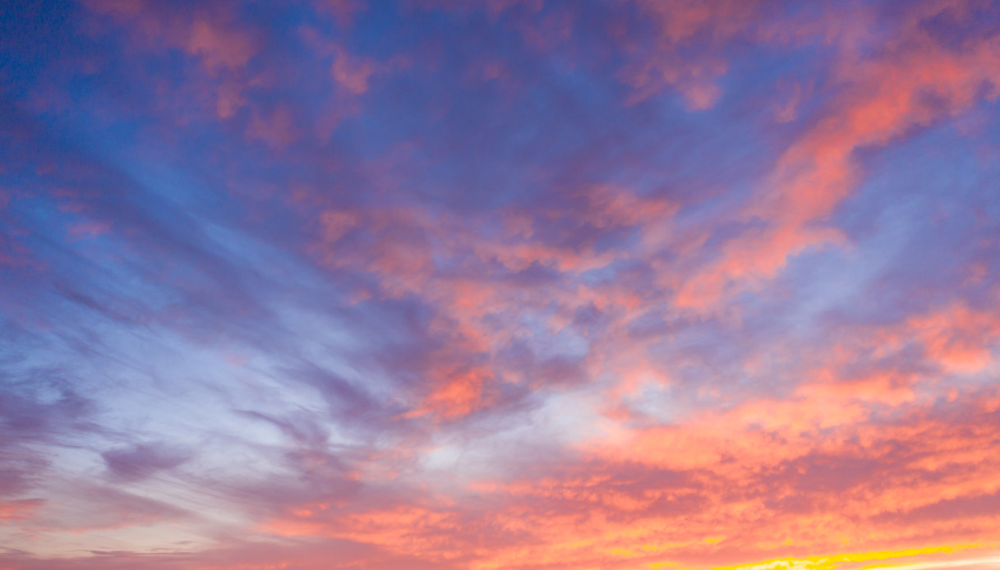

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


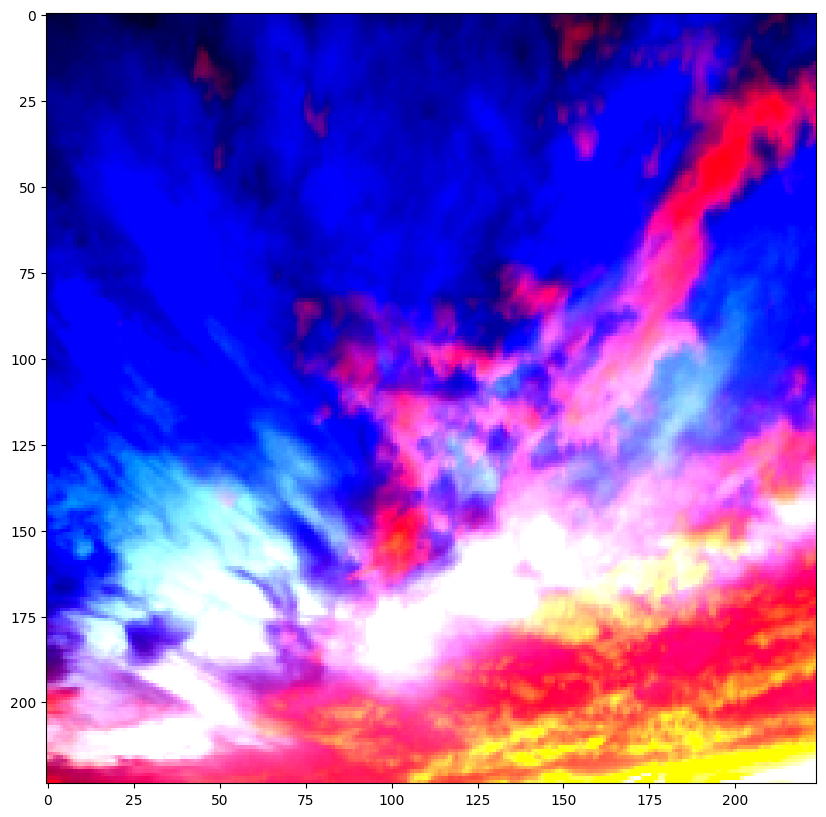


Prediction: 0.8735222220420837


In [70]:
import urllib
from PIL import Image
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

url = "https://media.cnn.com/api/v1/images/stellar/prod/220914082907-01-mosquito-fire-0913.jpg?c=16x9&q=h_720,w_1280,c_fill/f_webp"
url = "https://wips.plug.it/cips/virgilio.sapere.it/cms/2021/12/cielo-rosso-la-mattina-la-pioggia-e-vicina.jpg"
filename = "test.jpg"

try: urllib.URLopener().retrieve(url, filename)
except: urllib.request.urlretrieve(url, filename)

input_image = Image.open(filename)
display(input_image)

preprocessing = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(), 
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

input_tensor = preprocessing(input_image)

# display the tensor as an image
plt.figure(figsize=(10,10))
plt.imshow(input_tensor.permute(1, 2, 0))
plt.show()

input_batch = input_tensor.unsqueeze(0) # create a mini-batch as expected by the model
with torch.no_grad():
  model.eval()
  pred = output_activation(model(input_batch.to(device))).cpu().numpy().item()
print("\nPrediction:", pred)